In [1]:
import numpy as np
import pandas as pd
import sklearn as sk
import matplotlib.pyplot as plt

In [2]:
game_csv = pd.read_csv('./data/Training_dataset_Original.csv',na_values=["NA", "na", "missing"])
gameDf = pd.DataFrame(game_csv)

dataDict = pd.read_csv('./data/Data_Dictionary.csv',na_values="NA")

In [3]:
print(gameDf.shape)
print(dataDict.shape)

(80000, 49)
(49, 2)


In [4]:
dic = dict(zip(dataDict.values[:, 1], dataDict.values[:, 0]))

In [5]:
dic['Average tenure of active revolving credit cards (in days)']

'mvar25'

In [6]:
gameDf.keys()

Index(['application_key', 'mvar1', 'mvar2', 'mvar3', 'mvar4', 'mvar5', 'mvar6',
       'mvar7', 'mvar8', 'mvar9', 'mvar10', 'mvar11', 'mvar12', 'mvar13',
       'mvar14', 'mvar15', 'mvar16', 'mvar17', 'mvar18', 'mvar19', 'mvar20',
       'mvar21', 'mvar22', 'mvar23', 'mvar24', 'mvar25', 'mvar26', 'mvar27',
       'mvar28', 'mvar29', 'mvar30', 'mvar31', 'mvar32', 'mvar33', 'mvar34',
       'mvar35', 'mvar36', 'mvar37', 'mvar38', 'mvar39', 'mvar40', 'mvar41',
       'mvar42', 'mvar43', 'mvar44', 'mvar45', 'mvar46', 'mvar47',
       'default_ind'],
      dtype='object')

In [7]:
#remove ID column
del gameDf[dic['Application ID (primary key)']]
del dic['Application ID (primary key)']

In [8]:
#Seperate target variable y (Default or not)
#y= gameDf.pop(dic['Customer spending capacity. 0 = No data available'])

In [9]:
gameDf.keys()

Index(['mvar1', 'mvar2', 'mvar3', 'mvar4', 'mvar5', 'mvar6', 'mvar7', 'mvar8',
       'mvar9', 'mvar10', 'mvar11', 'mvar12', 'mvar13', 'mvar14', 'mvar15',
       'mvar16', 'mvar17', 'mvar18', 'mvar19', 'mvar20', 'mvar21', 'mvar22',
       'mvar23', 'mvar24', 'mvar25', 'mvar26', 'mvar27', 'mvar28', 'mvar29',
       'mvar30', 'mvar31', 'mvar32', 'mvar33', 'mvar34', 'mvar35', 'mvar36',
       'mvar37', 'mvar38', 'mvar39', 'mvar40', 'mvar41', 'mvar42', 'mvar43',
       'mvar44', 'mvar45', 'mvar46', 'mvar47', 'default_ind'],
      dtype='object')

In [10]:
len(gameDf.keys())

48

In [11]:
features = list(dic.keys())

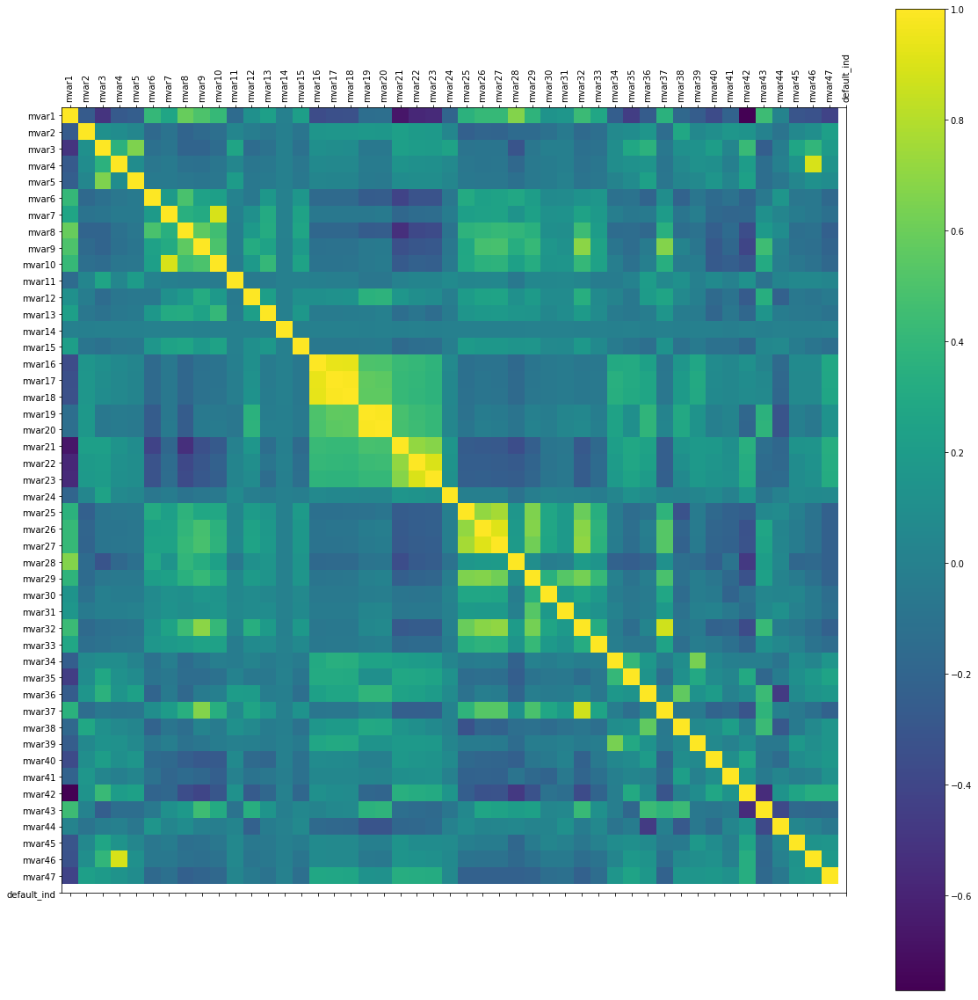

In [157]:
#Correlation plots
#gameDf.corr()
plt.figure(figsize=(20,20))
plt.matshow(gameDf.corr(), fignum=1)
plt.xticks(range(len(gameDf.columns)), gameDf.columns, rotation="vertical")
plt.yticks(range(len(gameDf.columns)), gameDf.columns)
plt.colorbar()
plt.show()

In [13]:
gameDf.corr()

,mvar1,mvar2,mvar3,mvar4,mvar5,mvar6,mvar7,mvar8,mvar9,mvar10,...,mvar38,mvar39,mvar40,mvar41,mvar42,mvar43,mvar44,mvar45,mvar46,default_ind
mvar1,1.000000,-0.265793,-0.502089,-0.268229,-0.240259,0.405196,0.267627,0.588904,0.506039,0.415873,...,-0.174035,-0.250907,-0.363777,-0.208557,-0.771688,0.440592,0.021616,-0.307051,-0.321960,-0.417302
mvar2,-0.265793,1.000000,0.119156,0.086873,0.039322,-0.168128,-0.096857,-0.203014,-0.158317,-0.122271,...,0.285102,0.053952,0.100970,0.159704,0.137295,0.014375,-0.089405,0.056462,0.100936,0.227953
mvar3,-0.502089,0.119156,1.000000,0.368939,0.658109,-0.117079,-0.084982,-0.202675,-0.200606,-0.146626,...,0.114511,0.128314,0.213647,0.033008,0.432163,-0.245018,-0.018925,0.267140,0.392322,0.194814
mvar4,-0.268229,0.086873,0.368939,1.000000,0.091933,-0.067449,-0.045899,-0.111535,-0.118342,-0.074592,...,0.064709,0.123631,0.107712,-0.003572,0.209824,-0.130205,0.001213,0.135537,0.892075,0.141313
mvar5,-0.240259,0.039322,0.658109,0.091933,1.000000,-0.040019,-0.048359,-0.072506,-0.086020,-0.072473,...,0.034388,0.058855,0.155475,0.036596,0.235934,-0.132246,-0.067406,0.041785,0.117824,0.088442
mvar6,0.405196,-0.168128,-0.117079,-0.067449,-0.040019,1.000000,0.192671,0.490946,0.243674,0.230486,...,-0.205386,-0.076016,-0.154404,-0.102246,-0.201271,-0.054085,0.152521,-0.072196,-0.062485,-0.163856
mvar7,0.267627,-0.096857,-0.084982,-0.045899,-0.048359,0.192671,1.000000,0.345828,0.308526,0.891959,...,-0.080942,-0.014592,-0.165445,-0.187826,-0.181921,0.115480,0.036661,-0.027935,-0.062547,-0.114585
mvar8,0.588904,-0.203014,-0.202675,-0.111535,-0.072506,0.490946,0.345828,1.000000,0.560884,0.455136,...,-0.129942,-0.103041,-0.235222,-0.154867,-0.356205,0.186343,0.089321,-0.121916,-0.109787,-0.228546
mvar9,0.506039,-0.158317,-0.200606,-0.118342,-0.086020,0.243674,0.308526,0.560884,1.000000,0.498627,...,0.022249,-0.074108,-0.278261,-0.179703,-0.400814,0.451355,0.001032,-0.112344,-0.127856,-0.198013
mvar10,0.415873,-0.122271,-0.146626,-0.074592,-0.072473,0.230486,0.891959,0.455136,0.498627,1.000000,...,-0.035861,-0.029197,-0.268487,-0.232596,-0.300776,0.312105,-0.011159,-0.069100,-0.102893,-0.172239


In [14]:
v1 = 17
v2 = 19
gameDf.corr().iloc[v1-1,v2-1]

0.56590499267508465

/home/ekka/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: pandas.scatter_matrix is deprecated. Use pandas.plotting.scatter_matrix instead
  """Entry point for launching an IPython kernel.


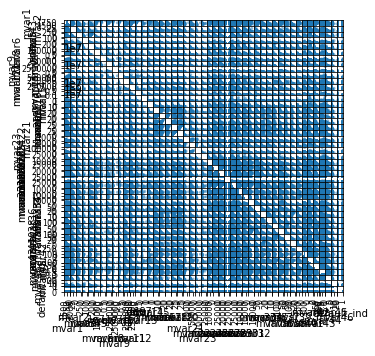

In [21]:
# pd.scatter_matrix(gameDf, figsize=(5,5))
# plt.show()

In [ ]:
#Heavy missing values

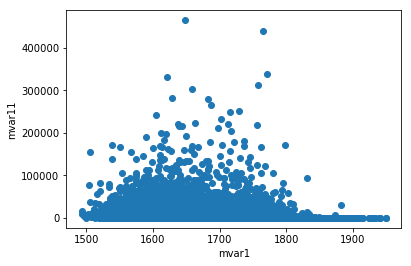

Correlation: -0.151719812235


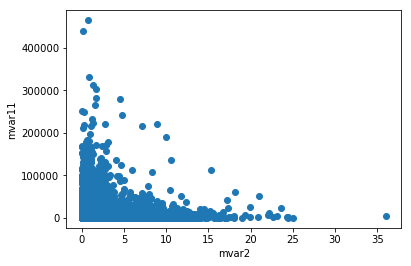

Correlation: 0.0371078658762


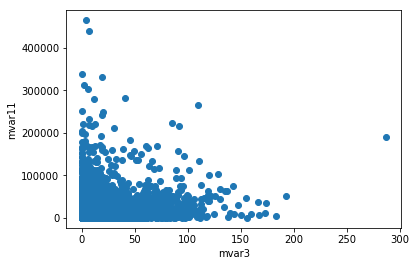

Correlation: 0.263732411404


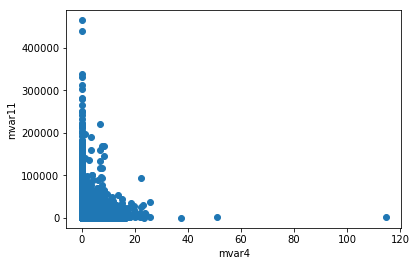

Correlation: 0.0427709162113


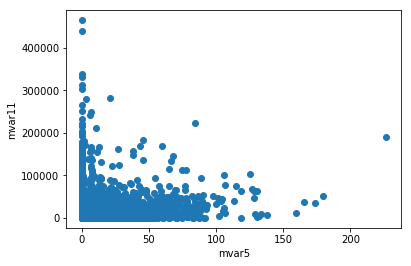

Correlation: 0.19887516952


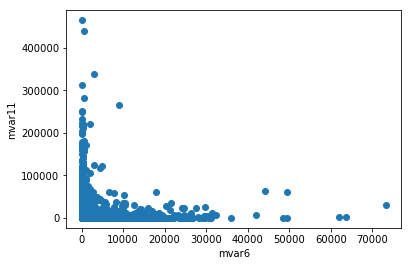

Correlation: 0.0128168294123


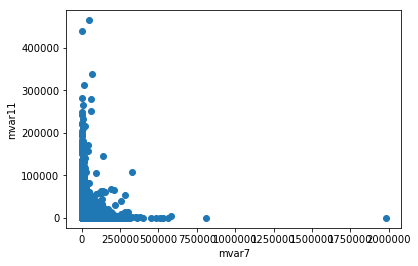

Correlation: -0.00526372123538


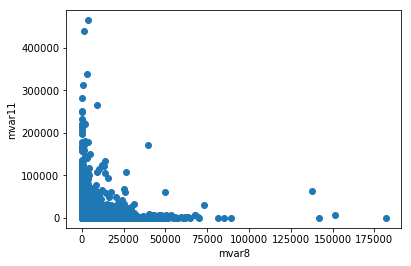

Correlation: -0.0177622946522


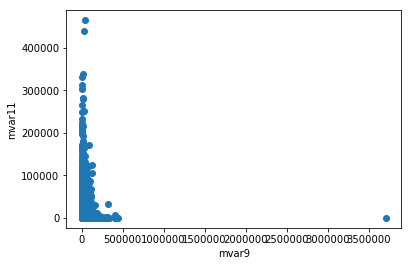

Correlation: -0.0201900972974


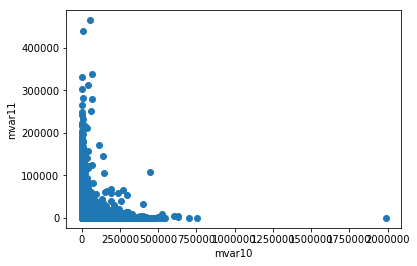

Correlation: -0.0352757474107


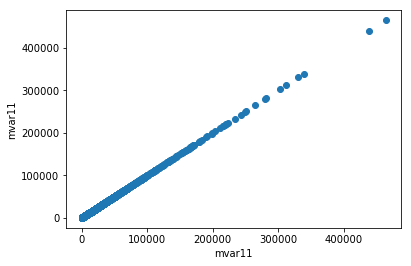

Correlation: 1.0


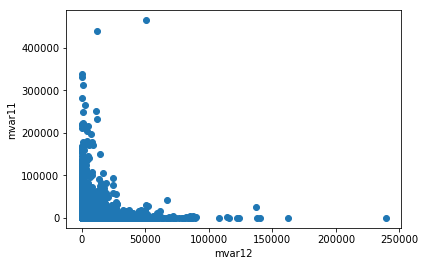

Correlation: -0.0390026475444


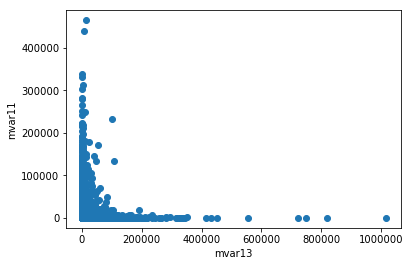

Correlation: -0.0351274924347


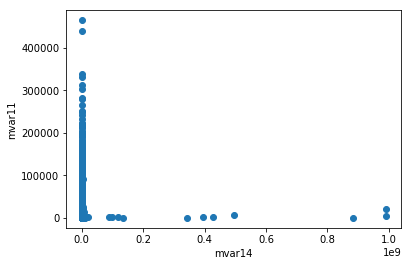

Correlation: 0.00120761693719


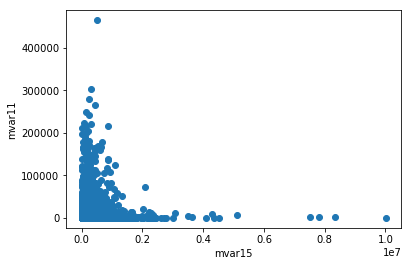

Correlation: -0.00300392502457


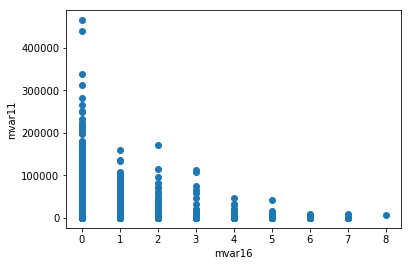

Correlation: -0.00706353233311


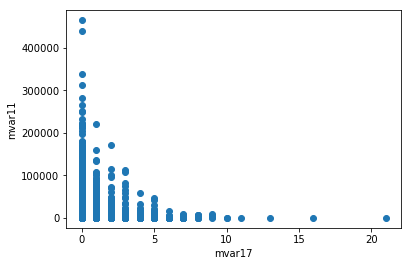

Correlation: -0.0140860906317


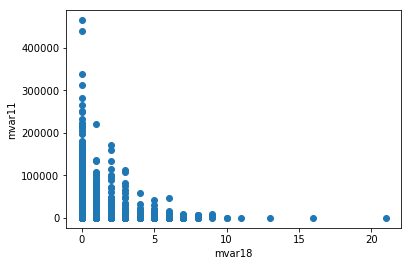

Correlation: -0.012528508271


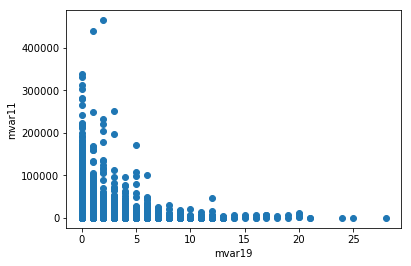

Correlation: -0.0696191971088


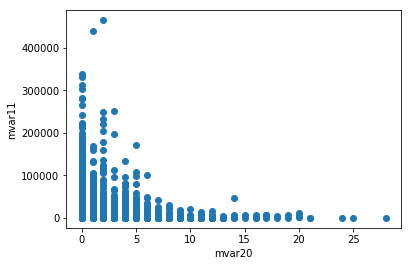

Correlation: -0.0701896348481


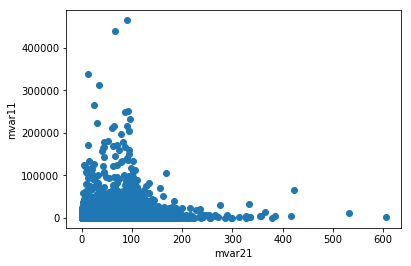

Correlation: 0.00959352443225


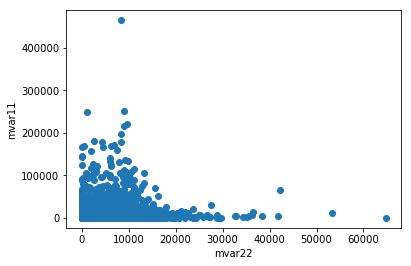

Correlation: 0.0277707414243


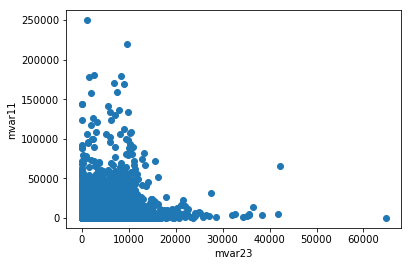

Correlation: 0.0291171556085


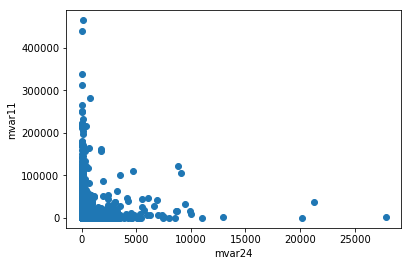

Correlation: 0.0743284068116


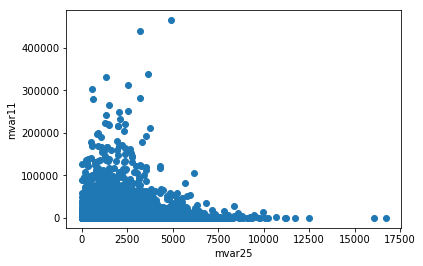

Correlation: 0.0313712099307


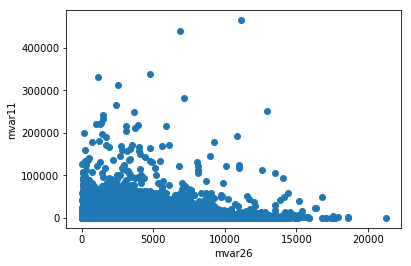

Correlation: 0.0423987853205


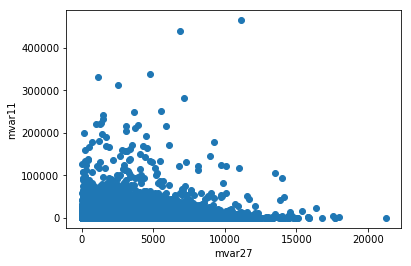

Correlation: 0.0479629327308


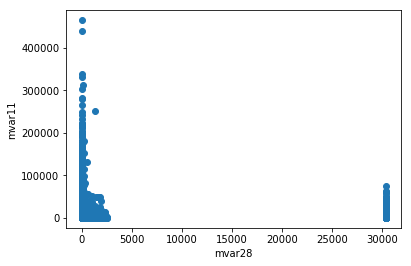

Correlation: -0.0632726491995


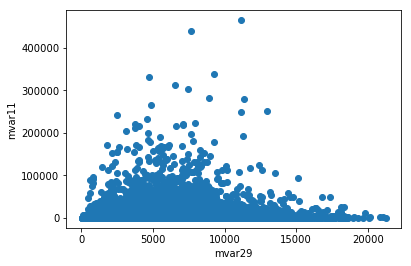

Correlation: 0.0508729661845


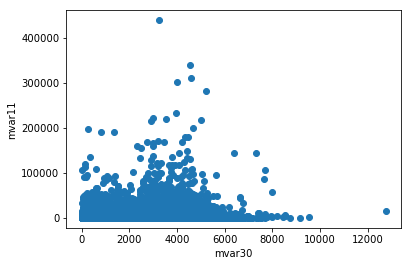

Correlation: 0.050611291771


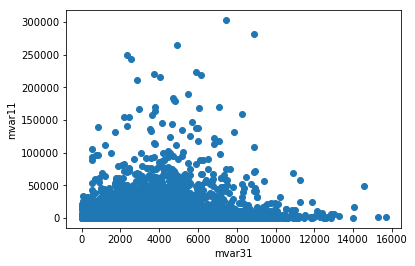

Correlation: 0.0586999729014


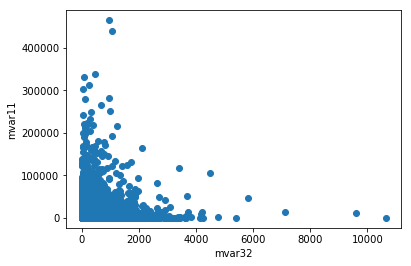

Correlation: 0.0320346687958


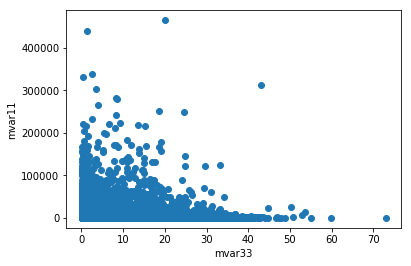

Correlation: -0.027232186872


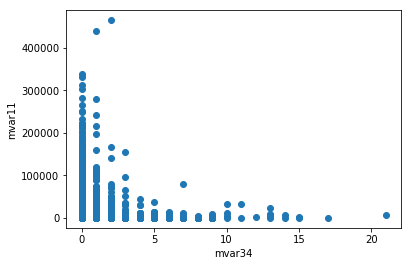

Correlation: -0.0258619982904


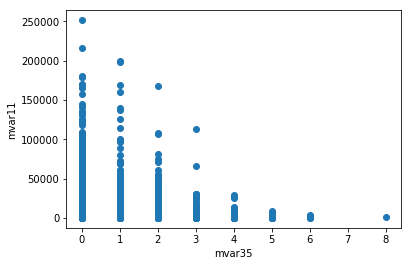

Correlation: 0.0161442649976


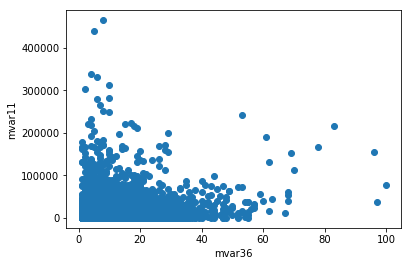

Correlation: 0.205632235849


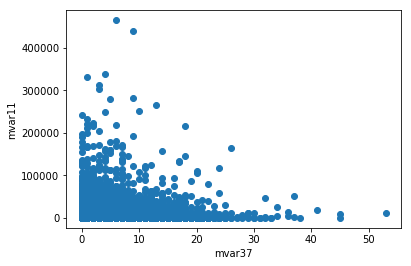

Correlation: 0.0628383725331


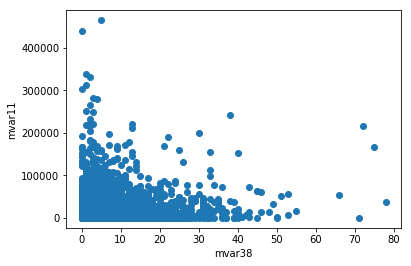

Correlation: 0.120647081947


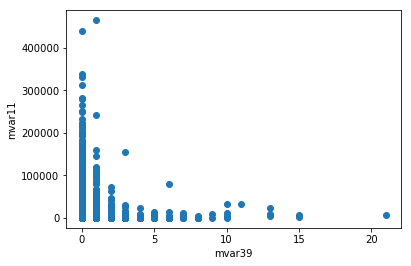

Correlation: 0.000881041425802


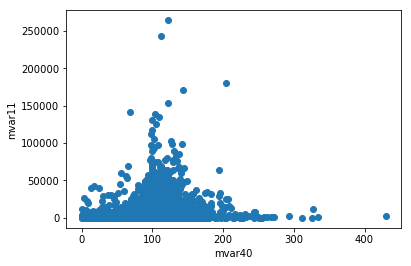

Correlation: 0.0684171823124


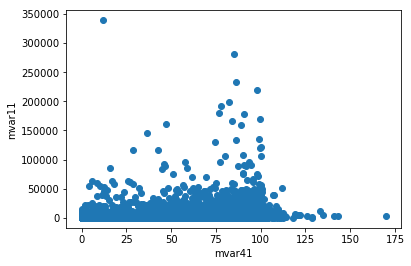

Correlation: 0.0036136343787


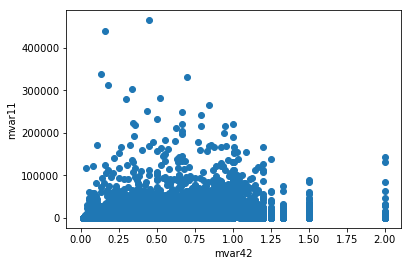

Correlation: 0.124873809571


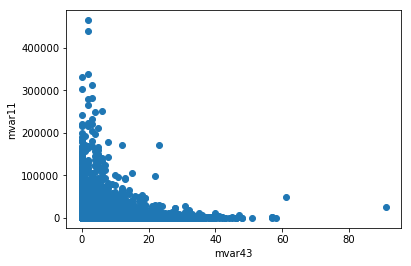

Correlation: -0.0951868942165


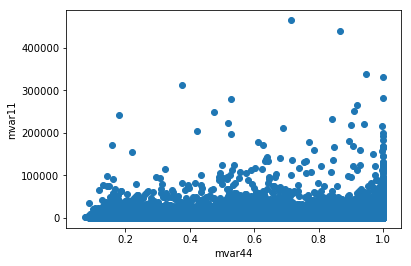

Correlation: 0.0266817094165


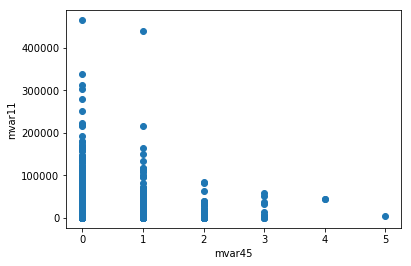

Correlation: 0.0543854098686


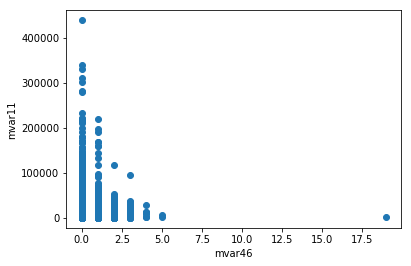

Correlation: 0.0569444945248


In [25]:
v1 = 11
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

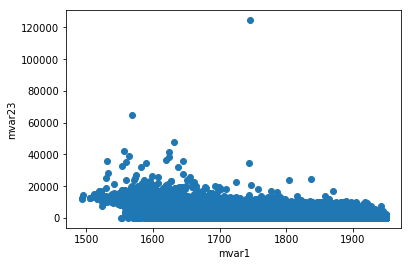

Correlation: -0.560480781667


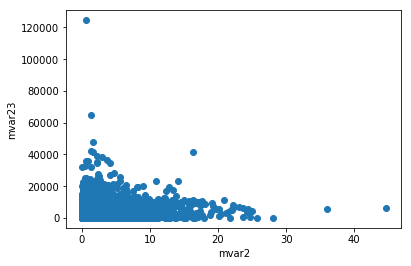

Correlation: 0.188093021553


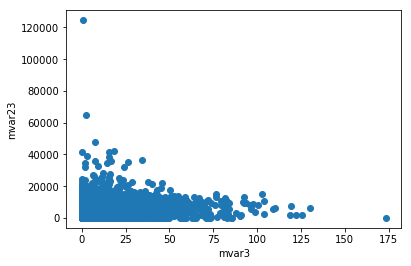

Correlation: 0.197830476716


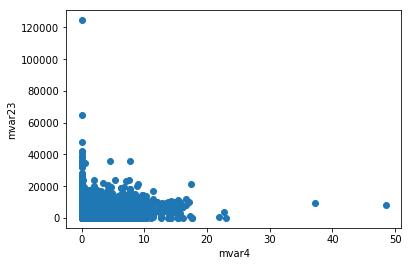

Correlation: 0.108777262788


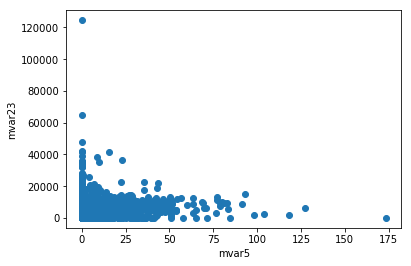

Correlation: 0.0934503143278


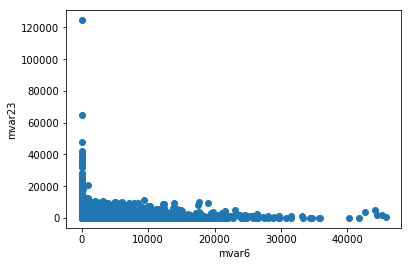

Correlation: -0.316465586945


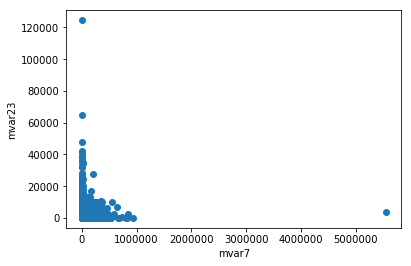

Correlation: -0.135663884272


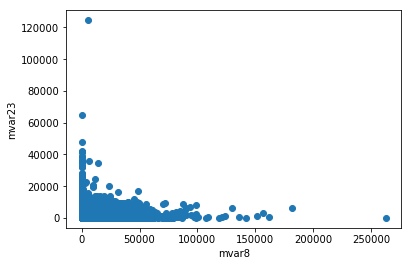

Correlation: -0.367580158813


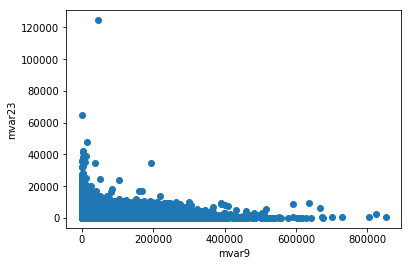

Correlation: -0.286800621703


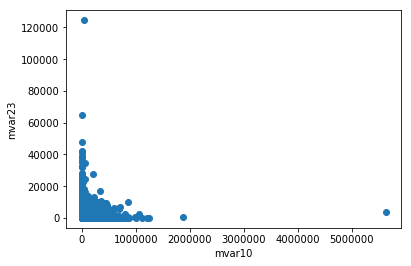

Correlation: -0.231970797878


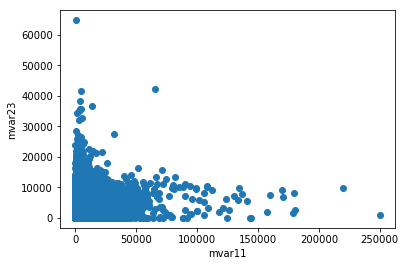

Correlation: 0.0291171556085


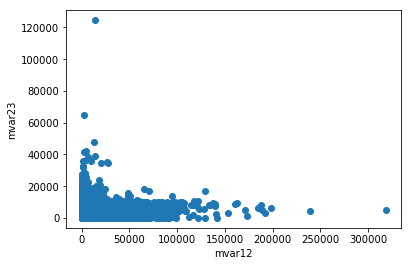

Correlation: 0.0799639555183


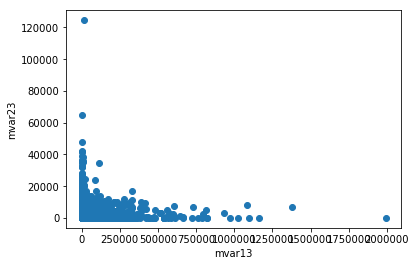

Correlation: -0.140553977068


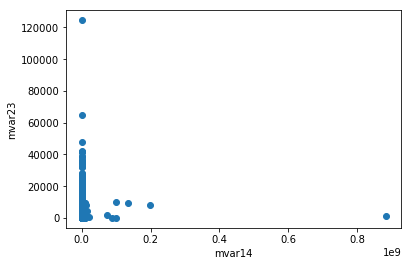

Correlation: -0.00459568480208


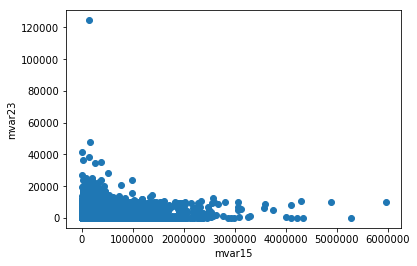

Correlation: -0.124507275059


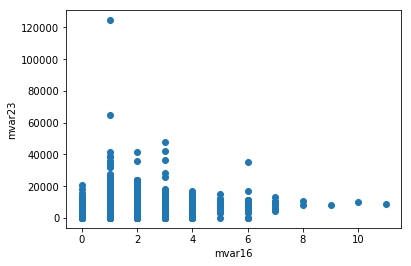

Correlation: 0.381647955524


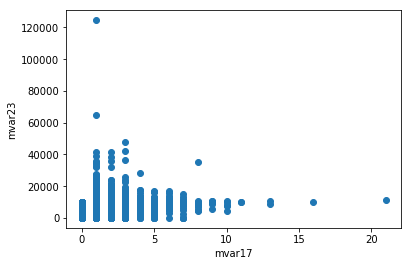

Correlation: 0.372883097247


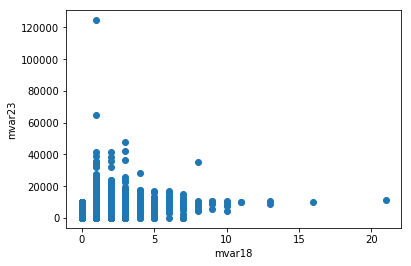

Correlation: 0.372461641226


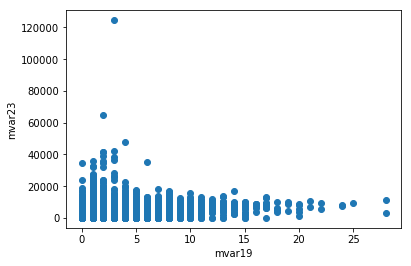

Correlation: 0.411114734306


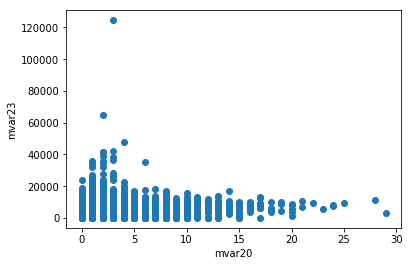

Correlation: 0.406274824012


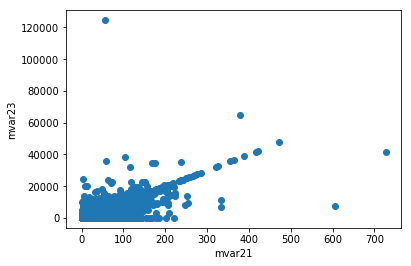

Correlation: 0.680903759621


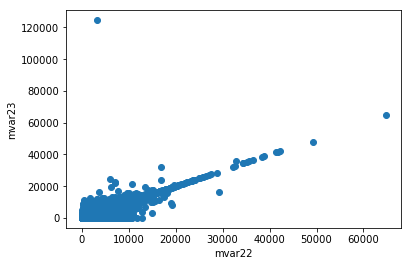

Correlation: 0.901085833972


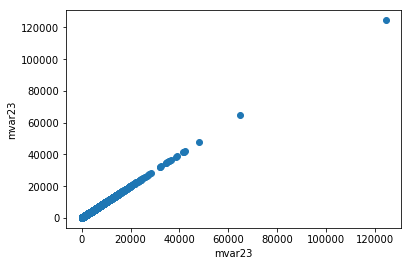

Correlation: 1.0


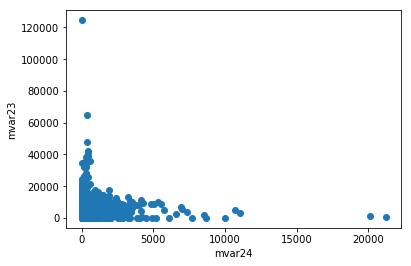

Correlation: 0.120433558618


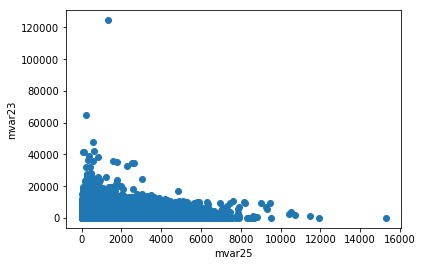

Correlation: -0.234238028658


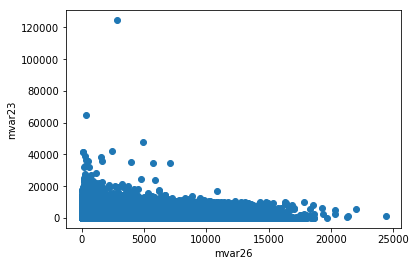

Correlation: -0.231194480343


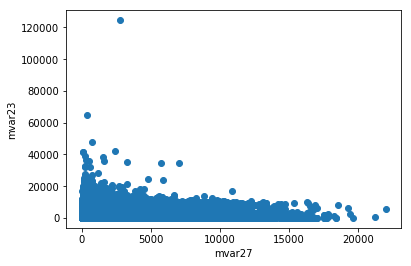

Correlation: -0.239732496812


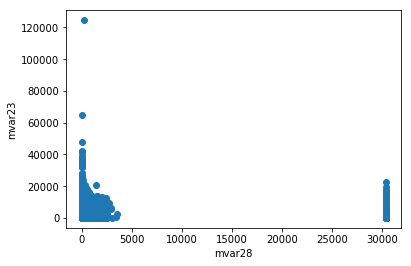

Correlation: -0.251530007359


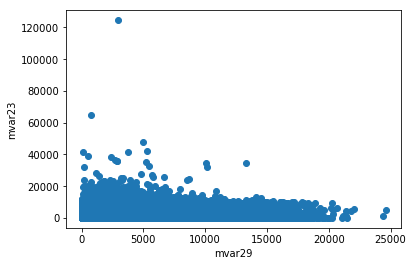

Correlation: -0.189781172241


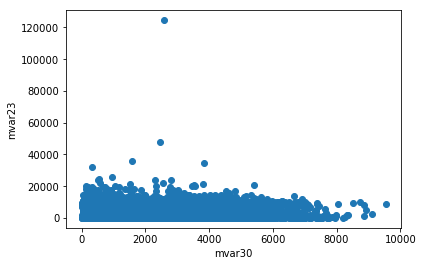

Correlation: -0.0803832677224


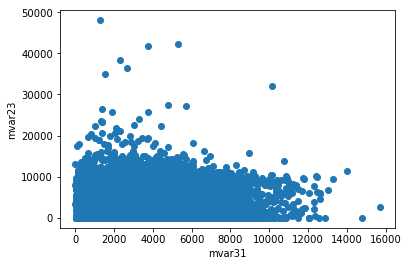

Correlation: -0.0633129752275


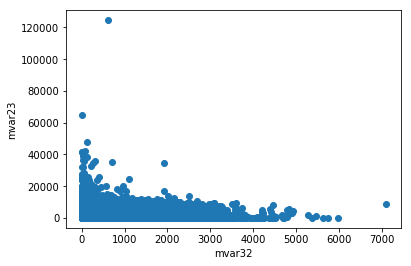

Correlation: -0.255741687283


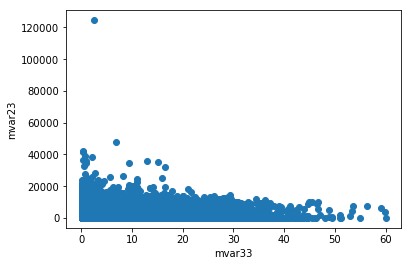

Correlation: -0.149165688988


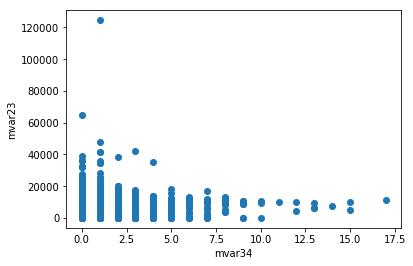

Correlation: 0.190245638172


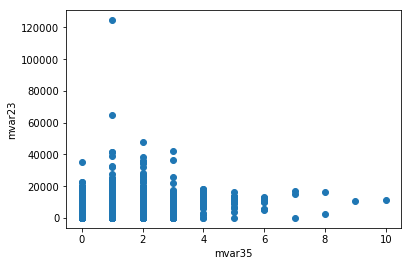

Correlation: 0.256883875501


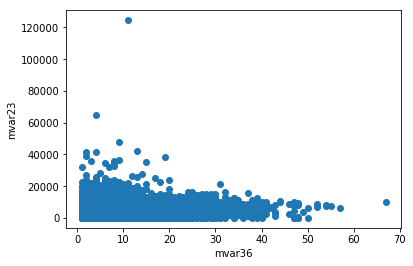

Correlation: 0.201076952436


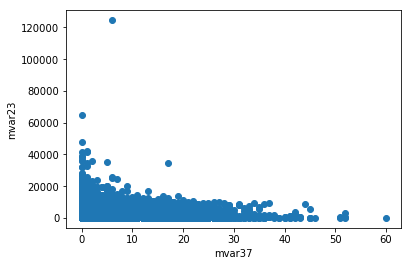

Correlation: -0.2291621271


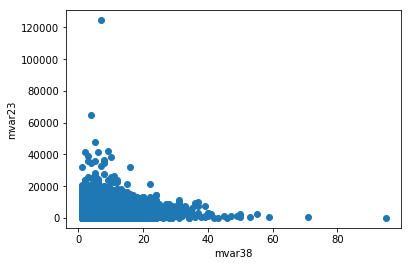

Correlation: 0.0721572999219


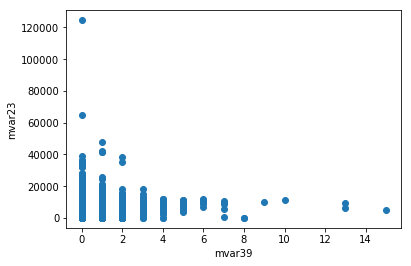

Correlation: 0.173208510025


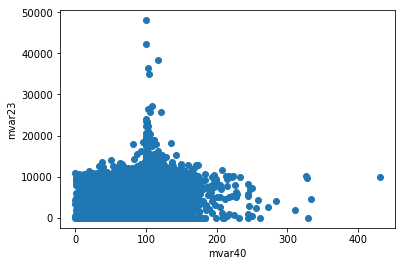

Correlation: 0.137164446283


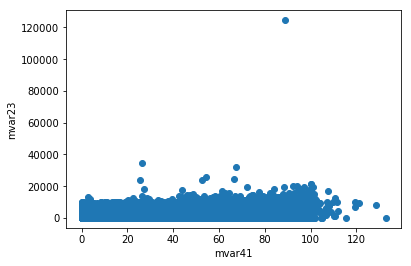

Correlation: 0.12290330604


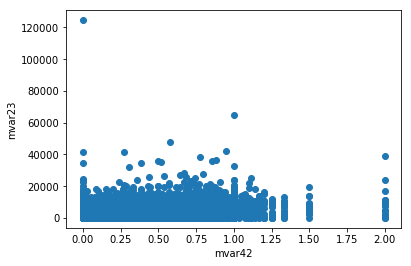

Correlation: 0.31028729679


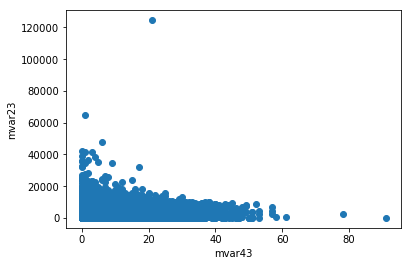

Correlation: -0.156017964577


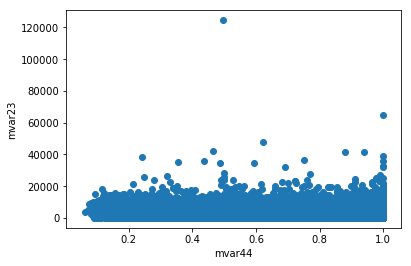

Correlation: -0.155629146072


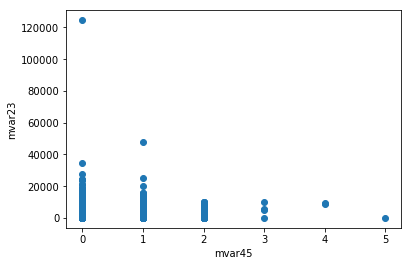

Correlation: 0.0876951786473


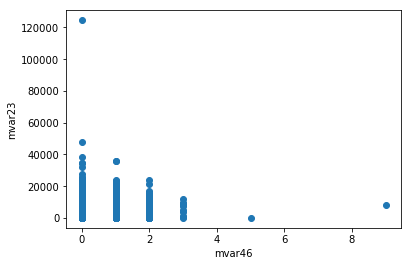

Correlation: 0.119292954912


In [26]:
v1 = 23
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

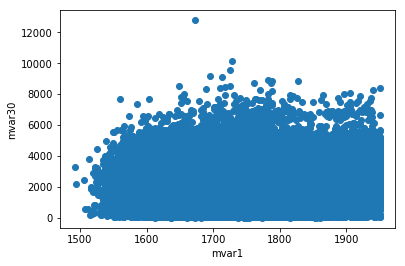

Correlation: 0.136740662438


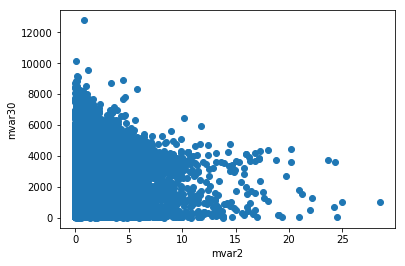

Correlation: -0.110666963905


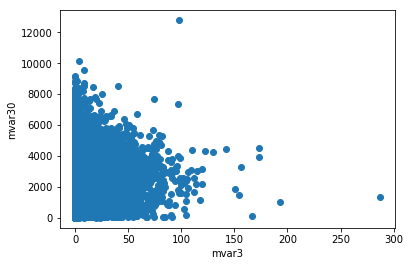

Correlation: -0.00469185358744


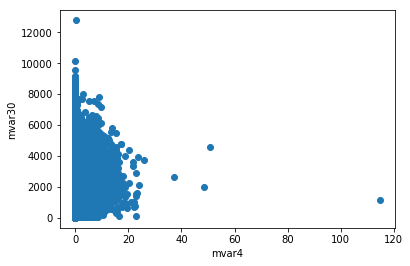

Correlation: -0.0271252787168


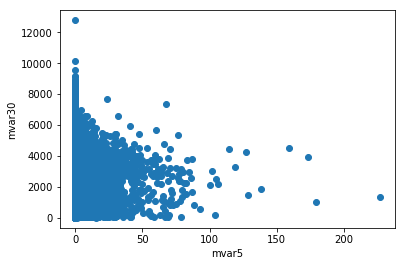

Correlation: -0.0309841627445


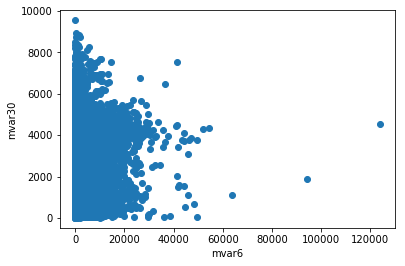

Correlation: 0.0782088482199


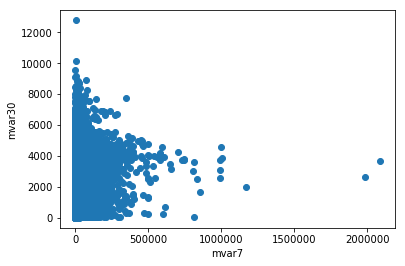

Correlation: 0.12303967019


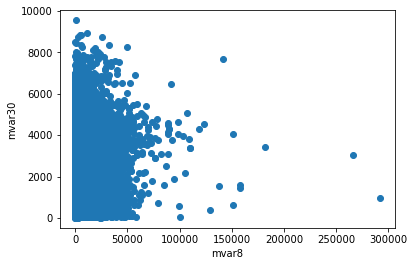

Correlation: 0.110804778422


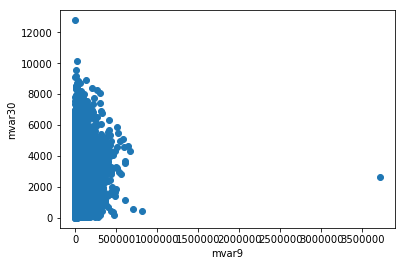

Correlation: 0.159286589736


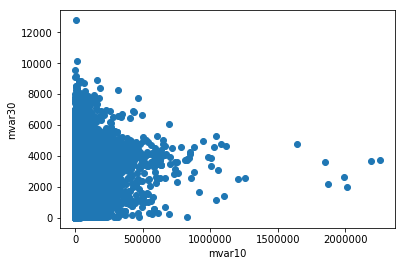

Correlation: 0.147832710167


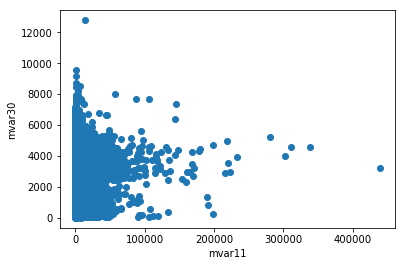

Correlation: 0.050611291771


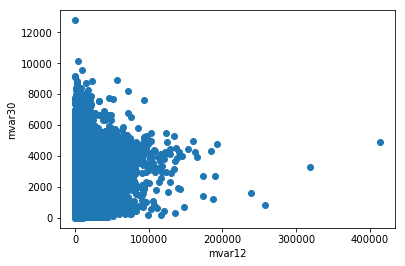

Correlation: 0.0841333260938


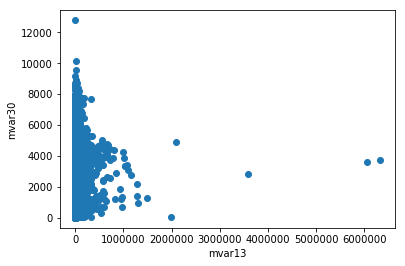

Correlation: 0.0476630036585


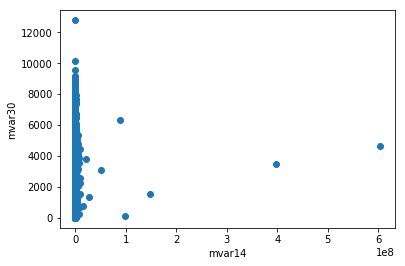

Correlation: 0.0089390863192


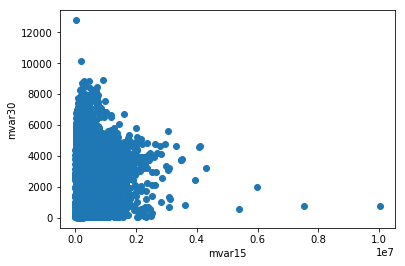

Correlation: 0.0603969566369


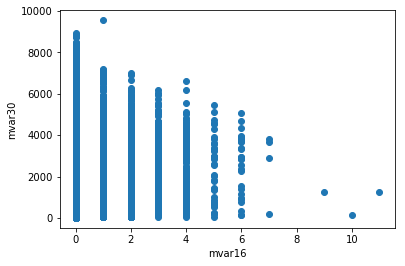

Correlation: -0.0560464656455


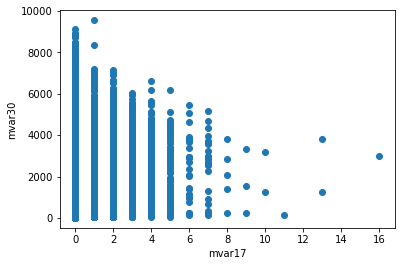

Correlation: -0.0554043758055


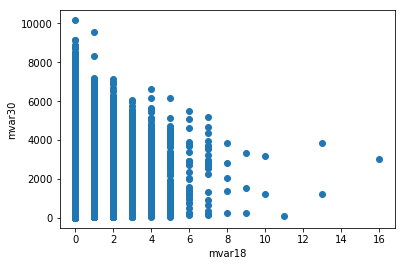

Correlation: -0.0537973384267


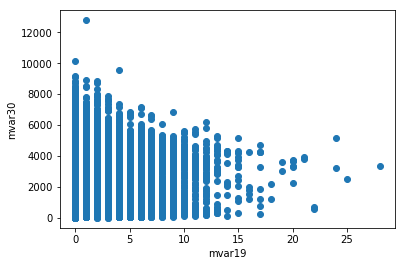

Correlation: -0.0220286894452


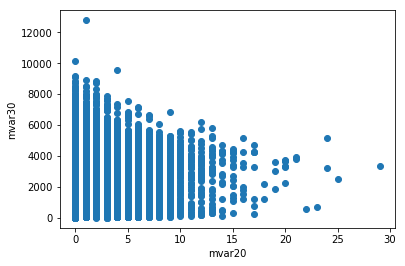

Correlation: -0.0127203313379


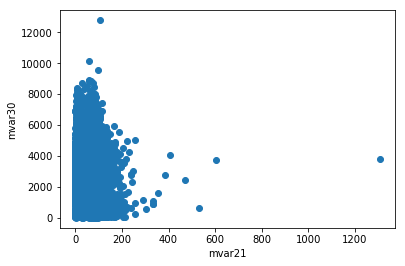

Correlation: -0.0825538583449


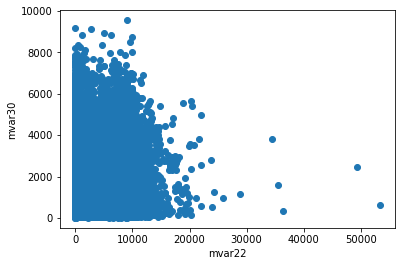

Correlation: -0.0919797915645


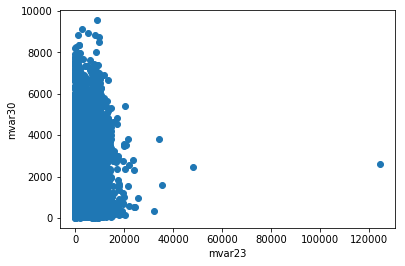

Correlation: -0.0803832677224


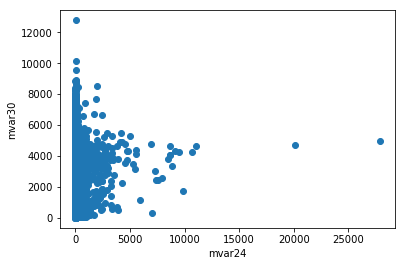

Correlation: 0.0200176968976


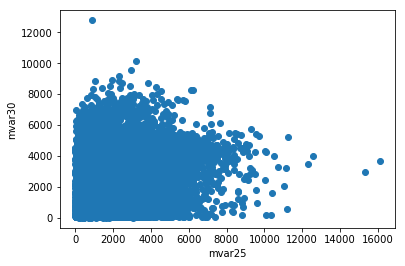

Correlation: 0.275016381442


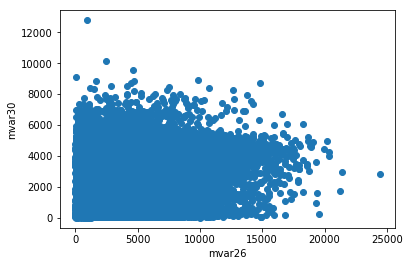

Correlation: 0.274375711971


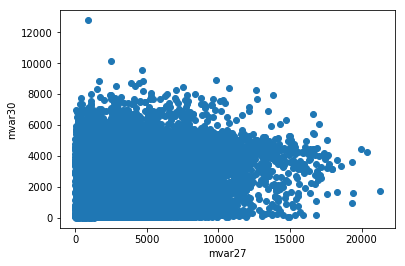

Correlation: 0.269726971018


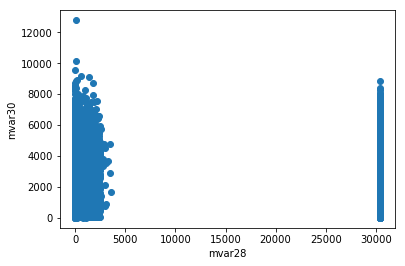

Correlation: -0.021877035588


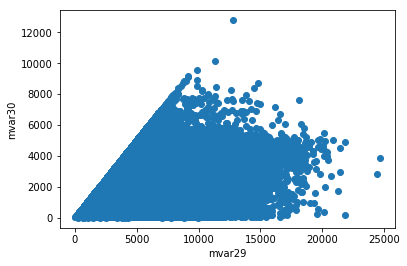

Correlation: 0.355335773702


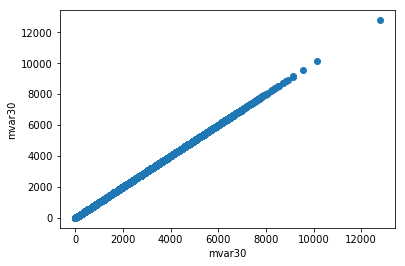

Correlation: 1.0


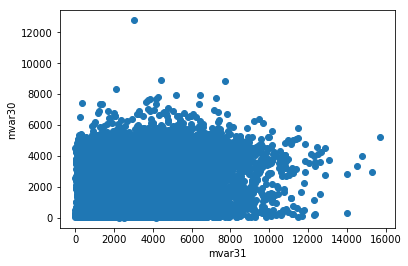

Correlation: 0.183493073195


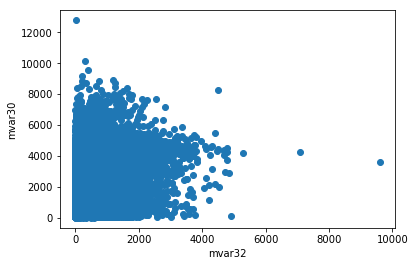

Correlation: 0.262987120127


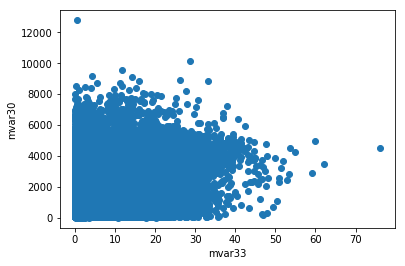

Correlation: 0.186615734944


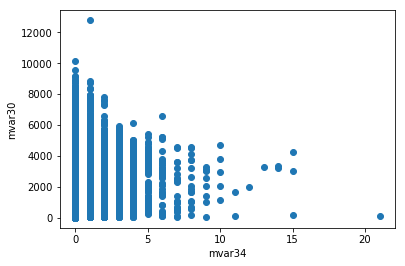

Correlation: -0.0175237557189


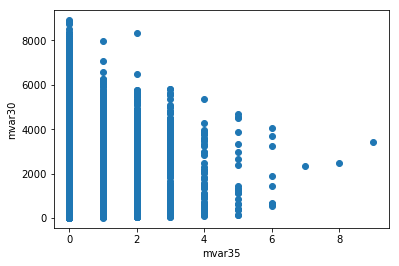

Correlation: -0.0677421392961


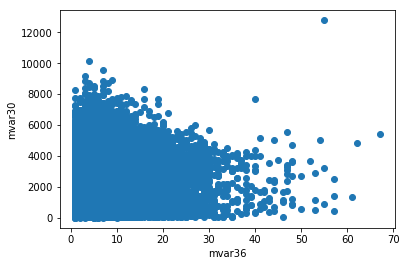

Correlation: -0.0354378754487


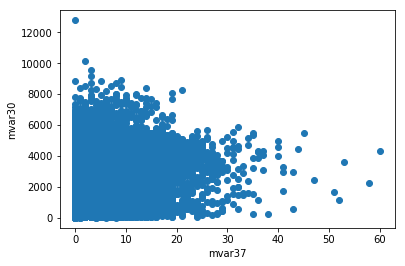

Correlation: 0.275182042525


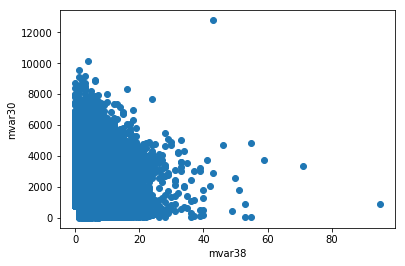

Correlation: -0.143793767008


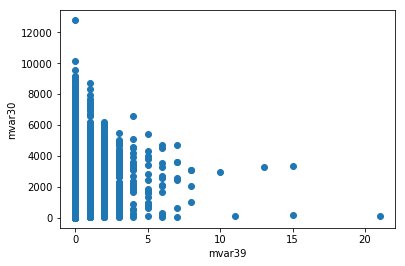

Correlation: -0.0239860383562


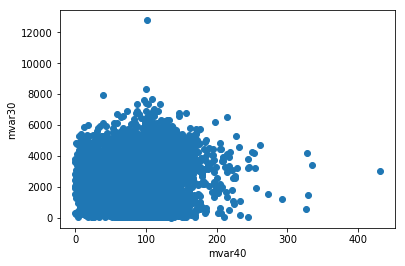

Correlation: -0.0427146741501


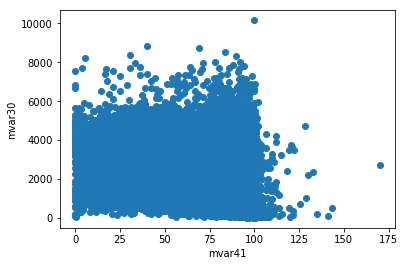

Correlation: -0.197576903018


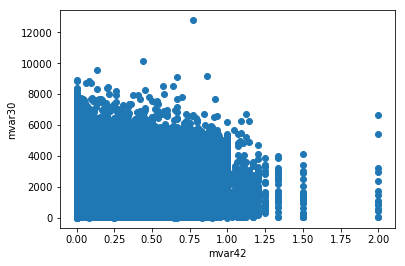

Correlation: -0.105380111268


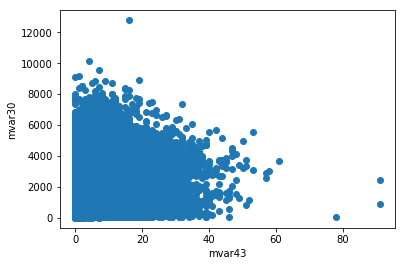

Correlation: 0.0396559801849


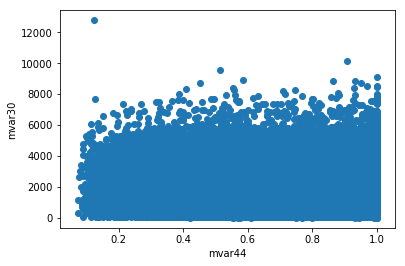

Correlation: 0.0280435300053


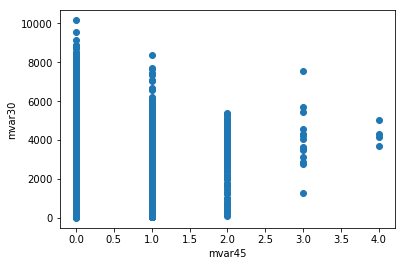

Correlation: 0.0361433461941


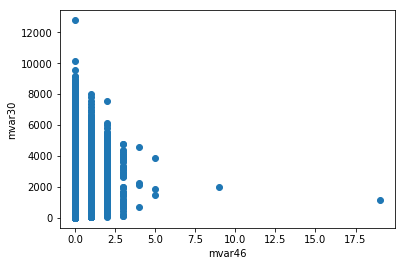

Correlation: -0.0435465867408


In [27]:
v1 = 30
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

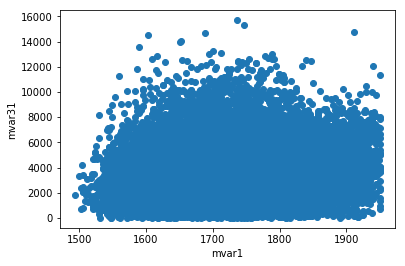

Correlation: 0.158508212911


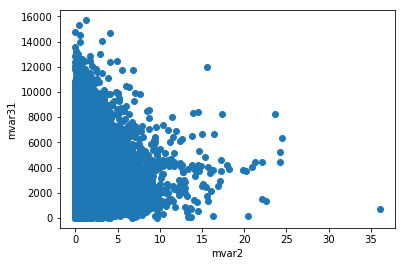

Correlation: -0.0481297599648


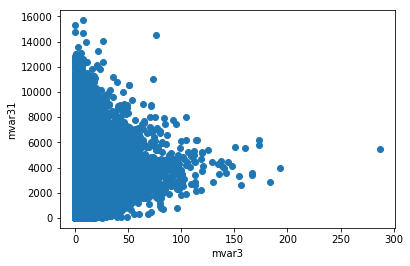

Correlation: -0.00848578466576


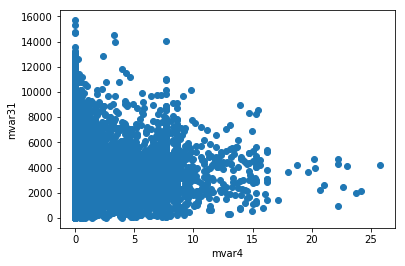

Correlation: -0.00626861235435


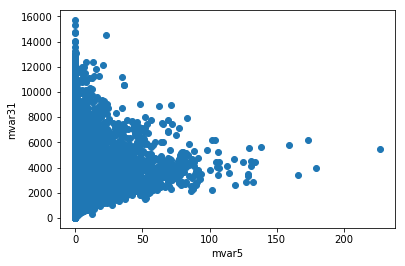

Correlation: 0.00825842659103


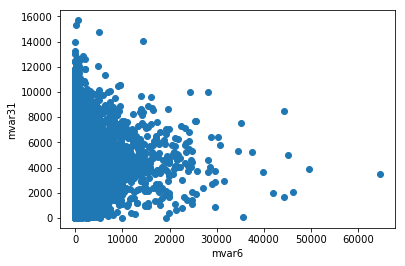

Correlation: 0.0817735833474


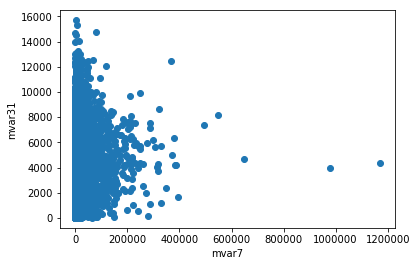

Correlation: 0.130180112711


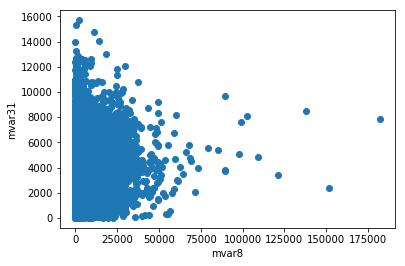

Correlation: 0.10364161572


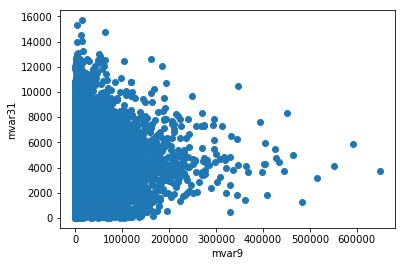

Correlation: 0.125953195699


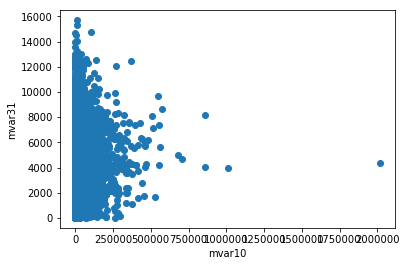

Correlation: 0.151422925494


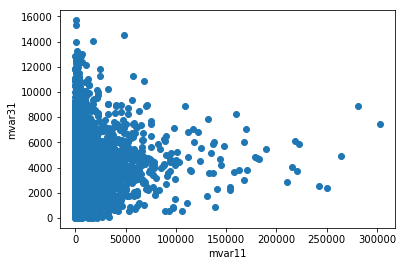

Correlation: 0.0586999729014


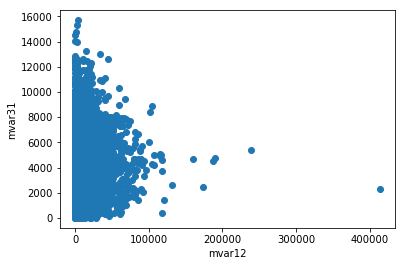

Correlation: 0.0809201437168


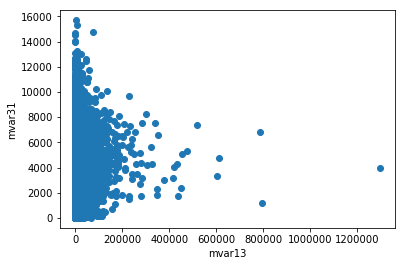

Correlation: 0.0906010825669


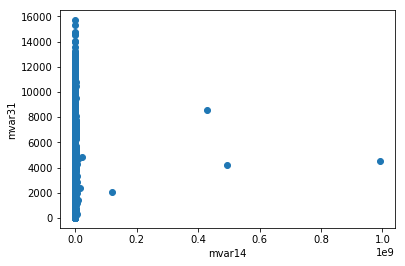

Correlation: 0.00985651420185


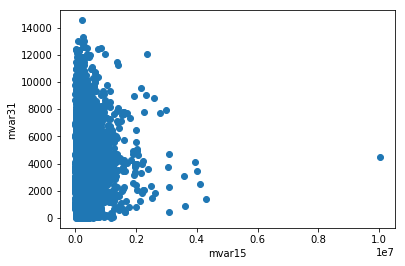

Correlation: 0.0721539874085


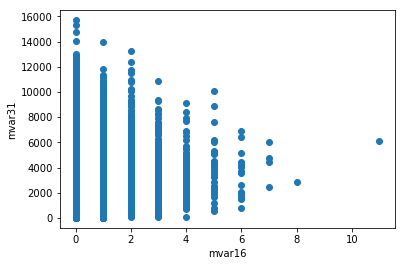

Correlation: -0.03803970936


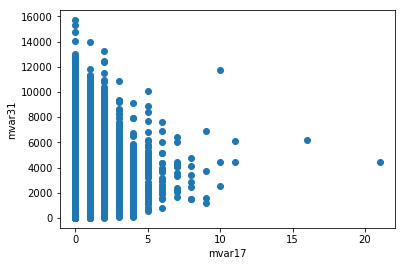

Correlation: -0.0352534208436


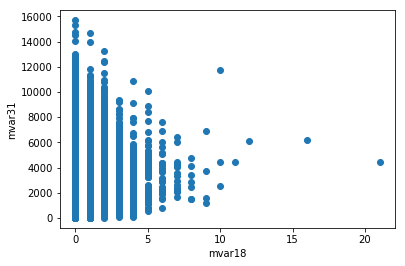

Correlation: -0.0344028626418


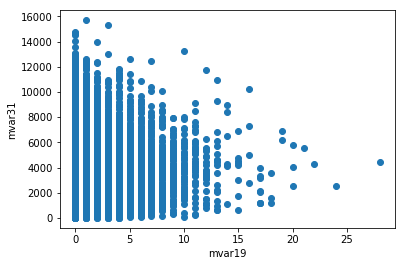

Correlation: 0.0336521147278


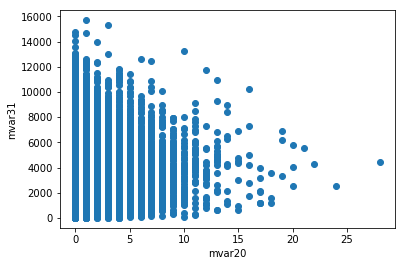

Correlation: 0.0385557138984


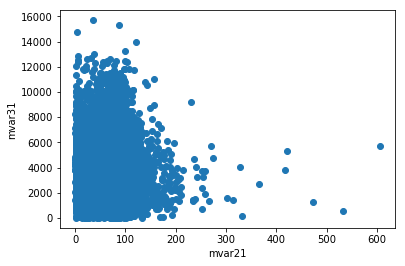

Correlation: -0.070072498027


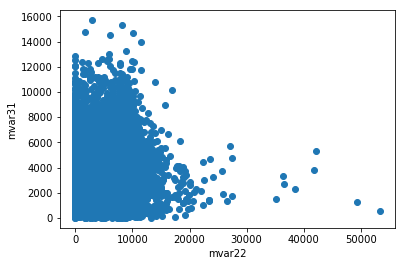

Correlation: -0.0628673964828


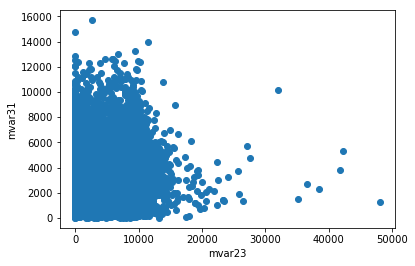

Correlation: -0.0633129752275


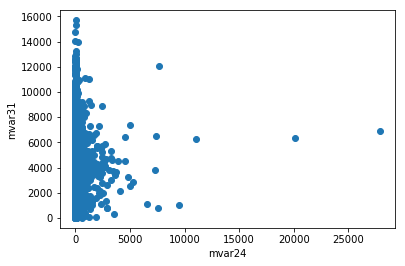

Correlation: 0.00878317511167


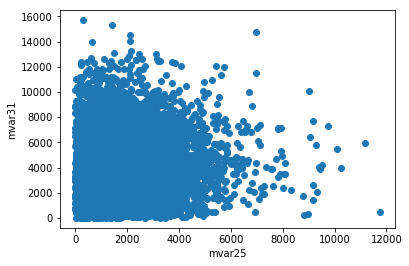

Correlation: 0.191603712522


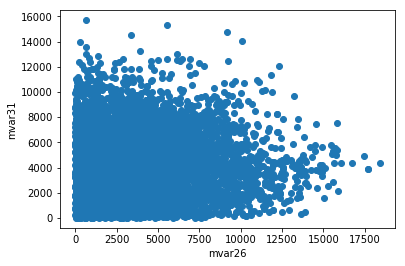

Correlation: 0.179822631562


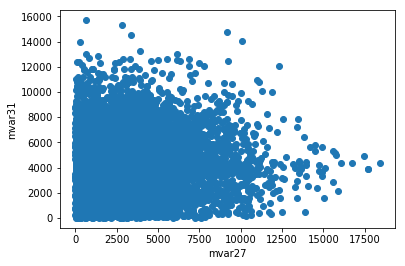

Correlation: 0.183358057041


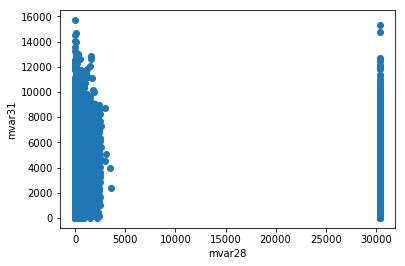

Correlation: 0.00094315622417


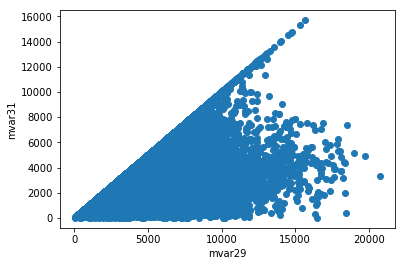

Correlation: 0.530762149363


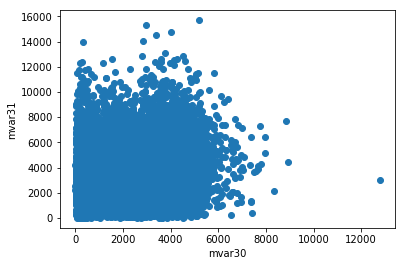

Correlation: 0.183493073195


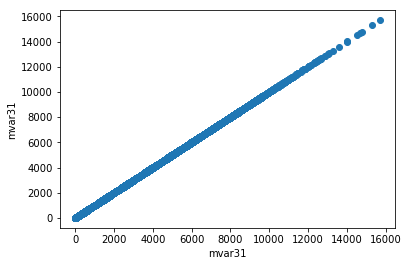

Correlation: 1.0


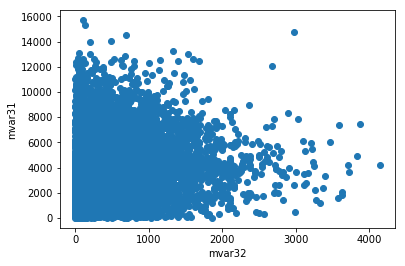

Correlation: 0.176676020317


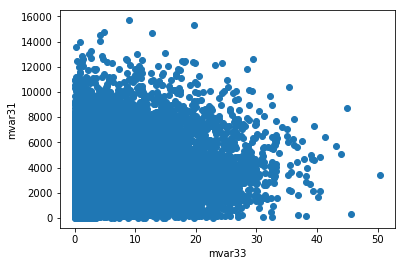

Correlation: 0.13422190839


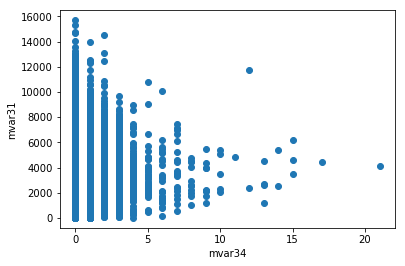

Correlation: 0.0121052445977


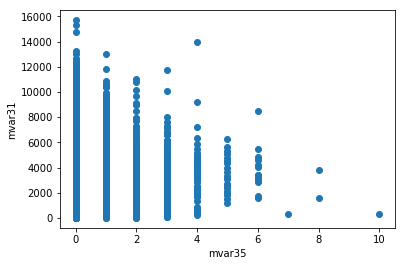

Correlation: -0.0645410828809


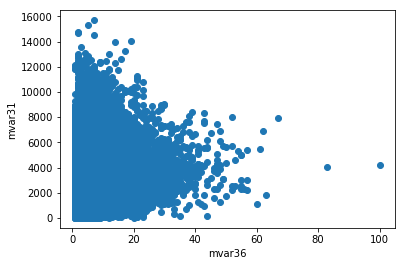

Correlation: -0.0294022645918


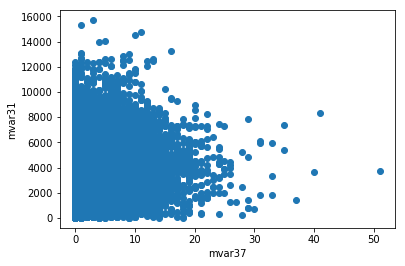

Correlation: 0.180198615839


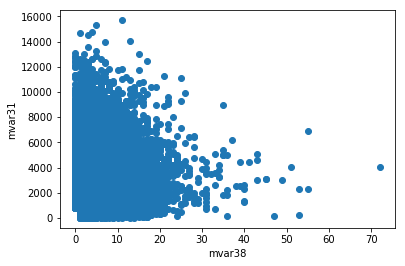

Correlation: -0.10395301567


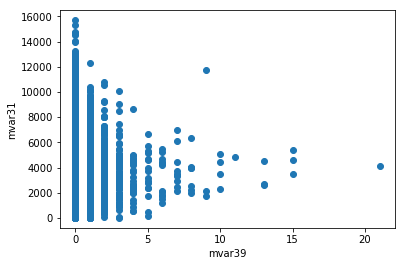

Correlation: 0.00222672398286


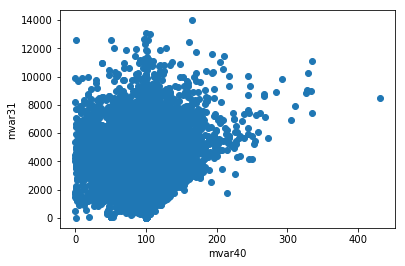

Correlation: 0.0141672790004


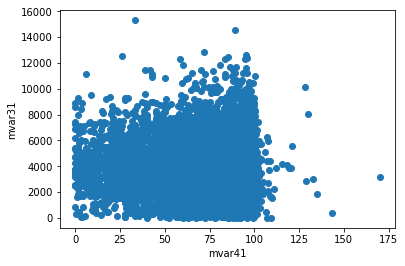

Correlation: -0.057642629398


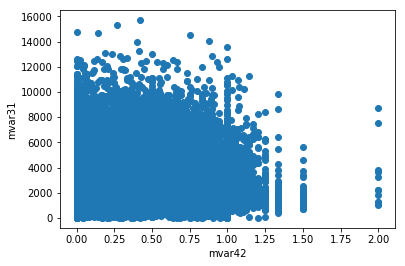

Correlation: -0.134141624856


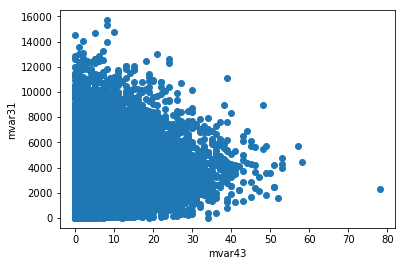

Correlation: 0.0552112147418


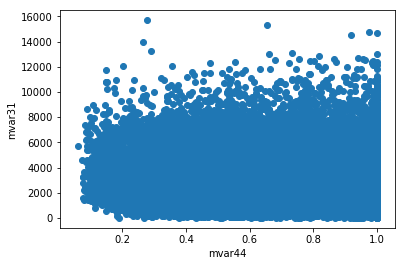

Correlation: 0.116473293709


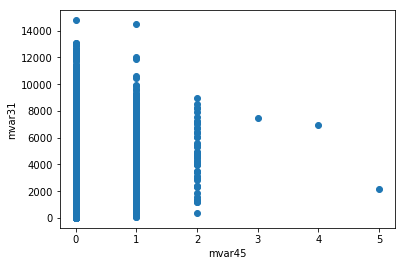

Correlation: 0.0101834730379


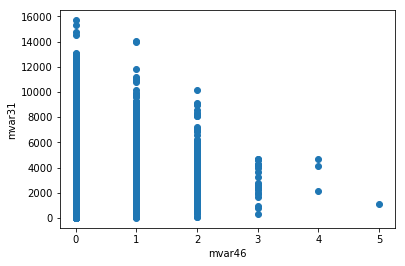

Correlation: -0.049012591099


In [28]:
v1 = 31
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

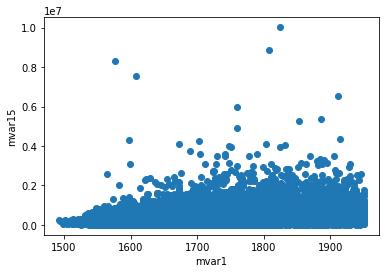

Correlation: 0.224650257535


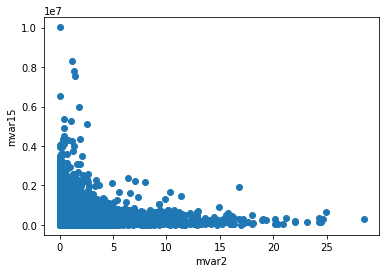

Correlation: -0.0814340383256


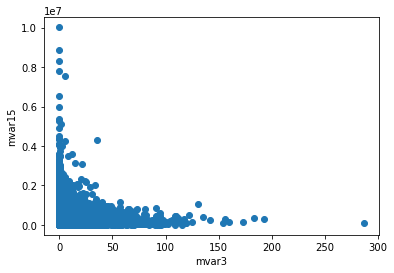

Correlation: -0.113163919939


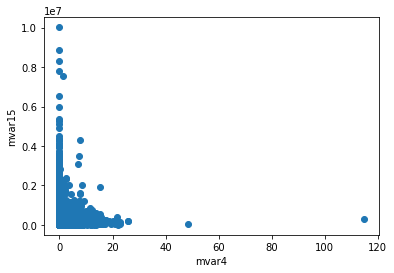

Correlation: -0.0663003443828


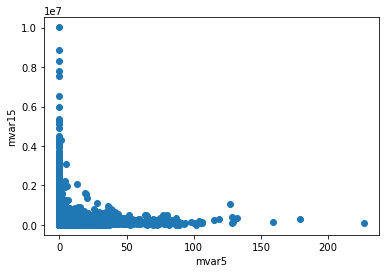

Correlation: -0.0642140117485


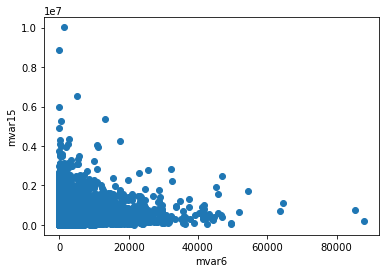

Correlation: 0.15911870242


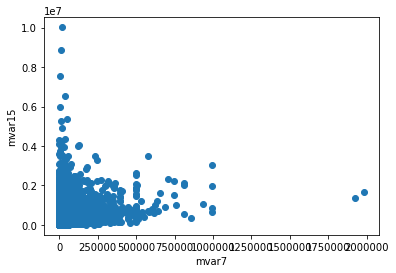

Correlation: 0.249501189741


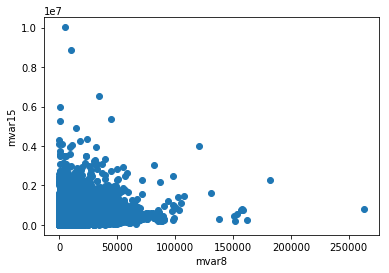

Correlation: 0.267814606909


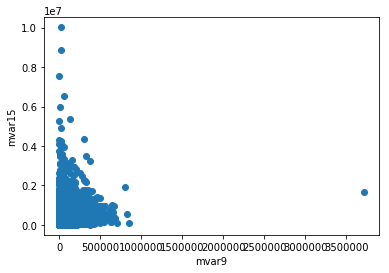

Correlation: 0.181071409355


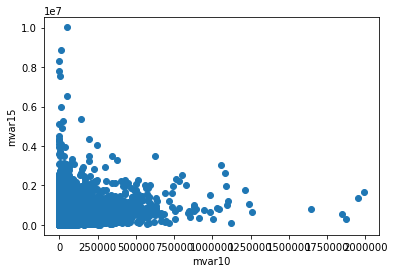

Correlation: 0.251234249429


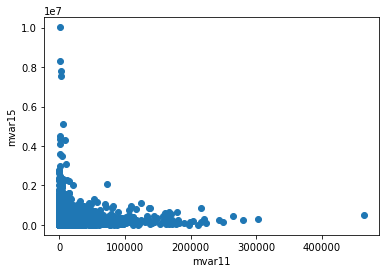

Correlation: -0.00300392502457


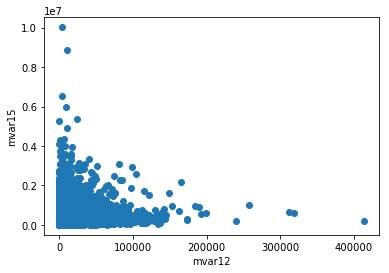

Correlation: 0.111554119093


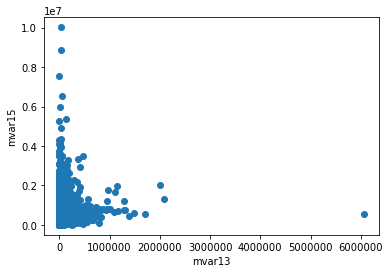

Correlation: 0.165404725234


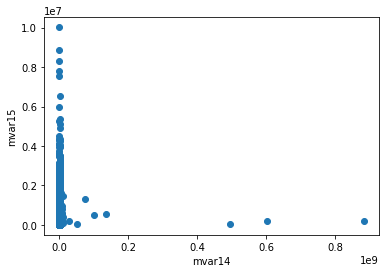

Correlation: 0.00295350973169


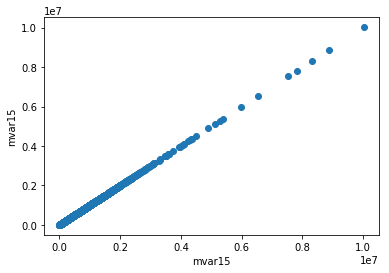

Correlation: 1.0


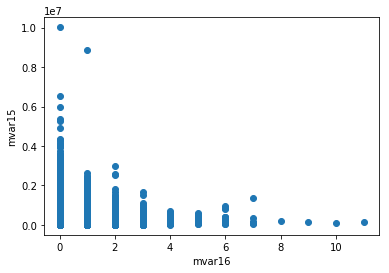

Correlation: -0.0644680402966


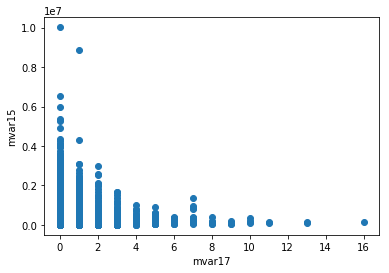

Correlation: -0.063306595563


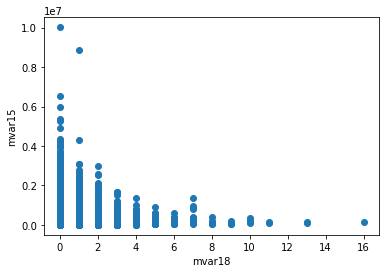

Correlation: -0.0599608031377


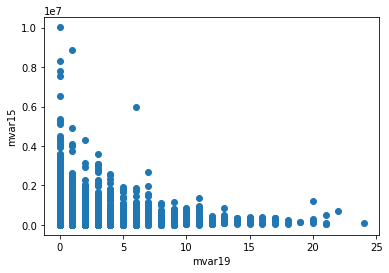

Correlation: -0.0548502004649


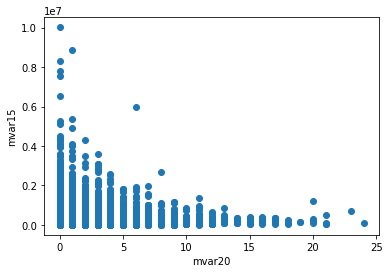

Correlation: -0.0455994510179


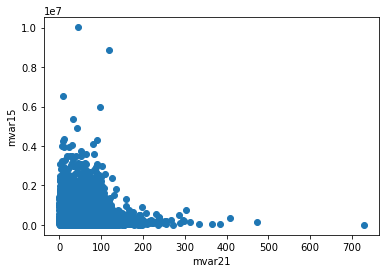

Correlation: -0.156114968966


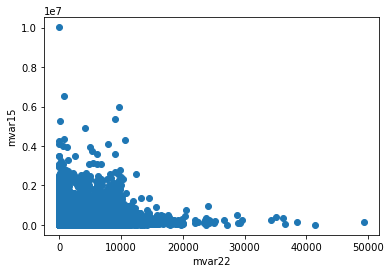

Correlation: -0.130317959436


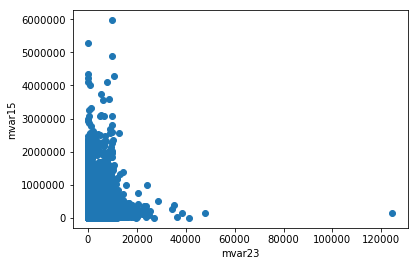

Correlation: -0.124507275059


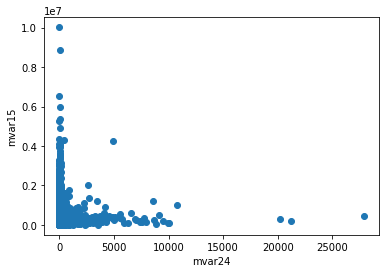

Correlation: -0.0147590368611


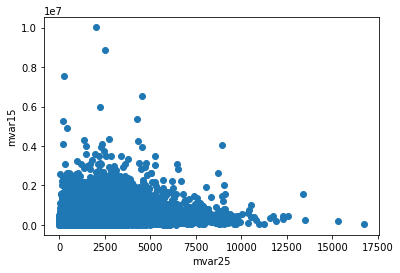

Correlation: 0.193490603757


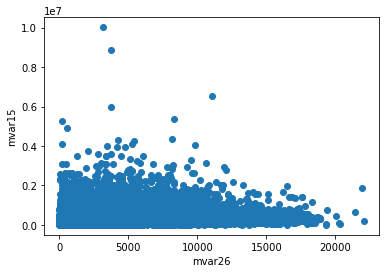

Correlation: 0.16676422371


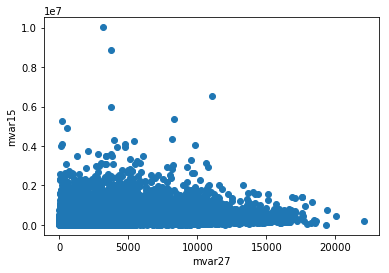

Correlation: 0.168941412241


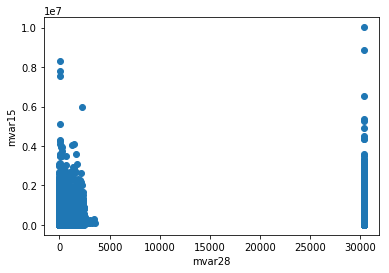

Correlation: 0.142121136879


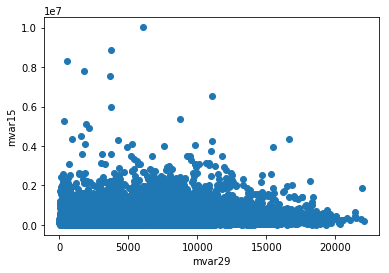

Correlation: 0.15346632765


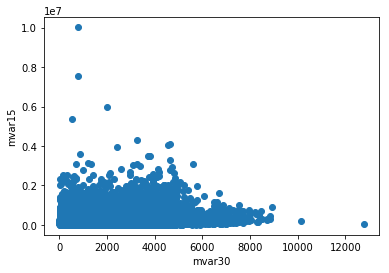

Correlation: 0.0603969566369


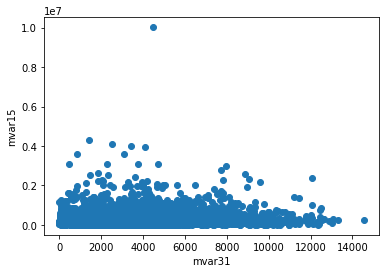

Correlation: 0.0721539874085


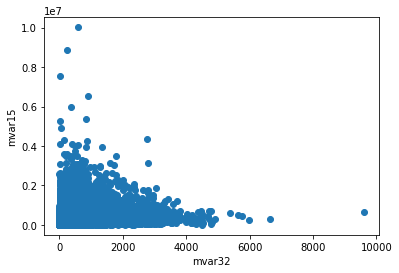

Correlation: 0.176082060494


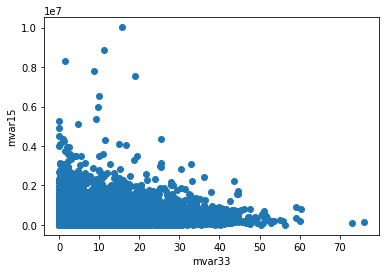

Correlation: 0.0665354661336


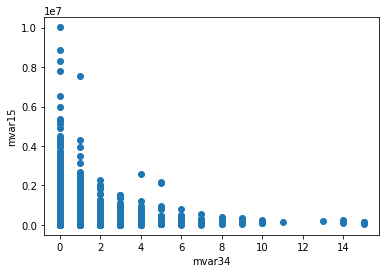

Correlation: -0.0320401379026


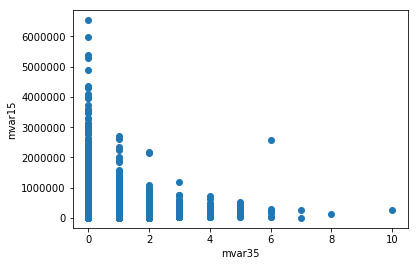

Correlation: -0.081889899381


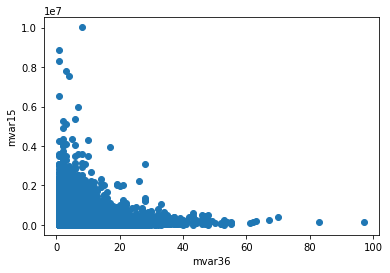

Correlation: -0.124985730714


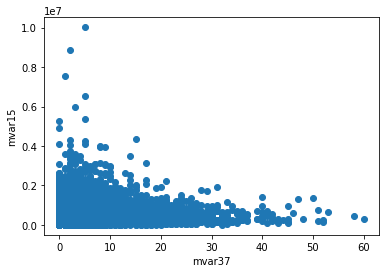

Correlation: 0.130721032921


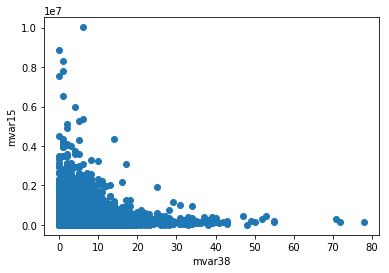

Correlation: -0.104279669604


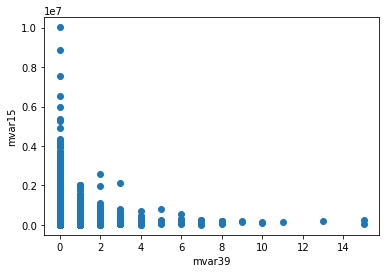

Correlation: -0.0452943671867


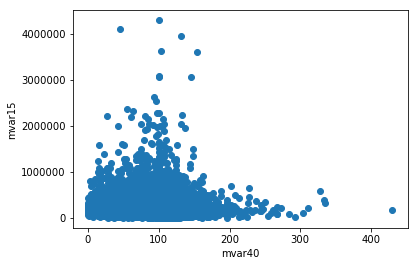

Correlation: -0.113194891399


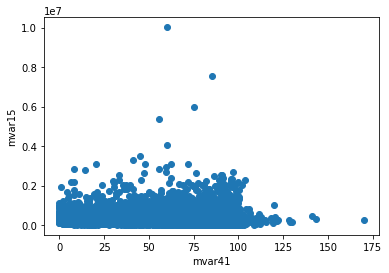

Correlation: -0.113639296451


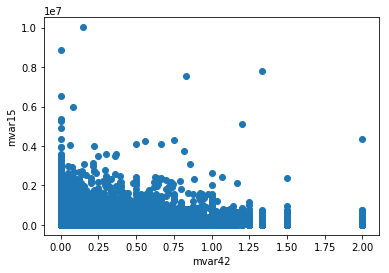

Correlation: -0.183062732522


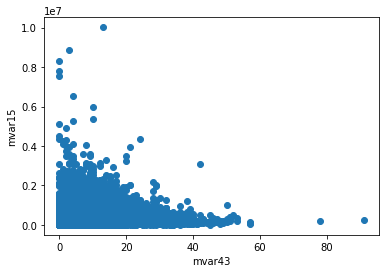

Correlation: 0.0473831517791


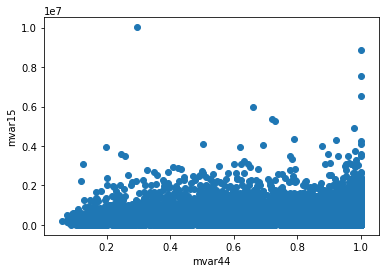

Correlation: 0.0588667400373


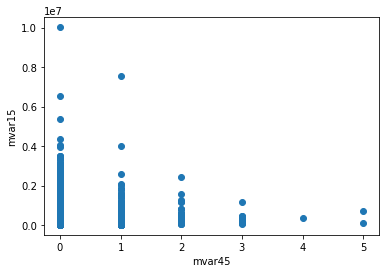

Correlation: -0.0250619066123


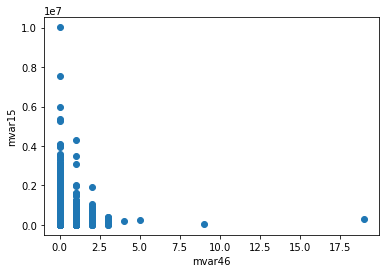

Correlation: -0.0797533119109


In [29]:
v1 = 15
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

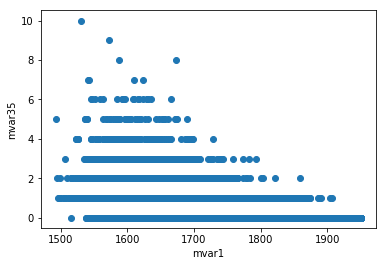

Correlation: -0.449950253107


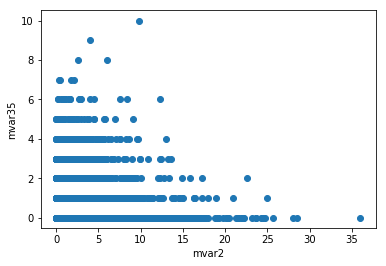

Correlation: 0.0874296235218


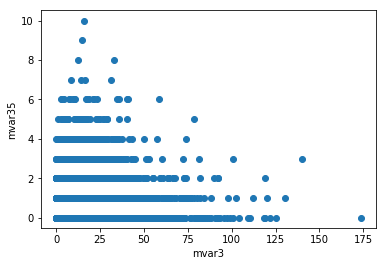

Correlation: 0.281362195688


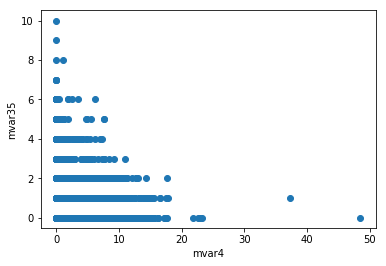

Correlation: 0.124361886474


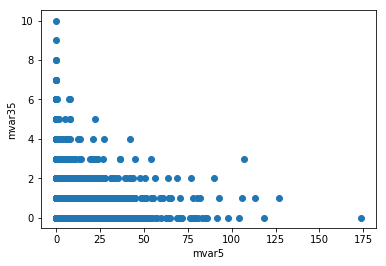

Correlation: 0.0852403460491


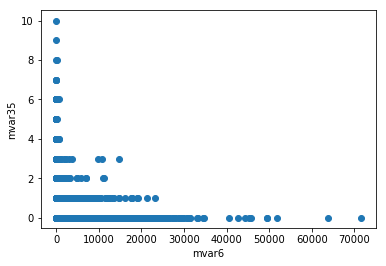

Correlation: -0.0993874798


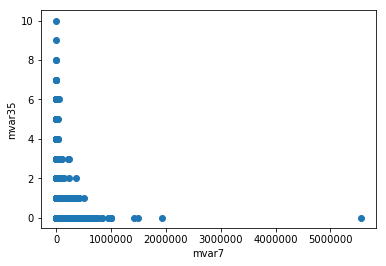

Correlation: -0.0638519722742


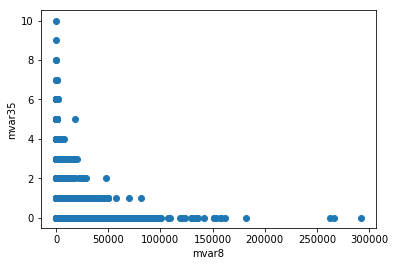

Correlation: -0.13794894206


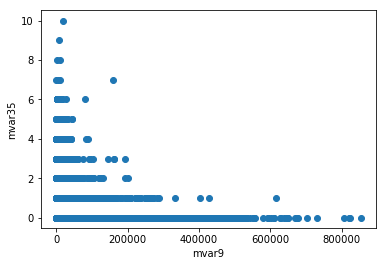

Correlation: -0.137180256309


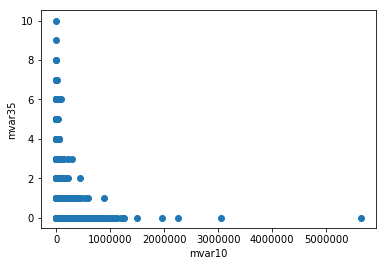

Correlation: -0.110392214714


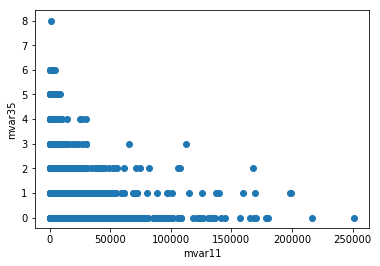

Correlation: 0.0161442649976


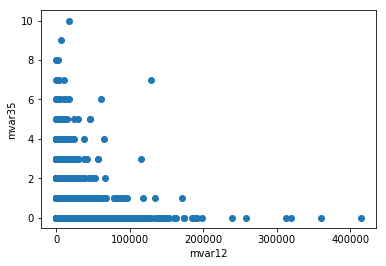

Correlation: -0.0622284364402


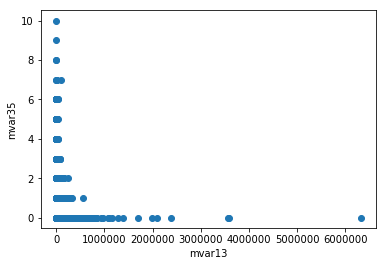

Correlation: -0.0633103124902


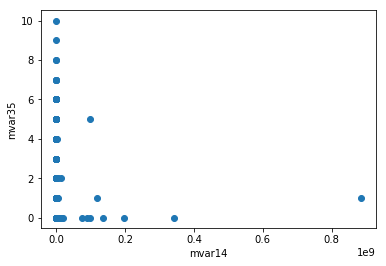

Correlation: 0.0073287299146


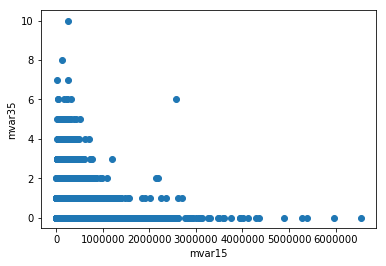

Correlation: -0.081889899381


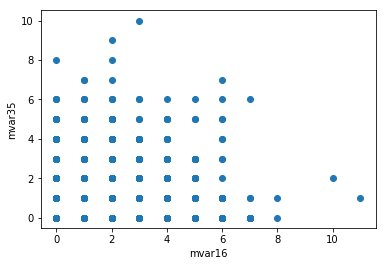

Correlation: 0.314357034007


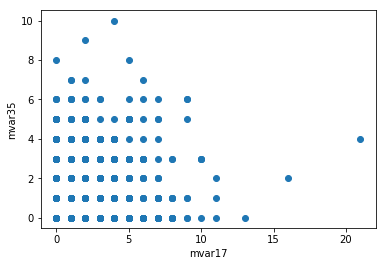

Correlation: 0.308606980702


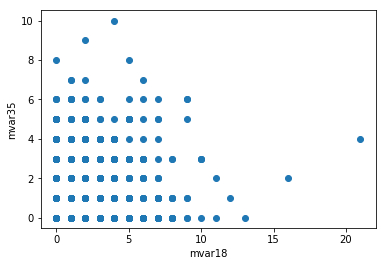

Correlation: 0.305100368657


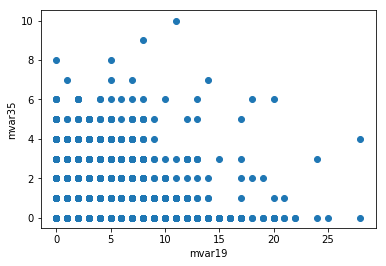

Correlation: 0.113553849956


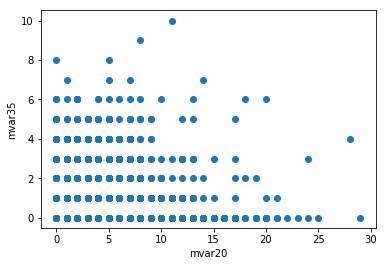

Correlation: 0.108208391661


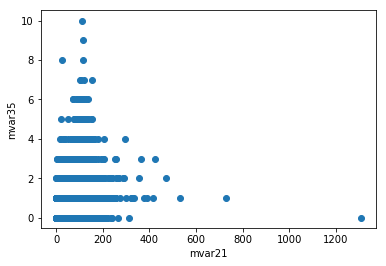

Correlation: 0.284339264381


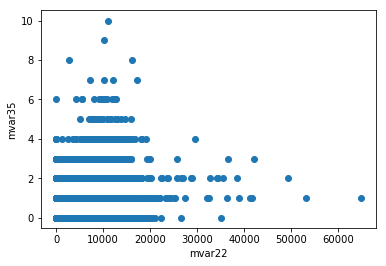

Correlation: 0.275128941133


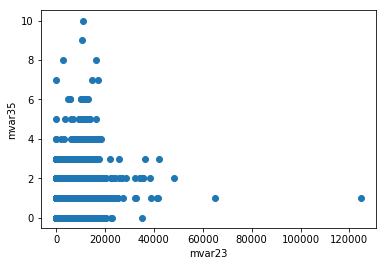

Correlation: 0.256883875501


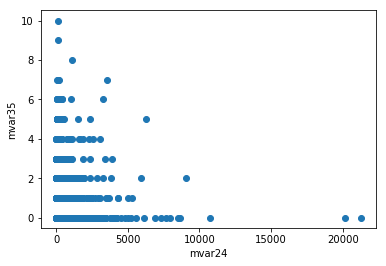

Correlation: 0.12692424375


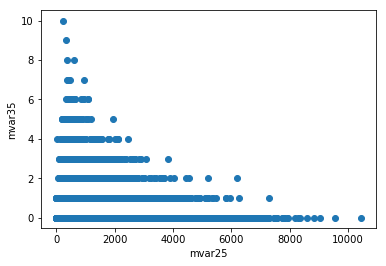

Correlation: -0.13764653231


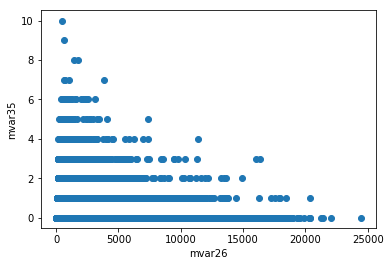

Correlation: -0.127183025606


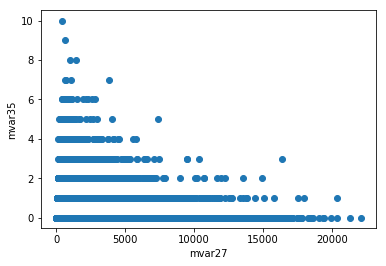

Correlation: -0.130092710755


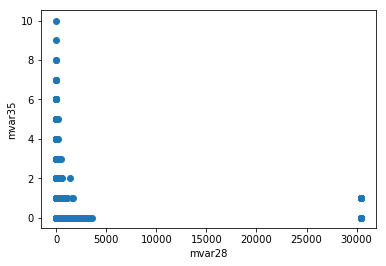

Correlation: -0.241015366945


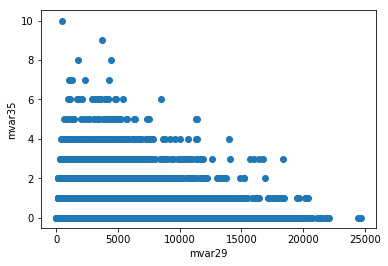

Correlation: -0.0961891795267


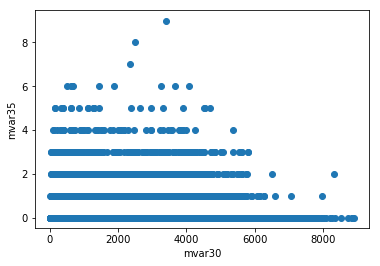

Correlation: -0.0677421392961


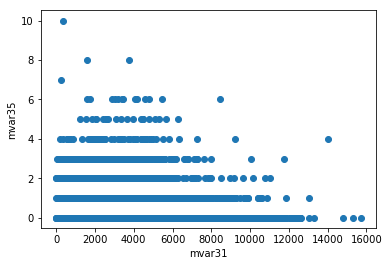

Correlation: -0.0645410828809


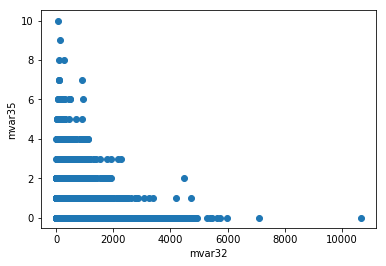

Correlation: -0.129956182351


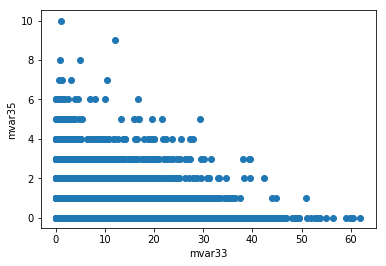

Correlation: -0.0699434638696


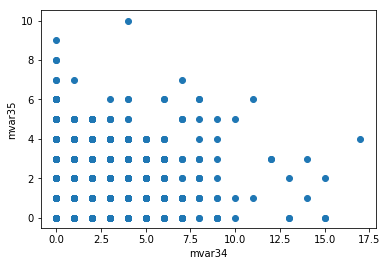

Correlation: 0.411017278362


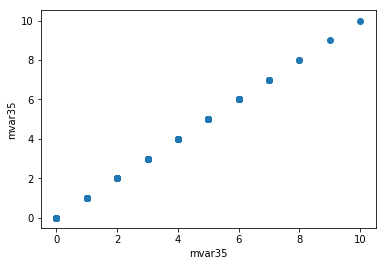

Correlation: 1.0


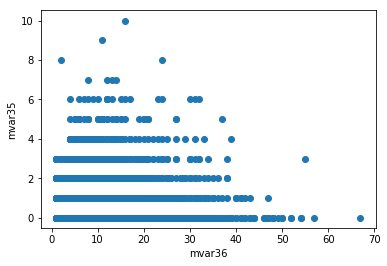

Correlation: 0.135730912994


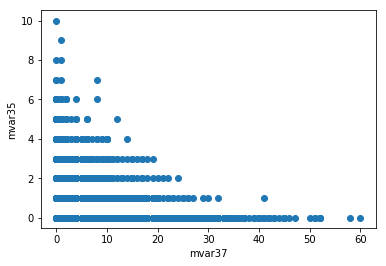

Correlation: -0.125880091894


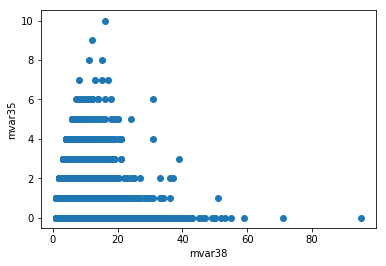

Correlation: 0.118034847696


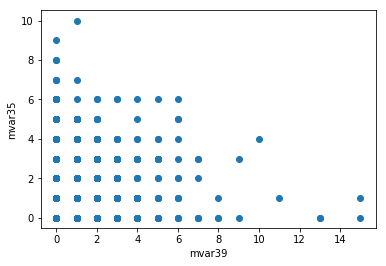

Correlation: 0.295919094675


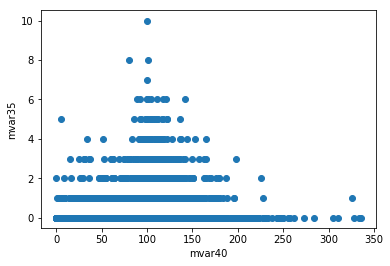

Correlation: 0.0858579043318


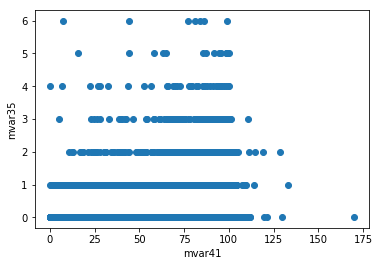

Correlation: 0.0331066763458


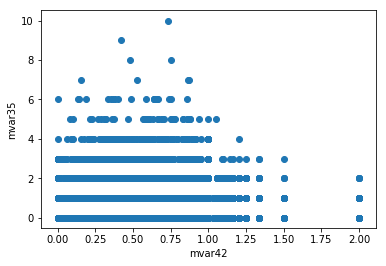

Correlation: 0.303944036381


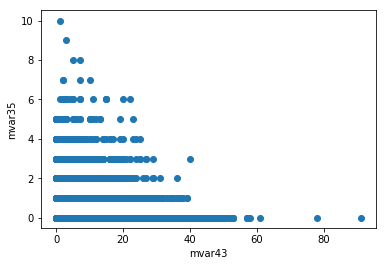

Correlation: -0.178062754314


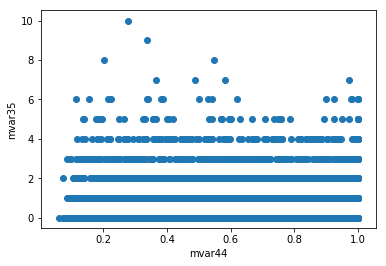

Correlation: -0.0302771077873


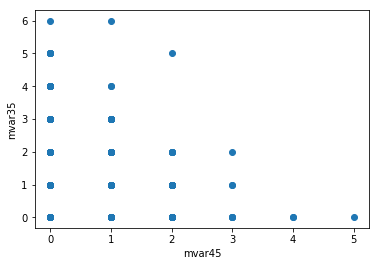

Correlation: 0.108424066044


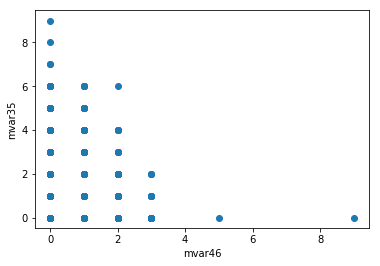

Correlation: 0.175592156826


In [30]:
v1 = 35
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

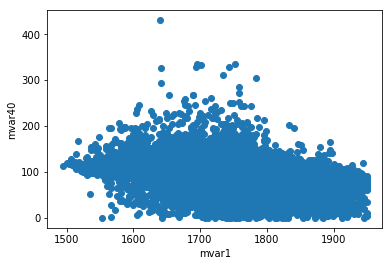

Correlation: -0.363777170822


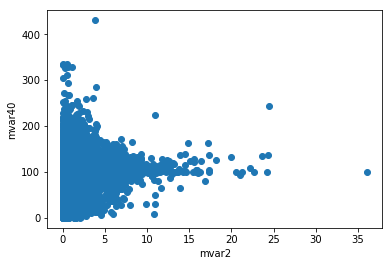

Correlation: 0.10096984107


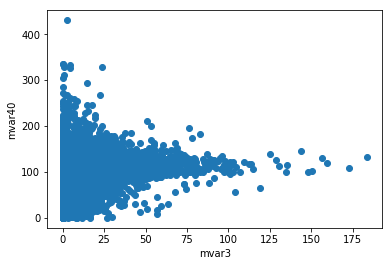

Correlation: 0.213647467993


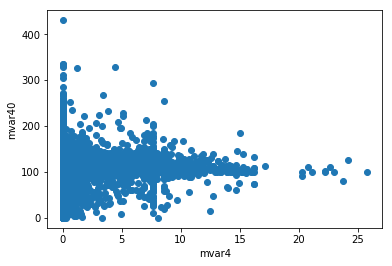

Correlation: 0.107711885078


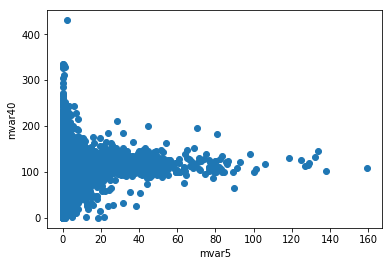

Correlation: 0.155474805263


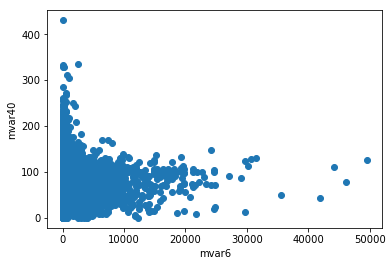

Correlation: -0.154404385058


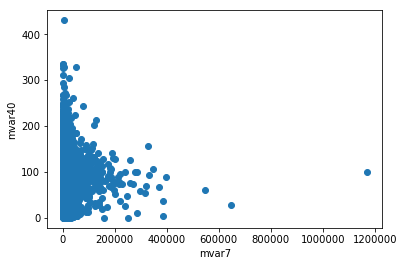

Correlation: -0.165444701417


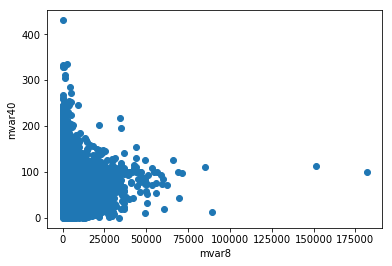

Correlation: -0.235222266735


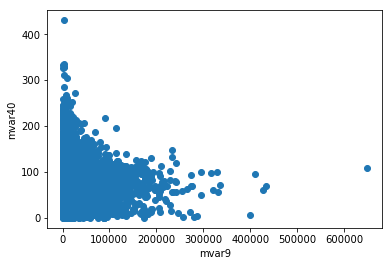

Correlation: -0.278261442523


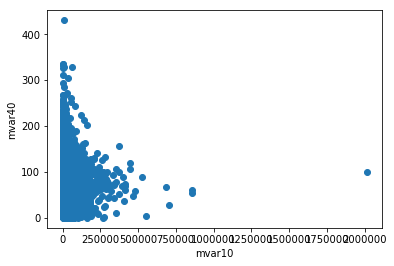

Correlation: -0.268487279388


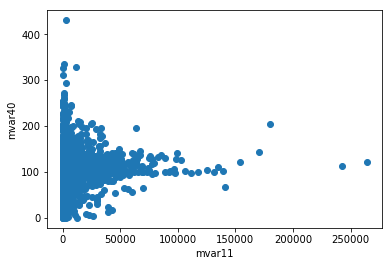

Correlation: 0.0684171823124


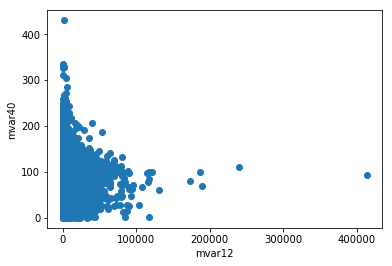

Correlation: -0.157484536479


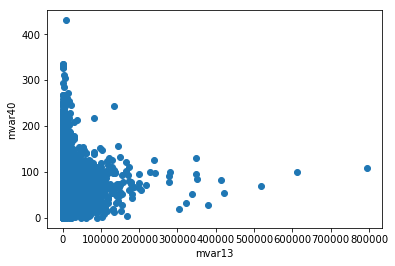

Correlation: -0.184726074784


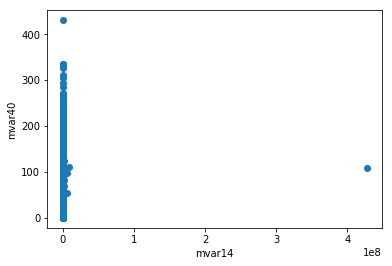

Correlation: -0.000227854876434


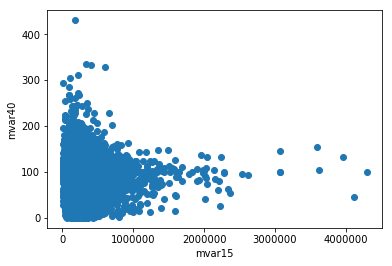

Correlation: -0.113194891399


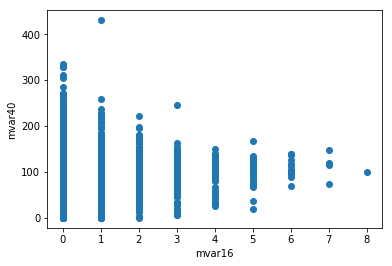

Correlation: 0.0797175915125


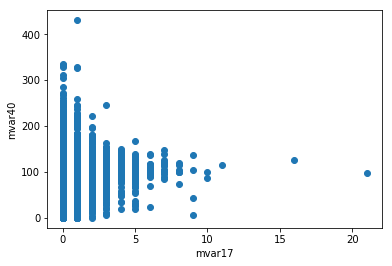

Correlation: 0.0727203176745


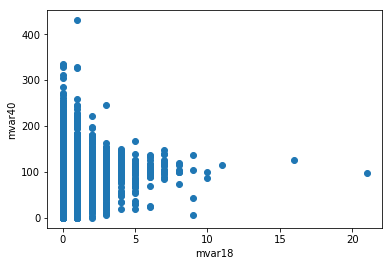

Correlation: 0.0709231430203


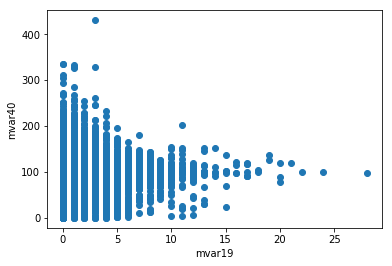

Correlation: -0.00555787924362


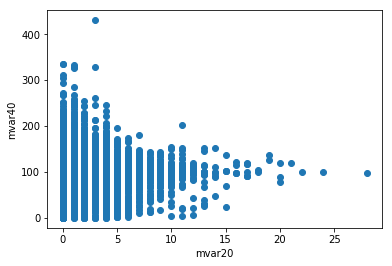

Correlation: -0.0102924002118


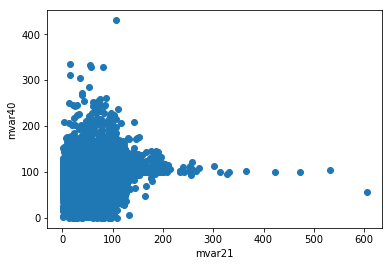

Correlation: 0.172877097916


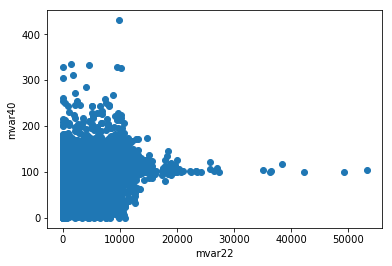

Correlation: 0.150463494438


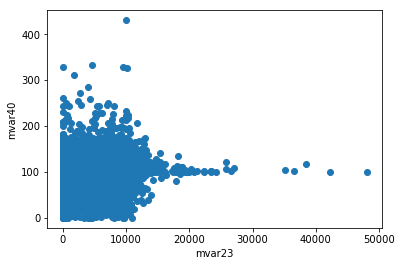

Correlation: 0.137164446283


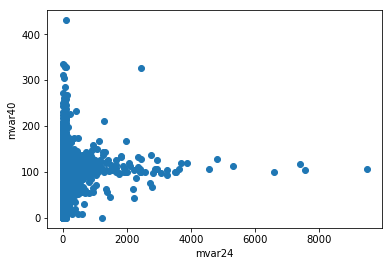

Correlation: 0.0753916733725


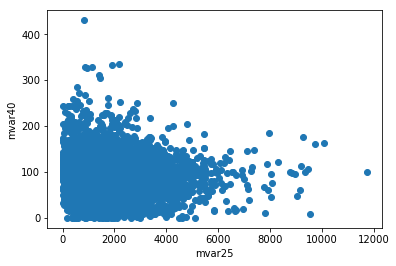

Correlation: -0.166365674294


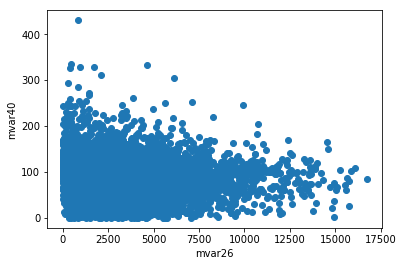

Correlation: -0.185642870563


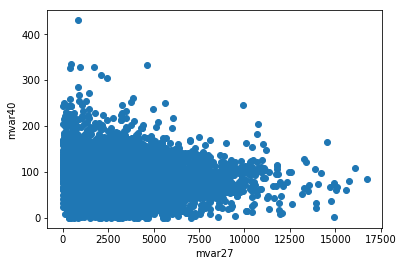

Correlation: -0.194063882616


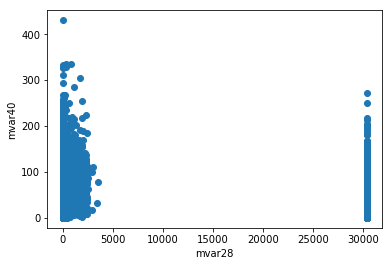

Correlation: -0.228826725467


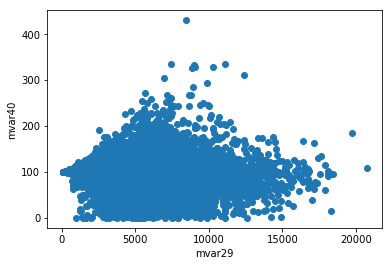

Correlation: -0.0743881531129


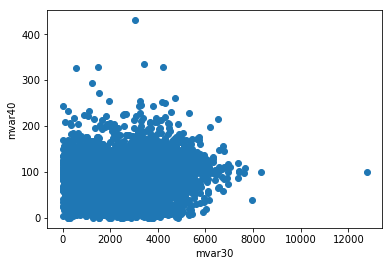

Correlation: -0.0427146741501


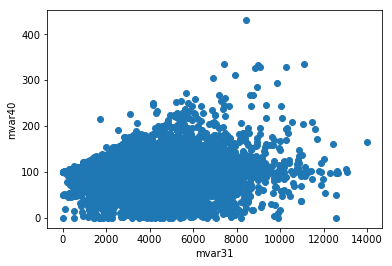

Correlation: 0.0141672790004


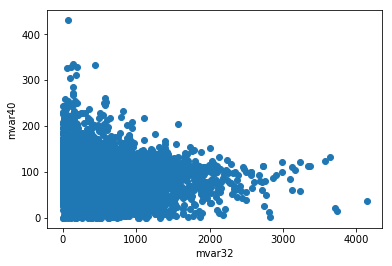

Correlation: -0.217330376965


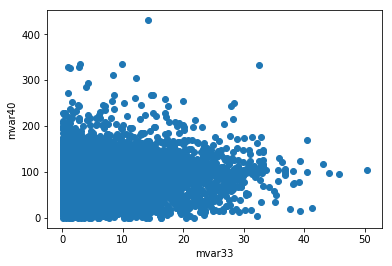

Correlation: -0.0519974559307


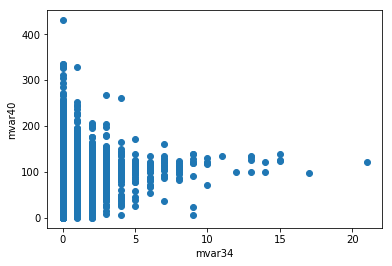

Correlation: 0.0457423653198


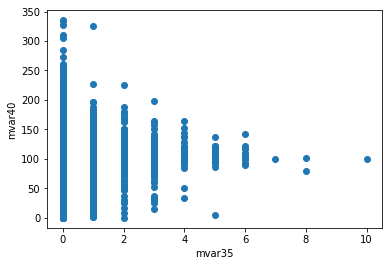

Correlation: 0.0858579043318


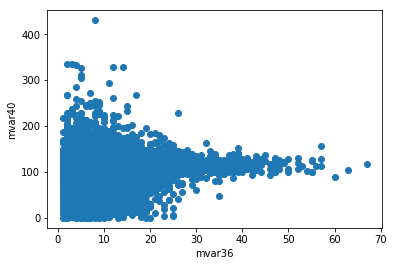

Correlation: 0.199724395103


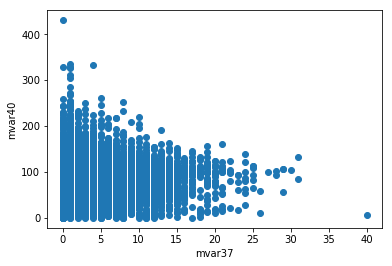

Correlation: -0.198809958705


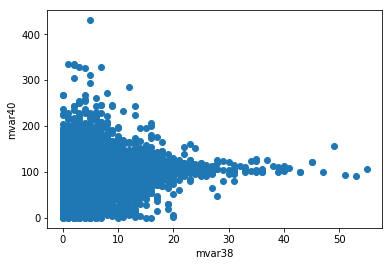

Correlation: 0.0983928646438


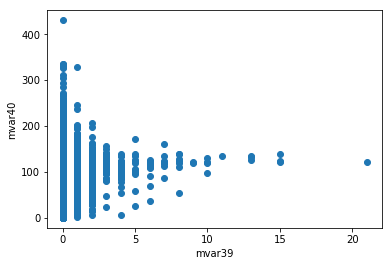

Correlation: 0.0606184468383


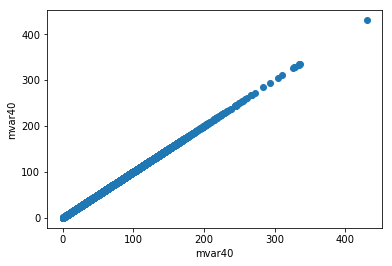

Correlation: 1.0


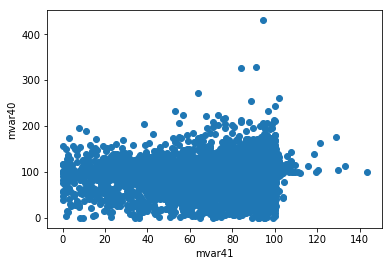

Correlation: 0.103737158675


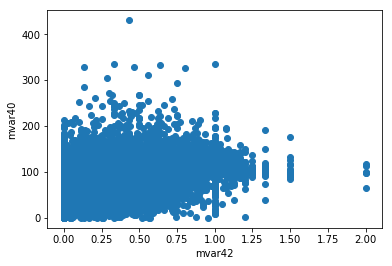

Correlation: 0.277047887747


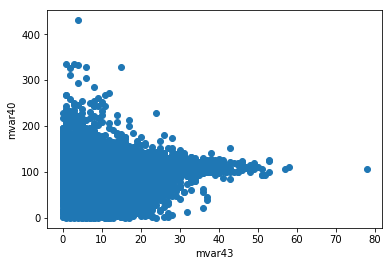

Correlation: -0.0787890353112


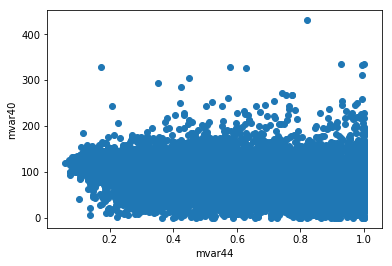

Correlation: -0.14593781353


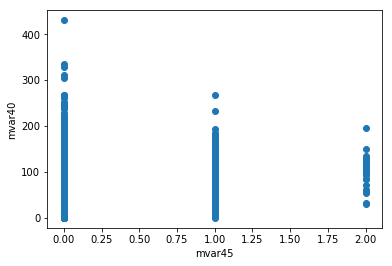

Correlation: 0.0907600427699


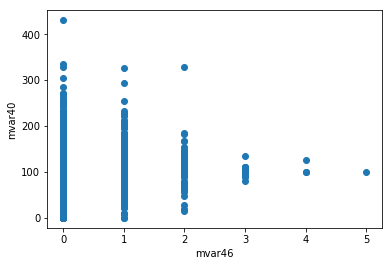

Correlation: 0.127499571675


In [31]:
v1 = 40
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

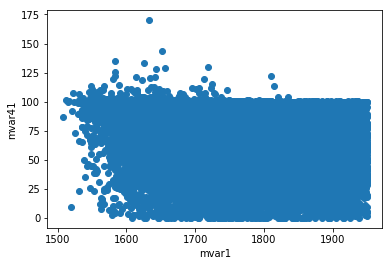

Correlation: -0.208556898154


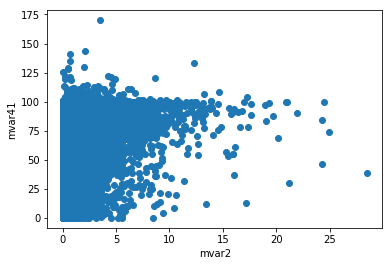

Correlation: 0.159704349469


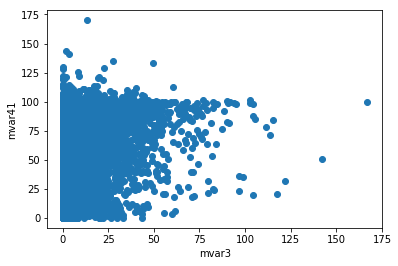

Correlation: 0.0330079477343


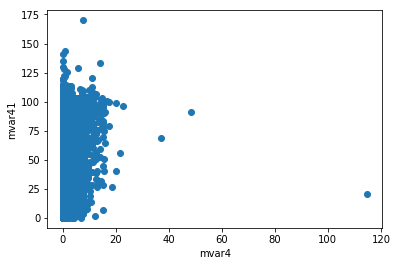

Correlation: -0.00357231739977


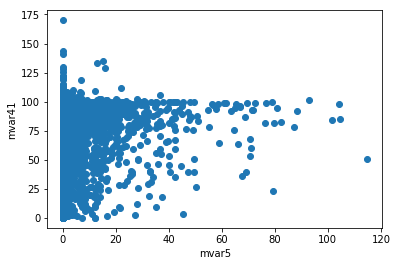

Correlation: 0.036596143736


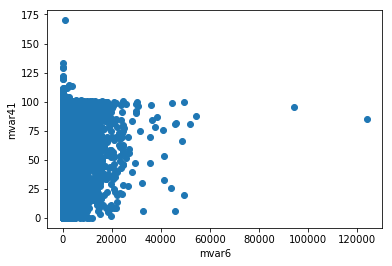

Correlation: -0.102245977791


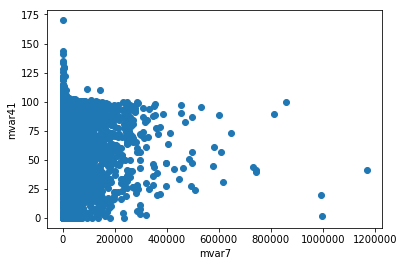

Correlation: -0.187826209506


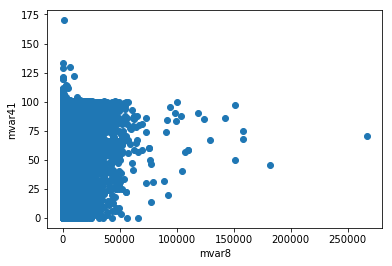

Correlation: -0.154866972566


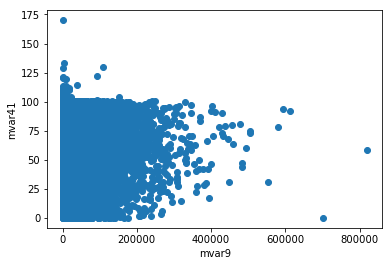

Correlation: -0.179702701598


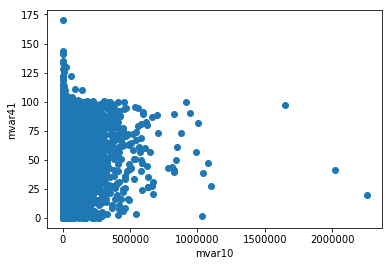

Correlation: -0.232595555492


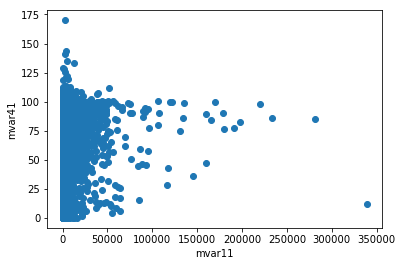

Correlation: 0.0036136343787


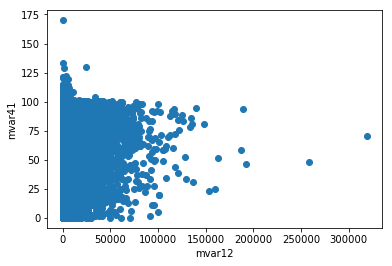

Correlation: -0.097831065001


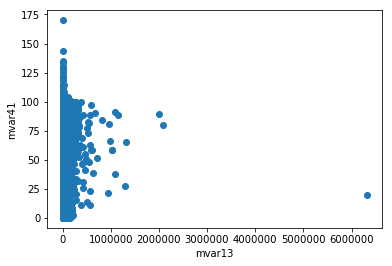

Correlation: -0.0726110821425


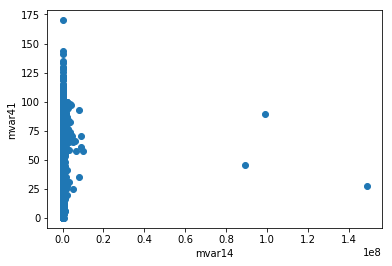

Correlation: -0.0162359761518


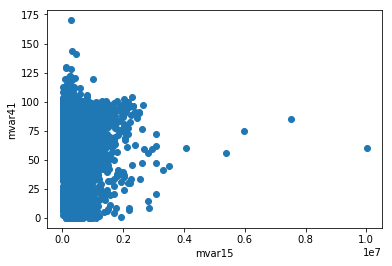

Correlation: -0.113639296451


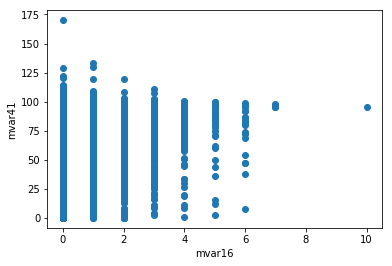

Correlation: 0.0492611128839


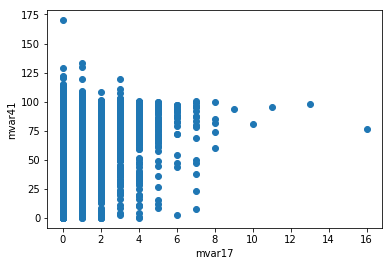

Correlation: 0.0475787703241


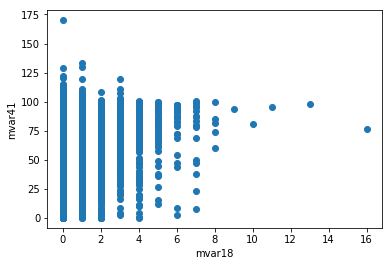

Correlation: 0.0454949318003


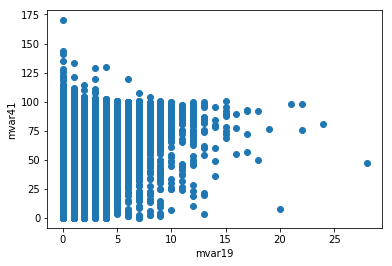

Correlation: 0.0247933788963


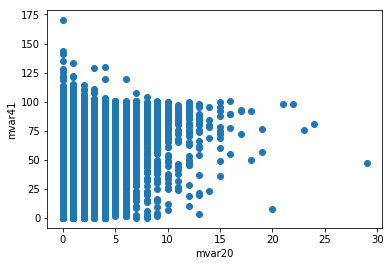

Correlation: 0.0189625449597


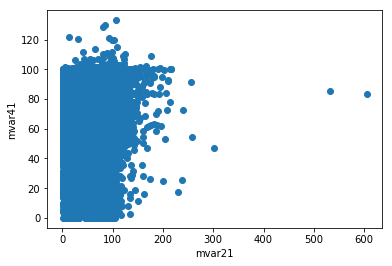

Correlation: 0.109420432302


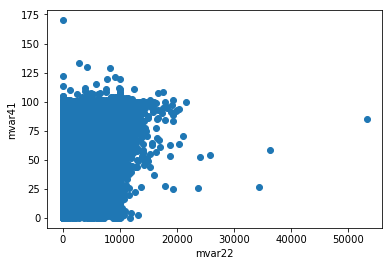

Correlation: 0.118846276092


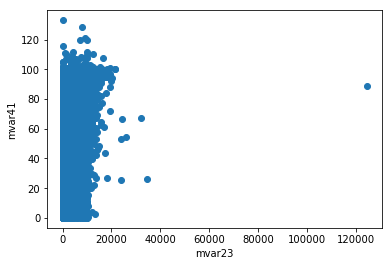

Correlation: 0.12290330604


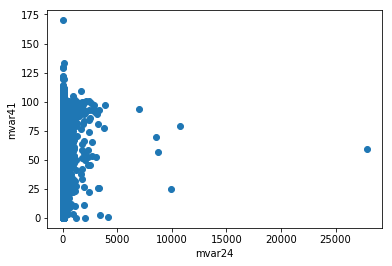

Correlation: 0.00405697601603


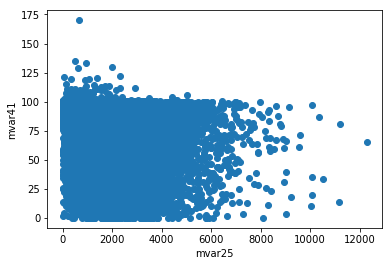

Correlation: -0.211160282668


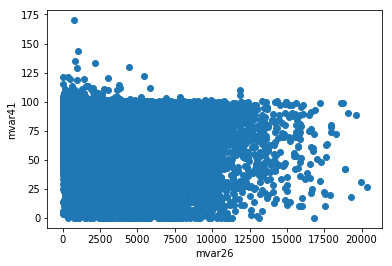

Correlation: -0.208282861363


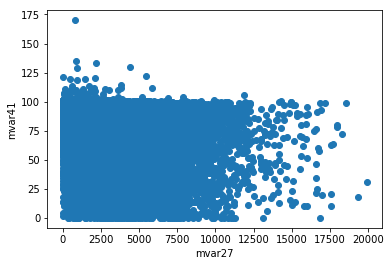

Correlation: -0.214340584476


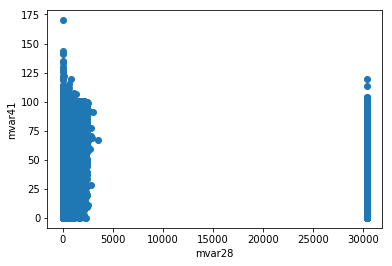

Correlation: -0.0874542762505


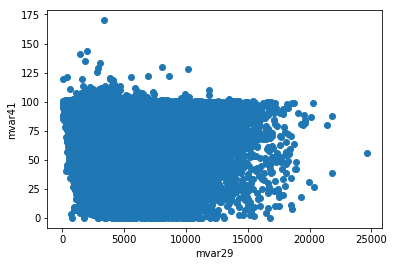

Correlation: -0.167390617992


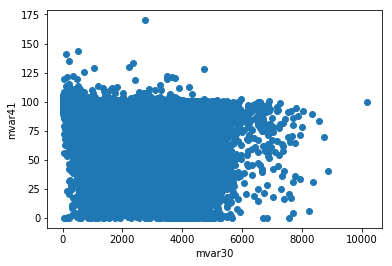

Correlation: -0.197576903018


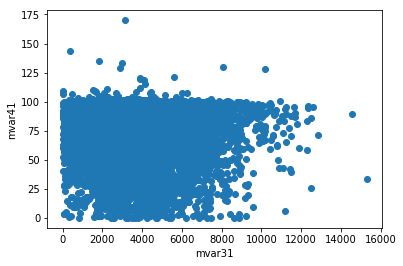

Correlation: -0.057642629398


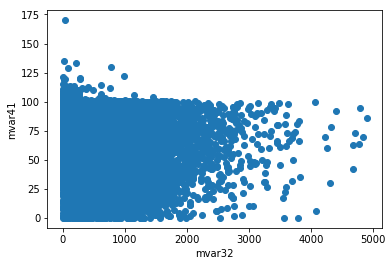

Correlation: -0.192949317124


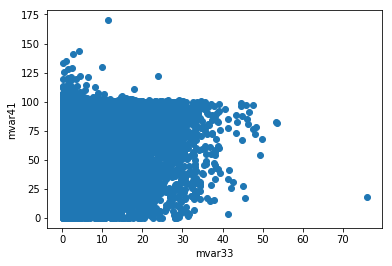

Correlation: -0.119161342266


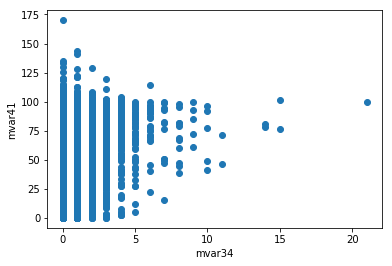

Correlation: -0.00631658597066


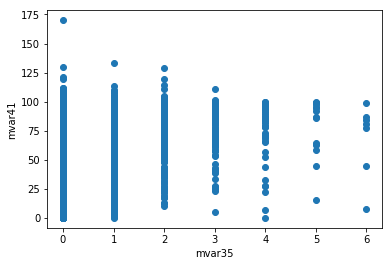

Correlation: 0.0331066763458


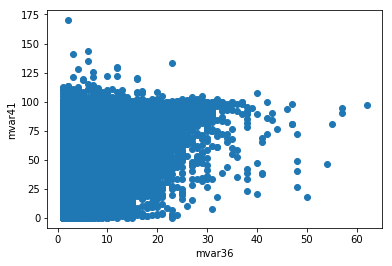

Correlation: 0.00949234273795


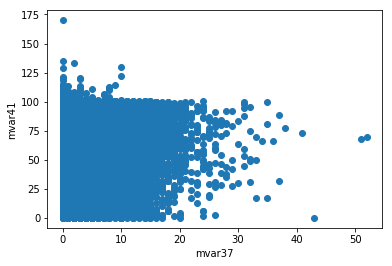

Correlation: -0.168565685465


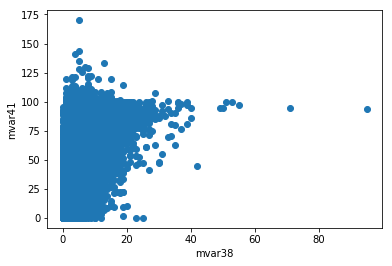

Correlation: 0.221525405158


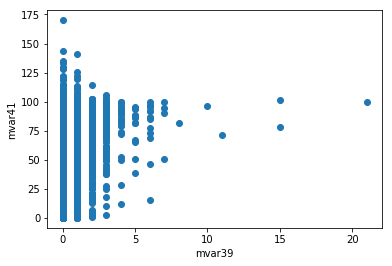

Correlation: 0.00954317821735


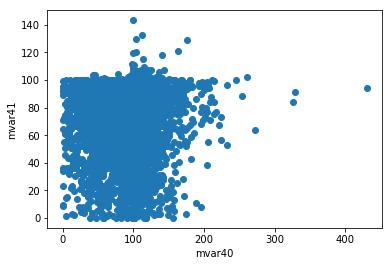

Correlation: 0.103737158675


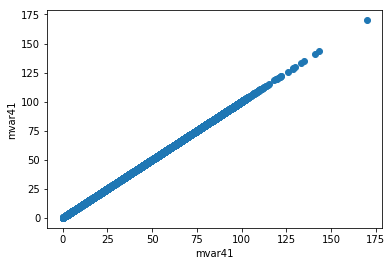

Correlation: 1.0


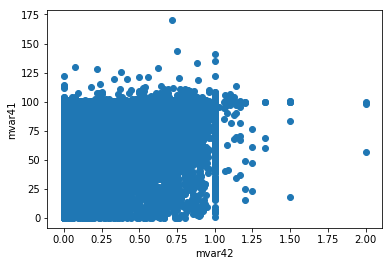

Correlation: 0.13976074928


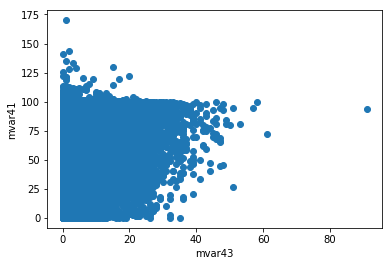

Correlation: -0.0484984323283


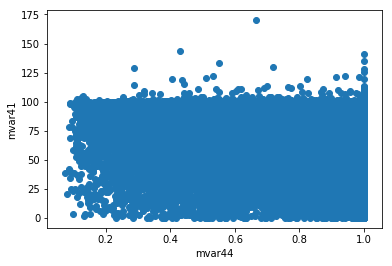

Correlation: 0.032476306601


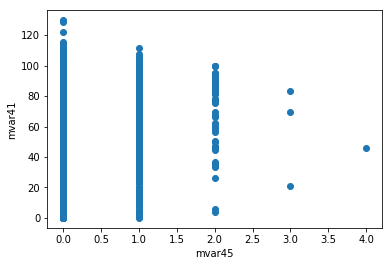

Correlation: -0.0108756737216


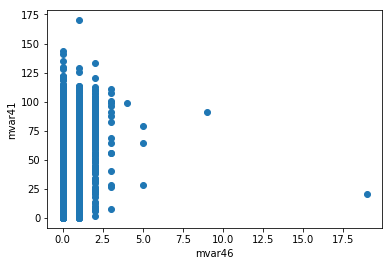

Correlation: 0.00998589935615


In [32]:
v1 = 41
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

In [ ]:
#Moderate missing values

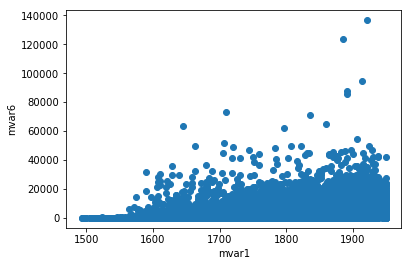

Correlation: 0.405196020744


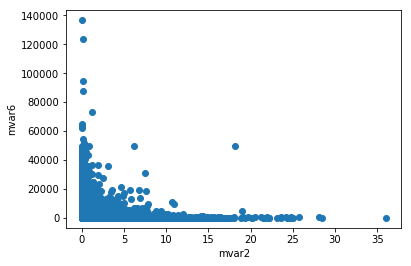

Correlation: -0.168127907768


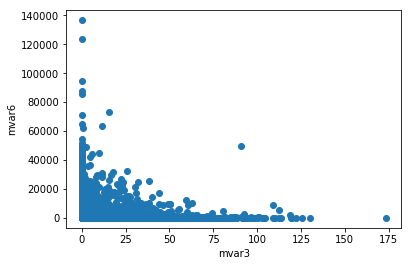

Correlation: -0.117078882124


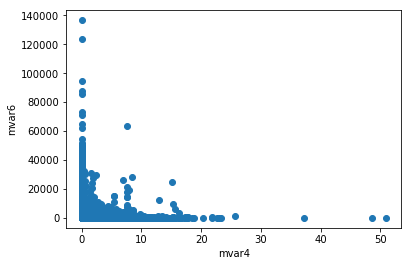

Correlation: -0.0674492752171


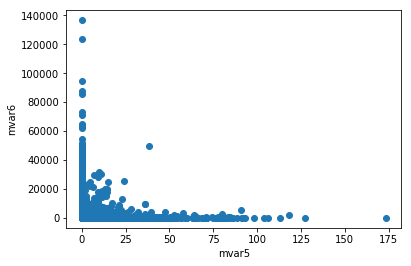

Correlation: -0.0400190637439


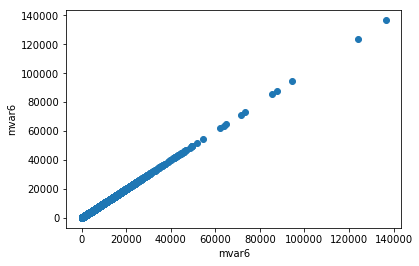

Correlation: 1.0


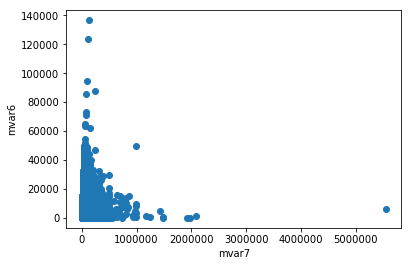

Correlation: 0.19267063142


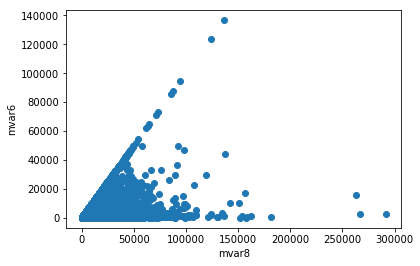

Correlation: 0.490945731829


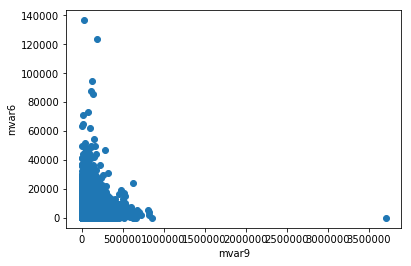

Correlation: 0.243673753084


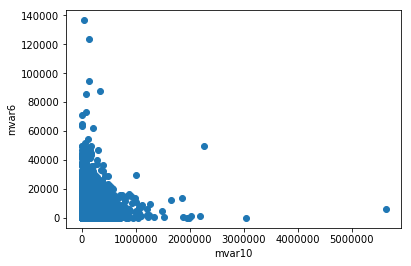

Correlation: 0.230486314179


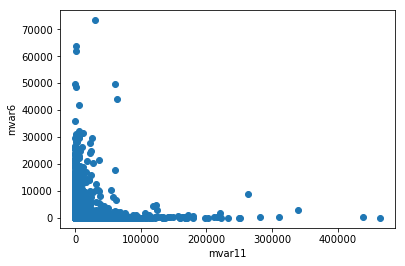

Correlation: 0.0128168294123


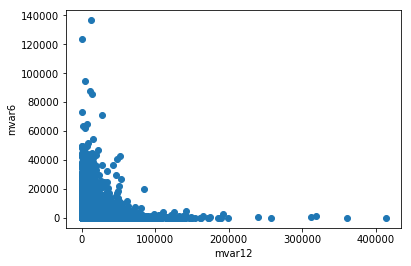

Correlation: -0.0613665976028


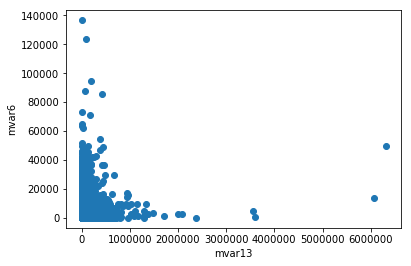

Correlation: 0.165493062881


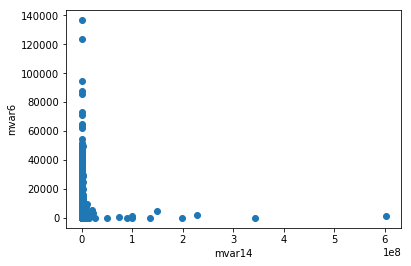

Correlation: 0.00403425391413


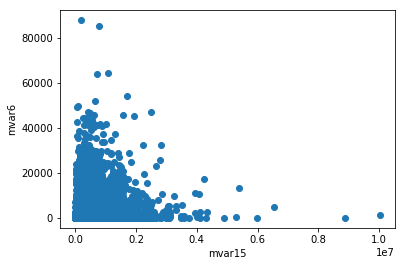

Correlation: 0.15911870242


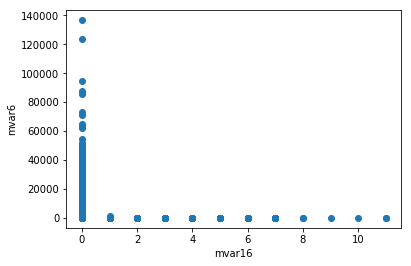

Correlation: -0.162081461645


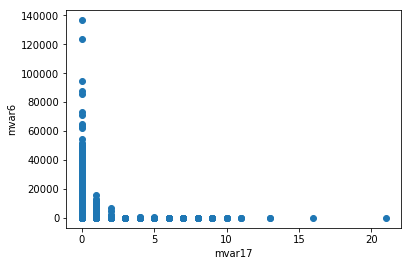

Correlation: -0.161176759935


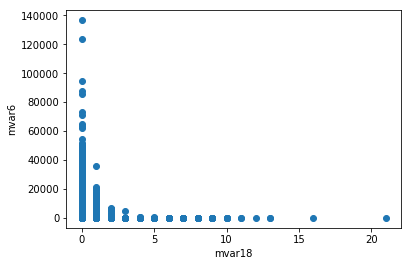

Correlation: -0.160090961323


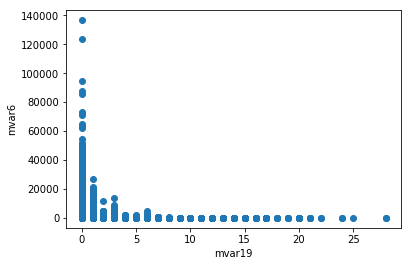

Correlation: -0.255631061357


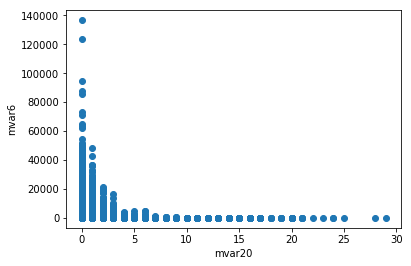

Correlation: -0.251206393646


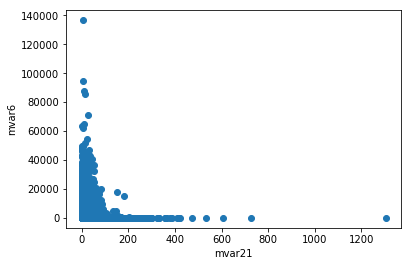

Correlation: -0.416423509677


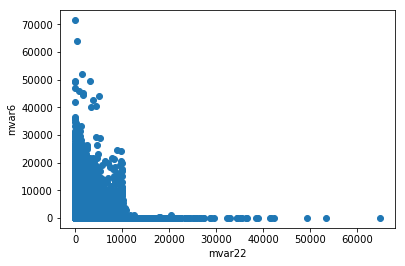

Correlation: -0.316494262171


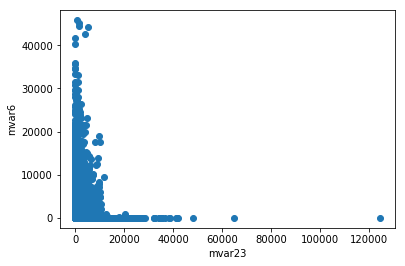

Correlation: -0.316465586945


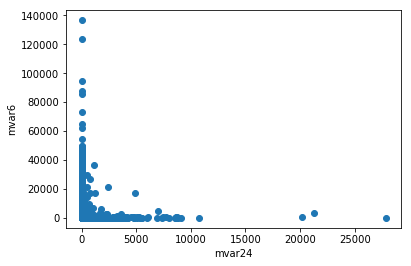

Correlation: -0.0682887498448


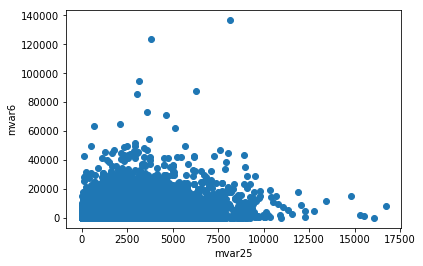

Correlation: 0.313181185651


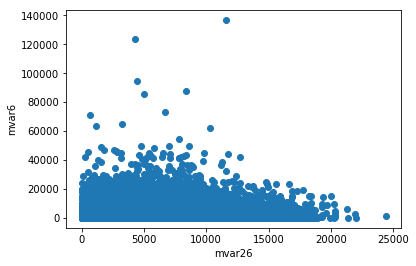

Correlation: 0.235001903084


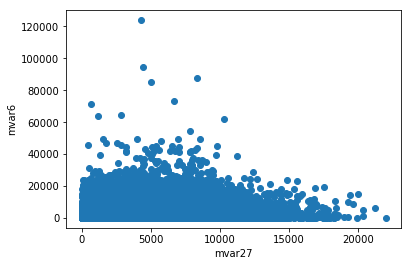

Correlation: 0.249592411849


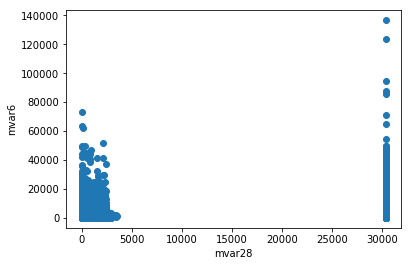

Correlation: 0.292475145511


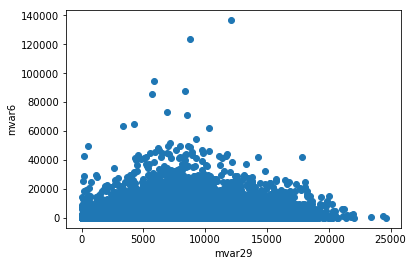

Correlation: 0.214465468994


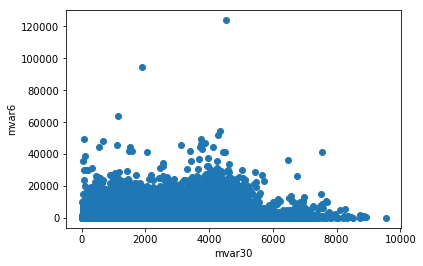

Correlation: 0.0782088482199


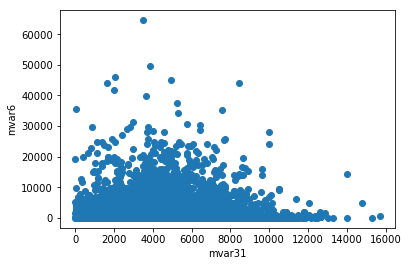

Correlation: 0.0817735833474


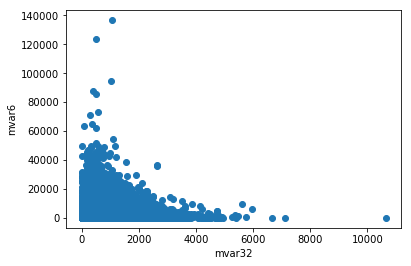

Correlation: 0.131581860158


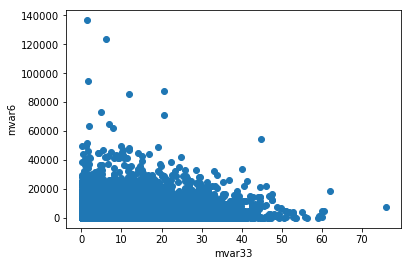

Correlation: 0.155762490995


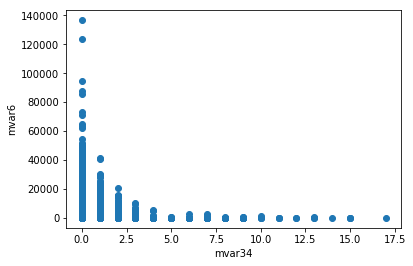

Correlation: -0.110984741857


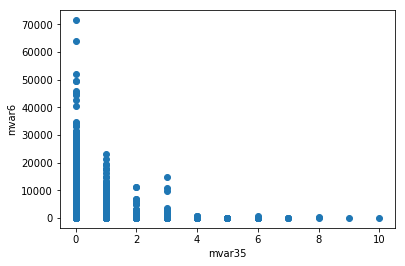

Correlation: -0.0993874798


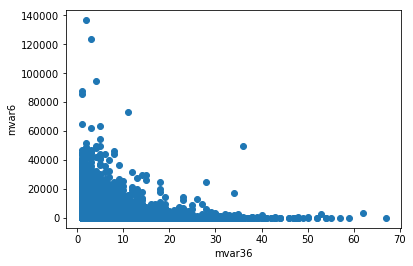

Correlation: -0.199644817294


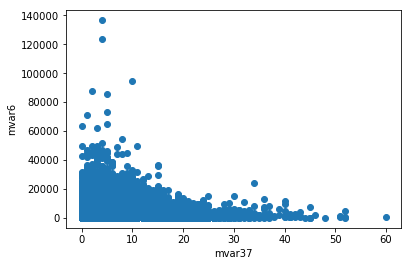

Correlation: 0.0990305700545


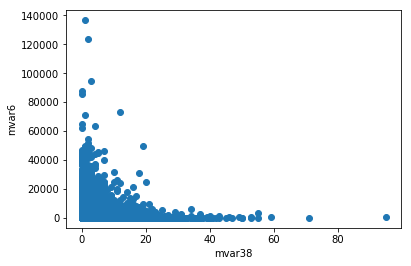

Correlation: -0.205385870162


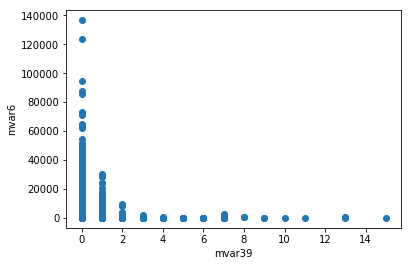

Correlation: -0.0760155871633


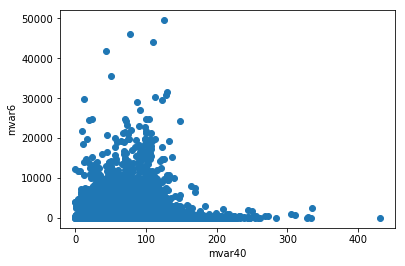

Correlation: -0.154404385058


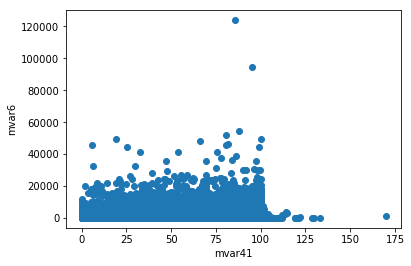

Correlation: -0.102245977791


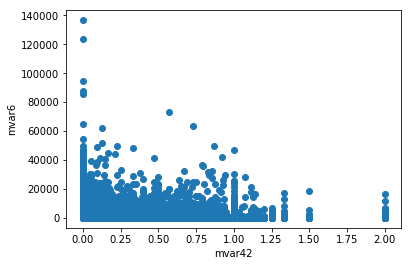

Correlation: -0.201271173834


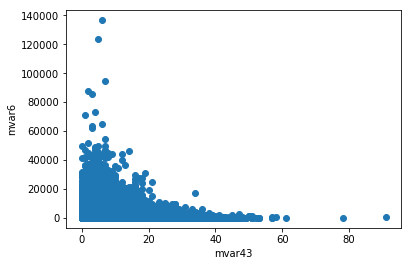

Correlation: -0.0540850035072


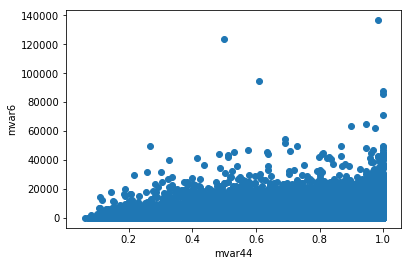

Correlation: 0.152520771686


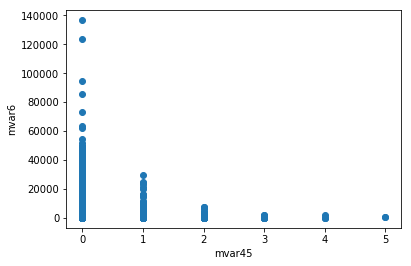

Correlation: -0.0721962866017


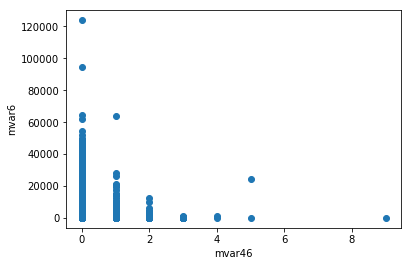

Correlation: -0.0624845590532


In [33]:
v1 = 6
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

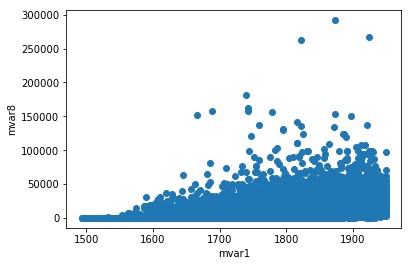

Correlation: 0.588903858868


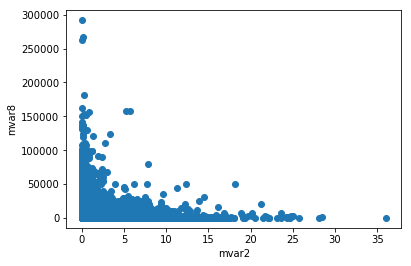

Correlation: -0.20301388537


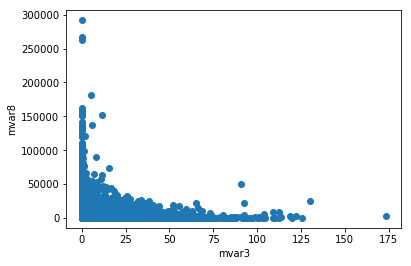

Correlation: -0.20267541788


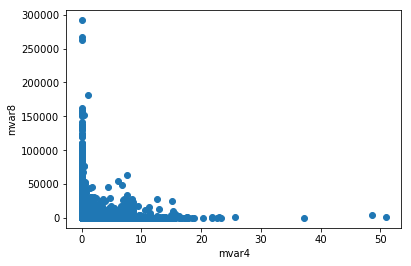

Correlation: -0.11153517345


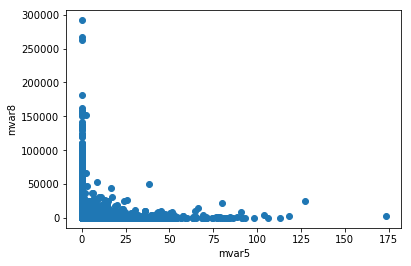

Correlation: -0.0725061304403


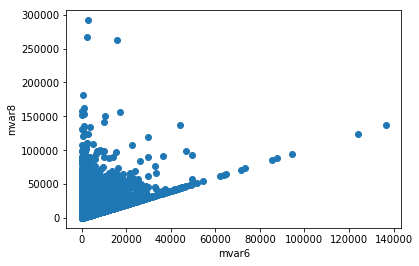

Correlation: 0.490945731829


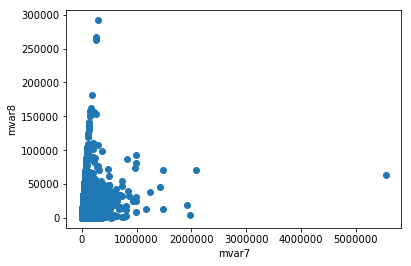

Correlation: 0.34582784862


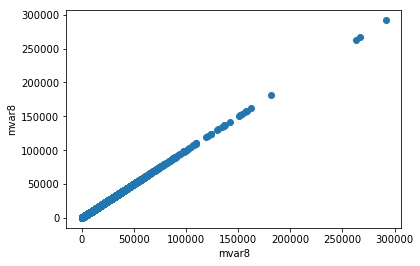

Correlation: 1.0


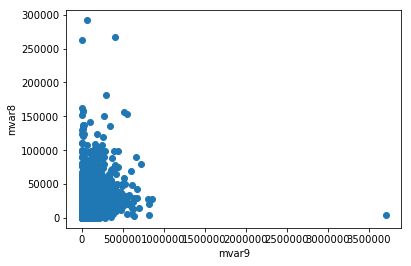

Correlation: 0.560883616226


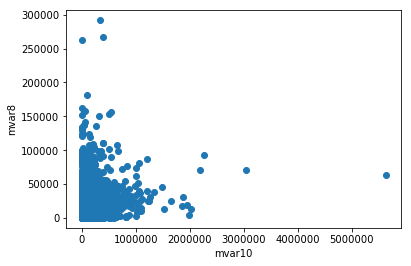

Correlation: 0.455135881976


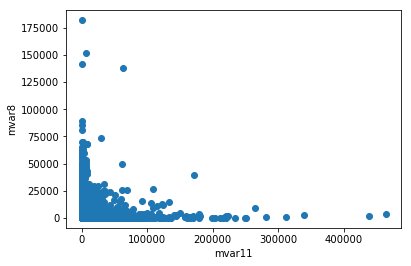

Correlation: -0.0177622946522


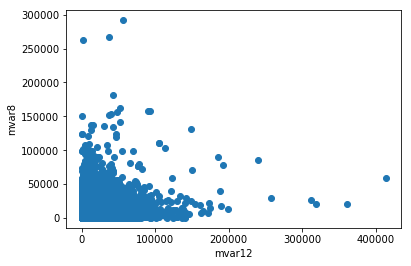

Correlation: 0.176644743731


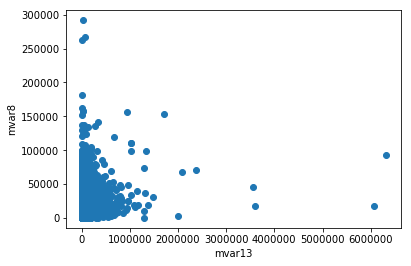

Correlation: 0.31810368734


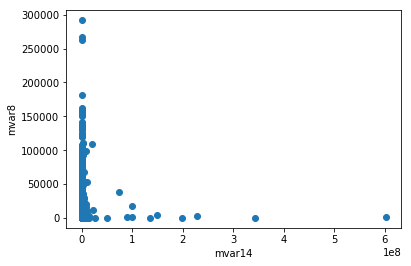

Correlation: 0.00691821368686


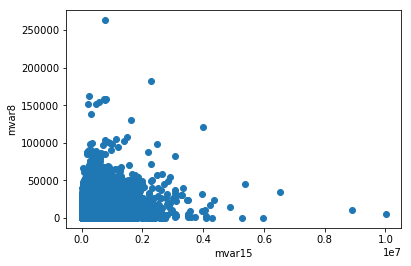

Correlation: 0.267814606909


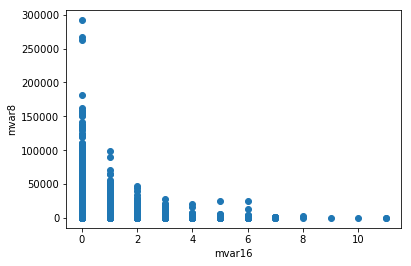

Correlation: -0.18169763121


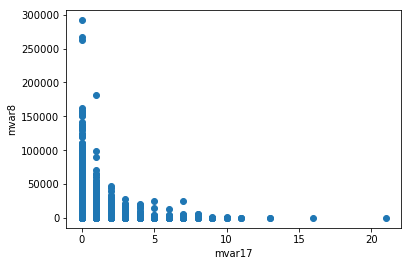

Correlation: -0.182309675805


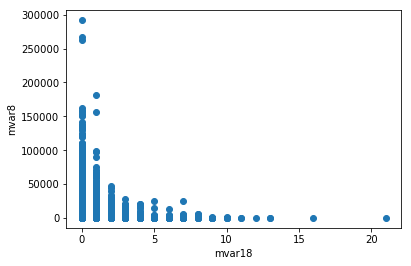

Correlation: -0.179702747307


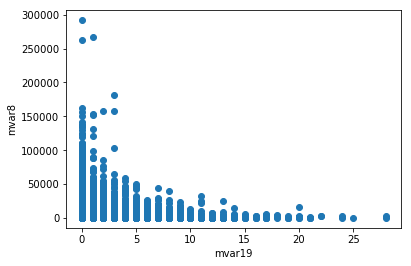

Correlation: -0.258723078105


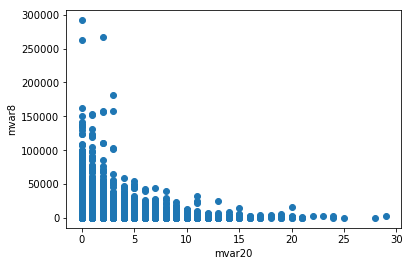

Correlation: -0.247575516042


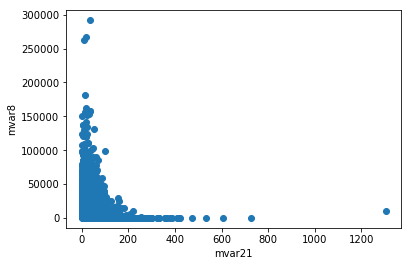

Correlation: -0.529806236064


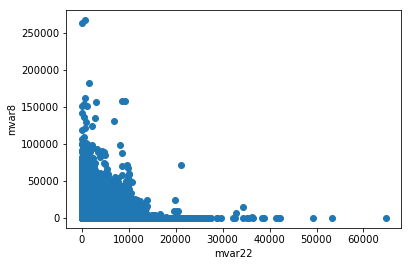

Correlation: -0.385158805557


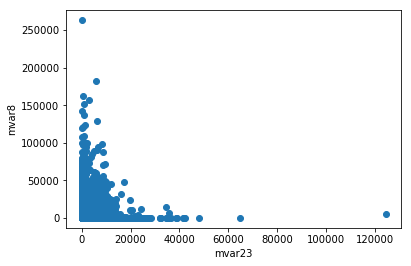

Correlation: -0.367580158813


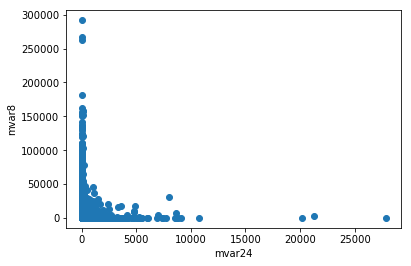

Correlation: -0.0987121740365


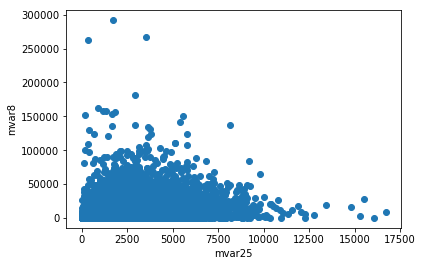

Correlation: 0.376077467967


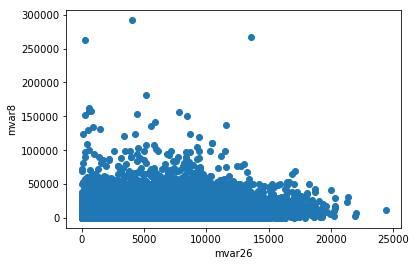

Correlation: 0.391904773835


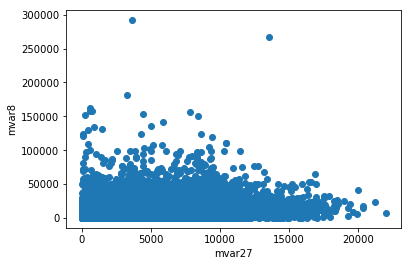

Correlation: 0.413472735051


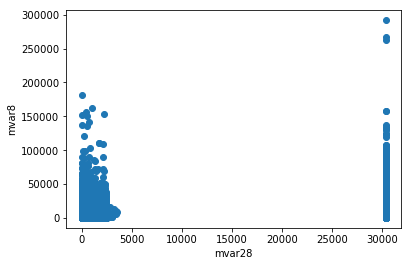

Correlation: 0.391185740874


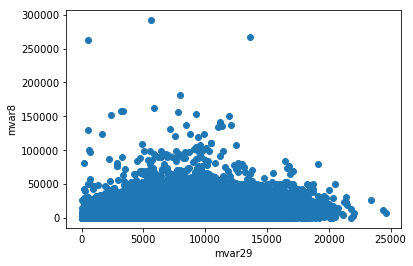

Correlation: 0.351297256812


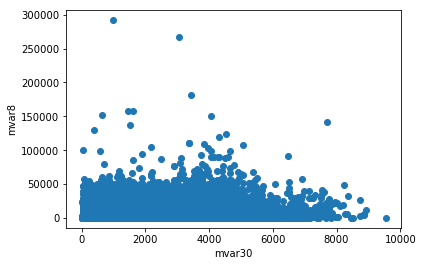

Correlation: 0.110804778422


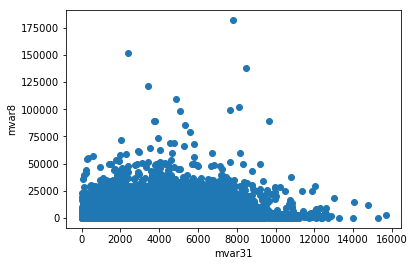

Correlation: 0.10364161572


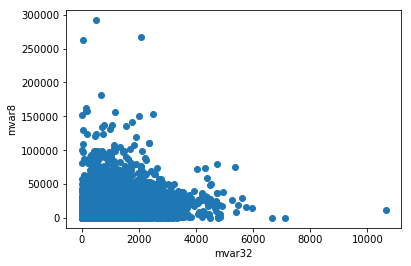

Correlation: 0.43953268346


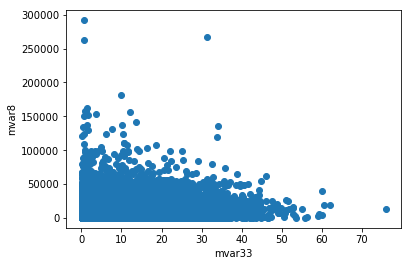

Correlation: 0.209211366131


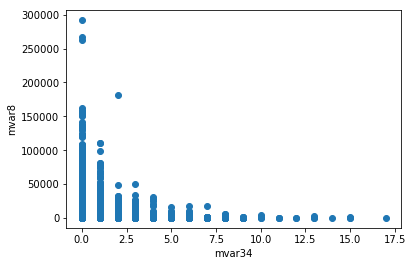

Correlation: -0.142274524606


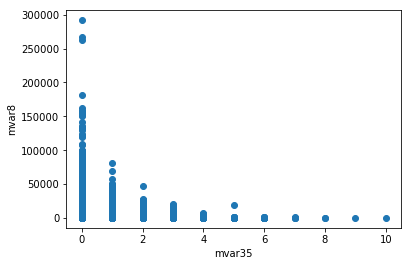

Correlation: -0.13794894206


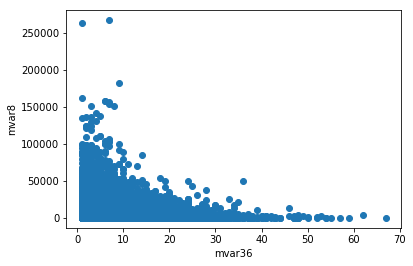

Correlation: -0.174551575934


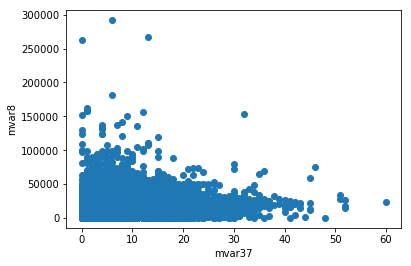

Correlation: 0.348711552376


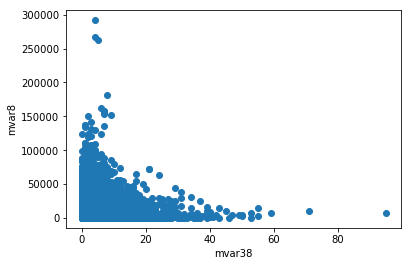

Correlation: -0.129941627219


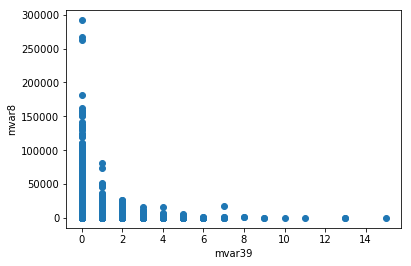

Correlation: -0.10304146547


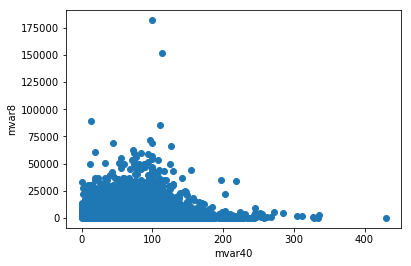

Correlation: -0.235222266735


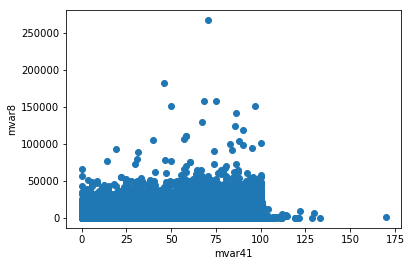

Correlation: -0.154866972566


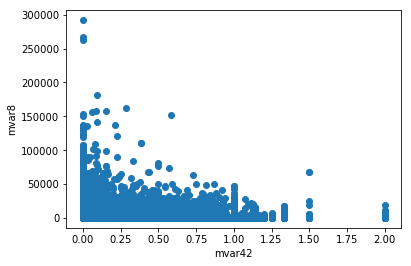

Correlation: -0.356204733426


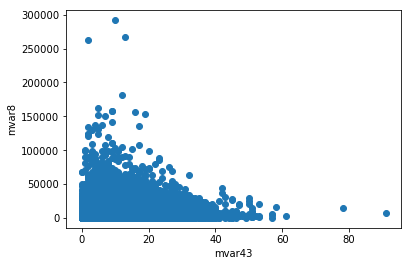

Correlation: 0.186342825183


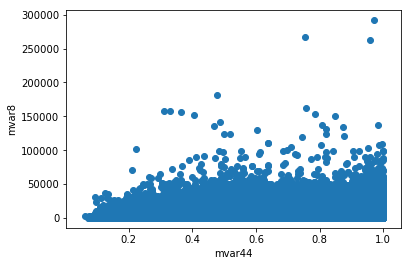

Correlation: 0.0893214036095


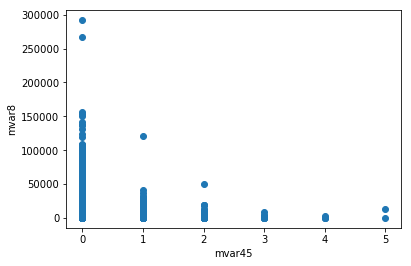

Correlation: -0.121915761956


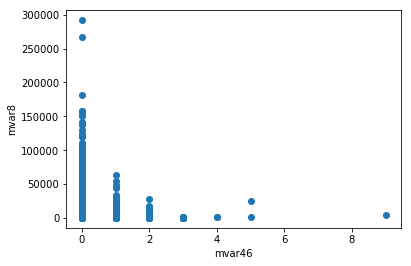

Correlation: -0.109787382461


In [34]:
v1 = 8
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

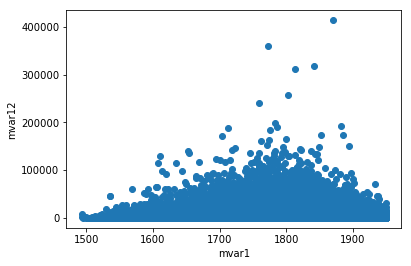

Correlation: 0.114491416909


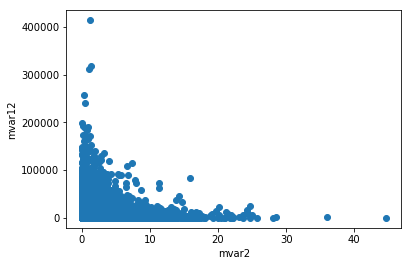

Correlation: -0.0220395376487


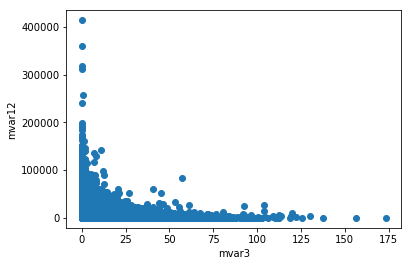

Correlation: -0.143968143036


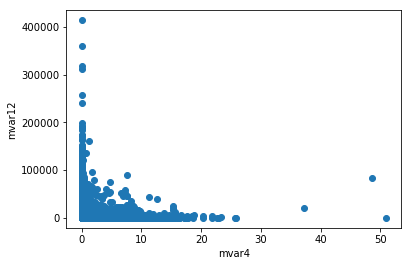

Correlation: -0.0731010364272


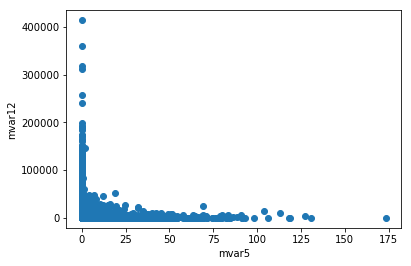

Correlation: -0.0624613332471


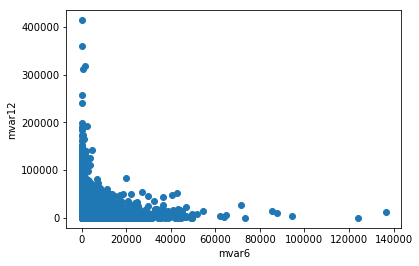

Correlation: -0.0613665976028


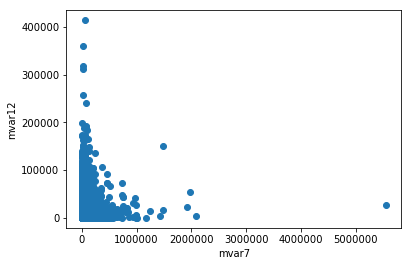

Correlation: 0.118573479977


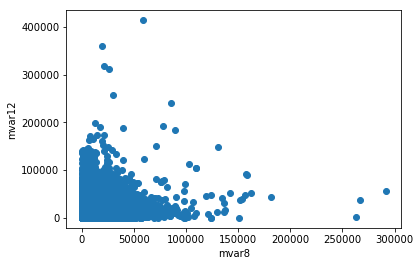

Correlation: 0.176644743731


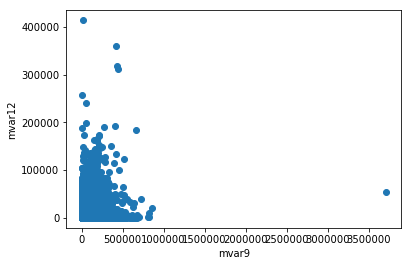

Correlation: 0.316053614668


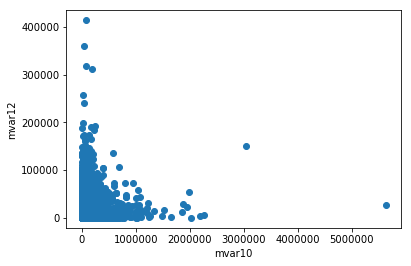

Correlation: 0.184173869377


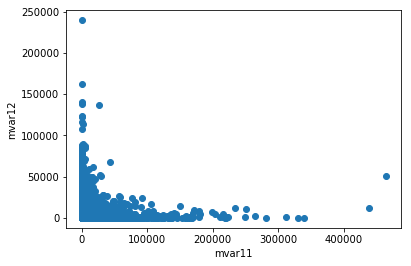

Correlation: -0.0390026475444


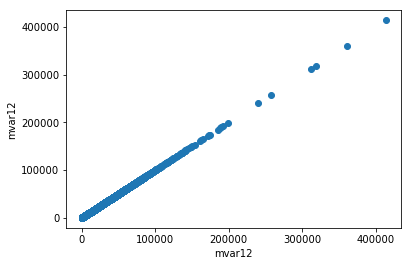

Correlation: 1.0


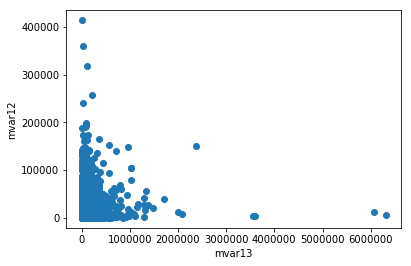

Correlation: 0.218782642293


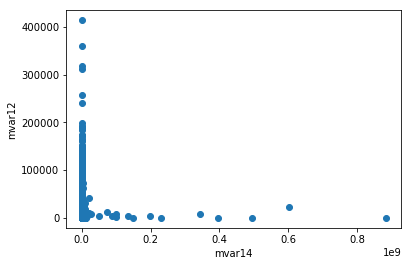

Correlation: 0.00187499340036


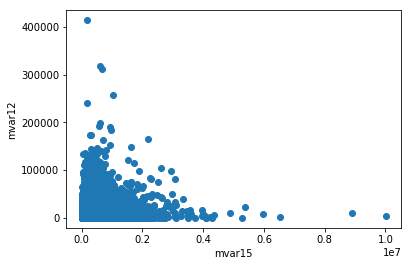

Correlation: 0.111554119093


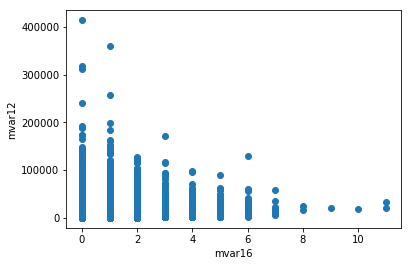

Correlation: 0.113976451865


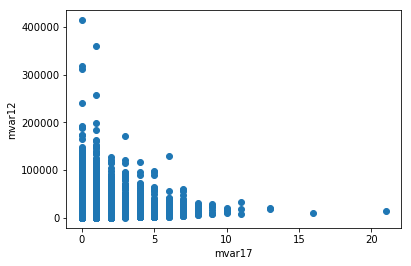

Correlation: 0.124437289436


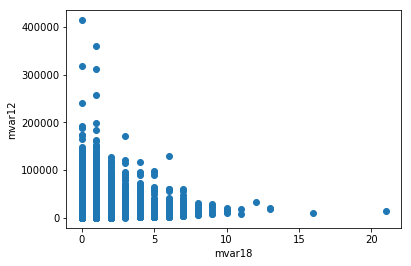

Correlation: 0.128769448107


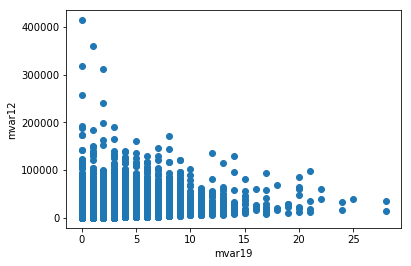

Correlation: 0.363060528535


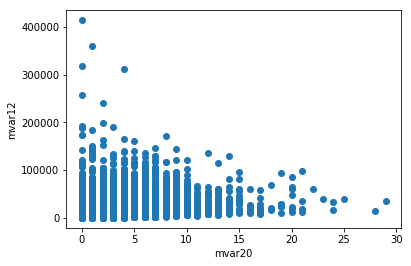

Correlation: 0.375818150573


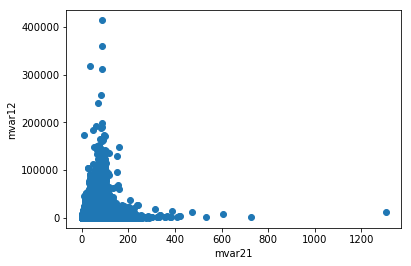

Correlation: 0.160584166036


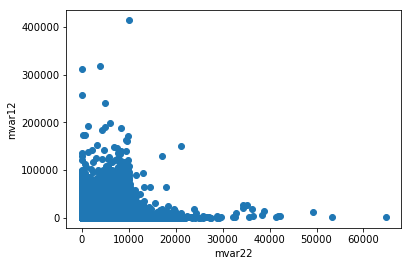

Correlation: 0.100828458694


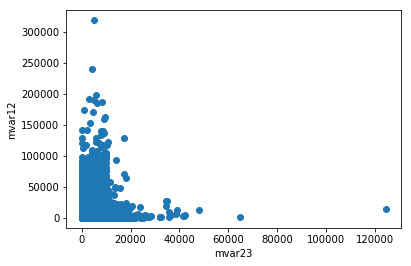

Correlation: 0.0799639555183


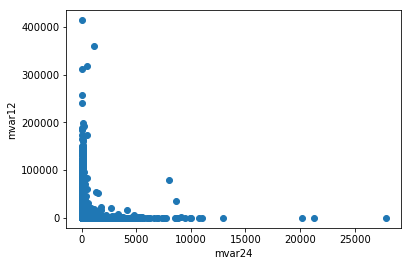

Correlation: -0.0152370994064


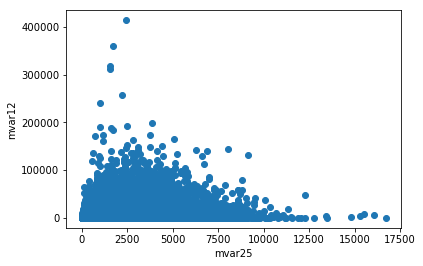

Correlation: 0.198631968042


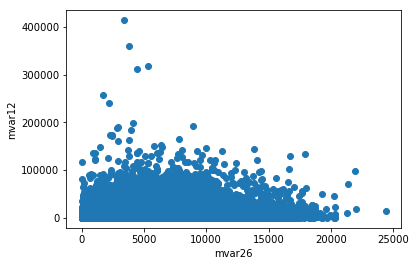

Correlation: 0.247340259562


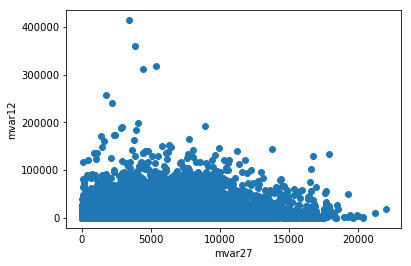

Correlation: 0.25325228757


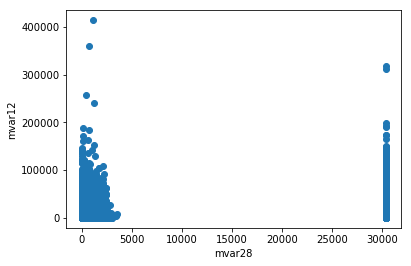

Correlation: 0.115950945007


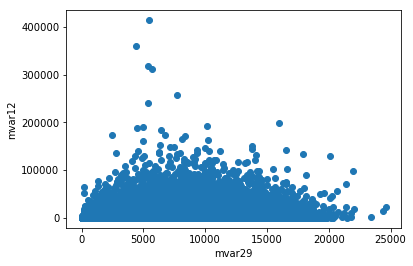

Correlation: 0.193844542975


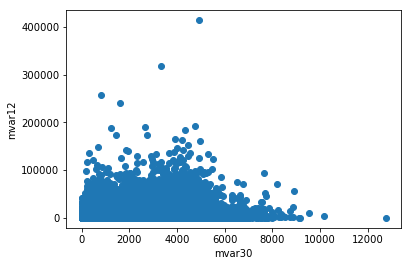

Correlation: 0.0841333260938


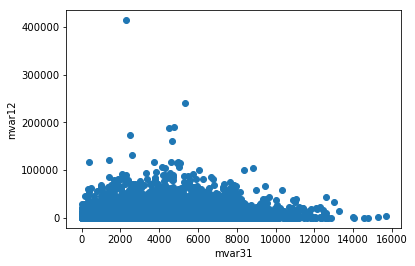

Correlation: 0.0809201437168


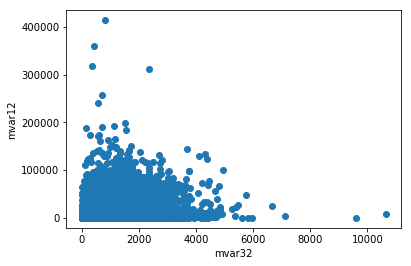

Correlation: 0.338216627325


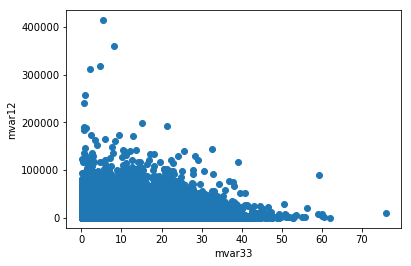

Correlation: 0.0792240918858


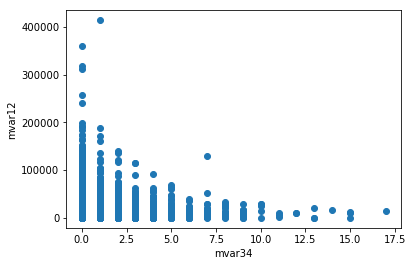

Correlation: 0.0184638742558


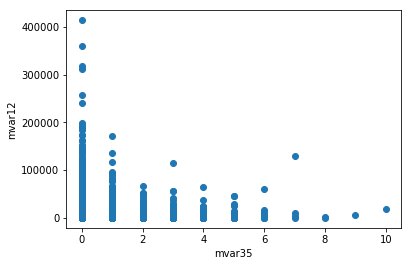

Correlation: -0.0622284364402


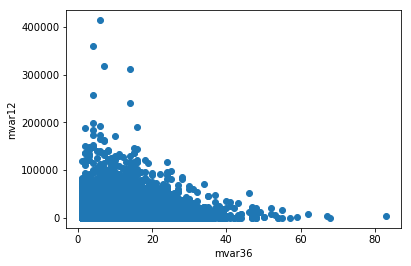

Correlation: 0.198053685493


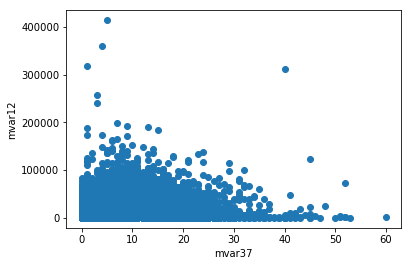

Correlation: 0.261260513316


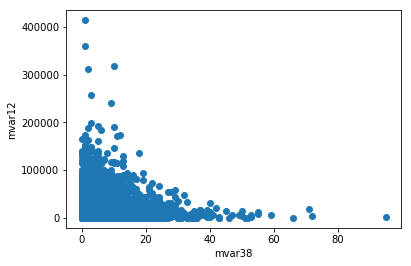

Correlation: 0.05901776064


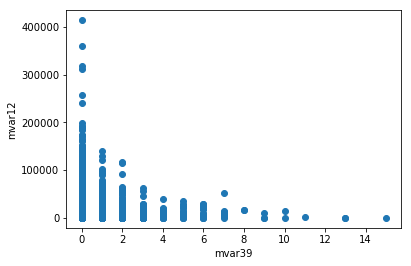

Correlation: -0.00810735117705


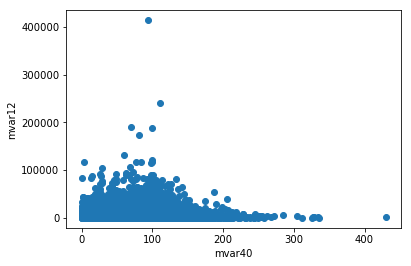

Correlation: -0.157484536479


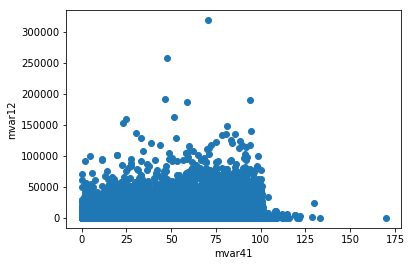

Correlation: -0.097831065001


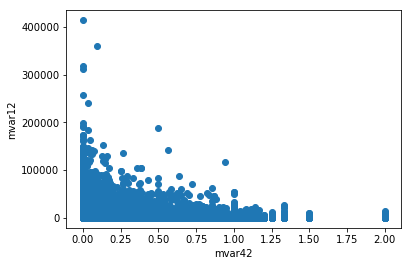

Correlation: -0.265869819278


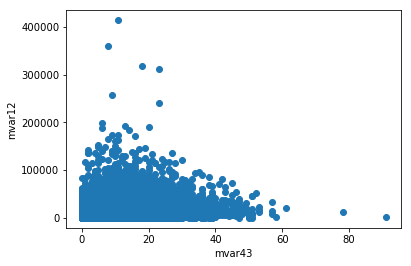

Correlation: 0.339211967799


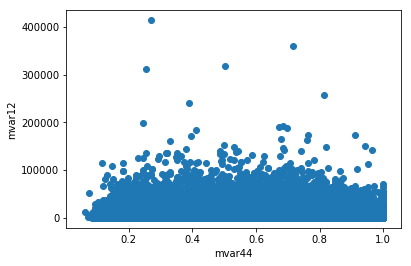

Correlation: -0.224707457219


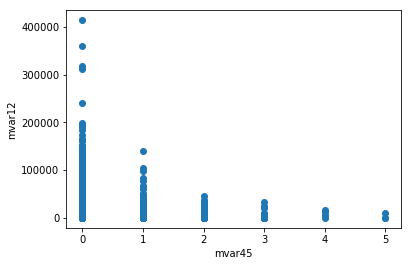

Correlation: -0.0643166176951


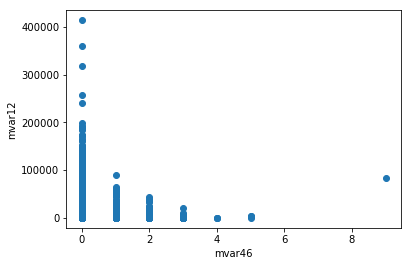

Correlation: -0.0845804243036


In [35]:
v1 = 12
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

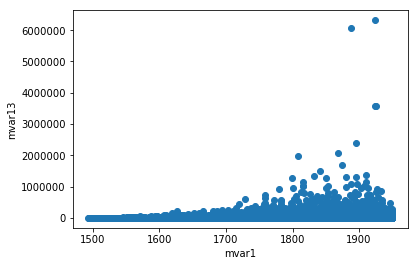

Correlation: 0.226077632425


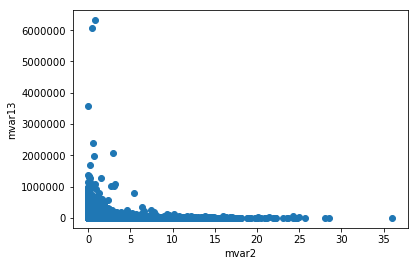

Correlation: -0.0671674055916


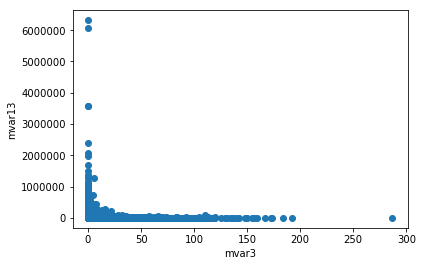

Correlation: -0.10147088523


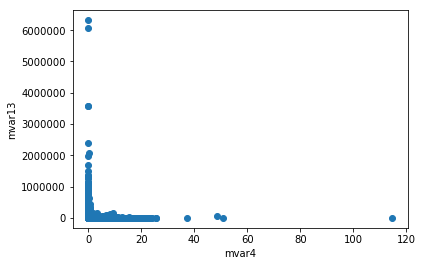

Correlation: -0.0594664482958


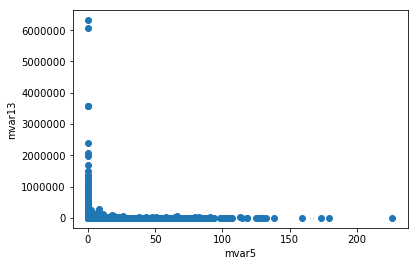

Correlation: -0.0433504624984


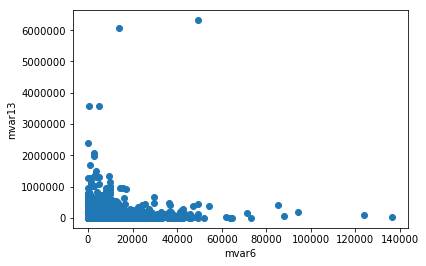

Correlation: 0.165493062881


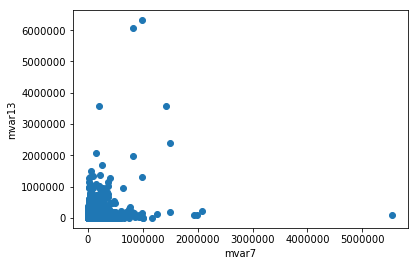

Correlation: 0.311259927338


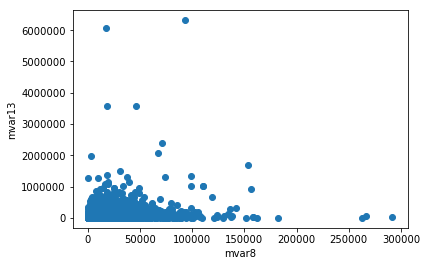

Correlation: 0.31810368734


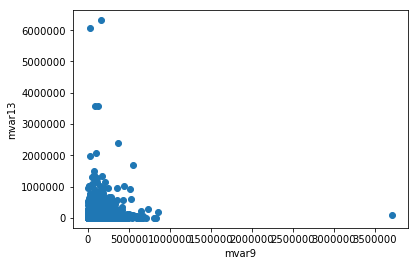

Correlation: 0.247445067901


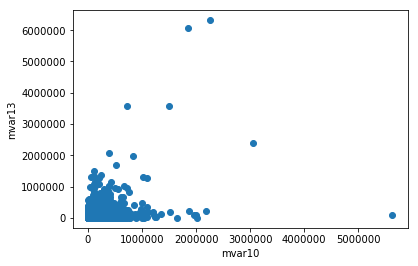

Correlation: 0.411443057686


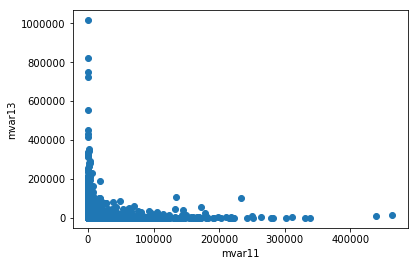

Correlation: -0.0351274924347


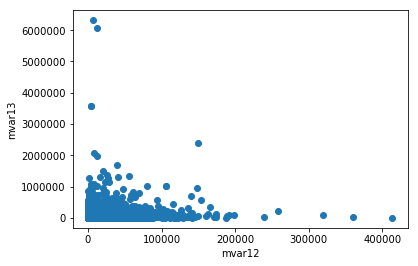

Correlation: 0.218782642293


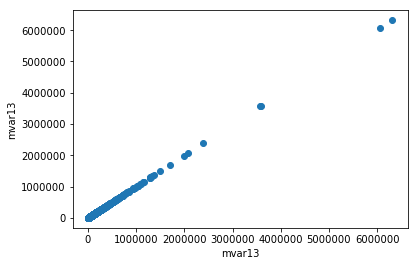

Correlation: 1.0


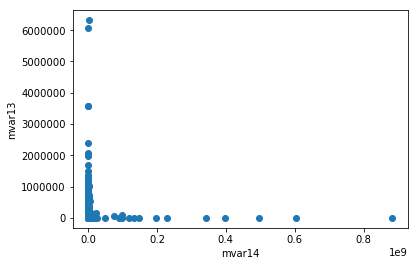

Correlation: 0.00273980769966


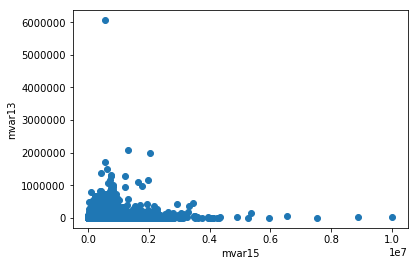

Correlation: 0.165404725234


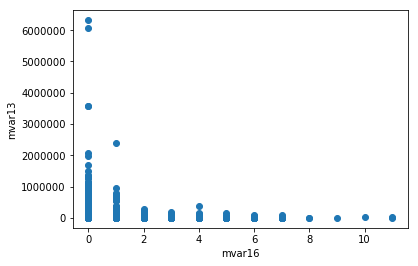

Correlation: -0.0372892722235


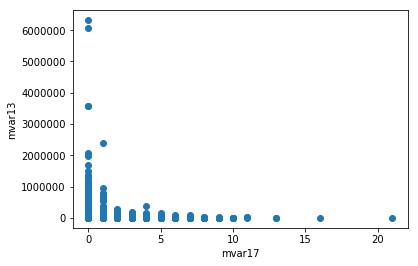

Correlation: -0.0363065913385


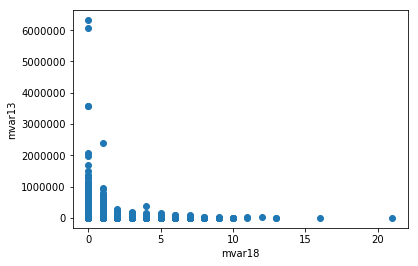

Correlation: -0.0310411495873


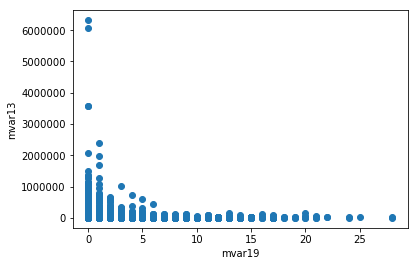

Correlation: -0.0180604657371


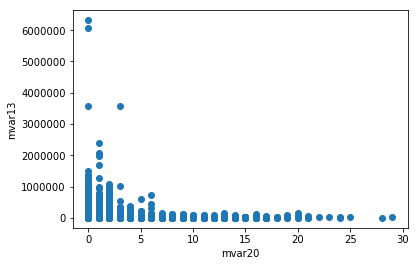

Correlation: -0.00155721956253


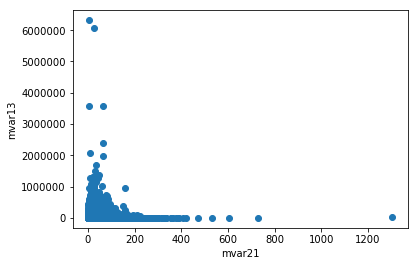

Correlation: -0.133376117753


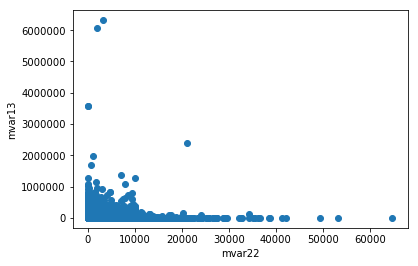

Correlation: -0.085147011508


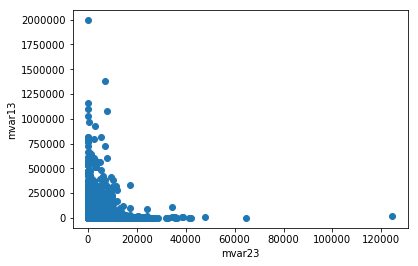

Correlation: -0.140553977068


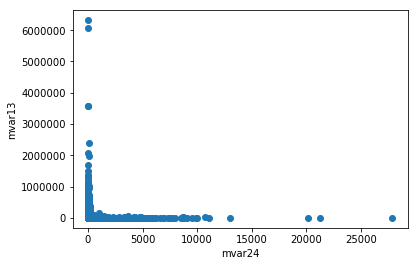

Correlation: -0.0332031429587


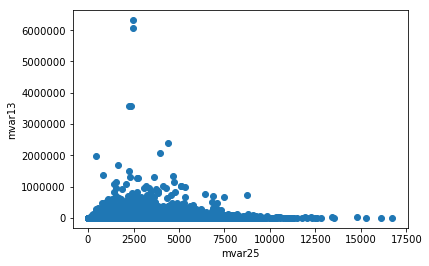

Correlation: 0.15180818622


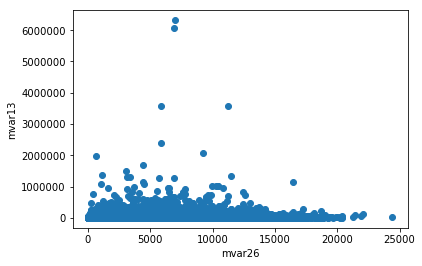

Correlation: 0.173350818149


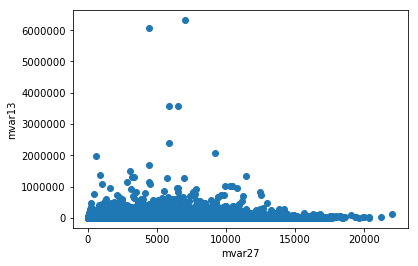

Correlation: 0.17887001223


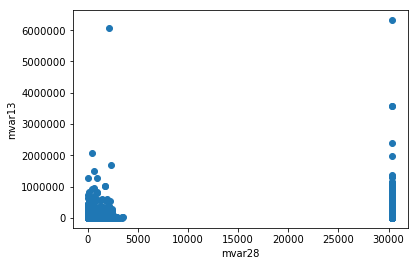

Correlation: 0.153032039808


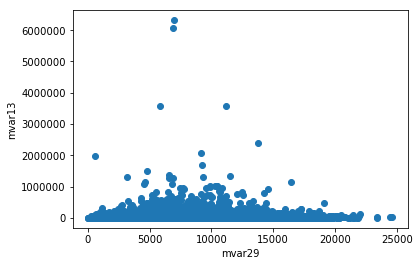

Correlation: 0.147508693628


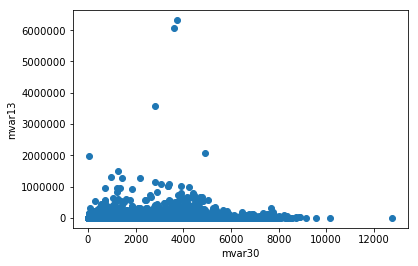

Correlation: 0.0476630036585


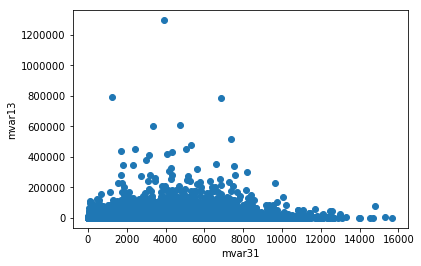

Correlation: 0.0906010825669


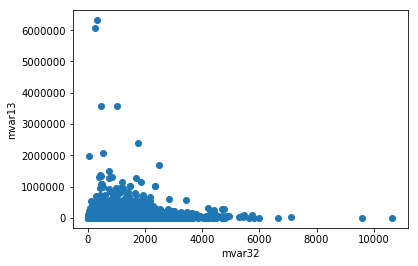

Correlation: 0.196818121803


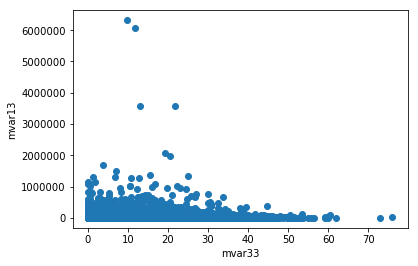

Correlation: 0.0859818161831


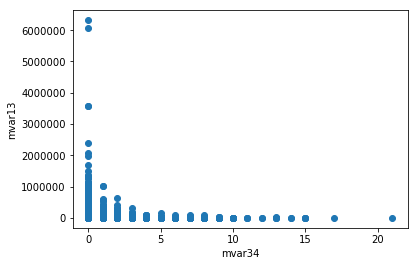

Correlation: -0.0335651618821


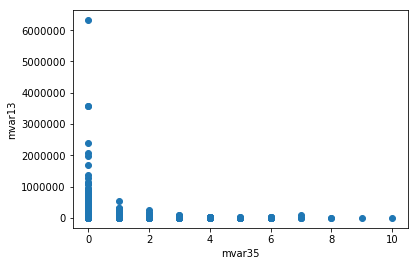

Correlation: -0.0633103124902


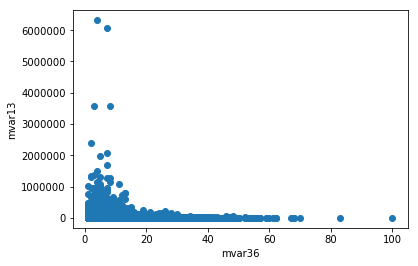

Correlation: -0.0228643119521


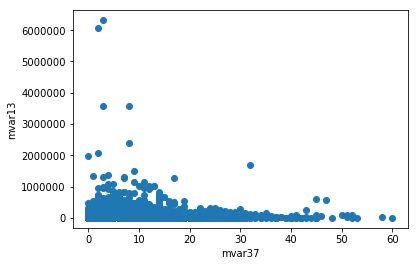

Correlation: 0.153495237995


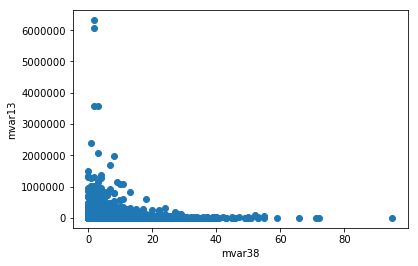

Correlation: -0.0292746004742


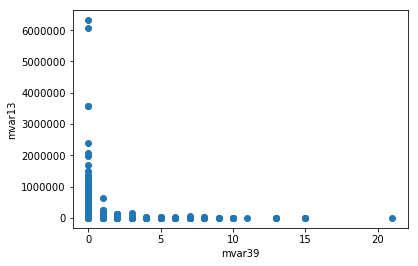

Correlation: -0.0344819914845


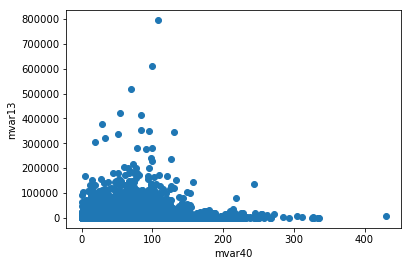

Correlation: -0.184726074784


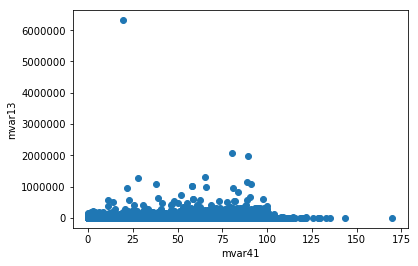

Correlation: -0.0726110821425


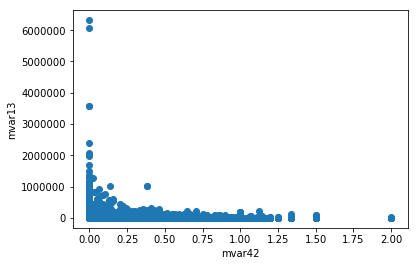

Correlation: -0.176591567555


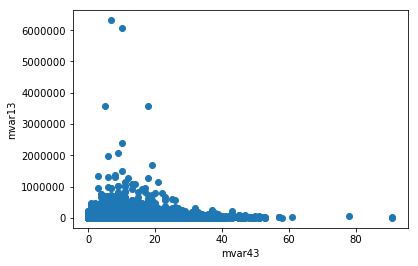

Correlation: 0.142768831424


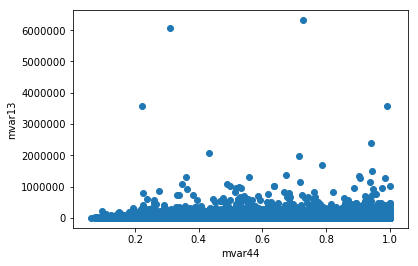

Correlation: -0.0290144032988


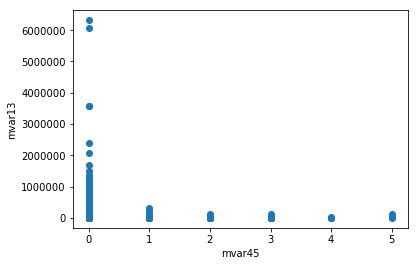

Correlation: -0.0542733373368


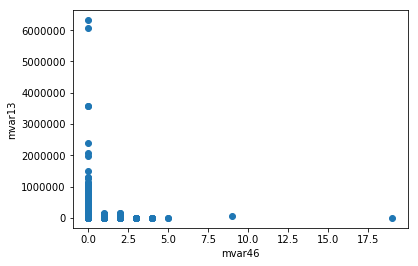

Correlation: -0.0611394448345


In [36]:
v1 = 13
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

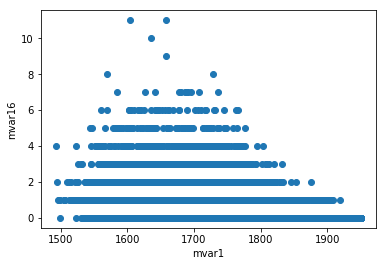

Correlation: -0.361808316259


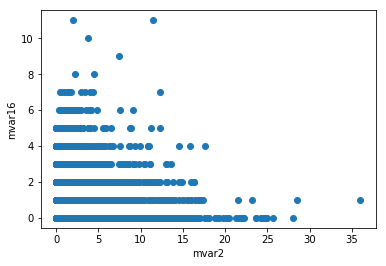

Correlation: 0.15266419547


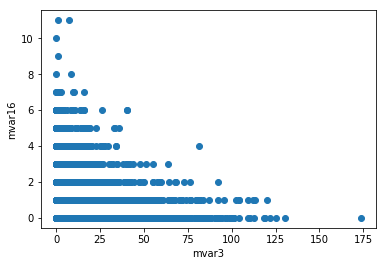

Correlation: 0.109097986721


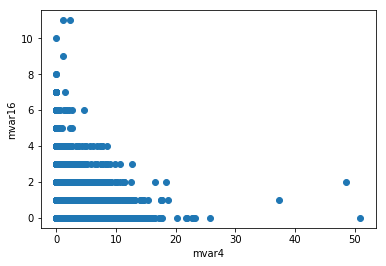

Correlation: 0.0667662087002


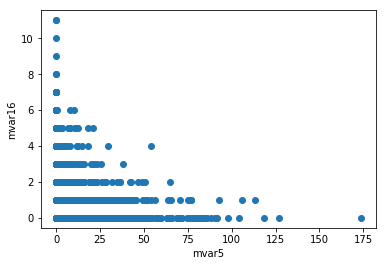

Correlation: 0.0378137272441


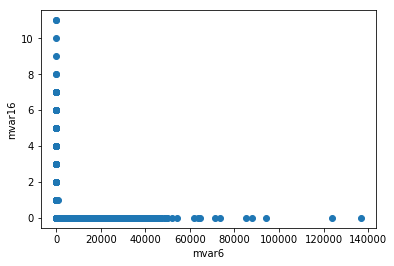

Correlation: -0.162081461645


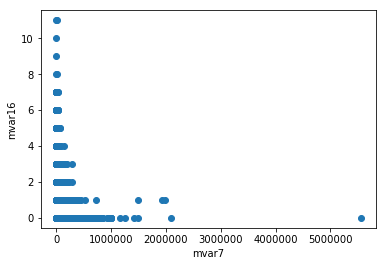

Correlation: -0.0650335374707


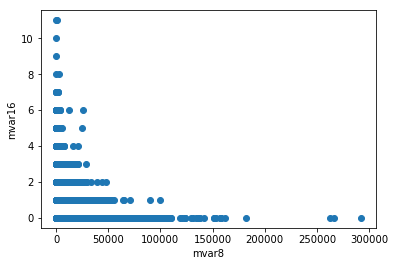

Correlation: -0.18169763121


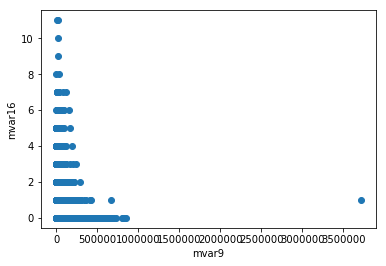

Correlation: -0.113054438829


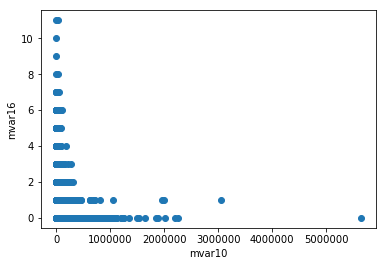

Correlation: -0.0992759948323


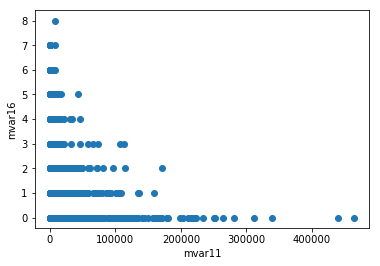

Correlation: -0.00706353233311


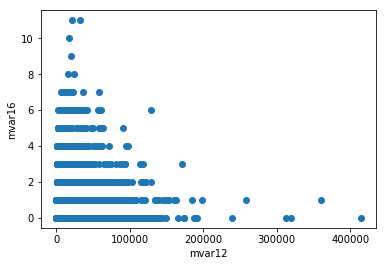

Correlation: 0.113976451865


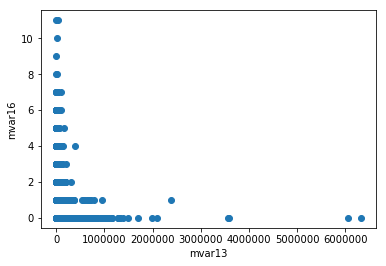

Correlation: -0.0372892722235


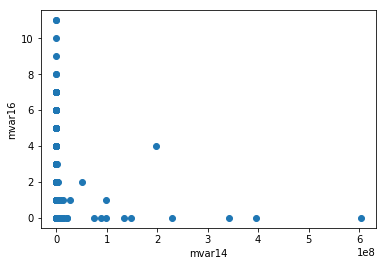

Correlation: 0.00132310134007


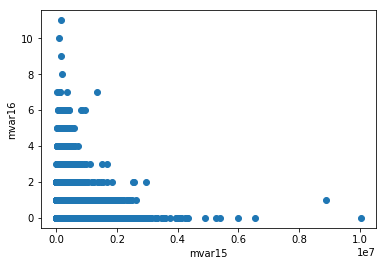

Correlation: -0.0644680402966


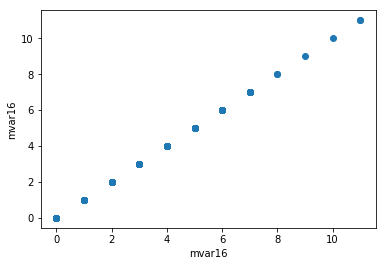

Correlation: 1.0


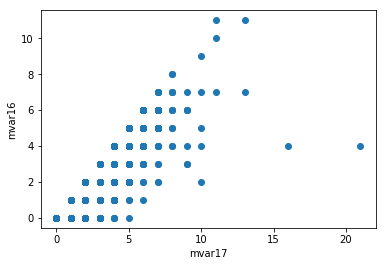

Correlation: 0.938673320267


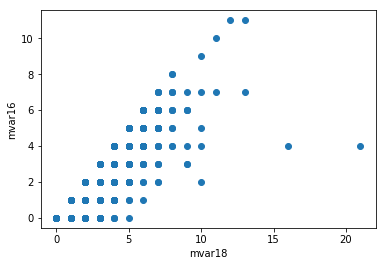

Correlation: 0.930928052792


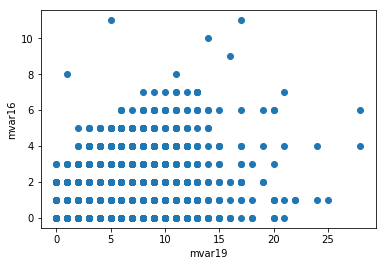

Correlation: 0.503073739044


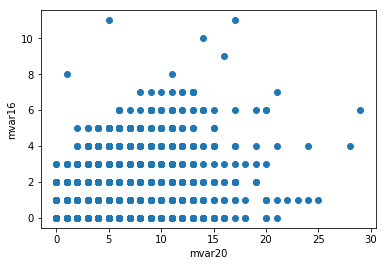

Correlation: 0.495493991726


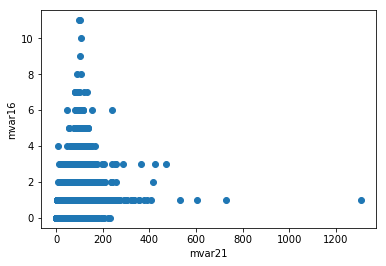

Correlation: 0.430862791847


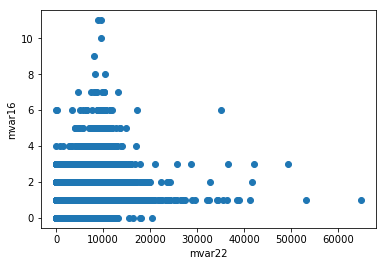

Correlation: 0.407560041515


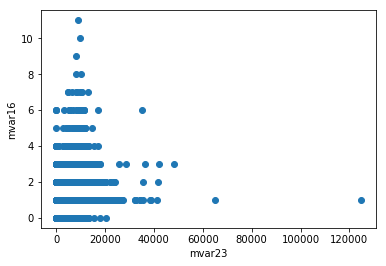

Correlation: 0.381647955524


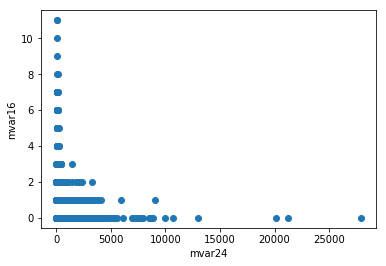

Correlation: 0.0588983008153


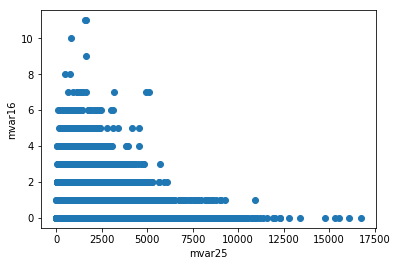

Correlation: -0.116144401964


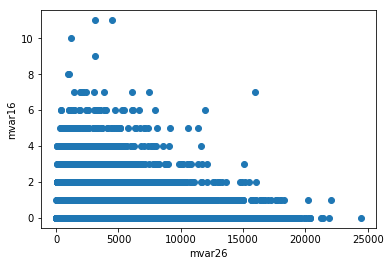

Correlation: -0.0947268735342


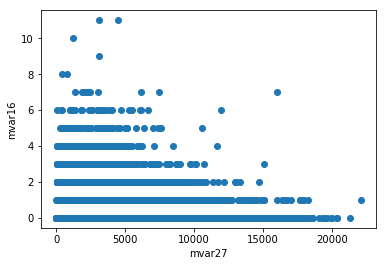

Correlation: -0.0964497608294


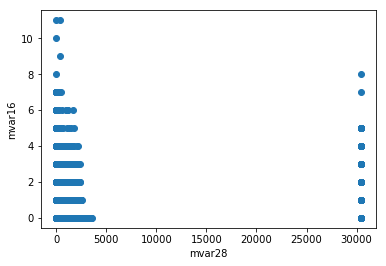

Correlation: -0.165938350147


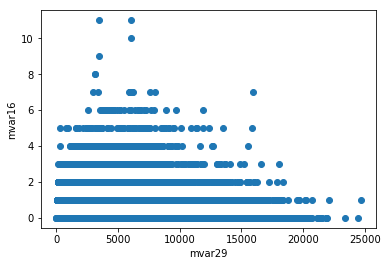

Correlation: -0.0834236432707


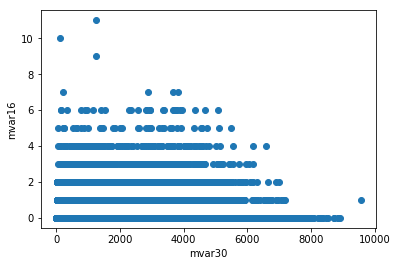

Correlation: -0.0560464656455


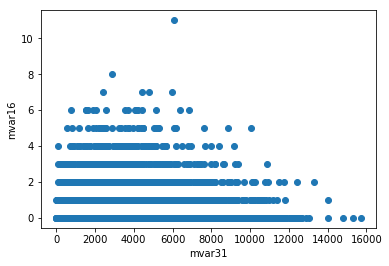

Correlation: -0.03803970936


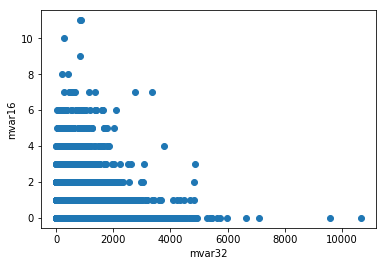

Correlation: -0.0713256882884


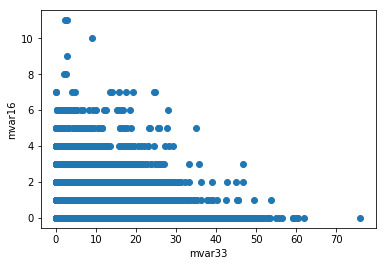

Correlation: -0.0633391937257


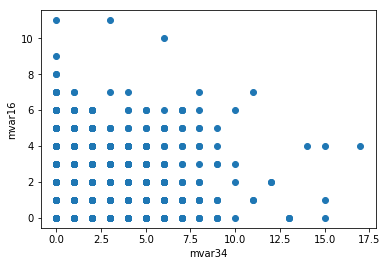

Correlation: 0.305125271135


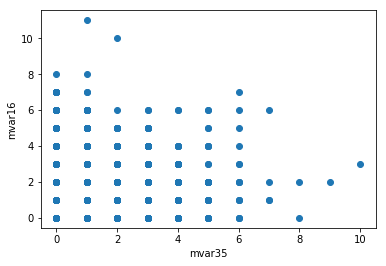

Correlation: 0.314357034007


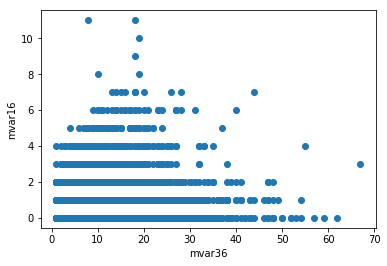

Correlation: 0.234095477277


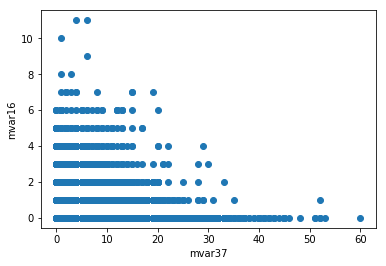

Correlation: -0.0751785852772


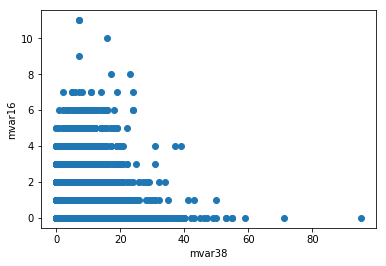

Correlation: 0.159043499001


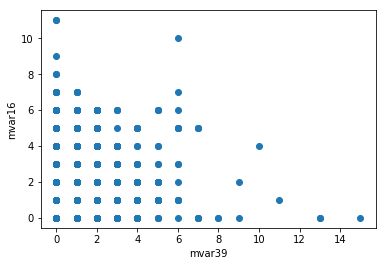

Correlation: 0.278722853592


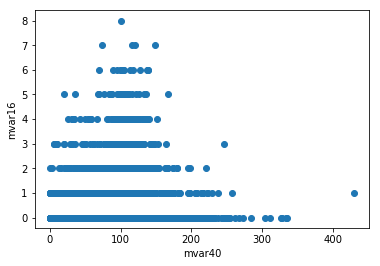

Correlation: 0.0797175915125


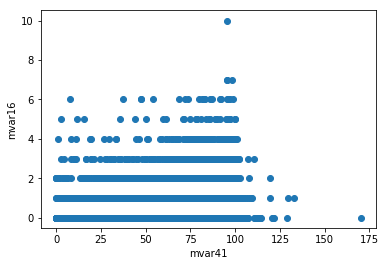

Correlation: 0.0492611128839


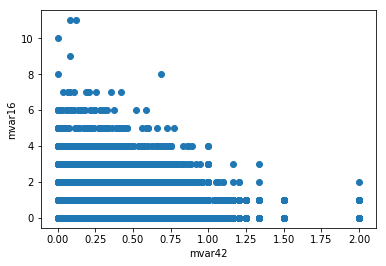

Correlation: 0.117762428421


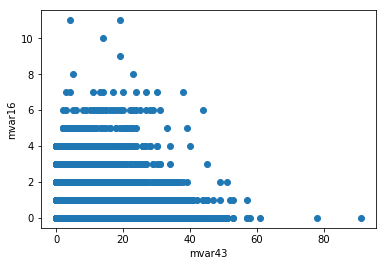

Correlation: 0.0180042252297


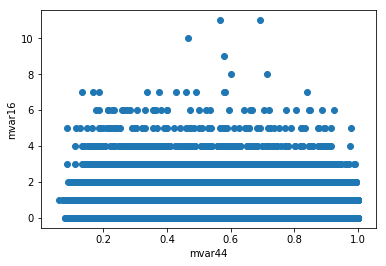

Correlation: -0.162049585572


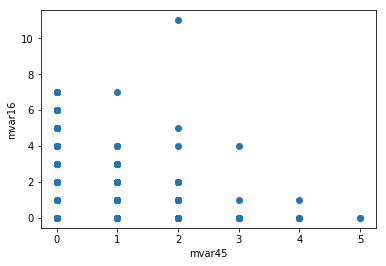

Correlation: 0.0728382136181


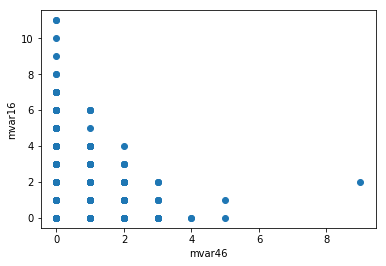

Correlation: 0.0737387803109


In [37]:
v1 = 16
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

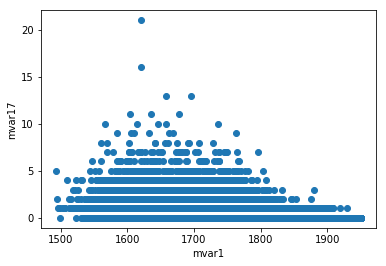

Correlation: -0.341212182504


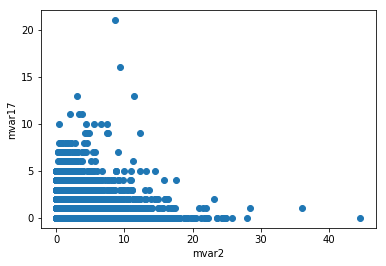

Correlation: 0.156583130951


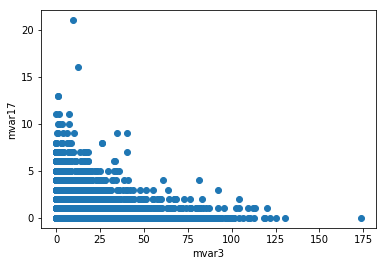

Correlation: 0.0970161291969


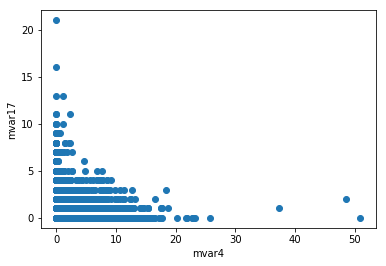

Correlation: 0.0558871993865


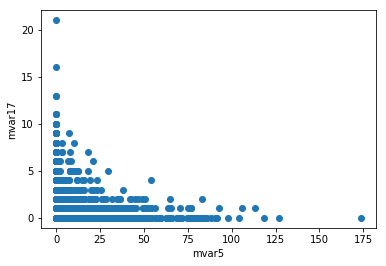

Correlation: 0.0300544467312


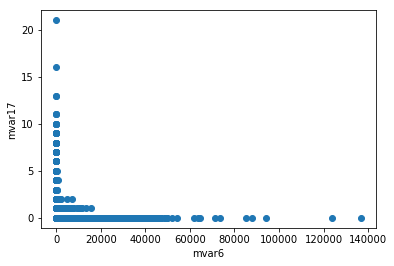

Correlation: -0.161176759935


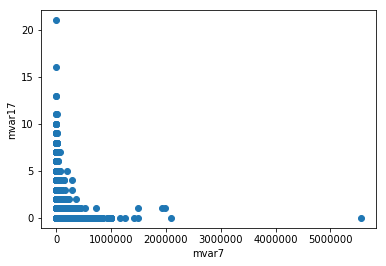

Correlation: -0.0634266241671


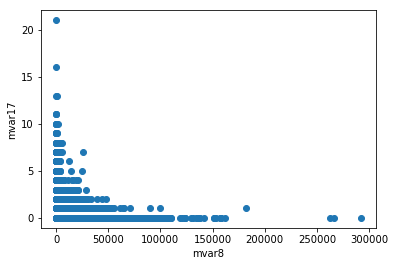

Correlation: -0.182309675805


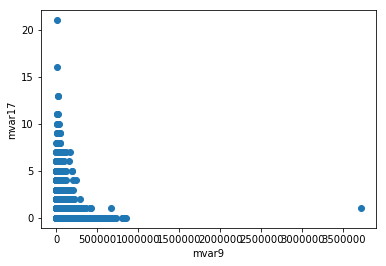

Correlation: -0.106395930995


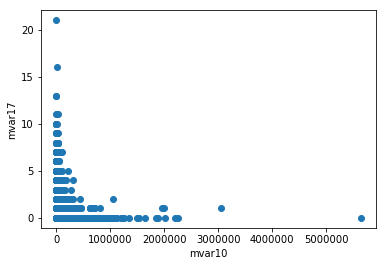

Correlation: -0.0944689880399


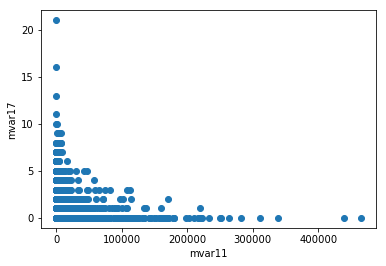

Correlation: -0.0140860906317


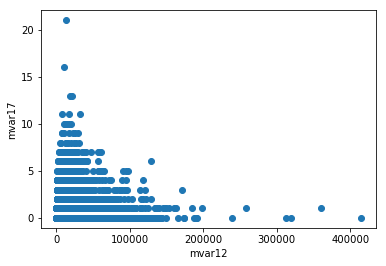

Correlation: 0.124437289436


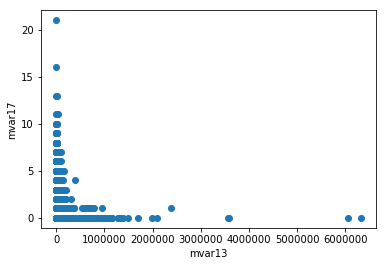

Correlation: -0.0363065913385


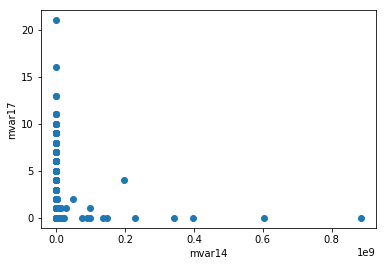

Correlation: -0.000815168591843


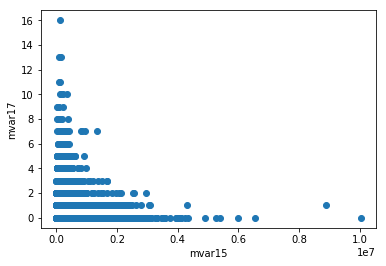

Correlation: -0.063306595563


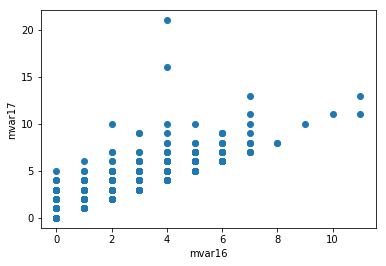

Correlation: 0.938673320267


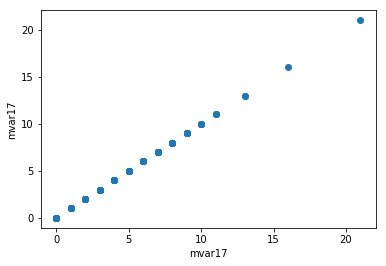

Correlation: 1.0


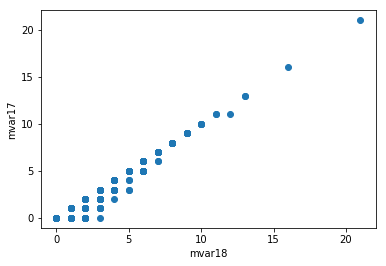

Correlation: 0.990621368887


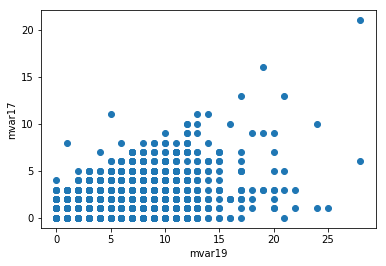

Correlation: 0.565904992676


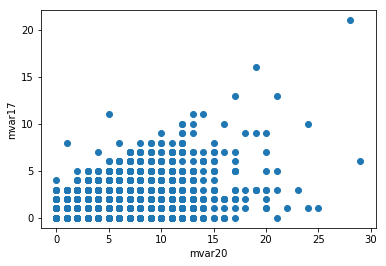

Correlation: 0.556615139286


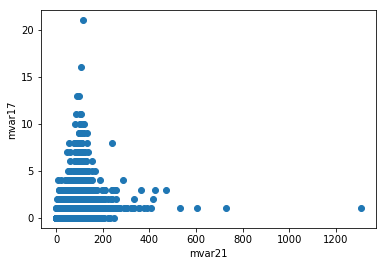

Correlation: 0.413508167447


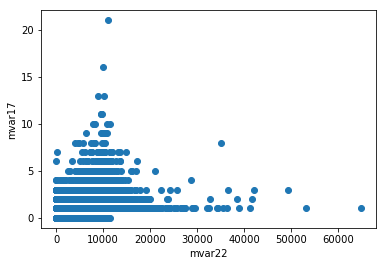

Correlation: 0.398416599497


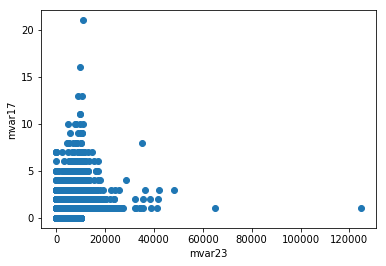

Correlation: 0.372883097247


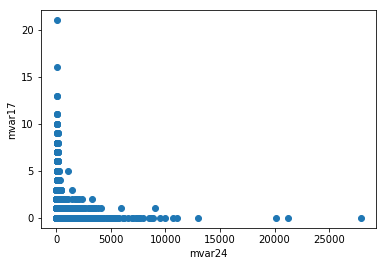

Correlation: 0.0502349426206


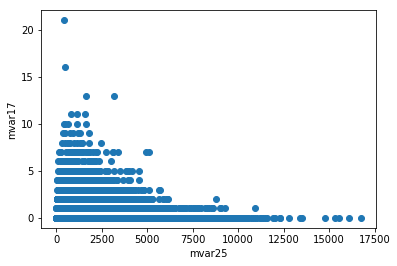

Correlation: -0.116993422186


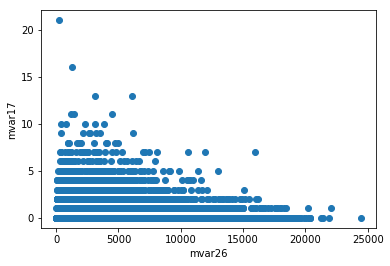

Correlation: -0.085647729406


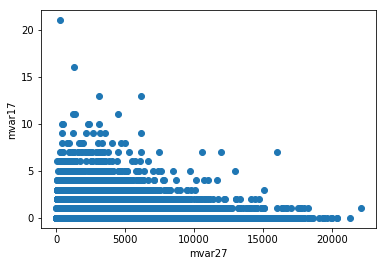

Correlation: -0.0949733815718


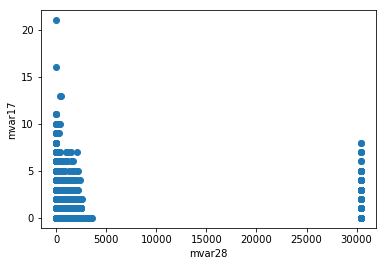

Correlation: -0.161869979541


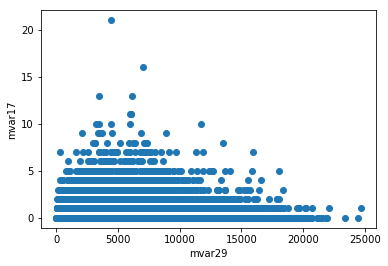

Correlation: -0.076108077298


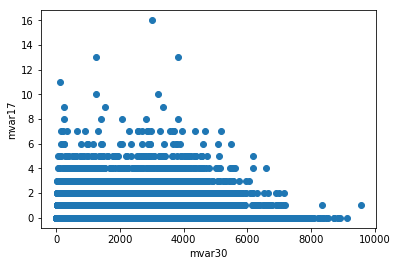

Correlation: -0.0554043758055


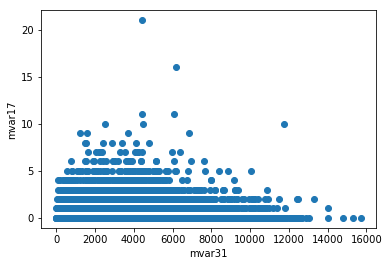

Correlation: -0.0352534208436


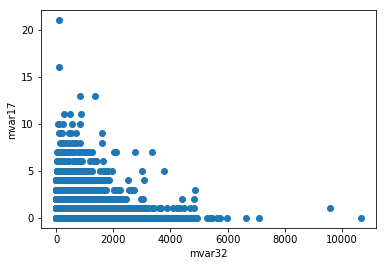

Correlation: -0.0654522263447


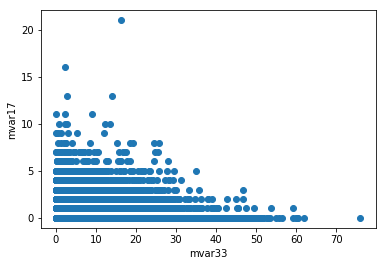

Correlation: -0.0575577305641


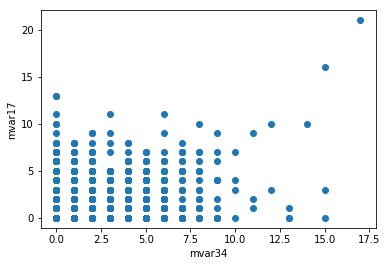

Correlation: 0.344029913148


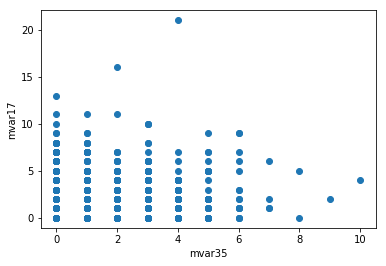

Correlation: 0.308606980702


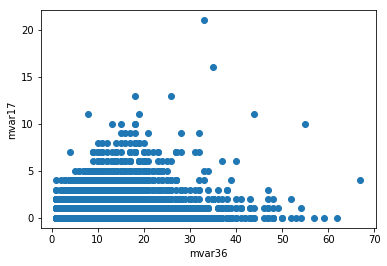

Correlation: 0.267143251641


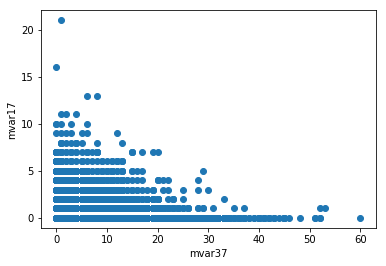

Correlation: -0.0711228182491


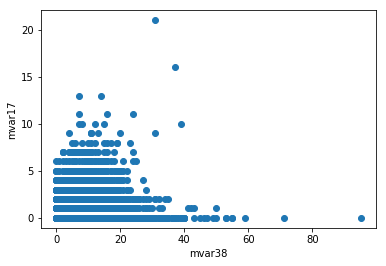

Correlation: 0.193091145208


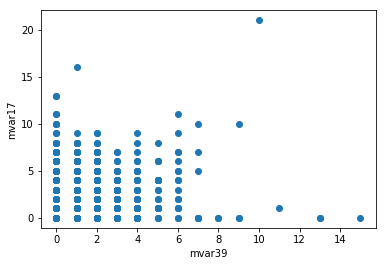

Correlation: 0.303510319532


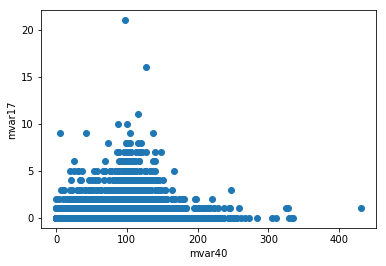

Correlation: 0.0727203176745


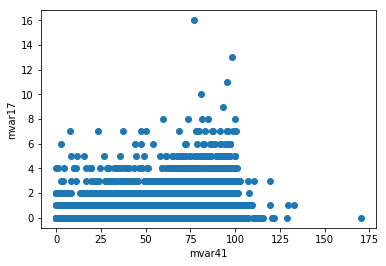

Correlation: 0.0475787703241


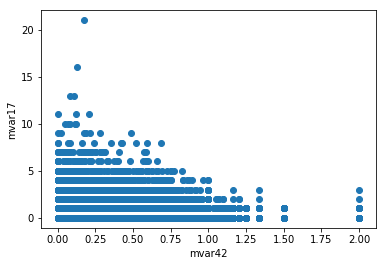

Correlation: 0.0916649347011


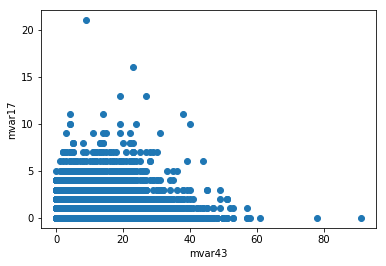

Correlation: 0.0545764496645


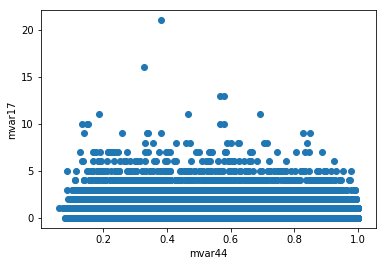

Correlation: -0.174534161372


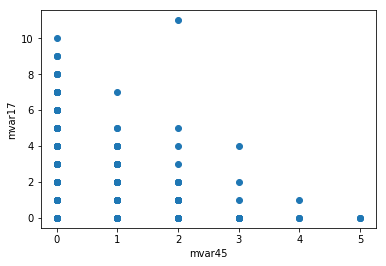

Correlation: 0.0636606992491


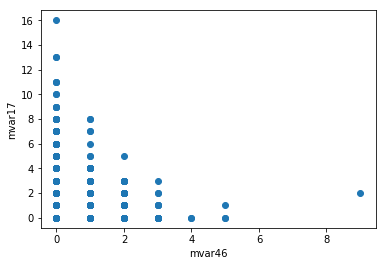

Correlation: 0.0619606537948


In [38]:
v1 = 17
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

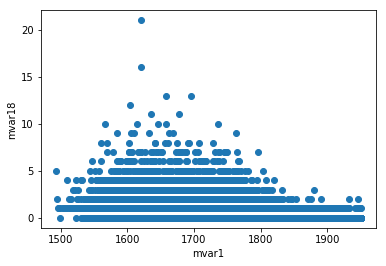

Correlation: -0.332662661592


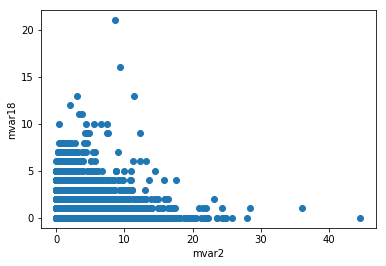

Correlation: 0.156217818972


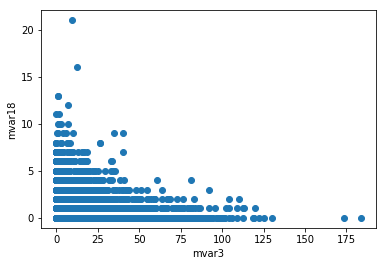

Correlation: 0.0927142250257


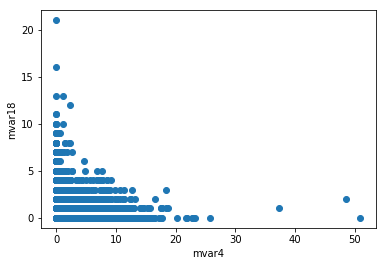

Correlation: 0.053786815506


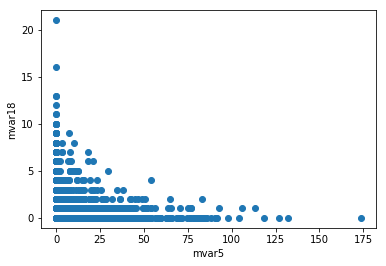

Correlation: 0.0272996188083


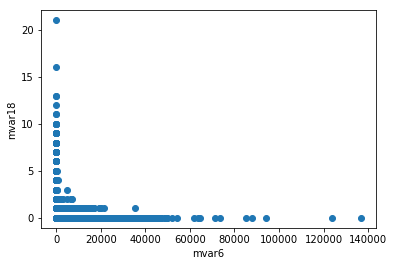

Correlation: -0.160090961323


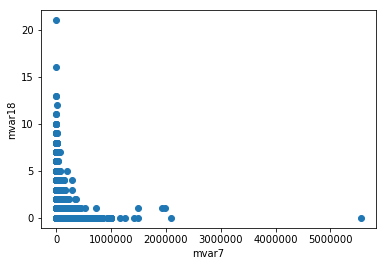

Correlation: -0.0600138509528


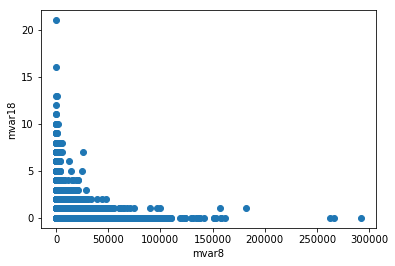

Correlation: -0.179702747307


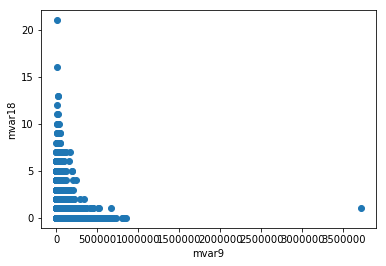

Correlation: -0.101027381609


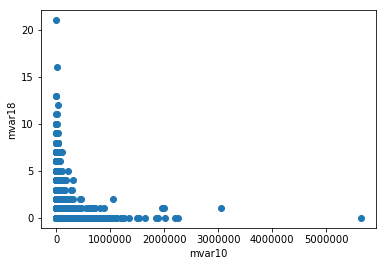

Correlation: -0.0887429048925


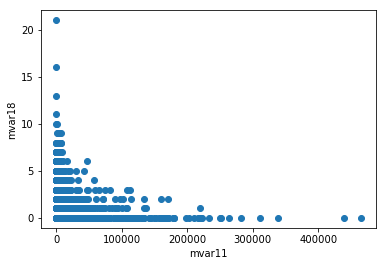

Correlation: -0.012528508271


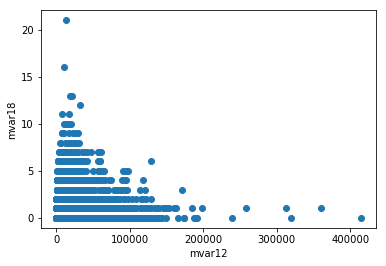

Correlation: 0.128769448107


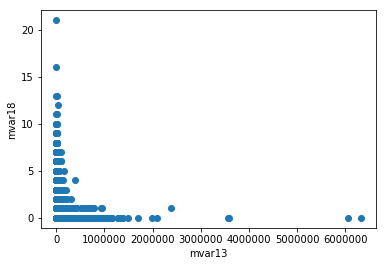

Correlation: -0.0310411495873


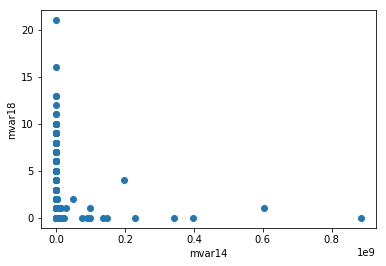

Correlation: 0.0017571624499


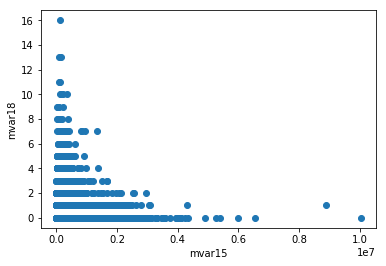

Correlation: -0.0599608031377


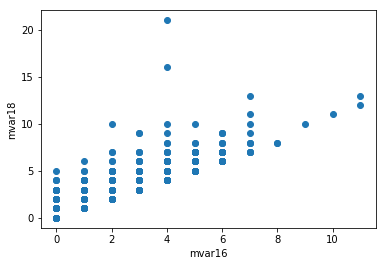

Correlation: 0.930928052792


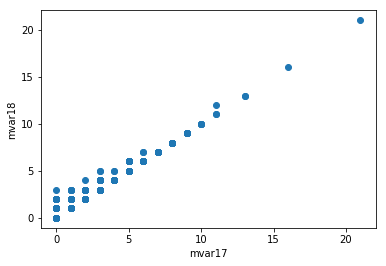

Correlation: 0.990621368887


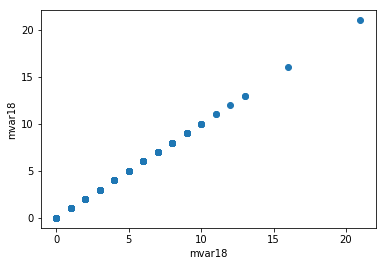

Correlation: 1.0


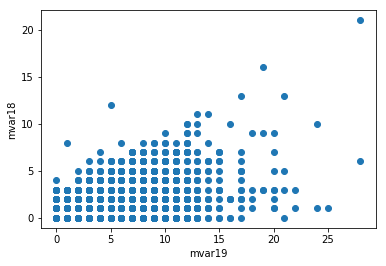

Correlation: 0.562892442756


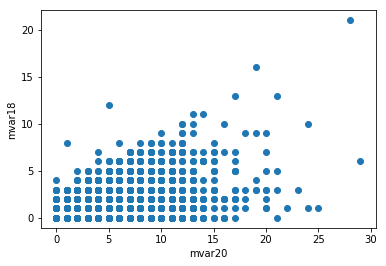

Correlation: 0.561258154938


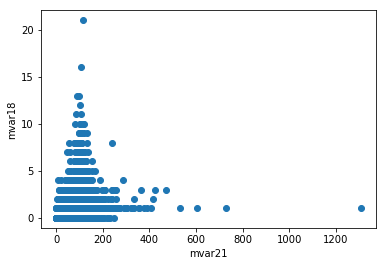

Correlation: 0.411805997274


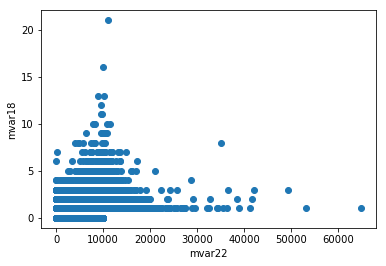

Correlation: 0.39713596684


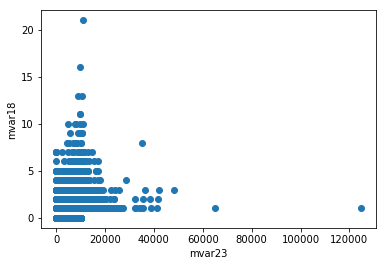

Correlation: 0.372461641226


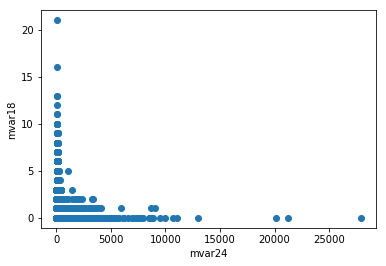

Correlation: 0.0503385758286


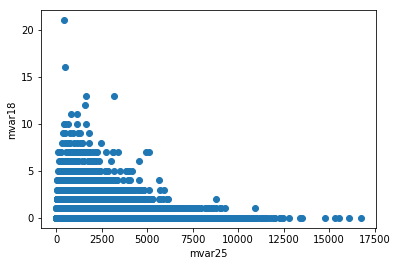

Correlation: -0.11262126338


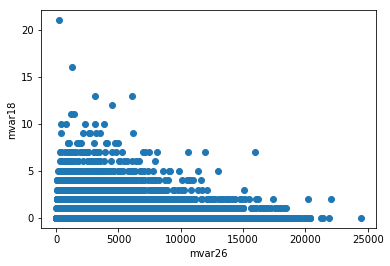

Correlation: -0.0811402337415


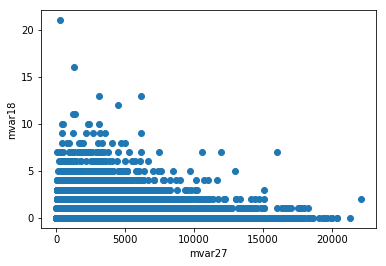

Correlation: -0.0896849240258


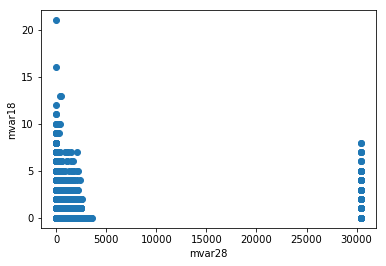

Correlation: -0.158545414295


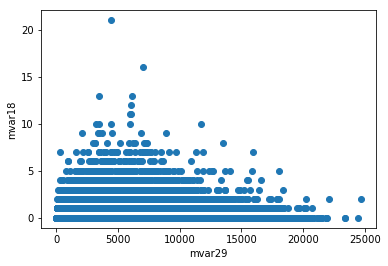

Correlation: -0.0704492114086


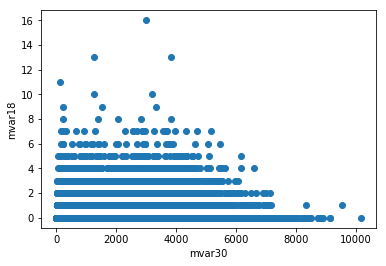

Correlation: -0.0537973384267


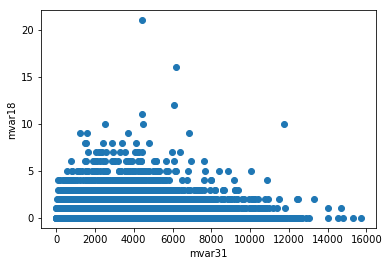

Correlation: -0.0344028626418


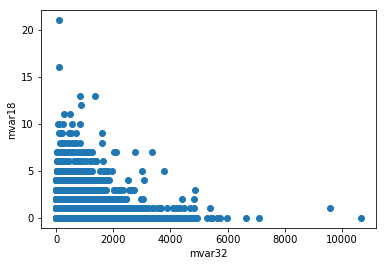

Correlation: -0.0602053984058


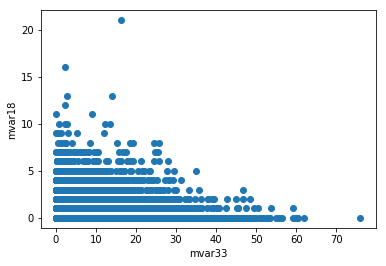

Correlation: -0.0536364202588


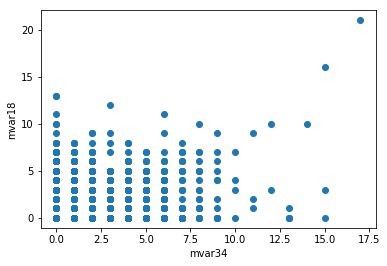

Correlation: 0.341185164453


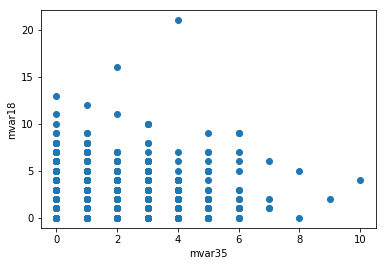

Correlation: 0.305100368657


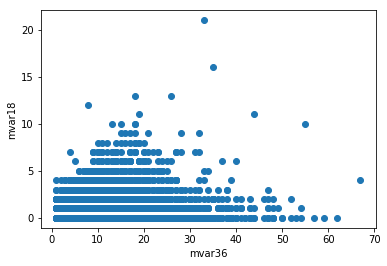

Correlation: 0.267287375351


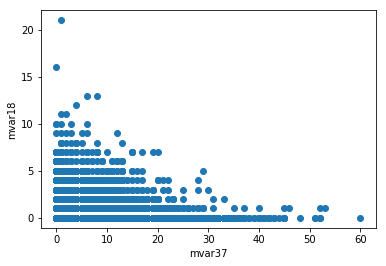

Correlation: -0.0660478229566


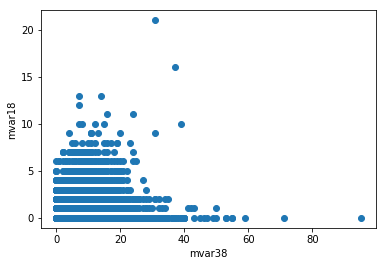

Correlation: 0.191886422211


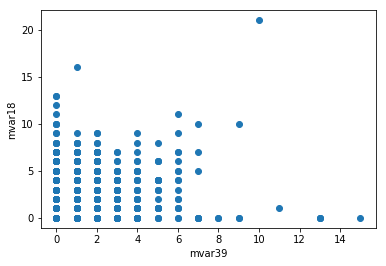

Correlation: 0.297221021432


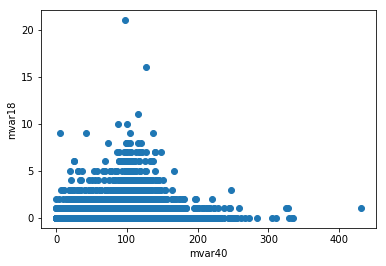

Correlation: 0.0709231430203


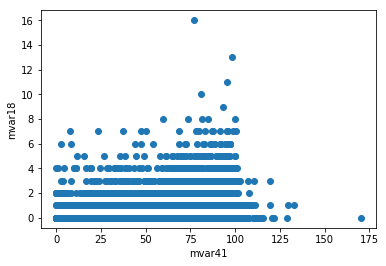

Correlation: 0.0454949318003


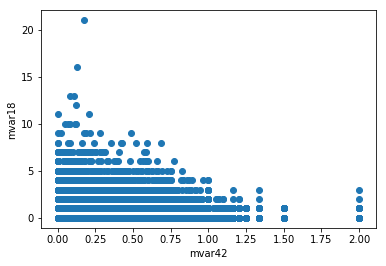

Correlation: 0.0814255002047


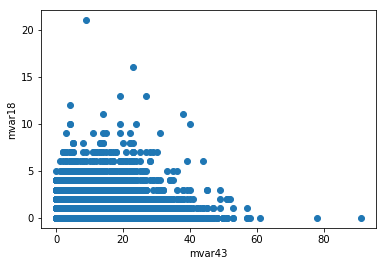

Correlation: 0.0604663531746


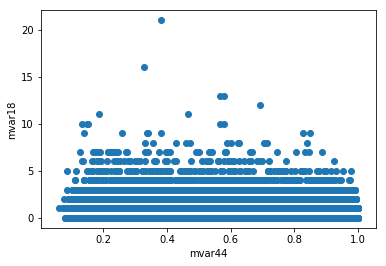

Correlation: -0.177650171119


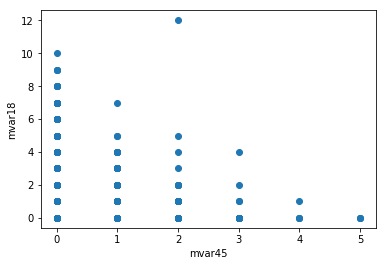

Correlation: 0.061590257059


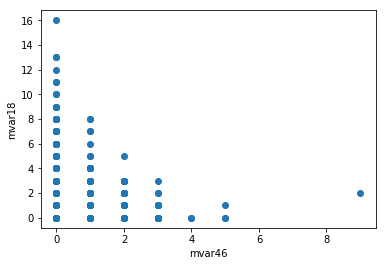

Correlation: 0.0595069175691


In [39]:
v1 = 18
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

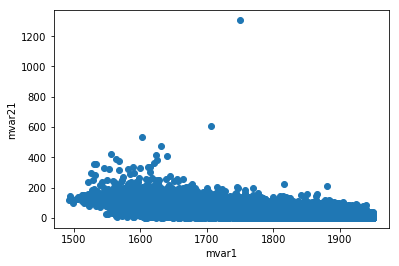

Correlation: -0.666369097674


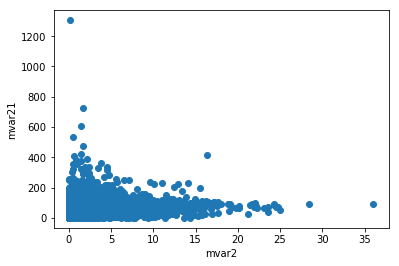

Correlation: 0.231543399248


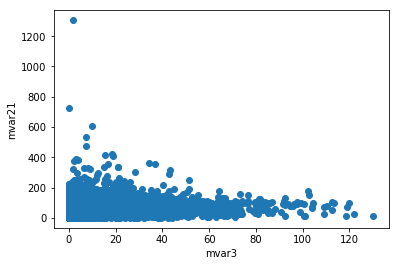

Correlation: 0.229255090278


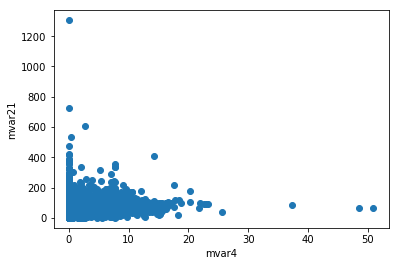

Correlation: 0.141211217709


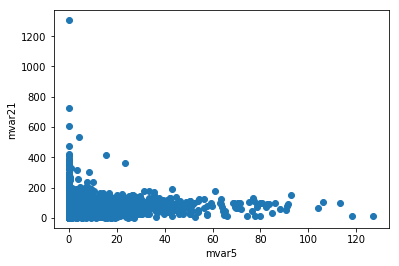

Correlation: 0.0923081602776


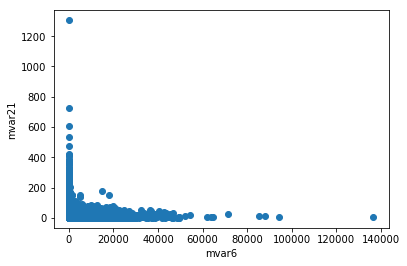

Correlation: -0.416423509677


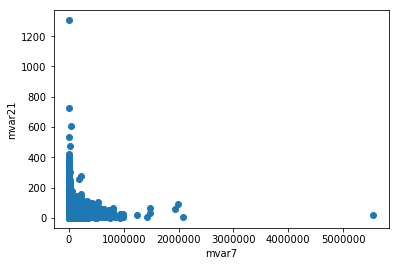

Correlation: -0.181757372972


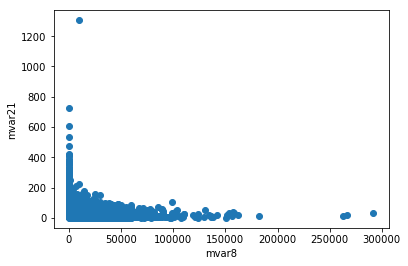

Correlation: -0.529806236064


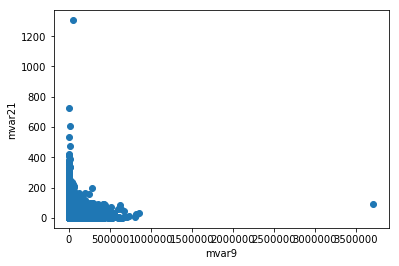

Correlation: -0.338294216995


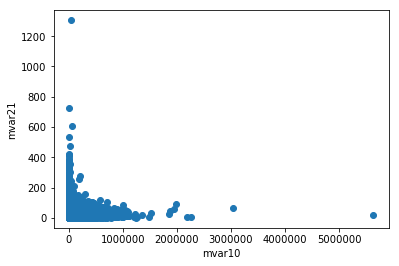

Correlation: -0.272215072671


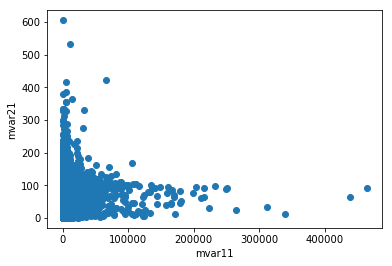

Correlation: 0.00959352443225


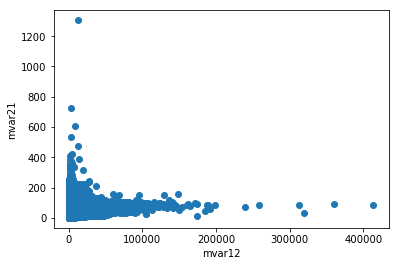

Correlation: 0.160584166036


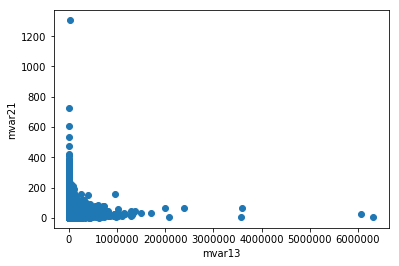

Correlation: -0.133376117753


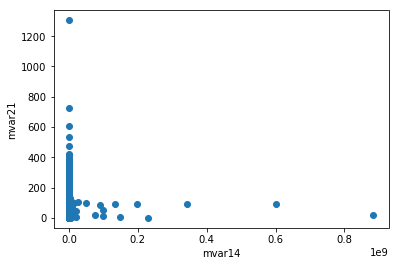

Correlation: -0.00390124598339


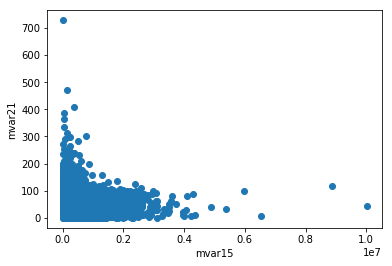

Correlation: -0.156114968966


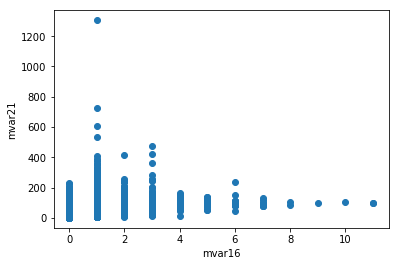

Correlation: 0.430862791847


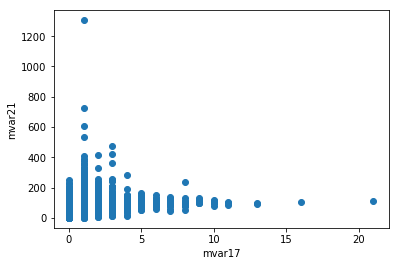

Correlation: 0.413508167447


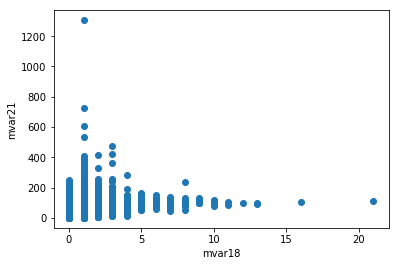

Correlation: 0.411805997274


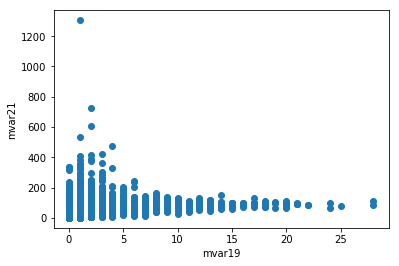

Correlation: 0.483929991964


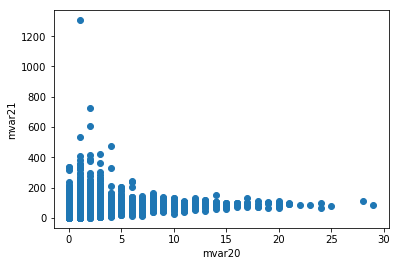

Correlation: 0.479181598313


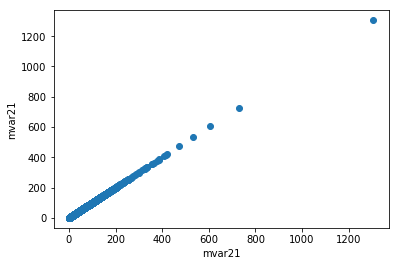

Correlation: 1.0


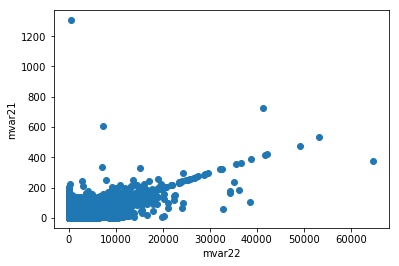

Correlation: 0.715951162372


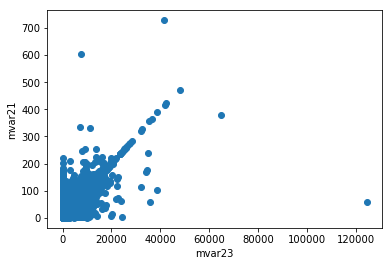

Correlation: 0.680903759621


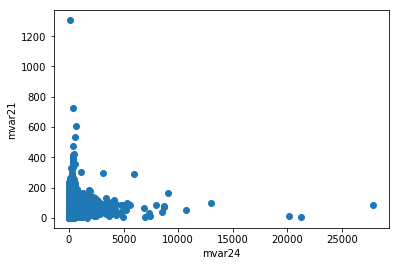

Correlation: 0.148948375042


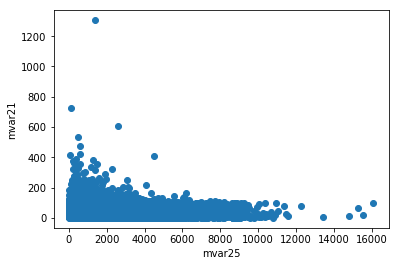

Correlation: -0.257191993976


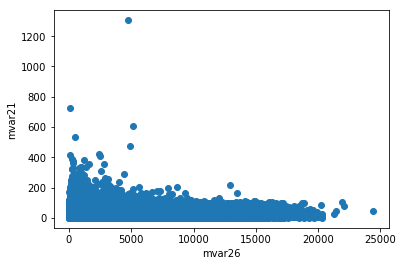

Correlation: -0.269732500515


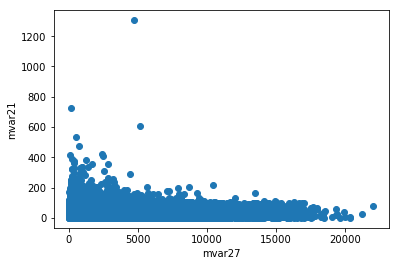

Correlation: -0.277222166336


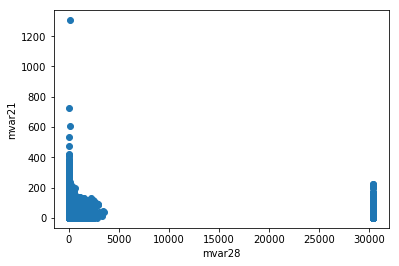

Correlation: -0.355486627773


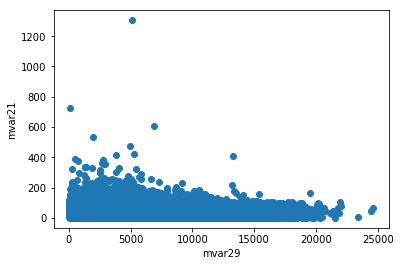

Correlation: -0.238251548098


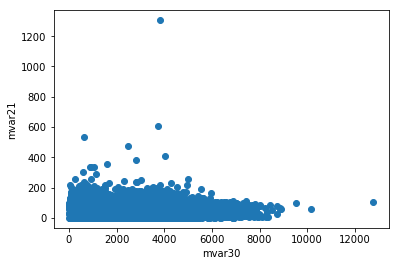

Correlation: -0.0825538583449


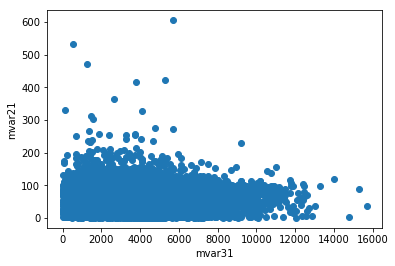

Correlation: -0.070072498027


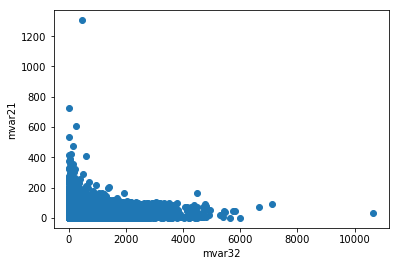

Correlation: -0.277633282427


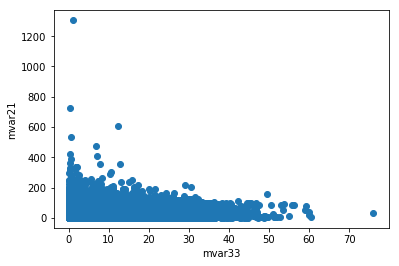

Correlation: -0.169461855021


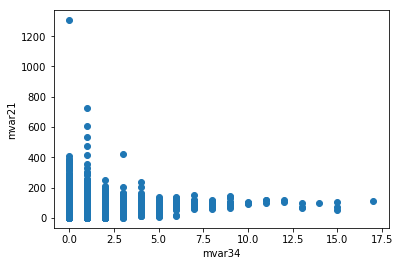

Correlation: 0.222848813914


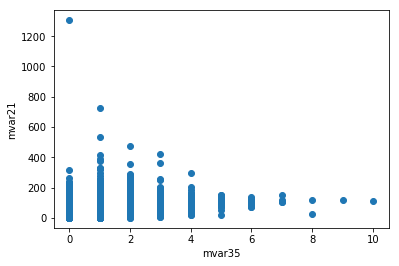

Correlation: 0.284339264381


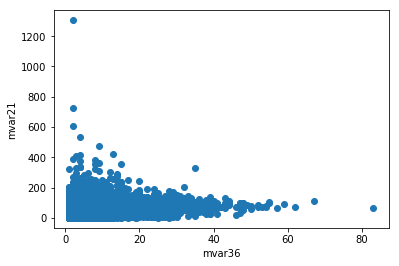

Correlation: 0.246521143265


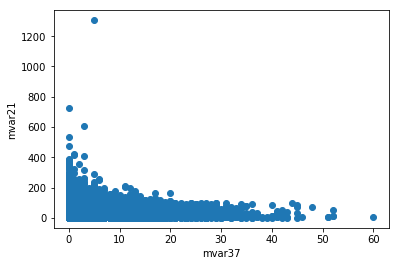

Correlation: -0.23673490203


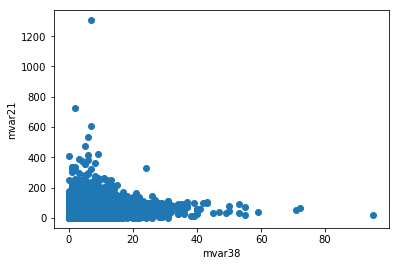

Correlation: 0.142190891251


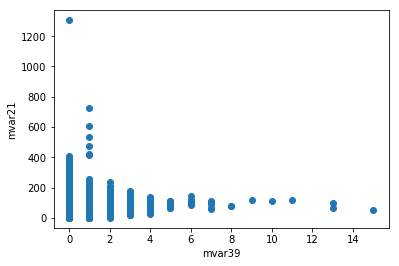

Correlation: 0.184046827072


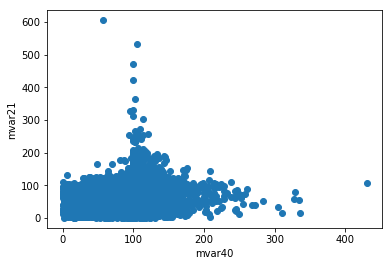

Correlation: 0.172877097916


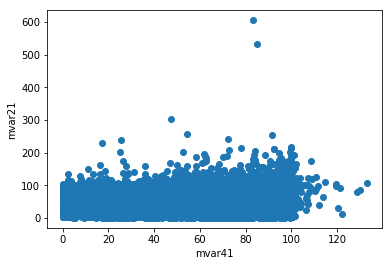

Correlation: 0.109420432302


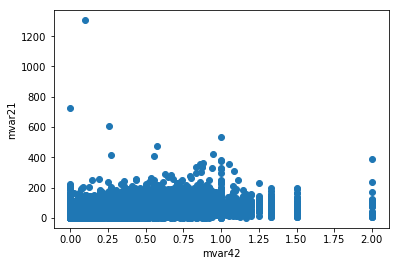

Correlation: 0.347395911331


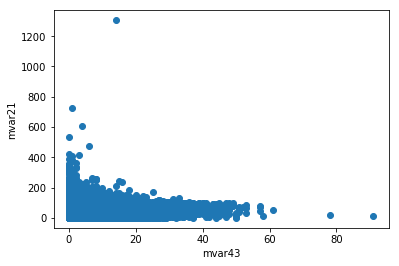

Correlation: -0.123897132738


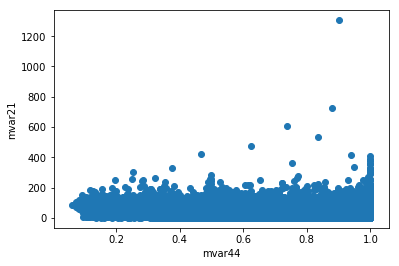

Correlation: -0.180784853647


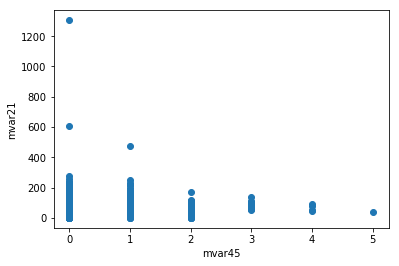

Correlation: 0.138356751878


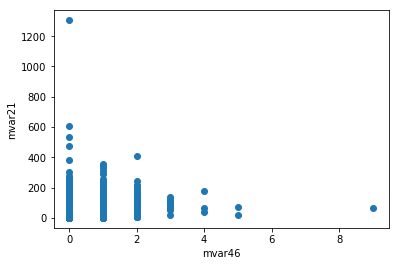

Correlation: 0.14621644131


In [40]:
v1 = 21
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

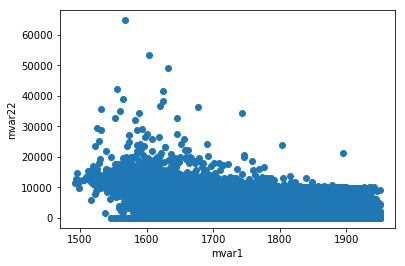

Correlation: -0.575690187267


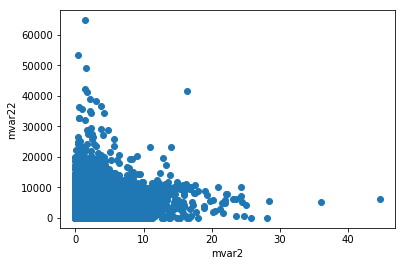

Correlation: 0.193542097874


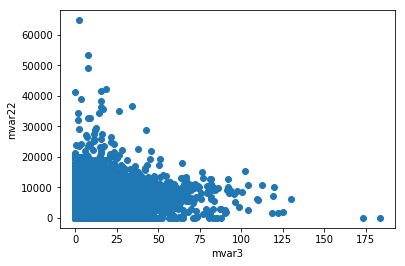

Correlation: 0.206792490554


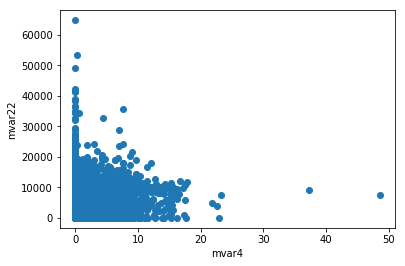

Correlation: 0.118663514621


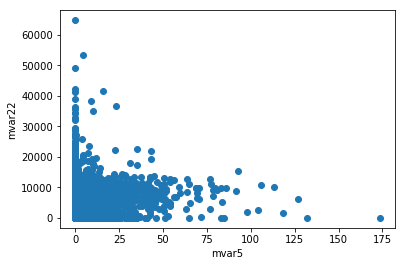

Correlation: 0.0952165951375


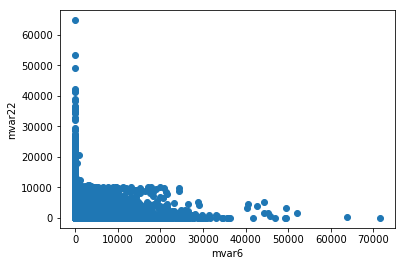

Correlation: -0.316494262171


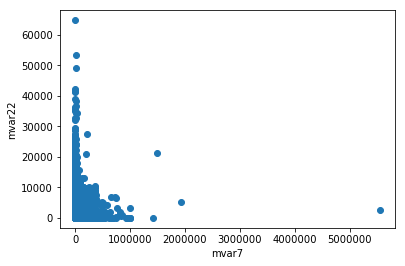

Correlation: -0.144844070143


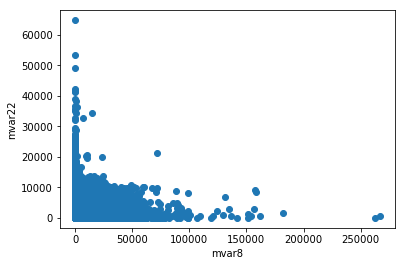

Correlation: -0.385158805557


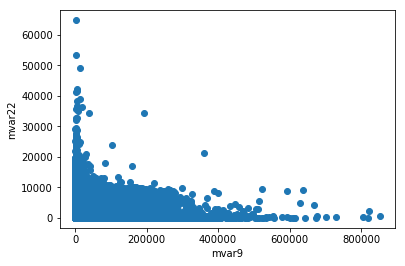

Correlation: -0.29719999366


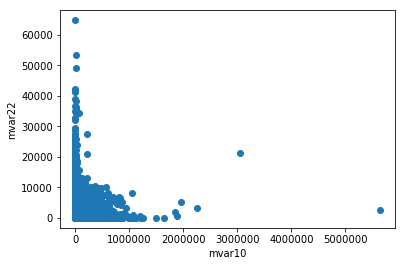

Correlation: -0.223706993742


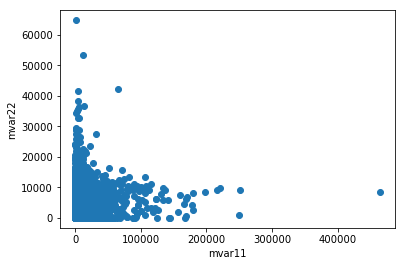

Correlation: 0.0277707414243


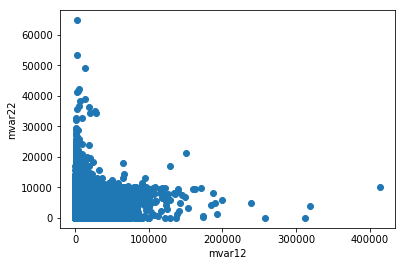

Correlation: 0.100828458694


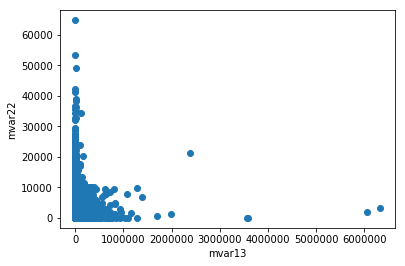

Correlation: -0.085147011508


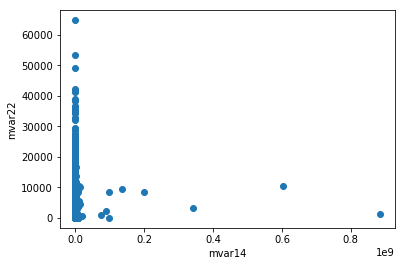

Correlation: -0.000625239737515


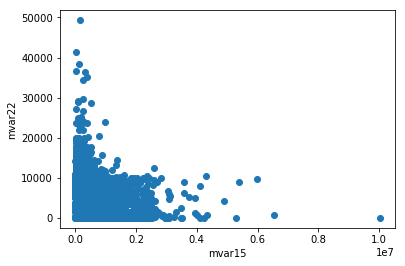

Correlation: -0.130317959436


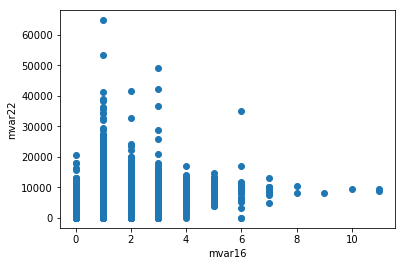

Correlation: 0.407560041515


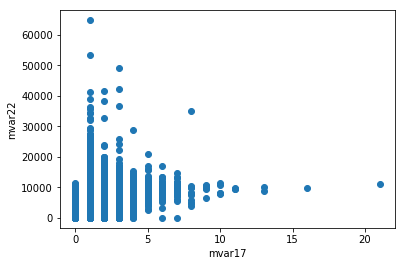

Correlation: 0.398416599497


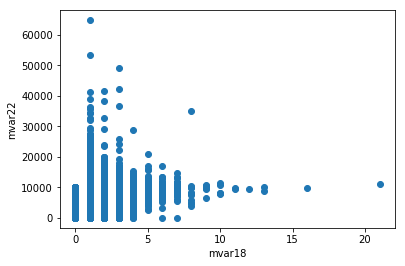

Correlation: 0.39713596684


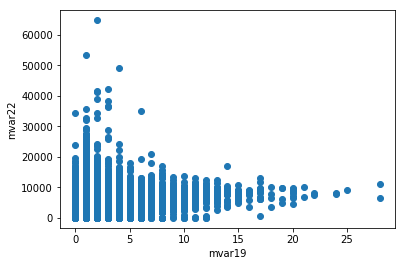

Correlation: 0.434273939048


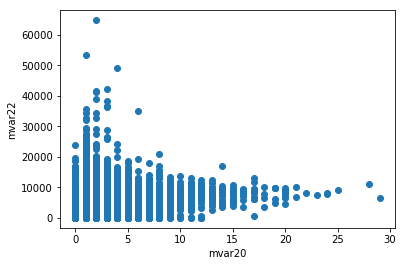

Correlation: 0.444578370393


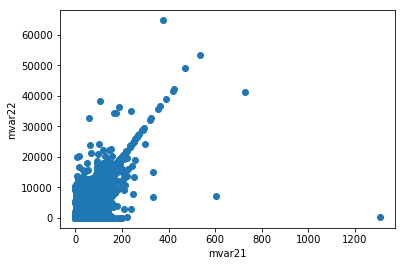

Correlation: 0.715951162372


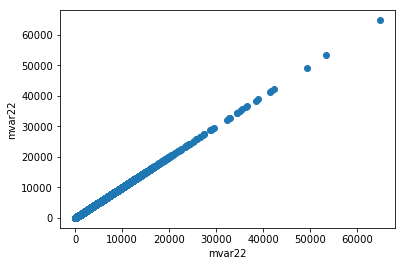

Correlation: 1.0


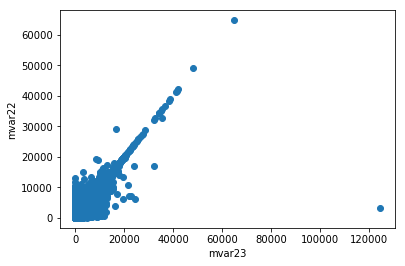

Correlation: 0.901085833972


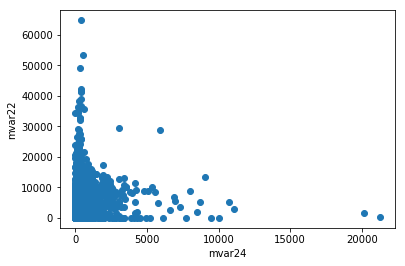

Correlation: 0.137208256254


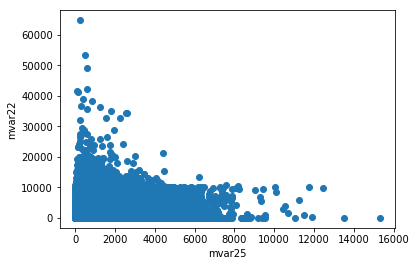

Correlation: -0.241525068149


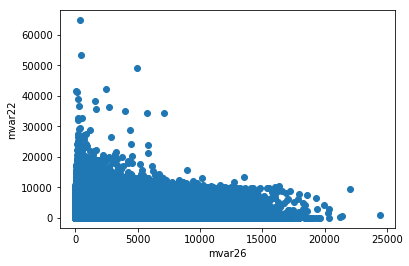

Correlation: -0.239917910852


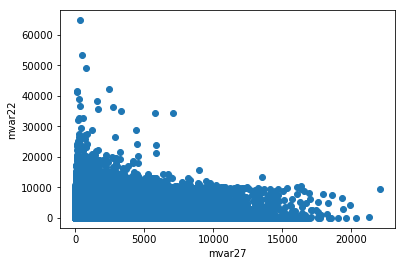

Correlation: -0.247627991037


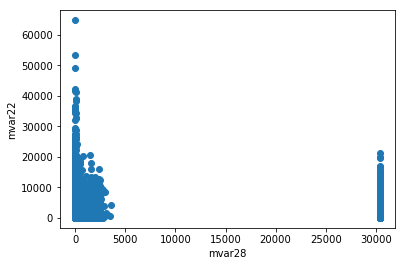

Correlation: -0.270096419299


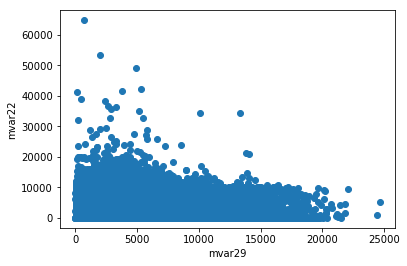

Correlation: -0.199729442416


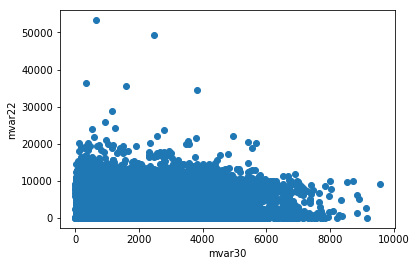

Correlation: -0.0919797915645


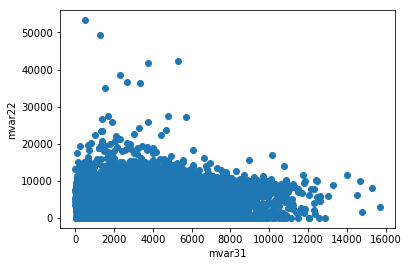

Correlation: -0.0628673964828


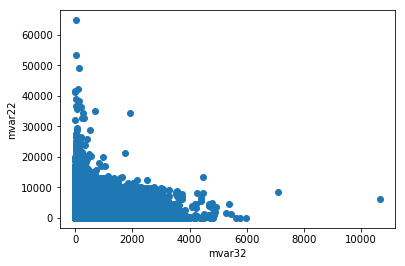

Correlation: -0.258722882925


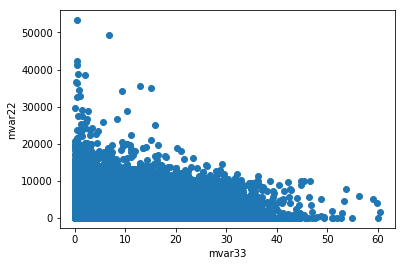

Correlation: -0.155531705412


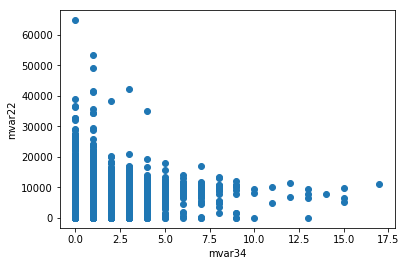

Correlation: 0.203470100487


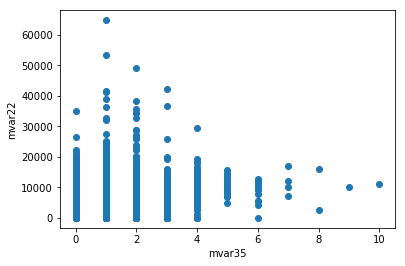

Correlation: 0.275128941133


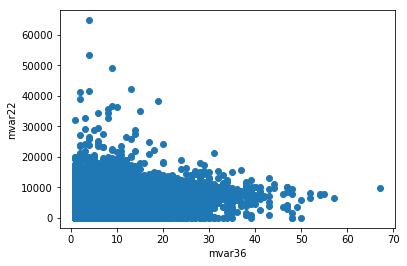

Correlation: 0.232062097798


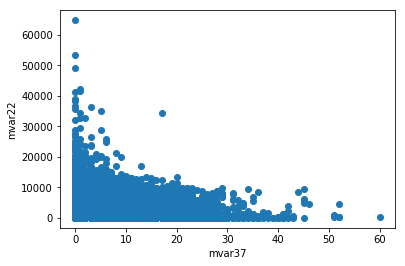

Correlation: -0.233321363175


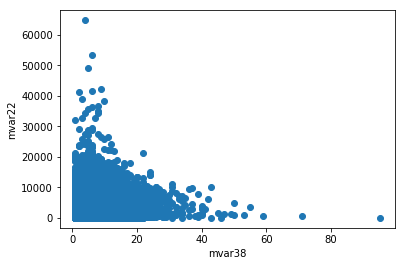

Correlation: 0.110026387591


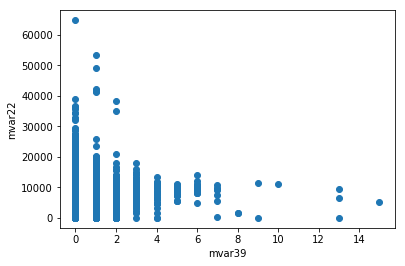

Correlation: 0.179315324866


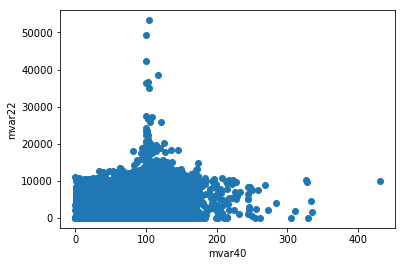

Correlation: 0.150463494438


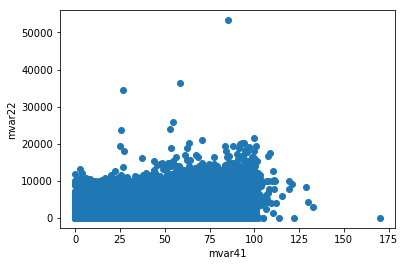

Correlation: 0.118846276092


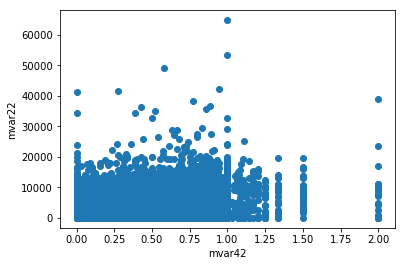

Correlation: 0.323389980461


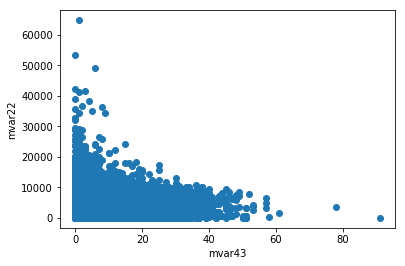

Correlation: -0.145110756627


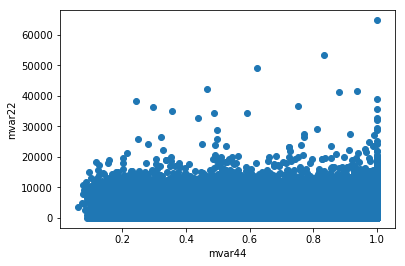

Correlation: -0.170510398749


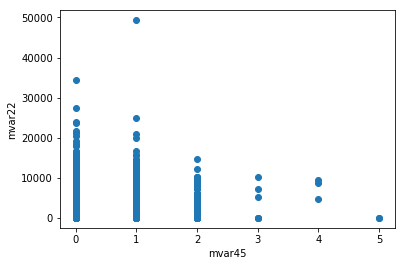

Correlation: 0.0932414722059


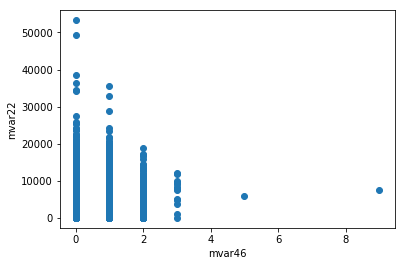

Correlation: 0.130797982956


In [41]:
v1 = 22
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

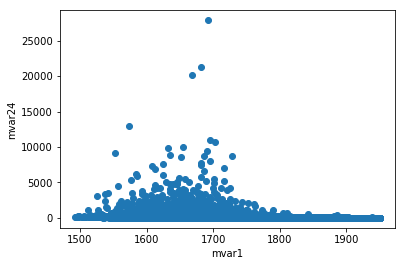

Correlation: -0.193534371379


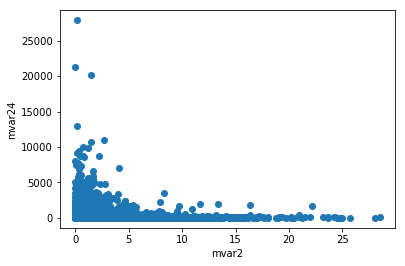

Correlation: 0.0399106676391


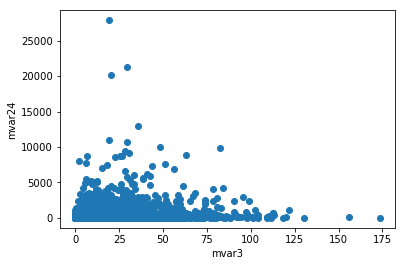

Correlation: 0.250980293332


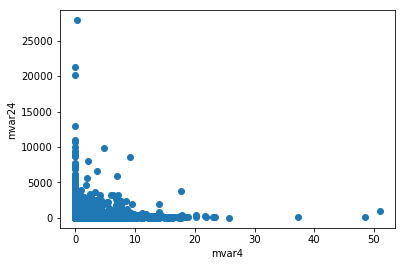

Correlation: 0.0623265635989


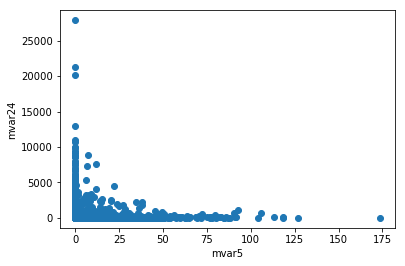

Correlation: 0.0390312693385


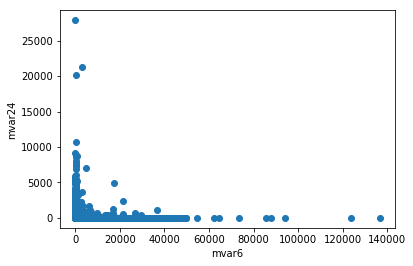

Correlation: -0.0682887498448


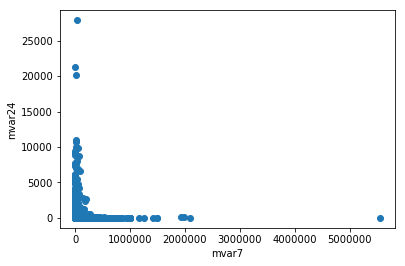

Correlation: -0.0309399282299


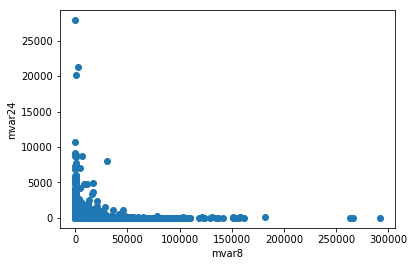

Correlation: -0.0987121740365


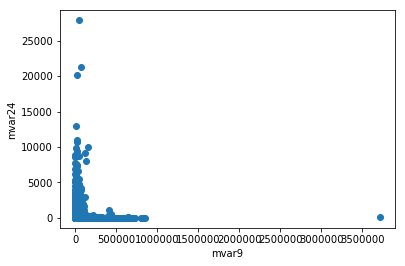

Correlation: -0.0687021117987


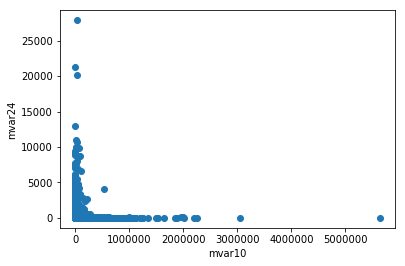

Correlation: -0.0547371129405


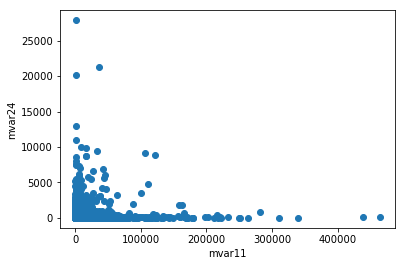

Correlation: 0.0743284068116


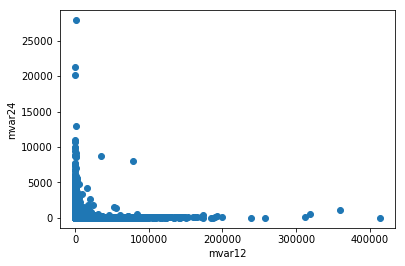

Correlation: -0.0152370994064


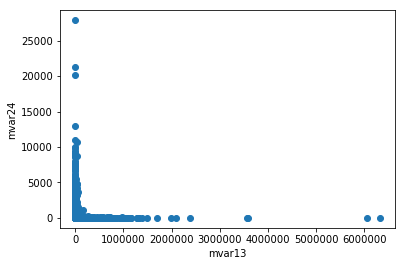

Correlation: -0.0332031429587


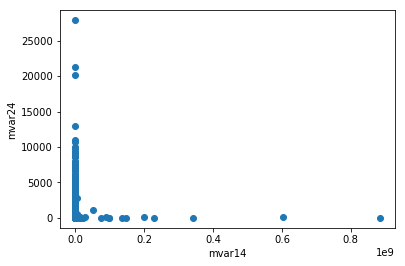

Correlation: -0.000916125848443


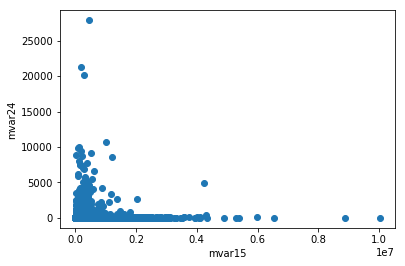

Correlation: -0.0147590368611


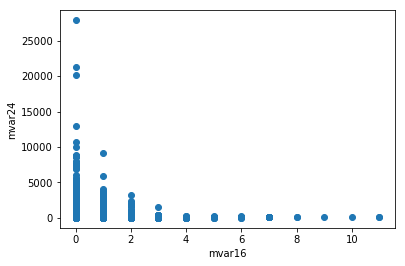

Correlation: 0.0588983008153


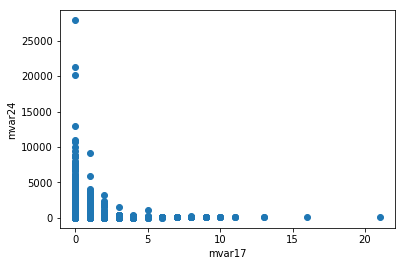

Correlation: 0.0502349426206


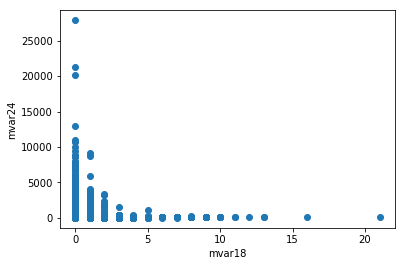

Correlation: 0.0503385758286


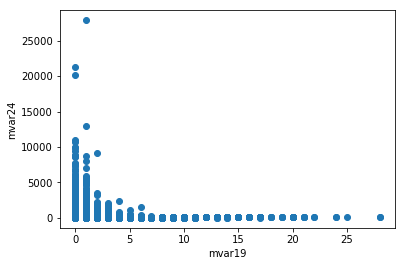

Correlation: 0.038285916014


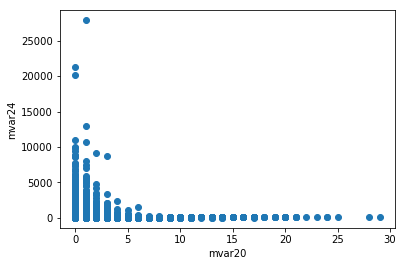

Correlation: 0.0381701372798


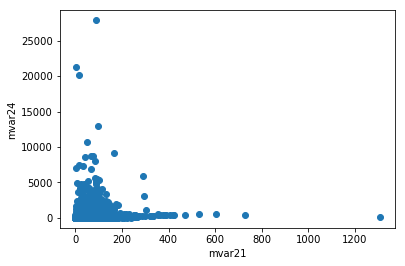

Correlation: 0.148948375042


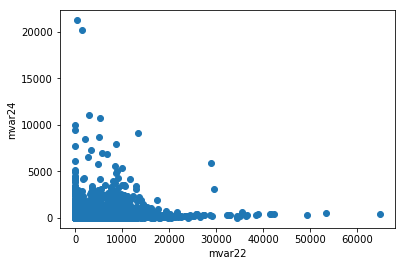

Correlation: 0.137208256254


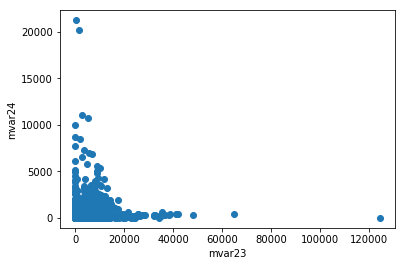

Correlation: 0.120433558618


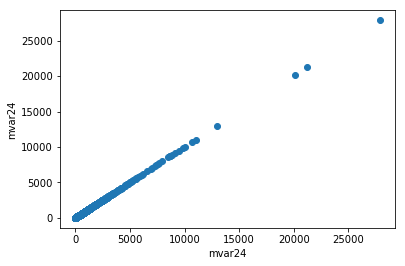

Correlation: 1.0


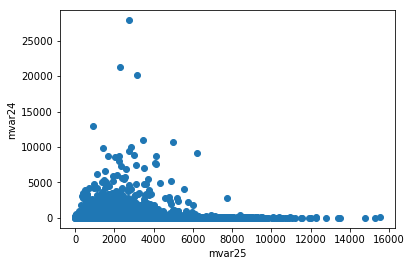

Correlation: -0.00752746344363


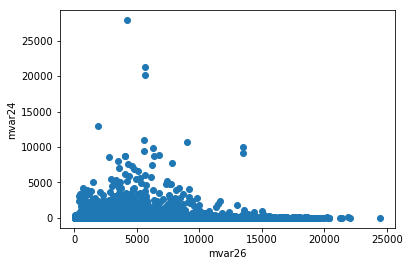

Correlation: -0.00929571352562


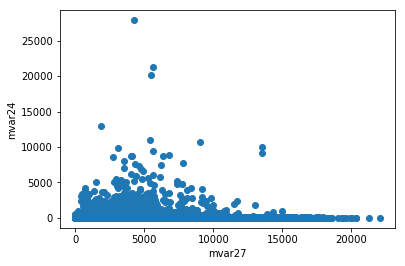

Correlation: -0.00439468126558


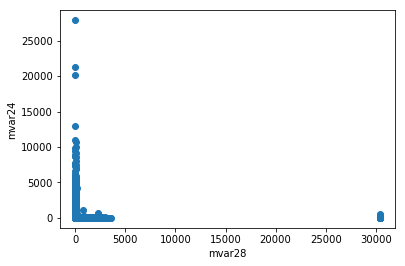

Correlation: -0.10312243678


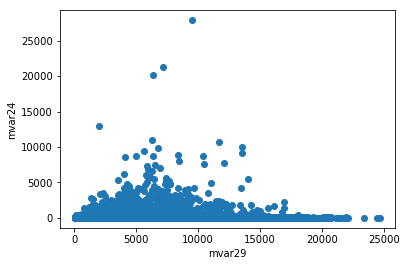

Correlation: -0.0156200204599


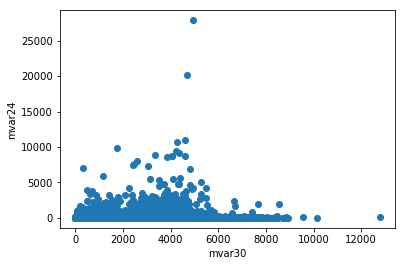

Correlation: 0.0200176968976


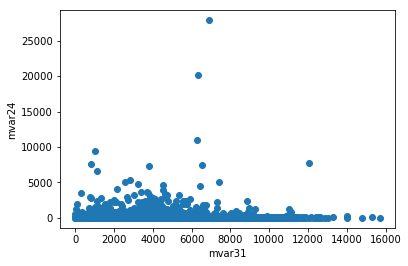

Correlation: 0.00878317511167


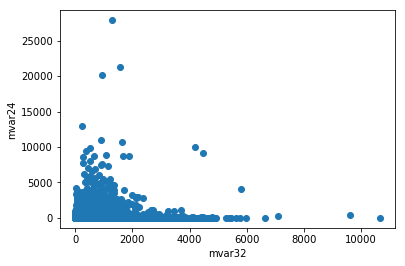

Correlation: -0.0019176069988


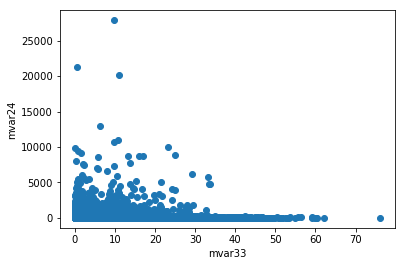

Correlation: -0.0261161685125


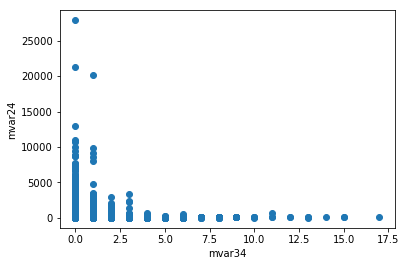

Correlation: 0.032085223393


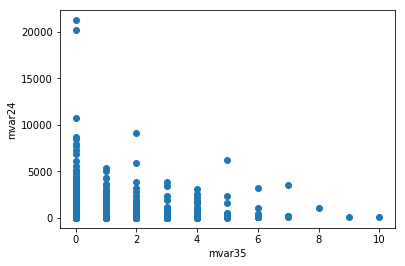

Correlation: 0.12692424375


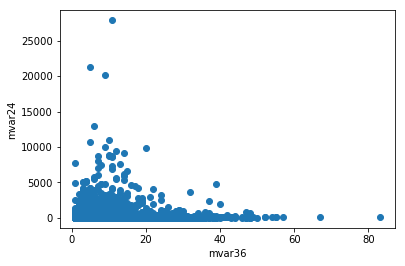

Correlation: 0.0806256832235


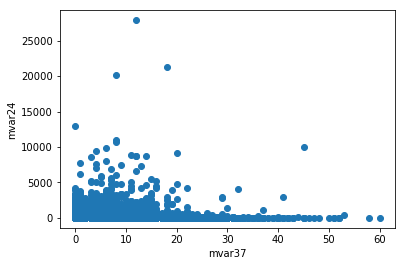

Correlation: 0.0116954793769


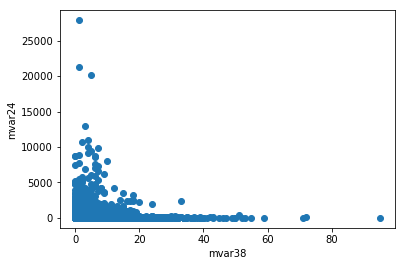

Correlation: 0.00947721793246


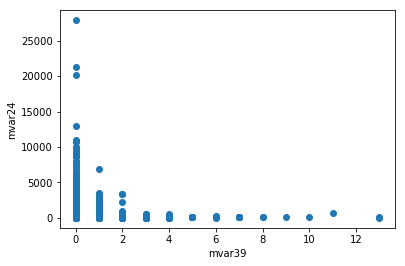

Correlation: 0.0342700954877


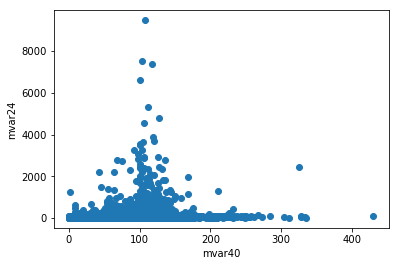

Correlation: 0.0753916733725


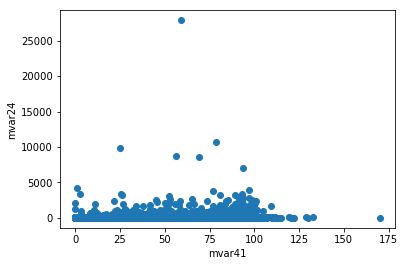

Correlation: 0.00405697601603


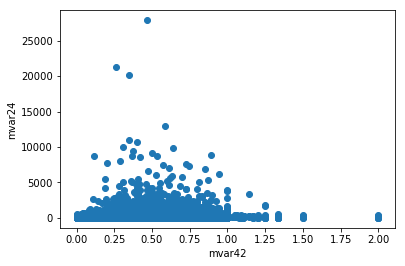

Correlation: 0.152037726216


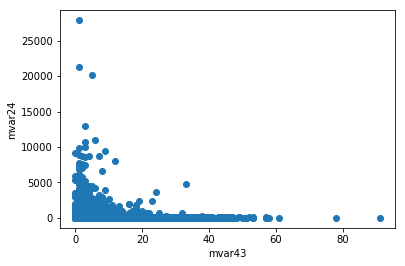

Correlation: -0.0778260774124


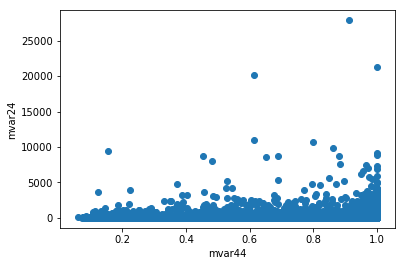

Correlation: 0.00713253497724


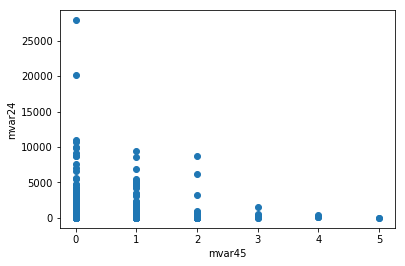

Correlation: 0.0805769240202


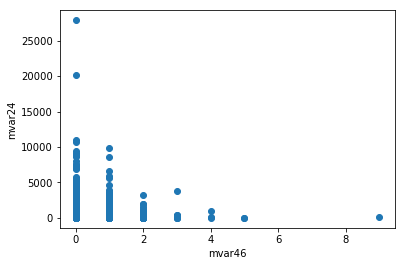

Correlation: 0.0723960054319


In [42]:
v1 = 24
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

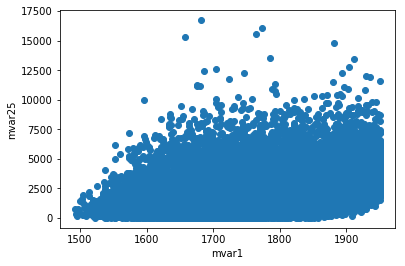

Correlation: 0.365264267727


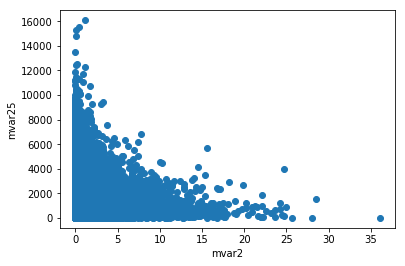

Correlation: -0.2276266865


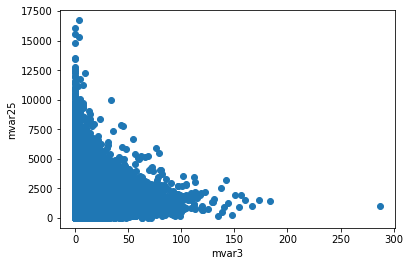

Correlation: -0.086893497505


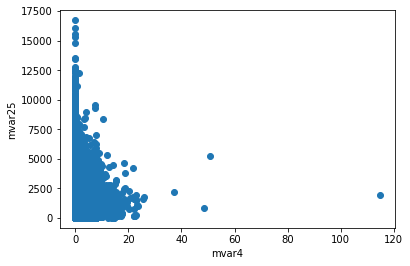

Correlation: -0.0725117469834


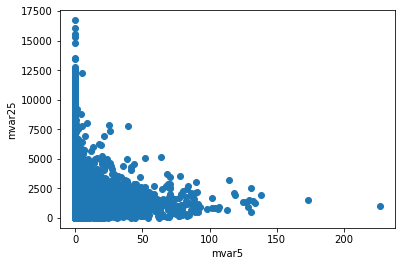

Correlation: -0.0624364724566


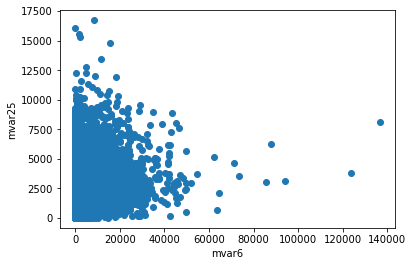

Correlation: 0.313181185651


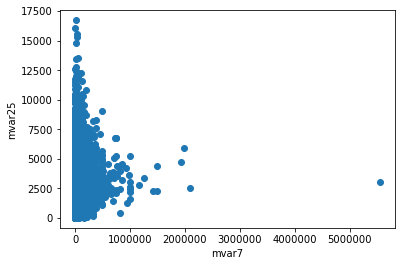

Correlation: 0.23136589042


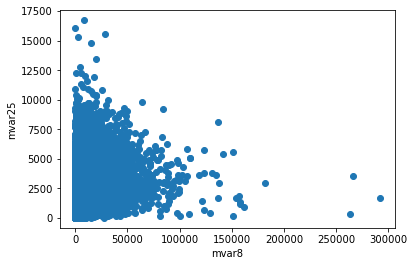

Correlation: 0.376077467967


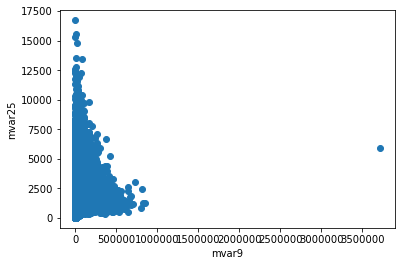

Correlation: 0.286920026216


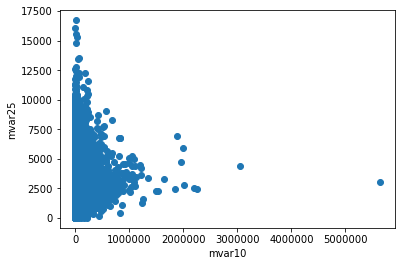

Correlation: 0.288191802626


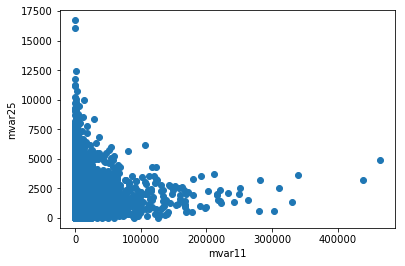

Correlation: 0.0313712099307


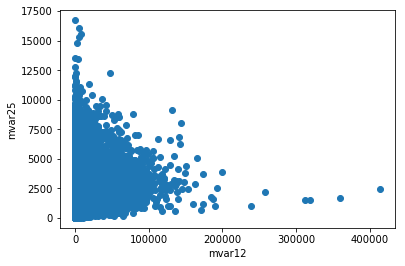

Correlation: 0.198631968042


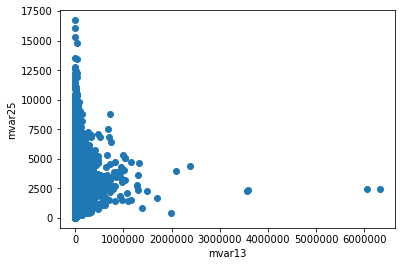

Correlation: 0.15180818622


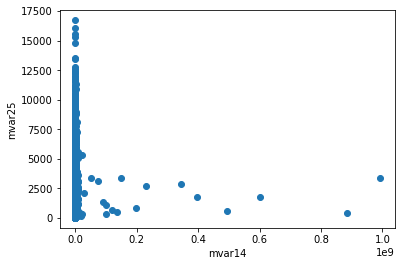

Correlation: 0.0033975013384


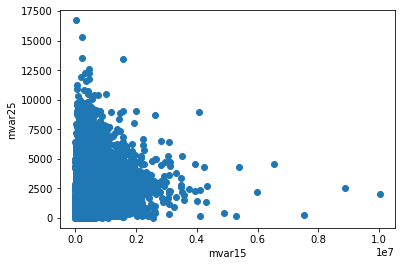

Correlation: 0.193490603757


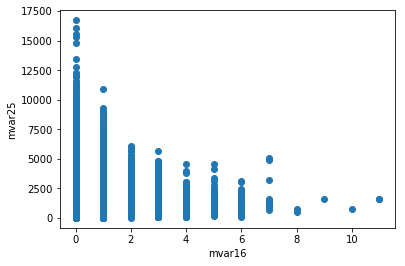

Correlation: -0.116144401964


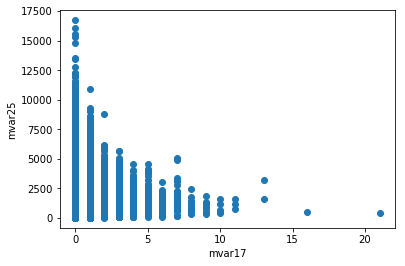

Correlation: -0.116993422186


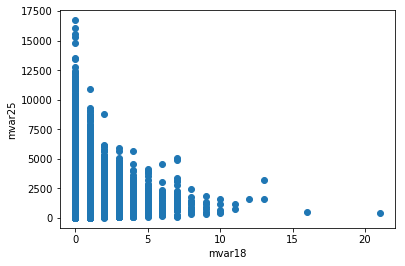

Correlation: -0.11262126338


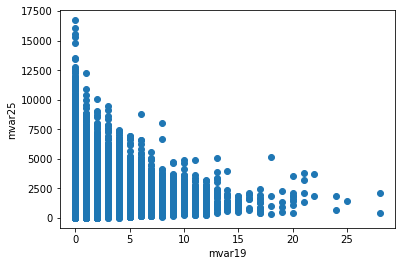

Correlation: -0.105428297681


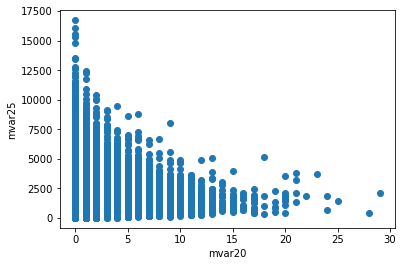

Correlation: -0.0864029449245


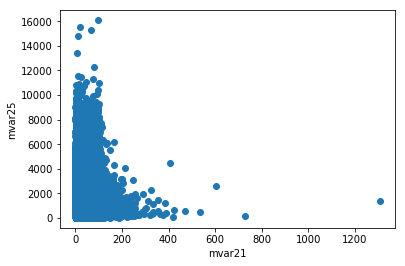

Correlation: -0.257191993976


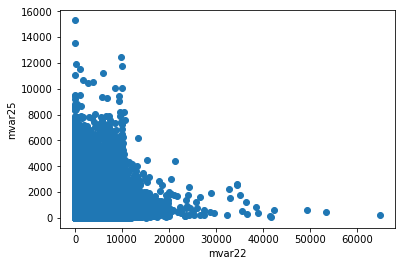

Correlation: -0.241525068149


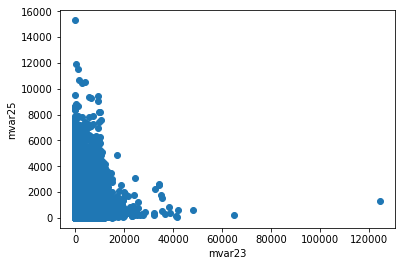

Correlation: -0.234238028658


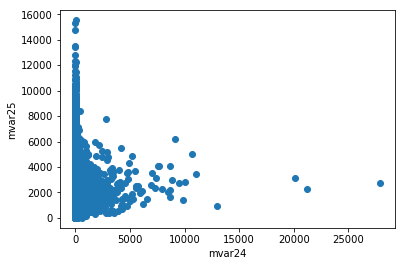

Correlation: -0.00752746344363


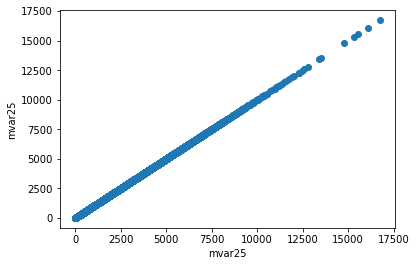

Correlation: 1.0


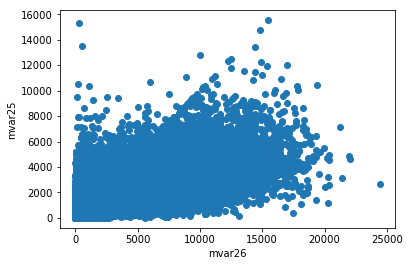

Correlation: 0.713524247355


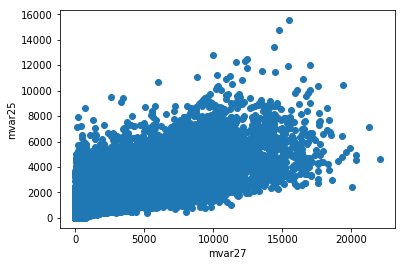

Correlation: 0.760080056567


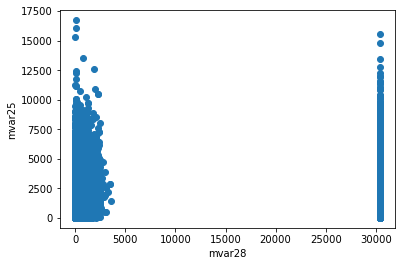

Correlation: 0.161102522732


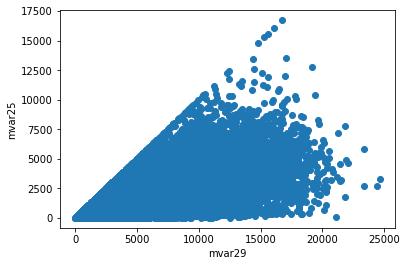

Correlation: 0.656359011149


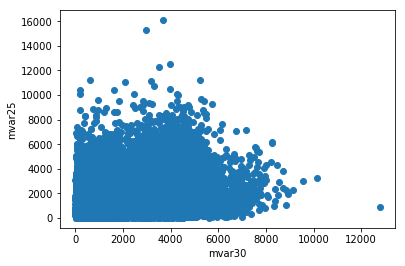

Correlation: 0.275016381442


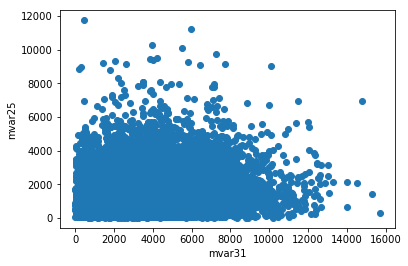

Correlation: 0.191603712522


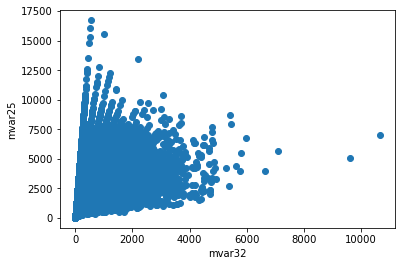

Correlation: 0.597991945287


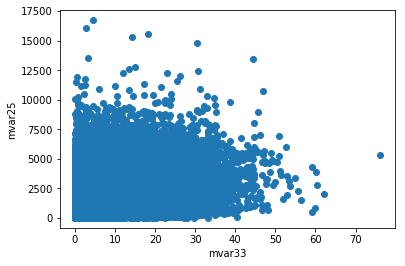

Correlation: 0.342379738899


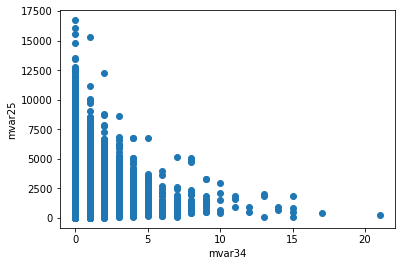

Correlation: -0.0313654795789


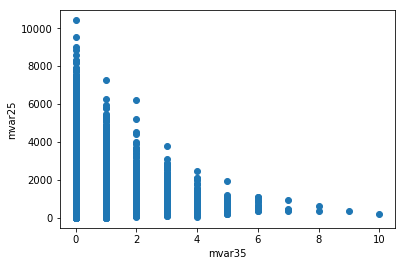

Correlation: -0.13764653231


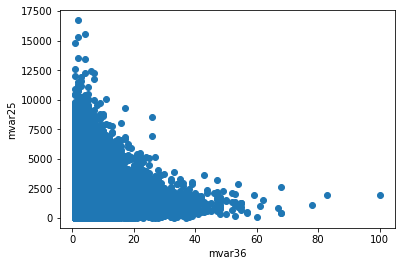

Correlation: -0.104312098397


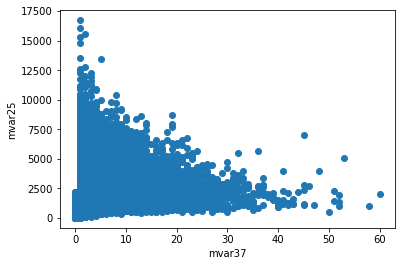

Correlation: 0.382898644513


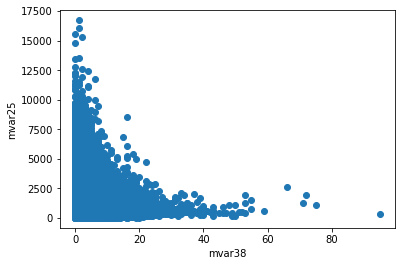

Correlation: -0.327948174847


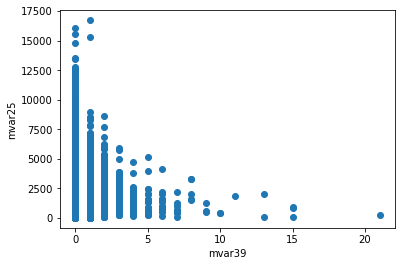

Correlation: -0.0372461310483


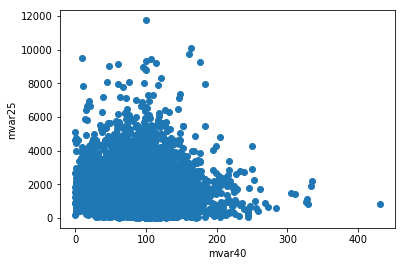

Correlation: -0.166365674294


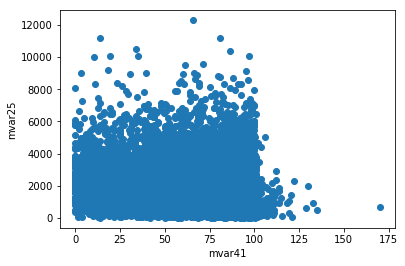

Correlation: -0.211160282668


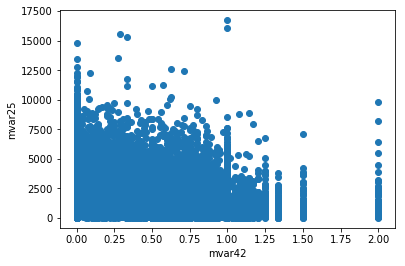

Correlation: -0.242984634493


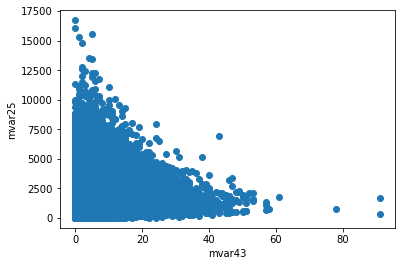

Correlation: 0.0566309747792


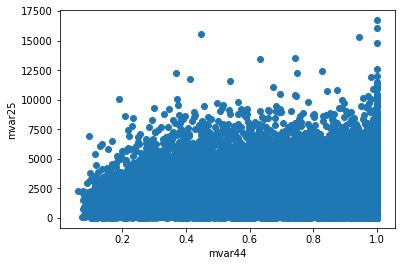

Correlation: 0.0821157625319


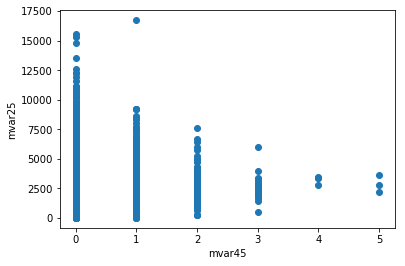

Correlation: -0.0057014121084


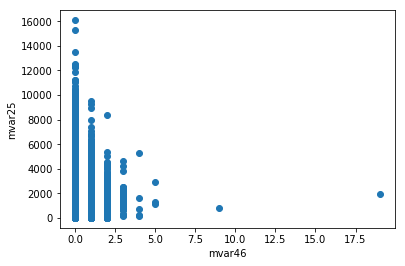

Correlation: -0.0983128677615


In [43]:
v1 = 25
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

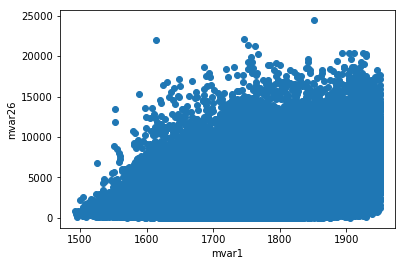

Correlation: 0.415030690927


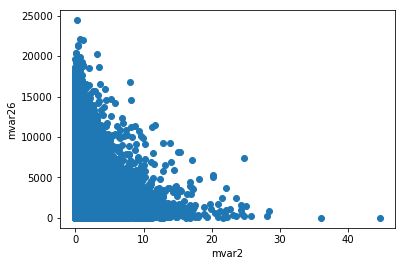

Correlation: -0.195480186076


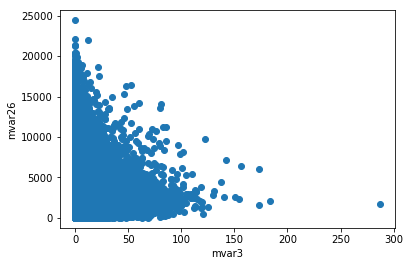

Correlation: -0.0859301977296


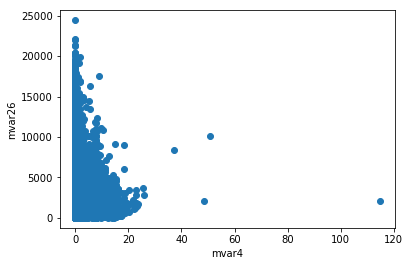

Correlation: -0.0811924314658


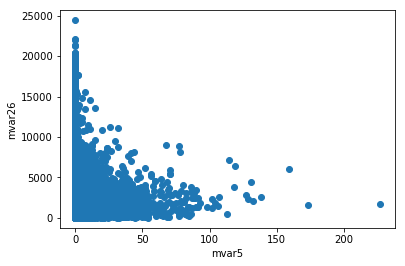

Correlation: -0.0711384168347


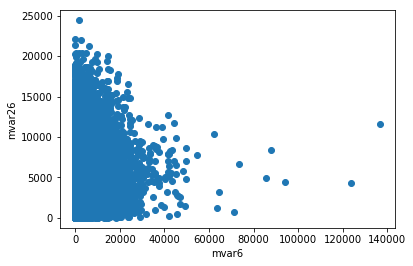

Correlation: 0.235001903084


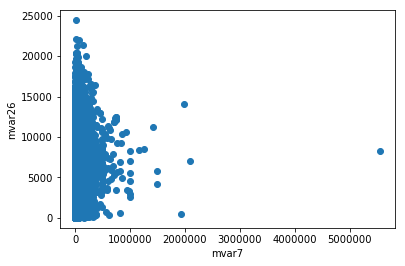

Correlation: 0.244502429938


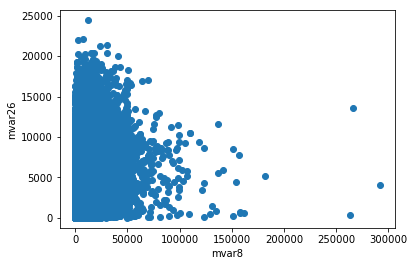

Correlation: 0.391904773835


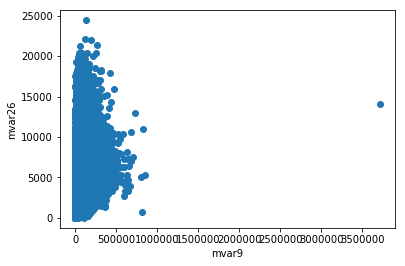

Correlation: 0.479852051912


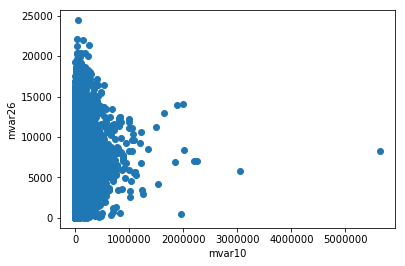

Correlation: 0.364529377268


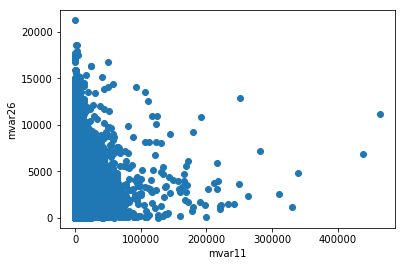

Correlation: 0.0423987853205


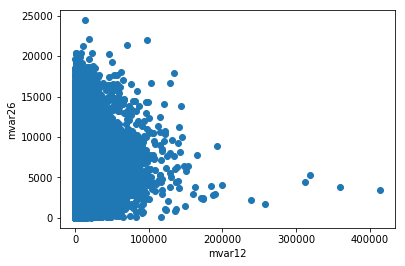

Correlation: 0.247340259562


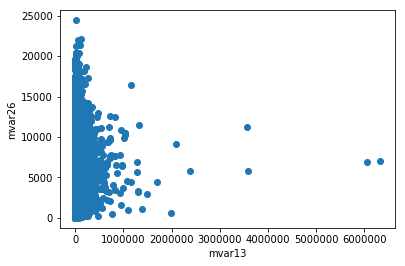

Correlation: 0.173350818149


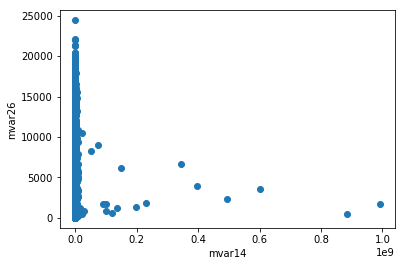

Correlation: -0.000370478467094


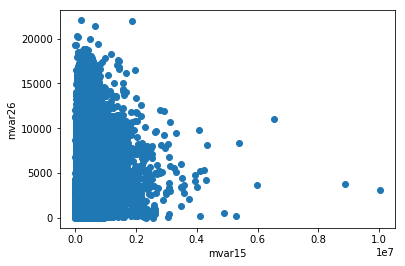

Correlation: 0.16676422371


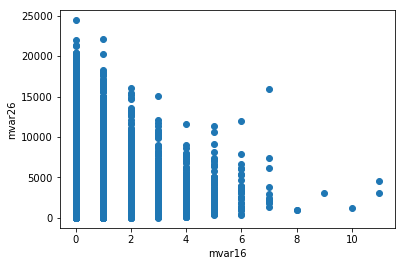

Correlation: -0.0947268735342


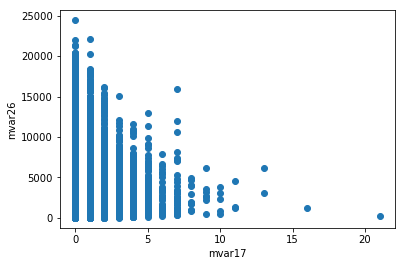

Correlation: -0.085647729406


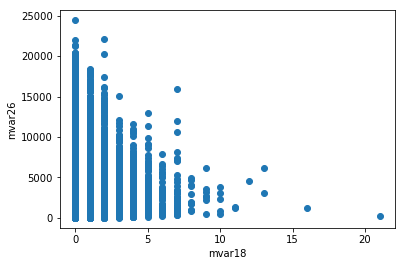

Correlation: -0.0811402337415


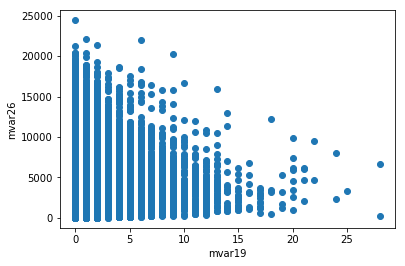

Correlation: -0.0311477671774


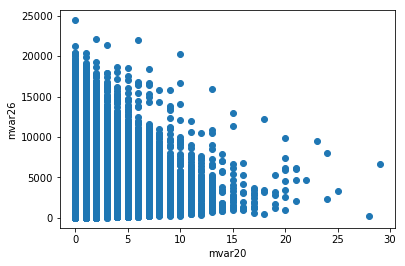

Correlation: -0.0119029766512


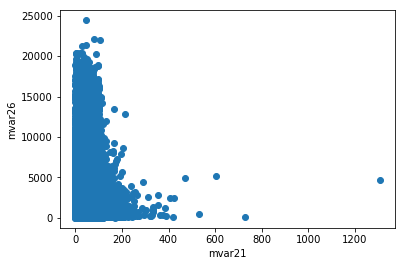

Correlation: -0.269732500515


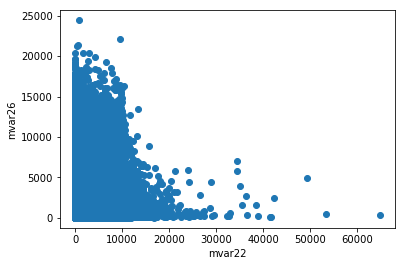

Correlation: -0.239917910852


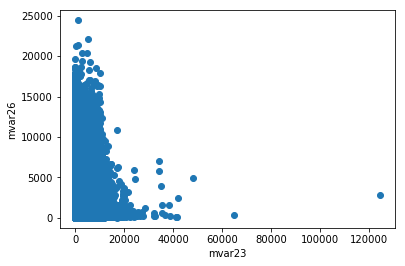

Correlation: -0.231194480343


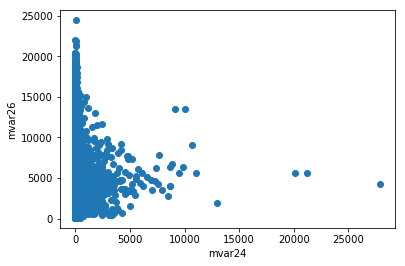

Correlation: -0.00929571352562


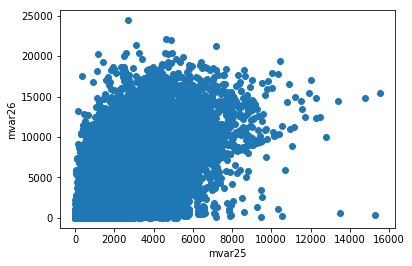

Correlation: 0.713524247355


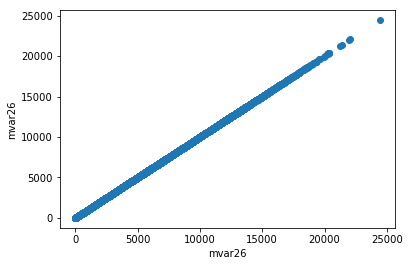

Correlation: 1.0


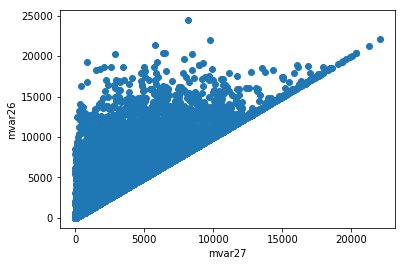

Correlation: 0.913521344988


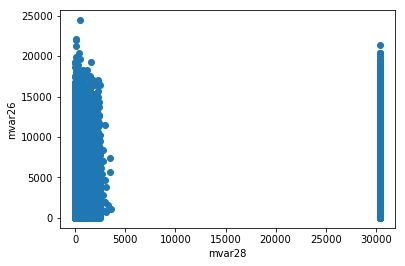

Correlation: 0.178503115744


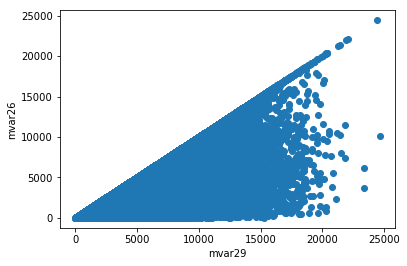

Correlation: 0.670561171335


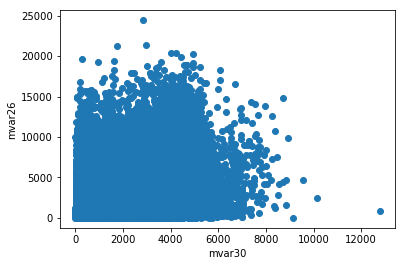

Correlation: 0.274375711971


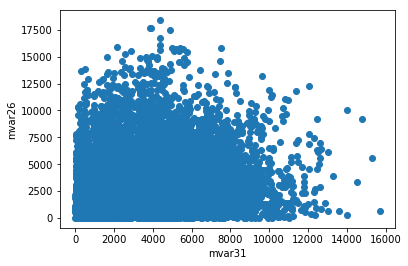

Correlation: 0.179822631562


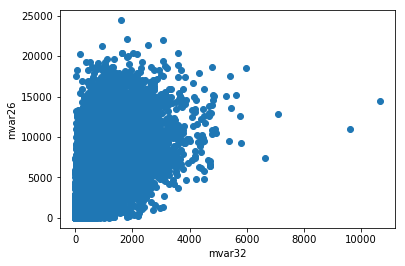

Correlation: 0.687801932912


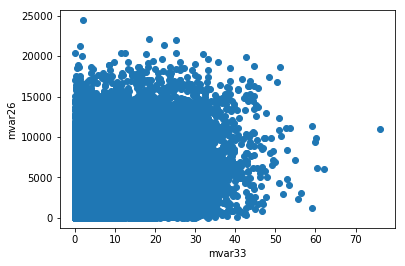

Correlation: 0.374963419091


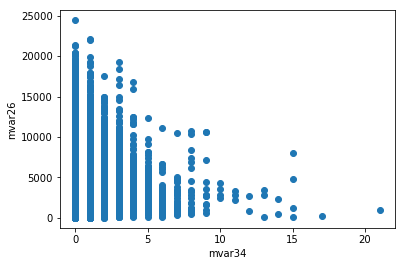

Correlation: -0.0193794436753


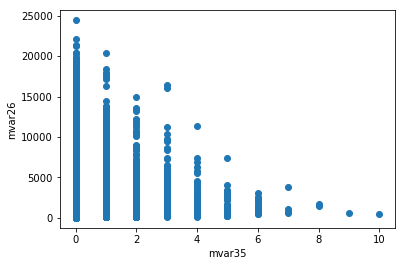

Correlation: -0.127183025606


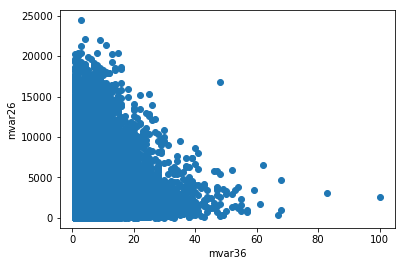

Correlation: -0.0167717398071


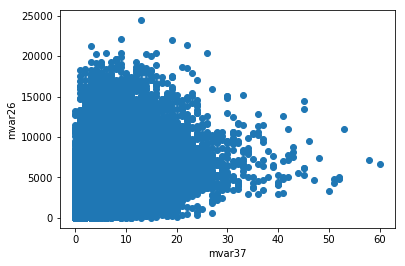

Correlation: 0.529873489497


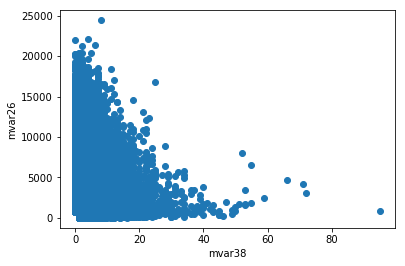

Correlation: -0.193949001889


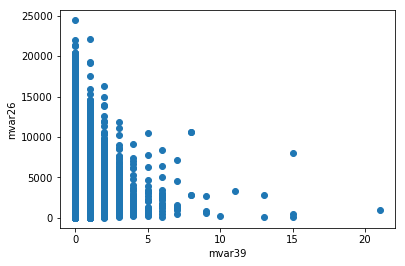

Correlation: -0.0360085071495


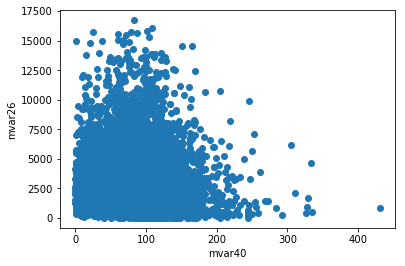

Correlation: -0.185642870563


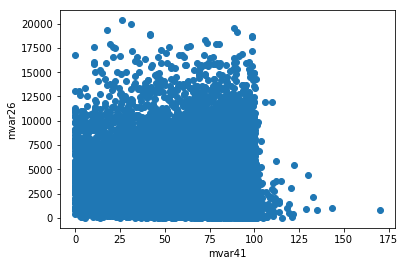

Correlation: -0.208282861363


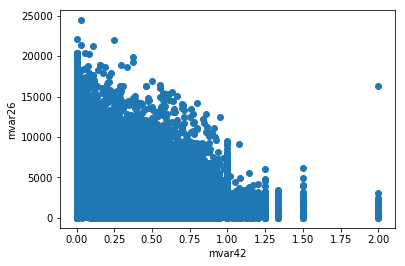

Correlation: -0.325402113833


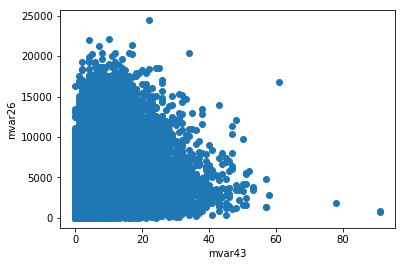

Correlation: 0.267861555817


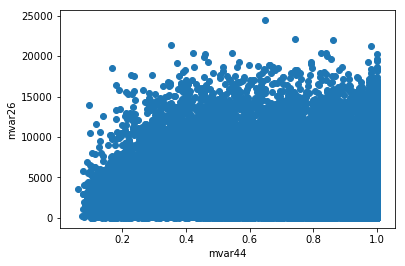

Correlation: 0.0247212719221


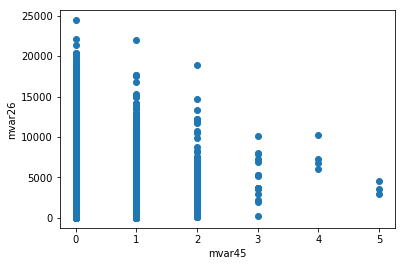

Correlation: -0.0309713868641


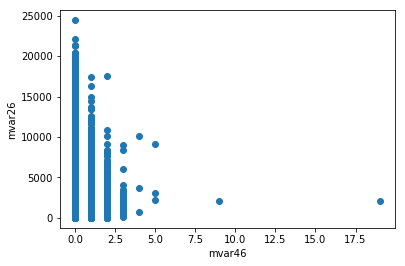

Correlation: -0.105280226432


In [44]:
v1 = 26
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

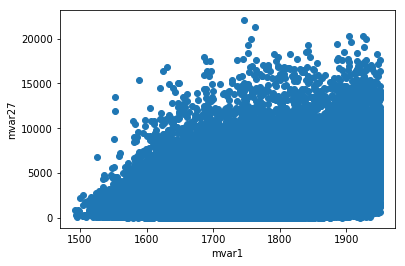

Correlation: 0.412648206245


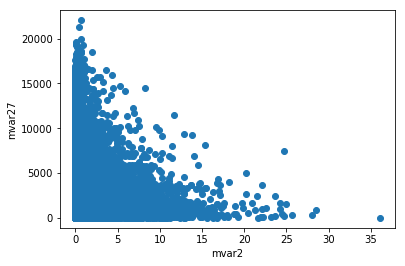

Correlation: -0.201732999344


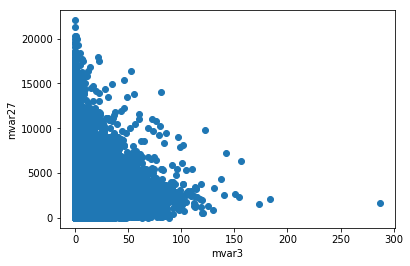

Correlation: -0.0831703648524


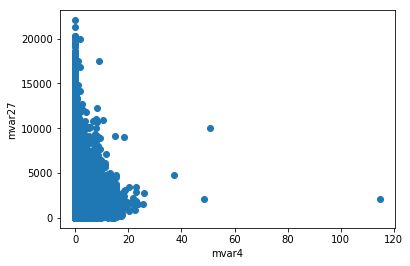

Correlation: -0.0794174729102


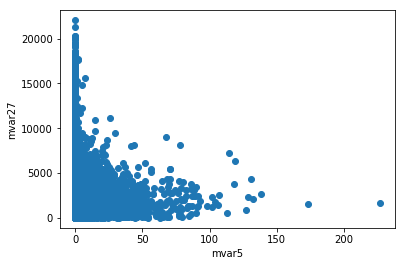

Correlation: -0.0689453361918


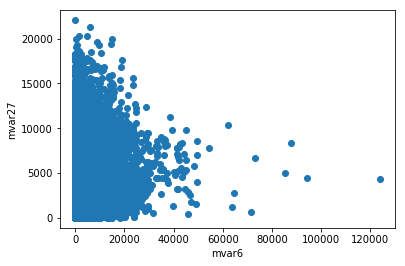

Correlation: 0.249592411849


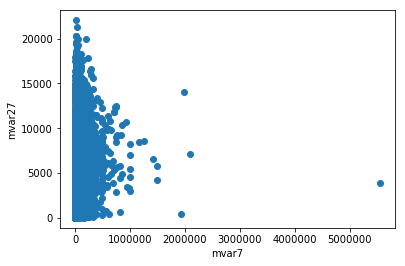

Correlation: 0.247927350947


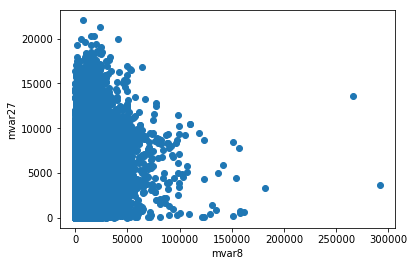

Correlation: 0.413472735051


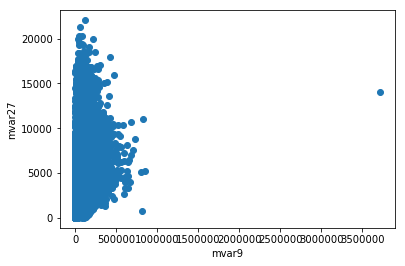

Correlation: 0.483454279242


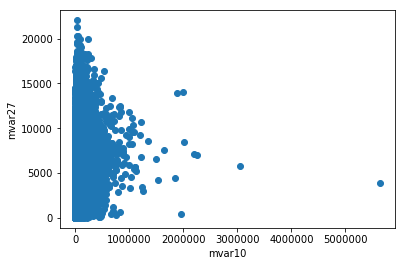

Correlation: 0.371334700558


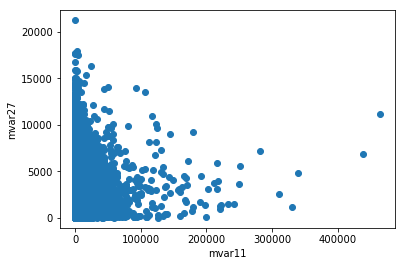

Correlation: 0.0479629327308


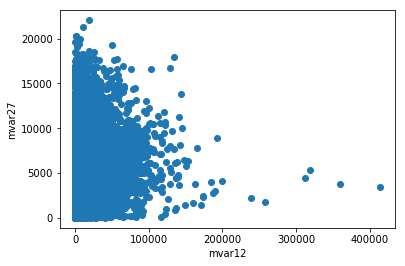

Correlation: 0.25325228757


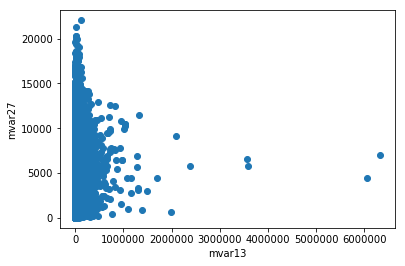

Correlation: 0.17887001223


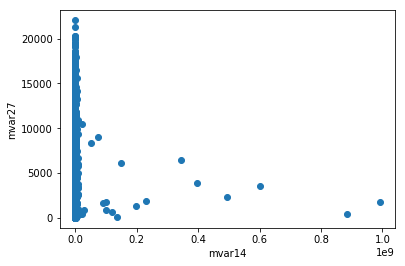

Correlation: 0.000288008460827


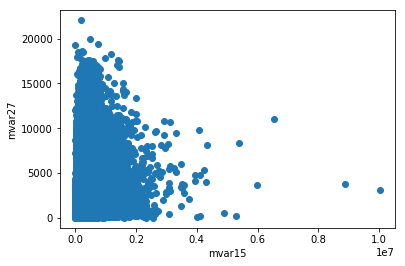

Correlation: 0.168941412241


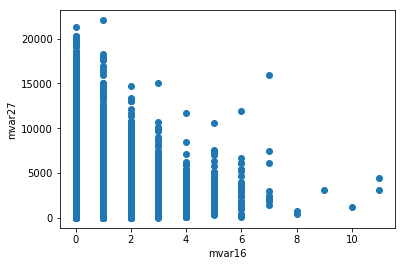

Correlation: -0.0964497608294


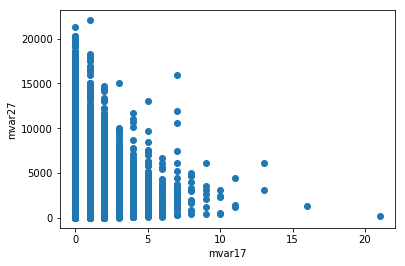

Correlation: -0.0949733815718


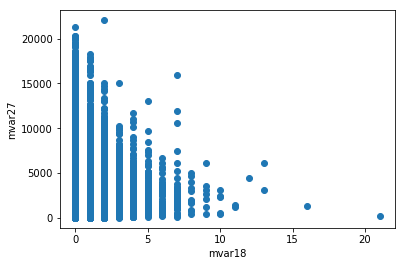

Correlation: -0.0896849240258


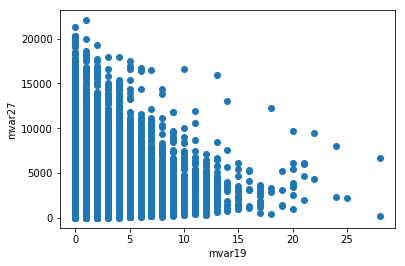

Correlation: -0.0484000076607


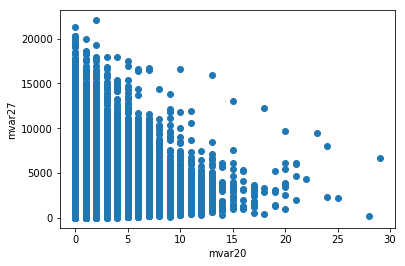

Correlation: -0.0286982556408


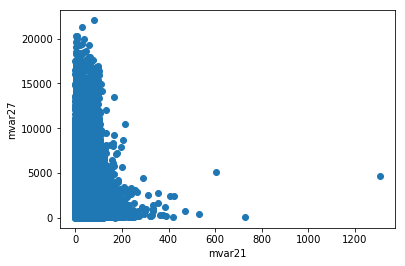

Correlation: -0.277222166336


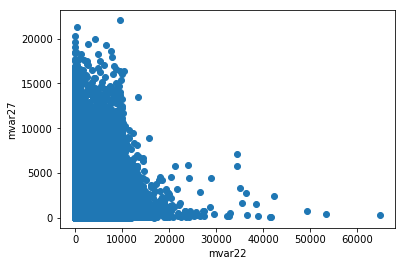

Correlation: -0.247627991037


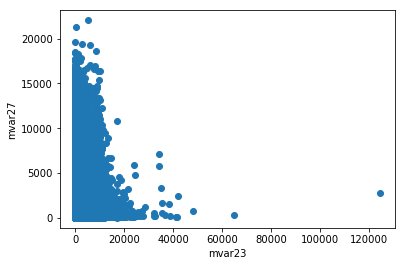

Correlation: -0.239732496812


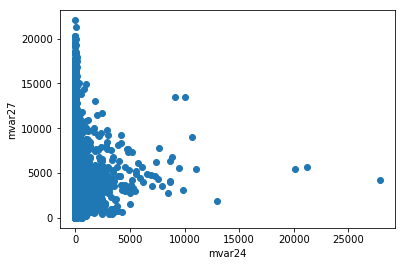

Correlation: -0.00439468126558


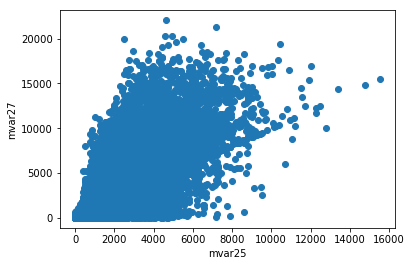

Correlation: 0.760080056567


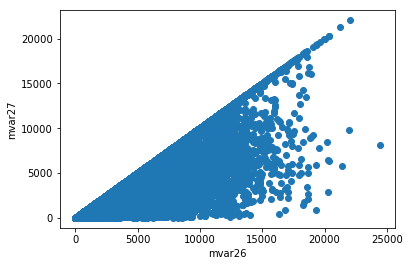

Correlation: 0.913521344988


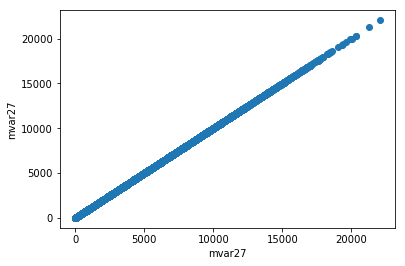

Correlation: 1.0


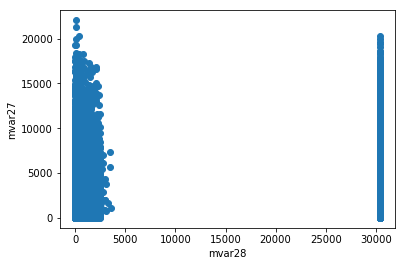

Correlation: 0.191744442203


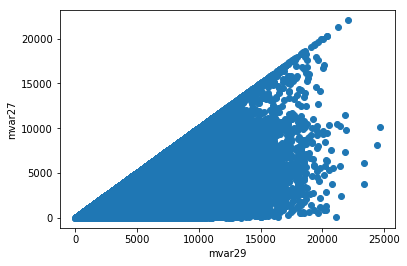

Correlation: 0.614628752067


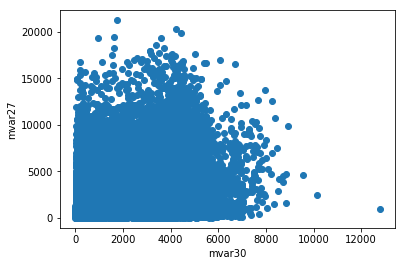

Correlation: 0.269726971018


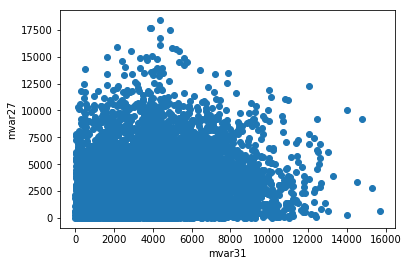

Correlation: 0.183358057041


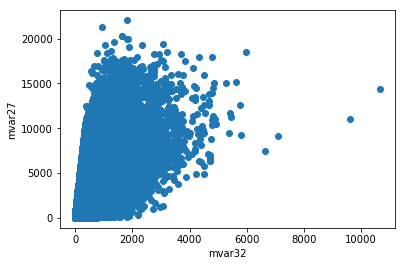

Correlation: 0.704259972377


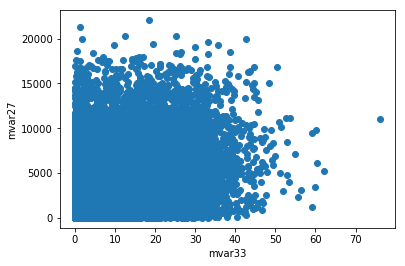

Correlation: 0.360172115162


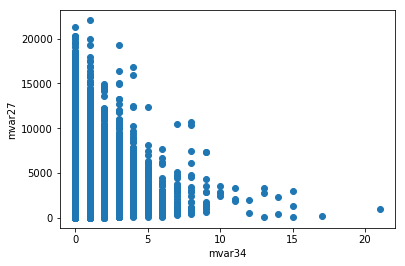

Correlation: -0.0286490119992


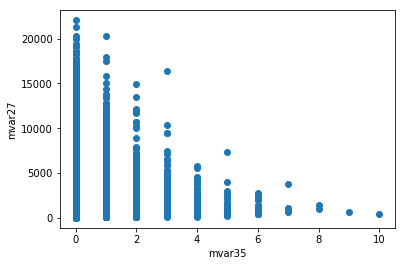

Correlation: -0.130092710755


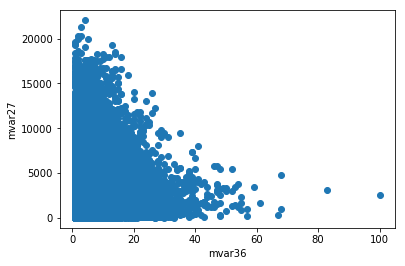

Correlation: -0.0244648912515


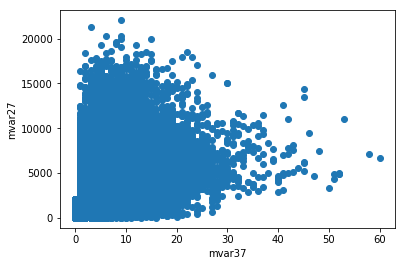

Correlation: 0.531450895377


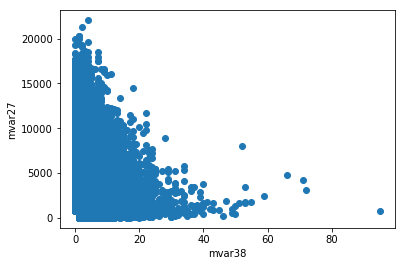

Correlation: -0.212646720923


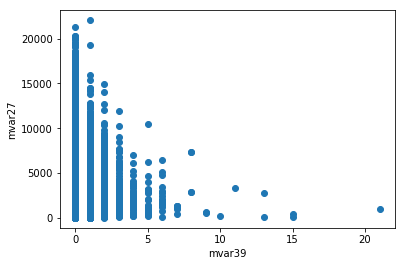

Correlation: -0.0408766751286


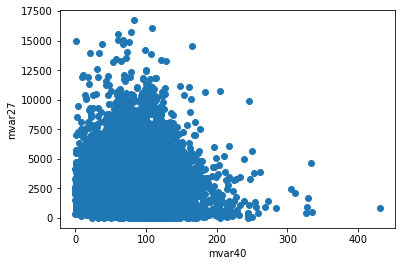

Correlation: -0.194063882616


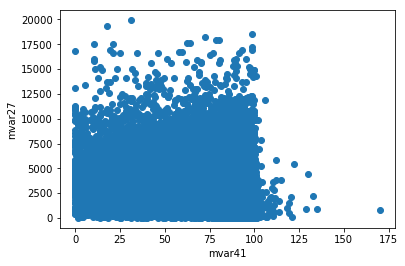

Correlation: -0.214340584476


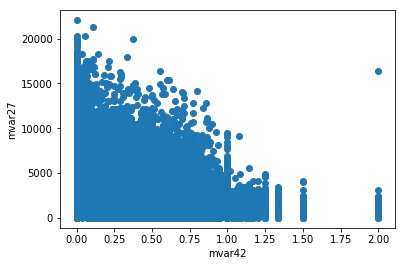

Correlation: -0.316558452221


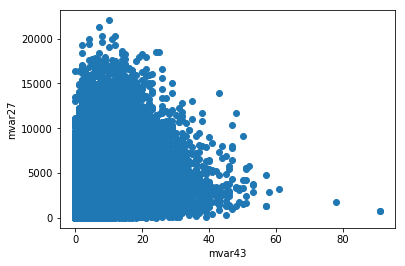

Correlation: 0.247080070371


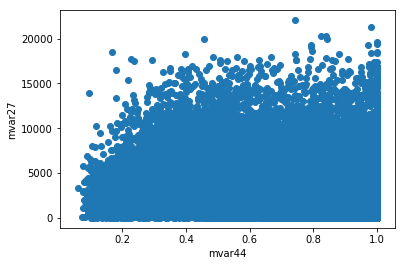

Correlation: 0.0334319406537


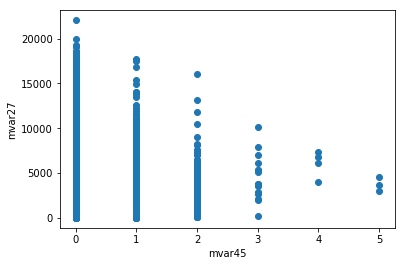

Correlation: -0.0298140274398


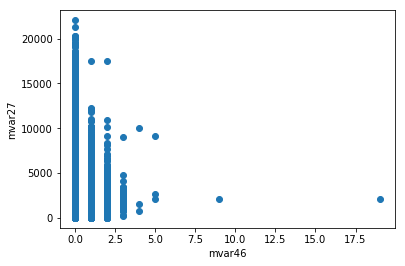

Correlation: -0.101933533898


In [45]:
v1 = 27
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

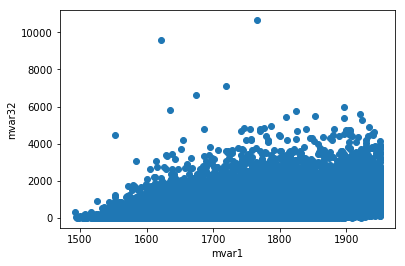

Correlation: 0.436865248541


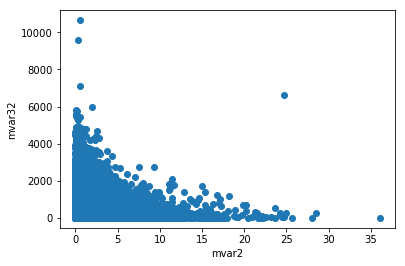

Correlation: -0.160135883634


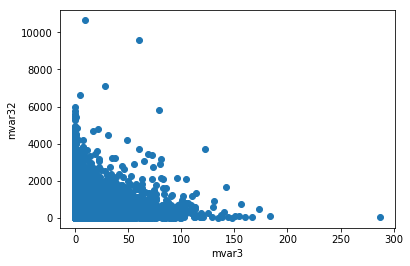

Correlation: -0.114250639688


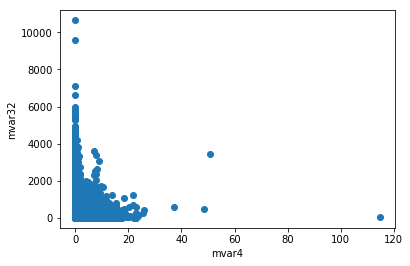

Correlation: -0.104995269617


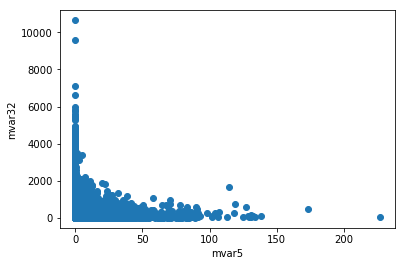

Correlation: -0.0914449489179


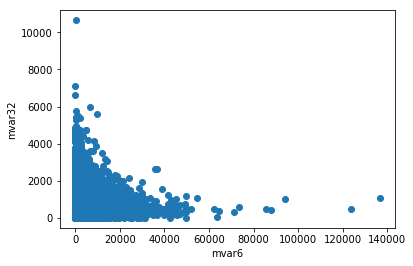

Correlation: 0.131581860158


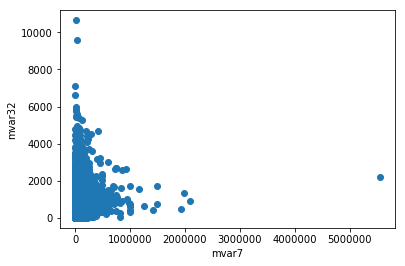

Correlation: 0.250327642472


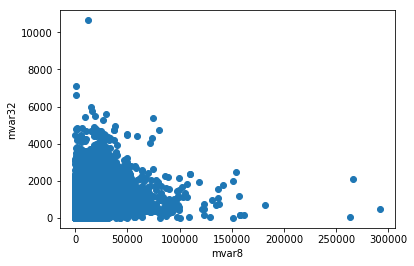

Correlation: 0.43953268346


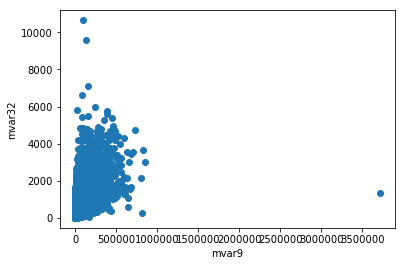

Correlation: 0.691604740424


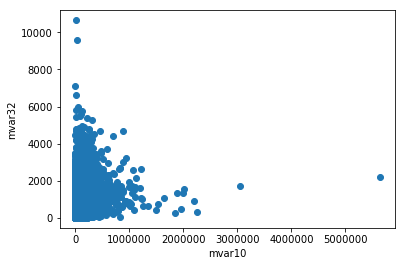

Correlation: 0.407414366488


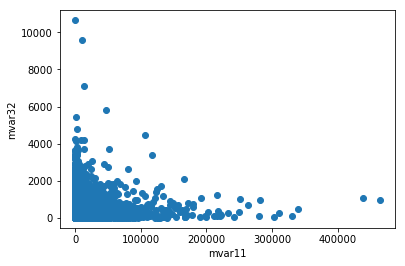

Correlation: 0.0320346687958


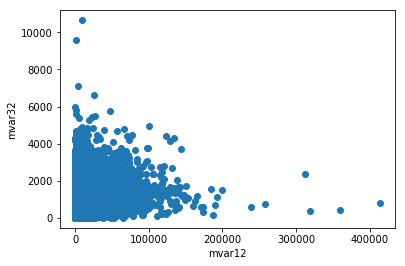

Correlation: 0.338216627325


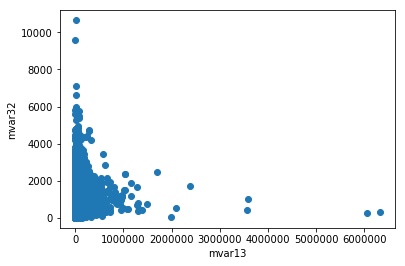

Correlation: 0.196818121803


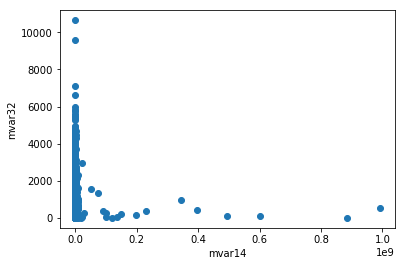

Correlation: -0.000124887516123


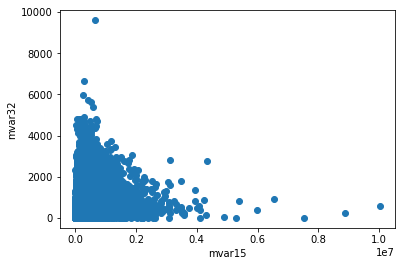

Correlation: 0.176082060494


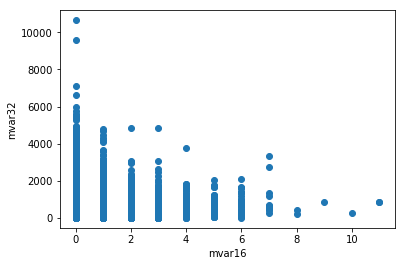

Correlation: -0.0713256882884


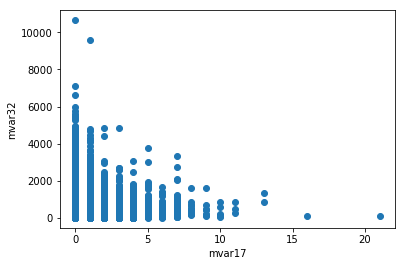

Correlation: -0.0654522263447


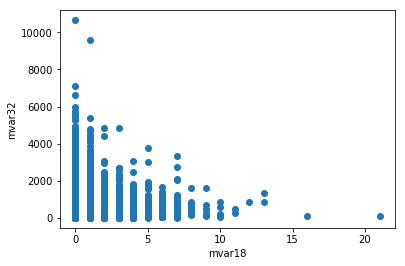

Correlation: -0.0602053984058


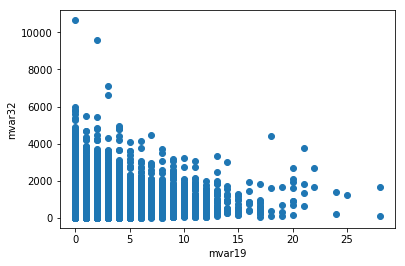

Correlation: 0.0459040401441


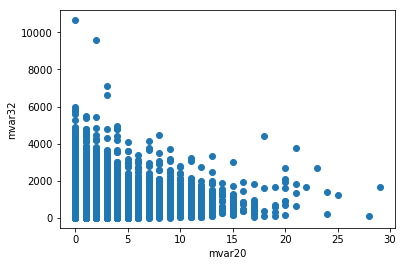

Correlation: 0.0635295209731


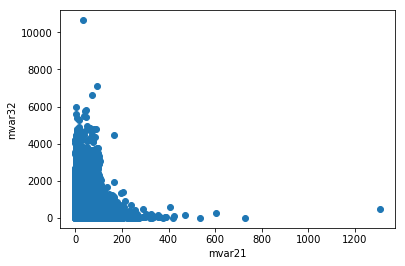

Correlation: -0.277633282427


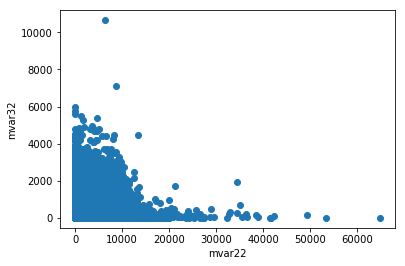

Correlation: -0.258722882925


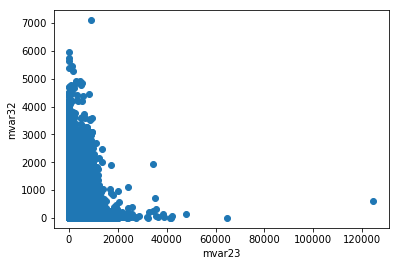

Correlation: -0.255741687283


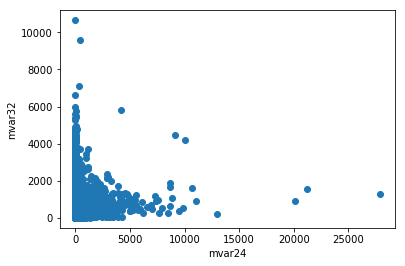

Correlation: -0.0019176069988


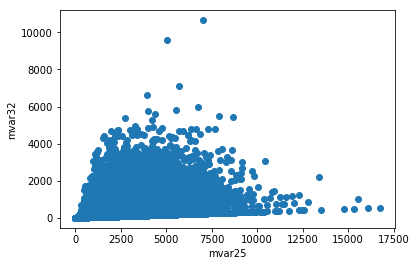

Correlation: 0.597991945287


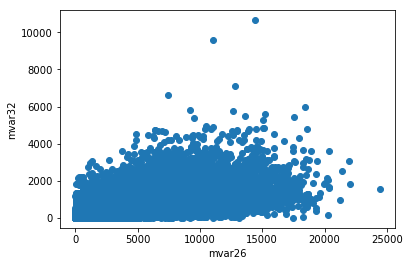

Correlation: 0.687801932912


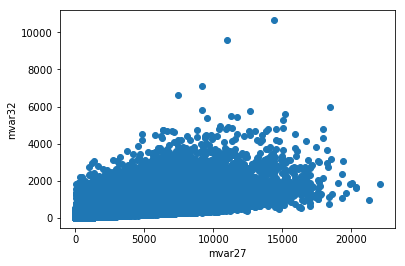

Correlation: 0.704259972377


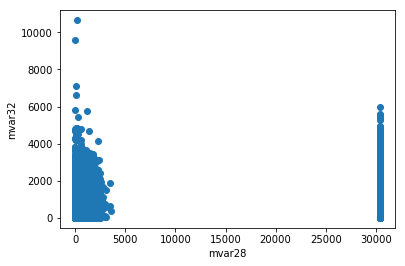

Correlation: 0.197354928031


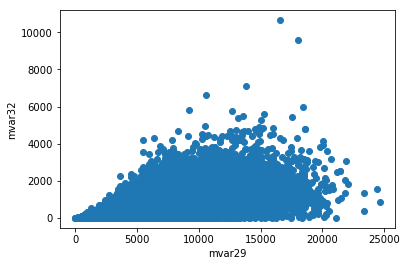

Correlation: 0.627384894704


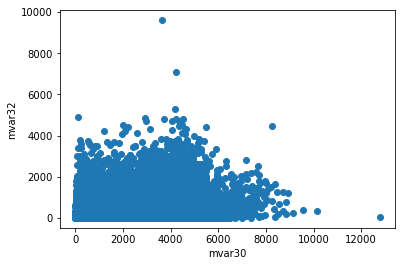

Correlation: 0.262987120127


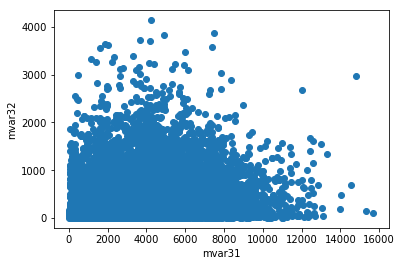

Correlation: 0.176676020317


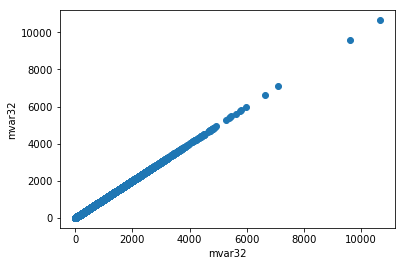

Correlation: 1.0


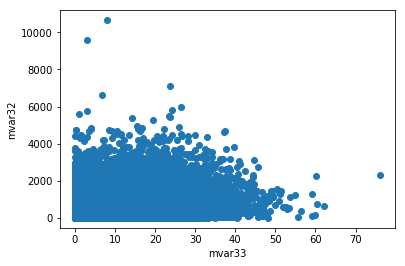

Correlation: 0.327978494022


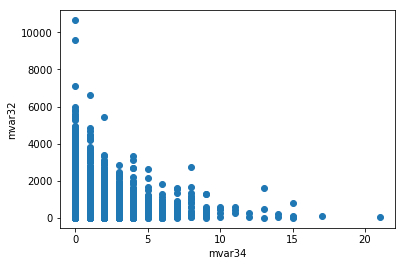

Correlation: -0.0200160251398


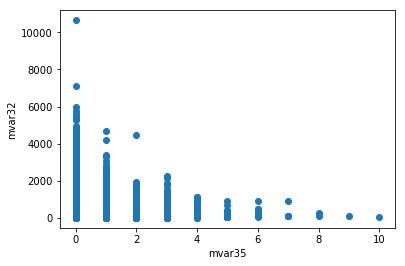

Correlation: -0.129956182351


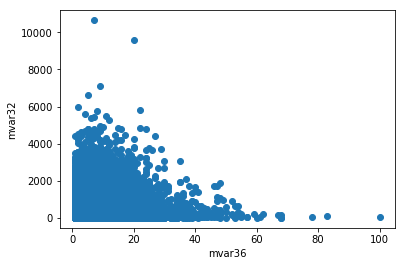

Correlation: 0.0303001182746


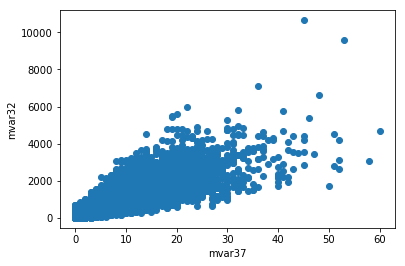

Correlation: 0.869230336295


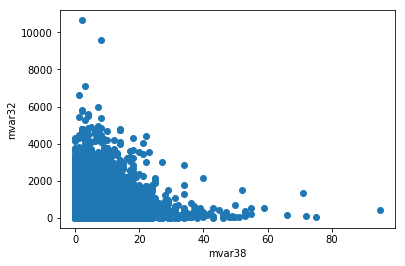

Correlation: -0.074090067548


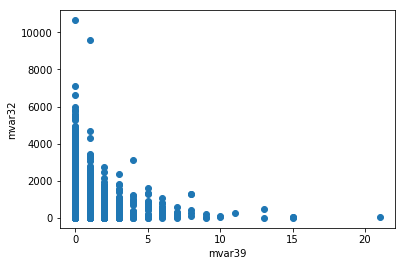

Correlation: -0.0459297985839


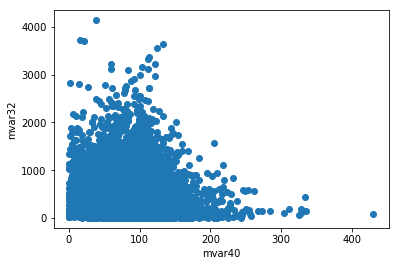

Correlation: -0.217330376965


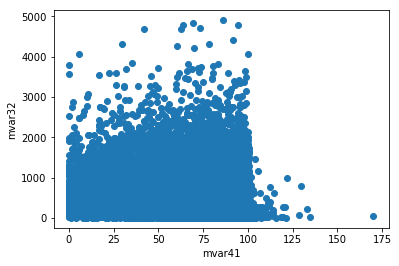

Correlation: -0.192949317124


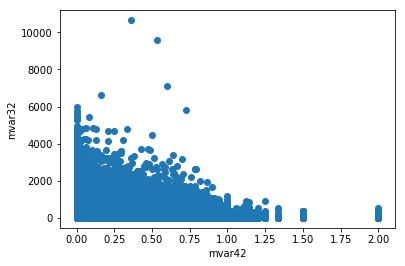

Correlation: -0.365768478345


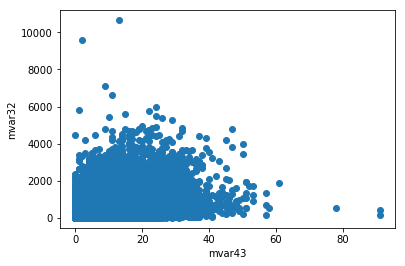

Correlation: 0.421262266319


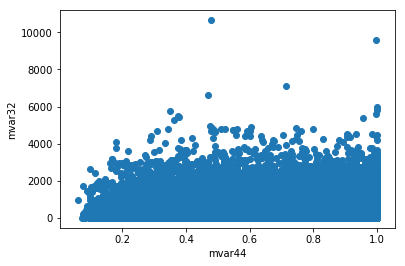

Correlation: -0.0252670311796


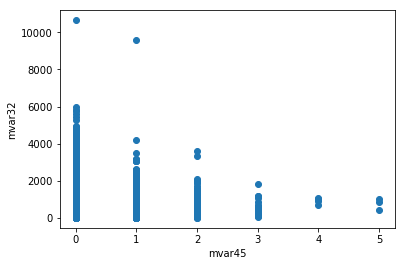

Correlation: -0.0697980460493


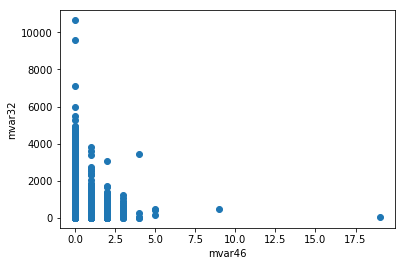

Correlation: -0.130551116059


In [46]:
v1 = 32
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

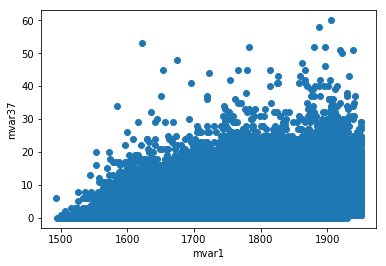

Correlation: 0.357138208817


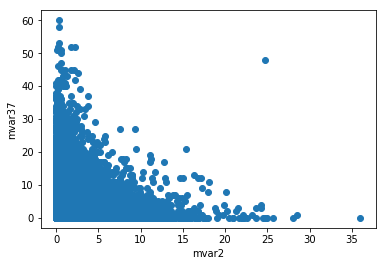

Correlation: -0.141625760467


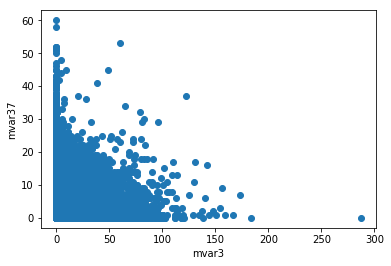

Correlation: -0.0592020868249


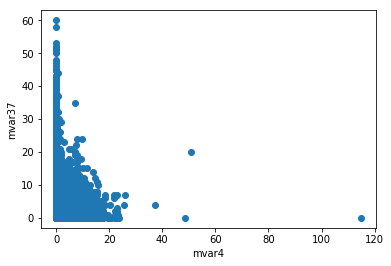

Correlation: -0.0858899210421


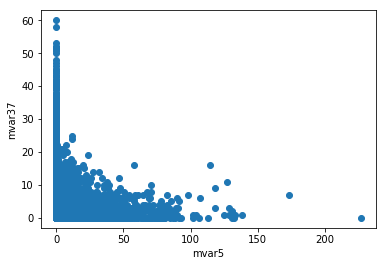

Correlation: -0.0742324960067


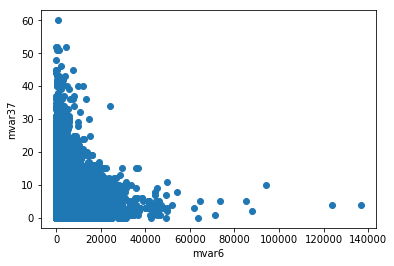

Correlation: 0.0990305700545


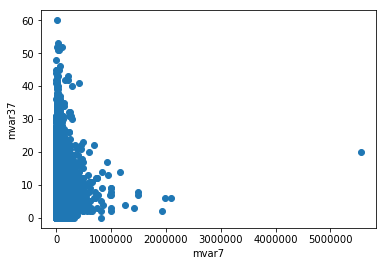

Correlation: 0.200982644775


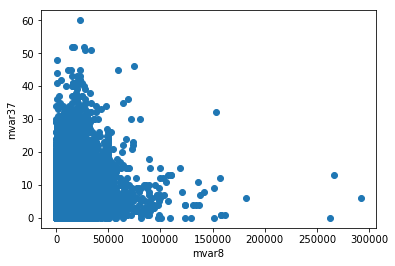

Correlation: 0.348711552376


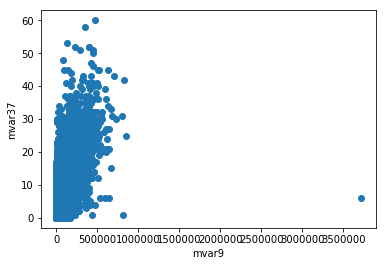

Correlation: 0.671694191456


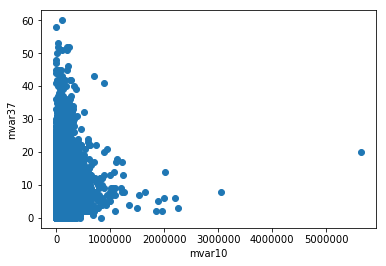

Correlation: 0.335644073696


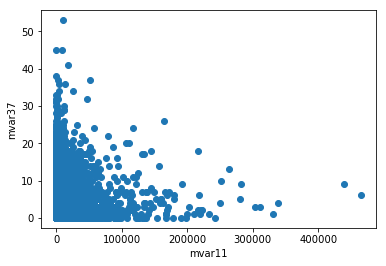

Correlation: 0.0628383725331


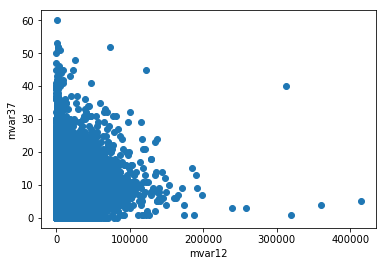

Correlation: 0.261260513316


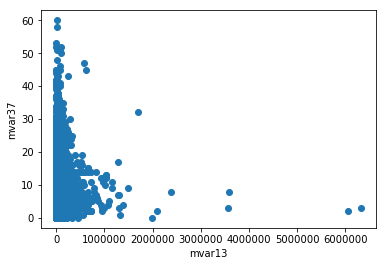

Correlation: 0.153495237995


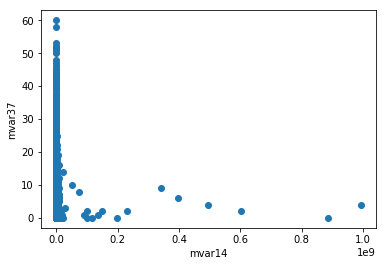

Correlation: -0.000485588930136


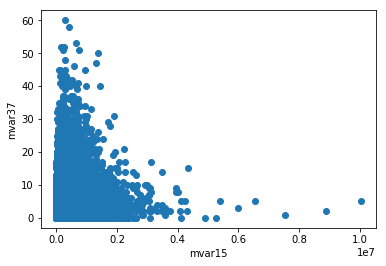

Correlation: 0.130721032921


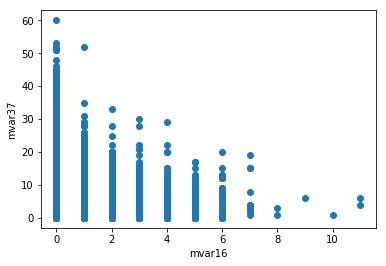

Correlation: -0.0751785852772


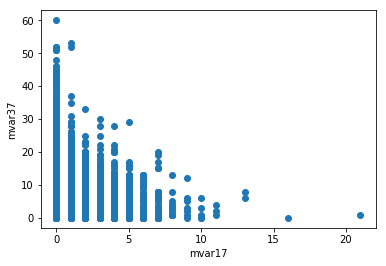

Correlation: -0.0711228182491


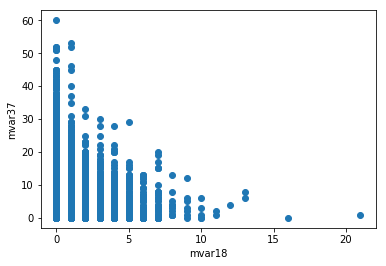

Correlation: -0.0660478229566


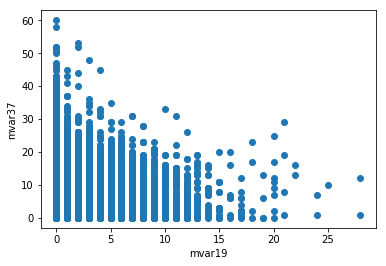

Correlation: 0.0202687060033


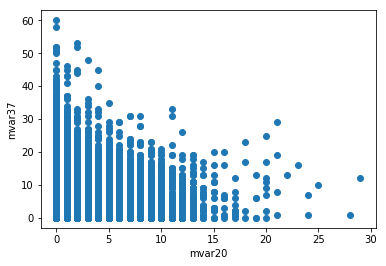

Correlation: 0.0353434260021


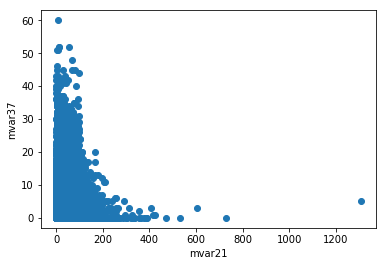

Correlation: -0.23673490203


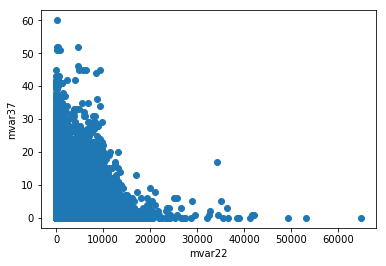

Correlation: -0.233321363175


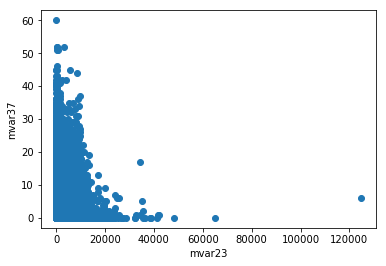

Correlation: -0.2291621271


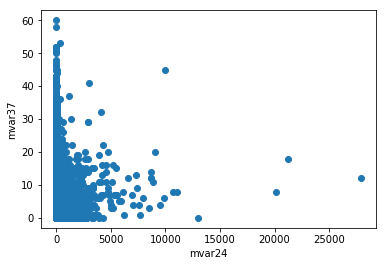

Correlation: 0.0116954793769


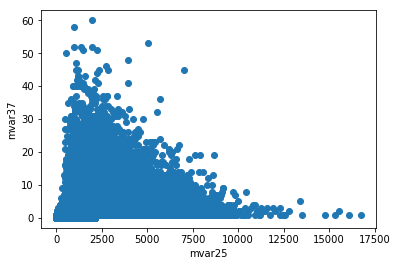

Correlation: 0.382898644513


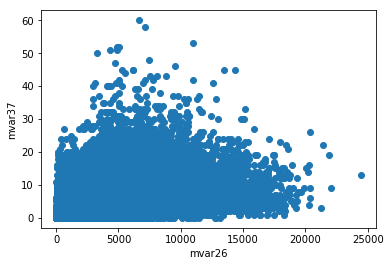

Correlation: 0.529873489497


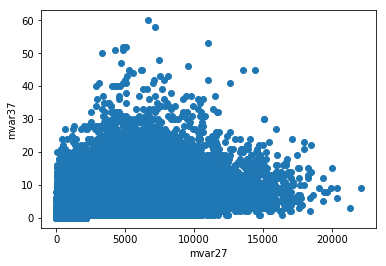

Correlation: 0.531450895377


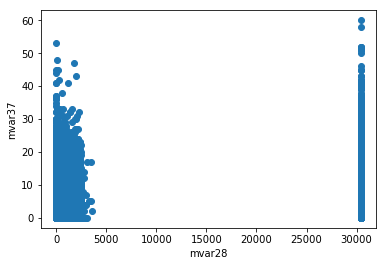

Correlation: 0.120968163487


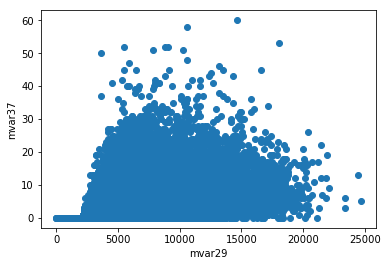

Correlation: 0.48944773301


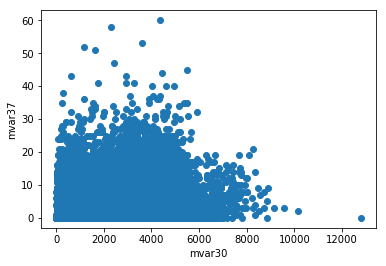

Correlation: 0.275182042525


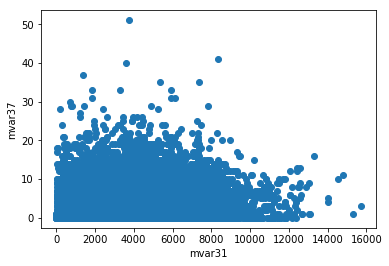

Correlation: 0.180198615839


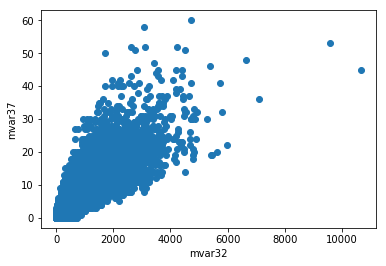

Correlation: 0.869230336295


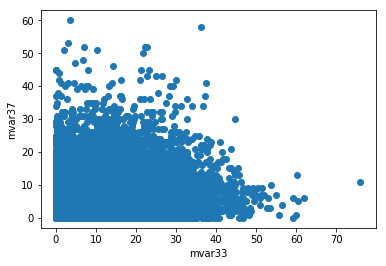

Correlation: 0.259437422484


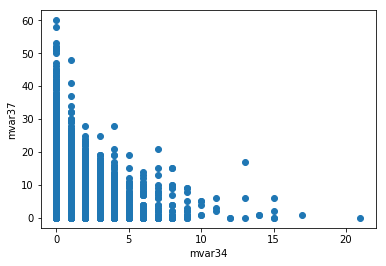

Correlation: -0.0209169703362


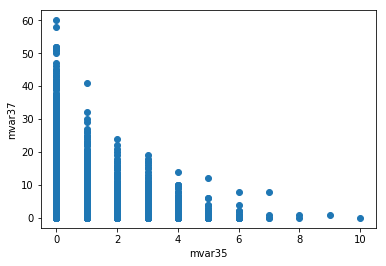

Correlation: -0.125880091894


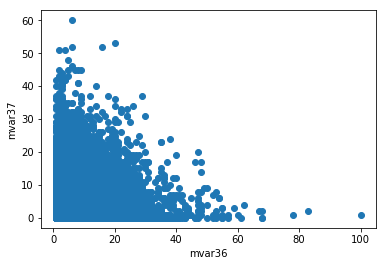

Correlation: 0.0247820231528


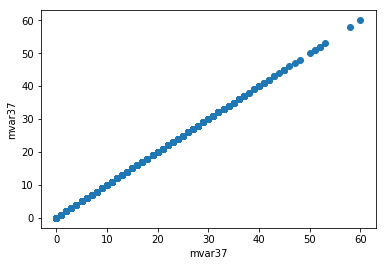

Correlation: 1.0


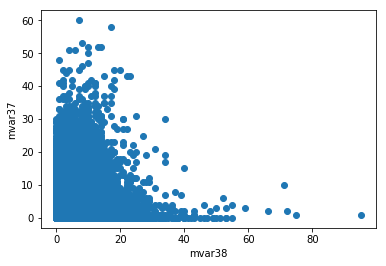

Correlation: -0.0529345764145


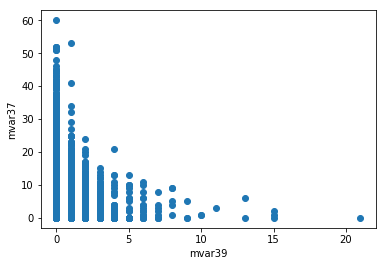

Correlation: -0.041614533312


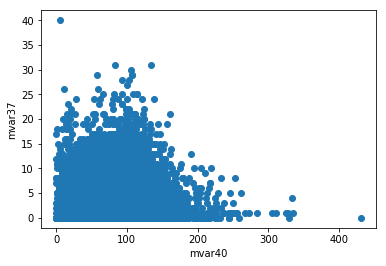

Correlation: -0.198809958705


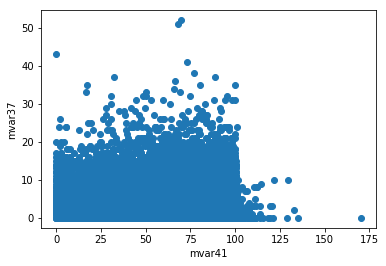

Correlation: -0.168565685465


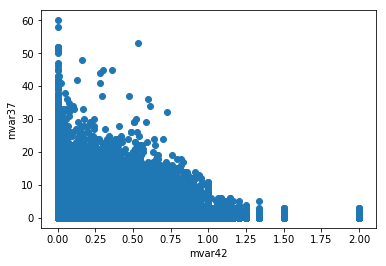

Correlation: -0.310005930784


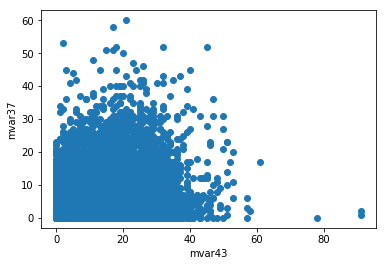

Correlation: 0.378256392627


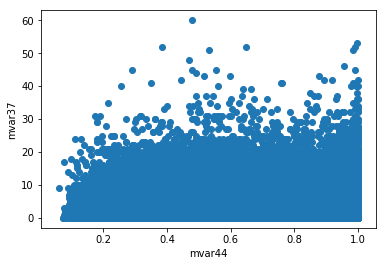

Correlation: -0.00489503025341


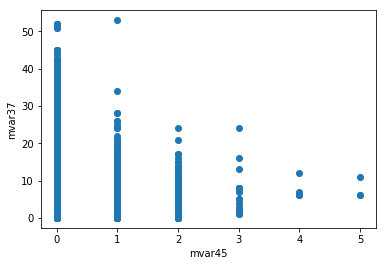

Correlation: -0.0531448804969


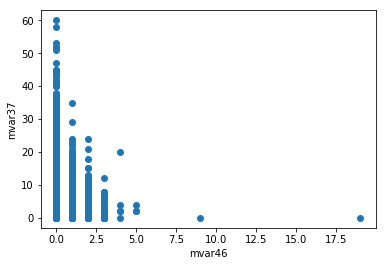

Correlation: -0.114972265664


In [47]:
v1 = 37
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

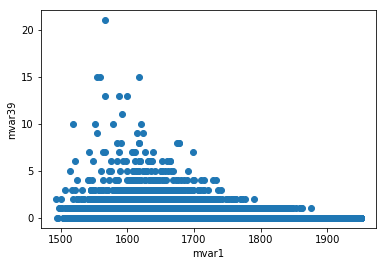

Correlation: -0.250906902364


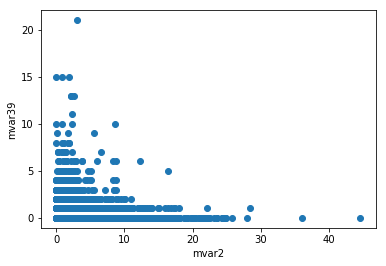

Correlation: 0.0539523120462


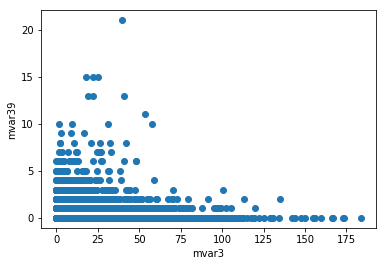

Correlation: 0.128313994097


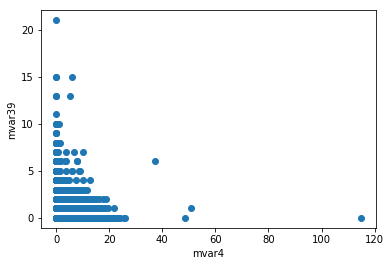

Correlation: 0.123631019593


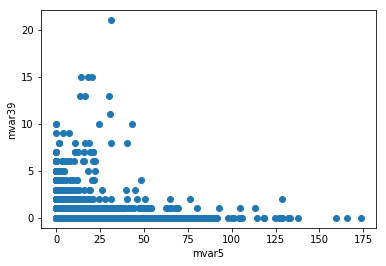

Correlation: 0.0588550129195


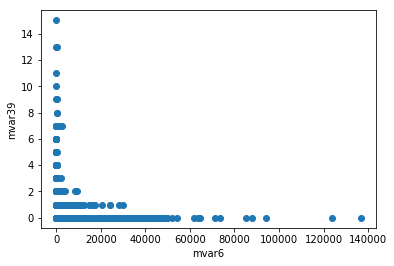

Correlation: -0.0760155871633


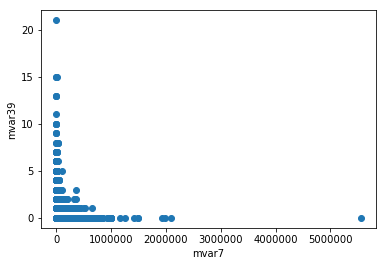

Correlation: -0.0145916312297


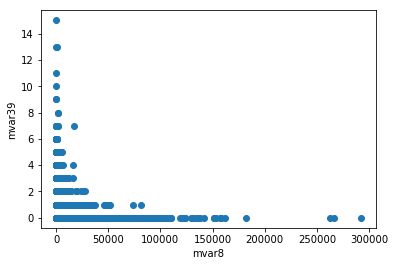

Correlation: -0.10304146547


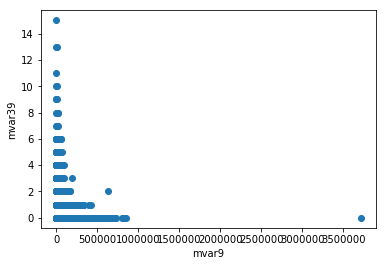

Correlation: -0.0741083489571


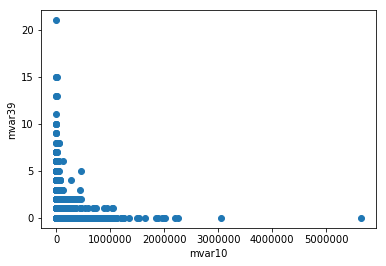

Correlation: -0.0291969028809


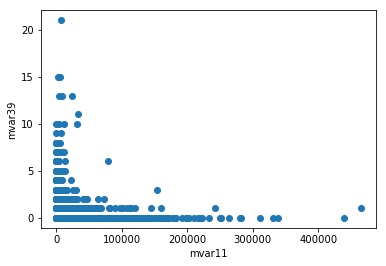

Correlation: 0.000881041425802


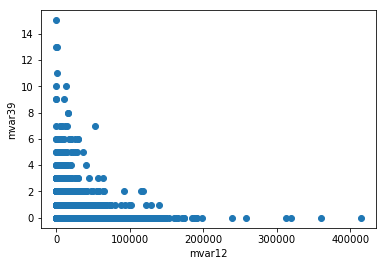

Correlation: -0.00810735117705


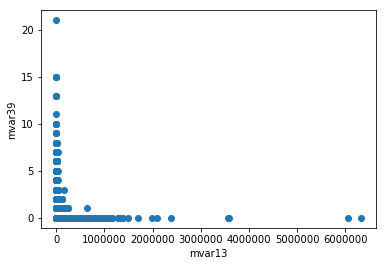

Correlation: -0.0344819914845


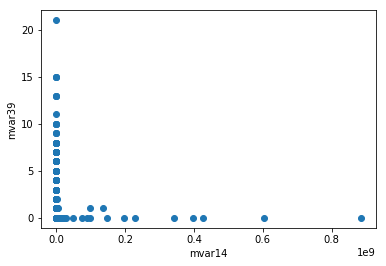

Correlation: -0.00157451820203


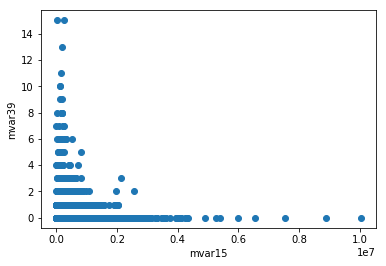

Correlation: -0.0452943671867


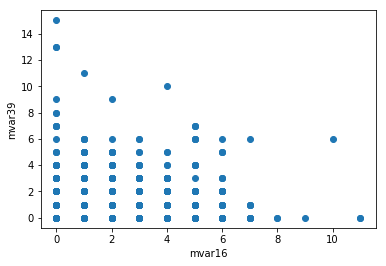

Correlation: 0.278722853592


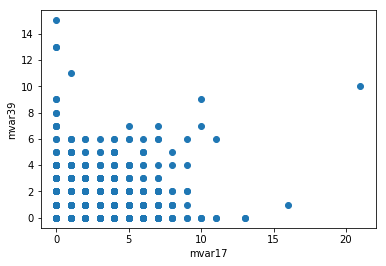

Correlation: 0.303510319532


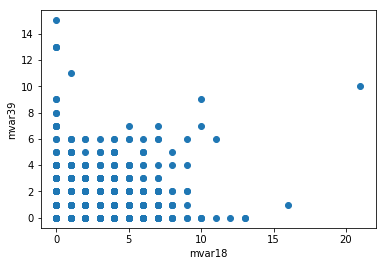

Correlation: 0.297221021432


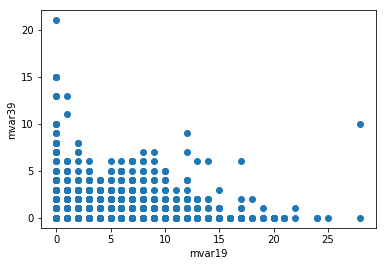

Correlation: 0.139970965579


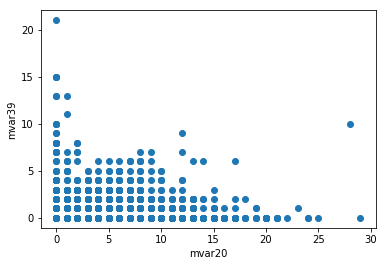

Correlation: 0.139956376081


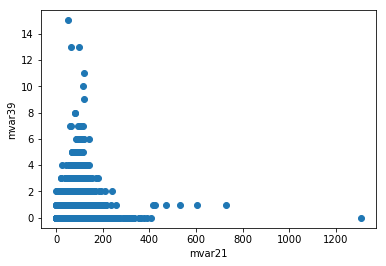

Correlation: 0.184046827072


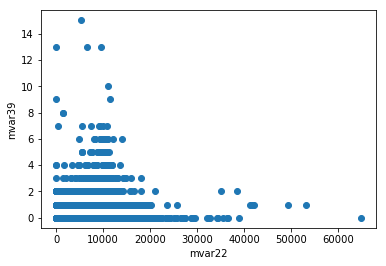

Correlation: 0.179315324866


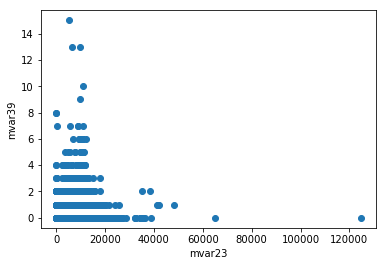

Correlation: 0.173208510025


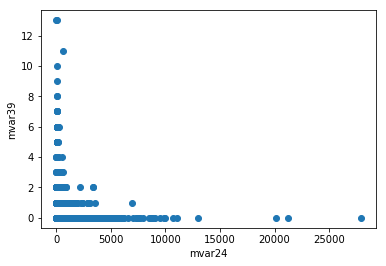

Correlation: 0.0342700954877


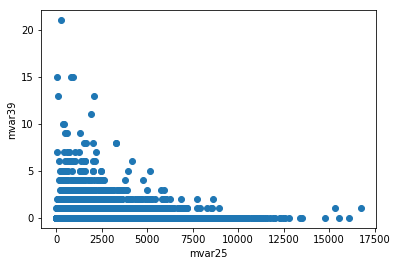

Correlation: -0.0372461310483


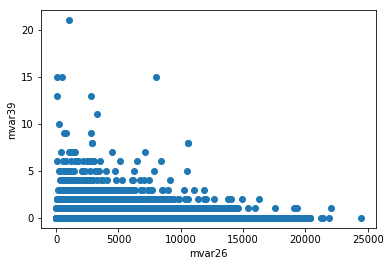

Correlation: -0.0360085071495


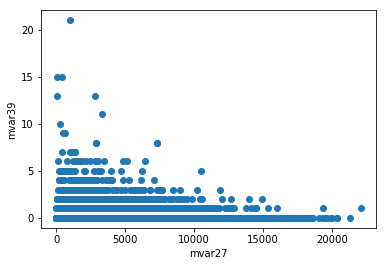

Correlation: -0.0408766751286


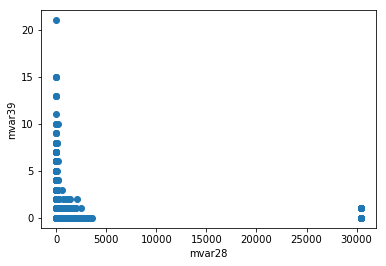

Correlation: -0.143652664879


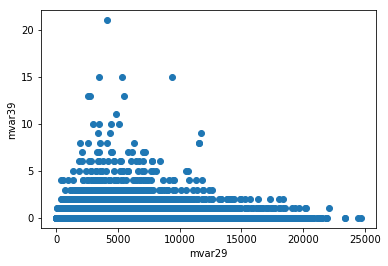

Correlation: -0.0231029561148


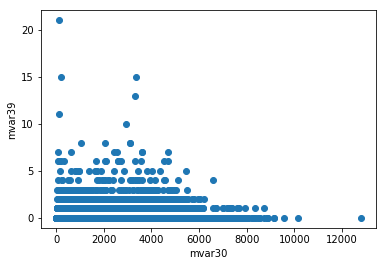

Correlation: -0.0239860383562


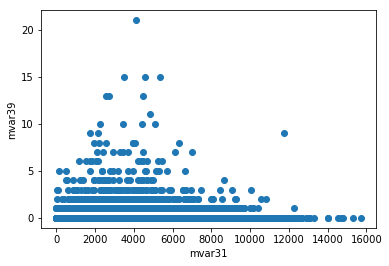

Correlation: 0.00222672398286


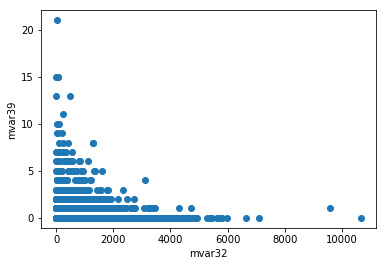

Correlation: -0.0459297985839


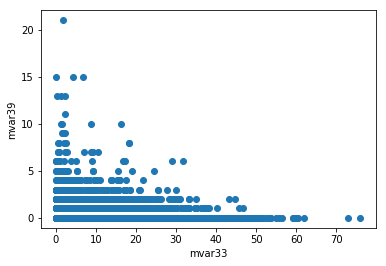

Correlation: -0.0204193690417


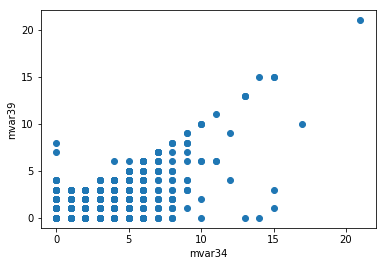

Correlation: 0.639352210405


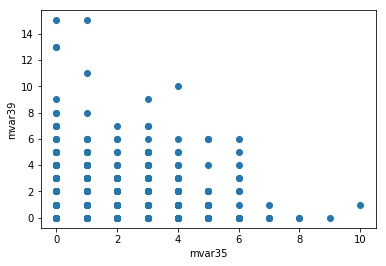

Correlation: 0.295919094675


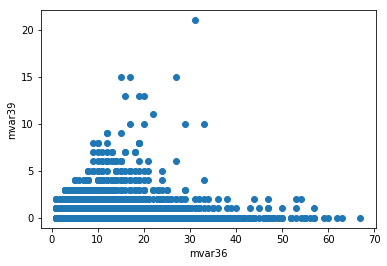

Correlation: 0.130225585246


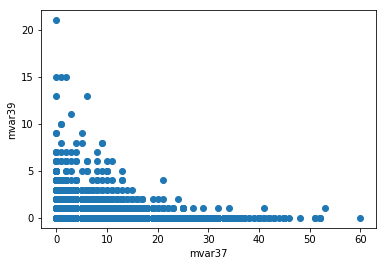

Correlation: -0.041614533312


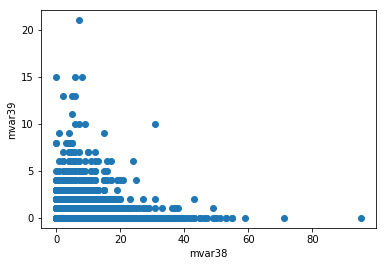

Correlation: 0.0603223958951


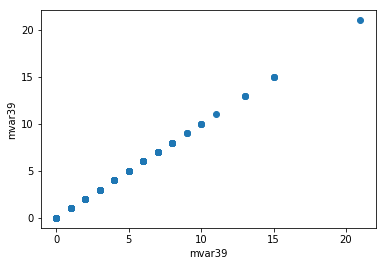

Correlation: 1.0


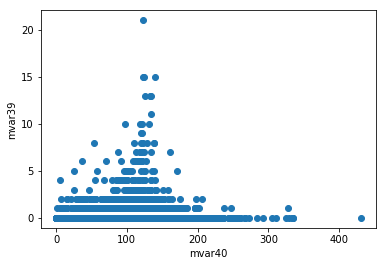

Correlation: 0.0606184468383


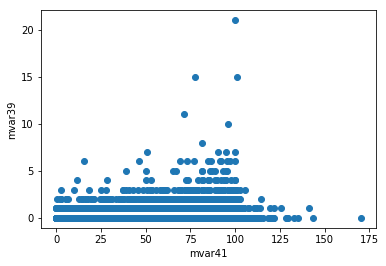

Correlation: 0.00954317821735


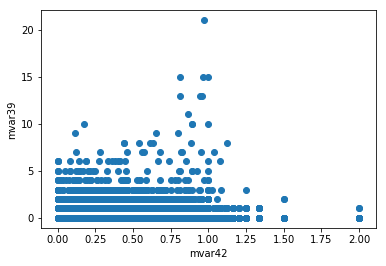

Correlation: 0.0910676892432


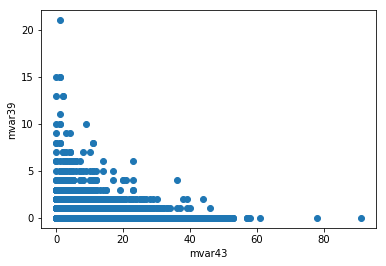

Correlation: -0.0654155477031


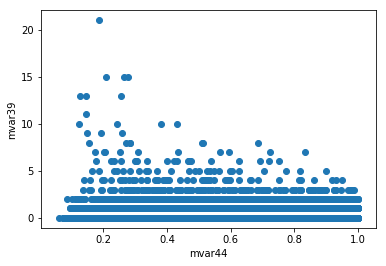

Correlation: -0.0625645661507


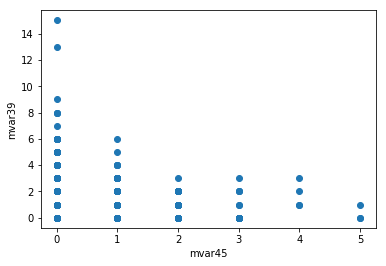

Correlation: 0.171391406471


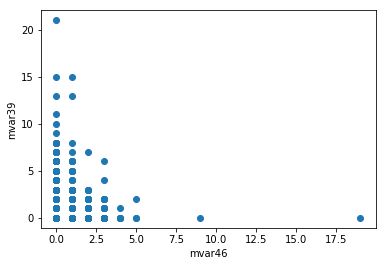

Correlation: 0.102376420381


In [48]:
v1 = 39
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

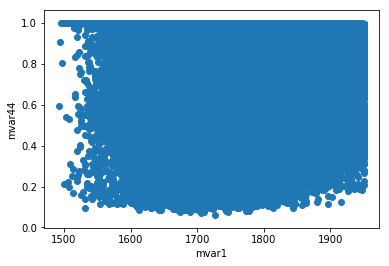

Correlation: 0.0216156406811


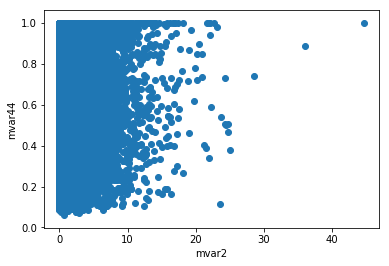

Correlation: -0.0894051103617


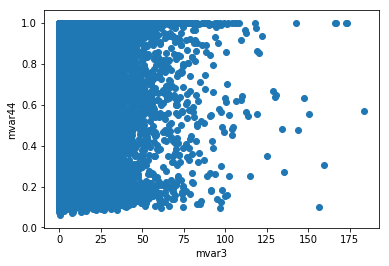

Correlation: -0.0189253036409


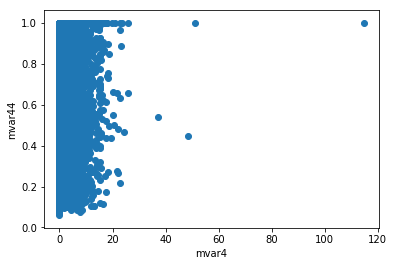

Correlation: 0.00121310338369


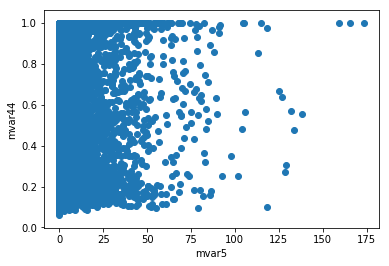

Correlation: -0.067406020679


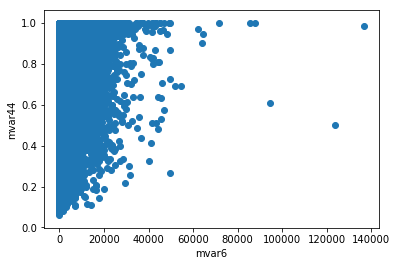

Correlation: 0.152520771686


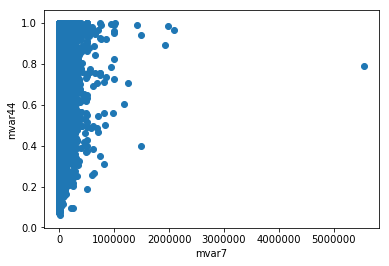

Correlation: 0.0366606245138


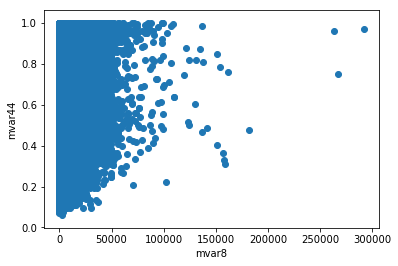

Correlation: 0.0893214036095


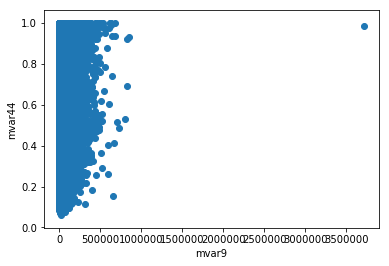

Correlation: 0.00103169404937


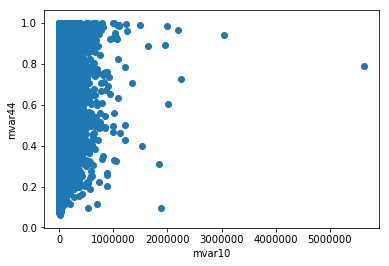

Correlation: -0.0111594615311


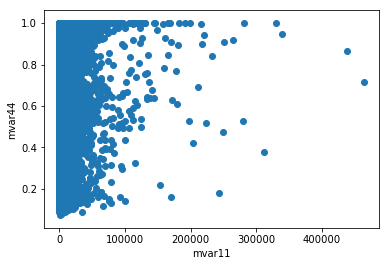

Correlation: 0.0266817094165


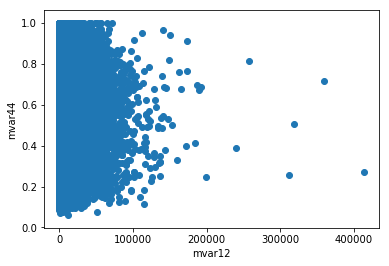

Correlation: -0.224707457219


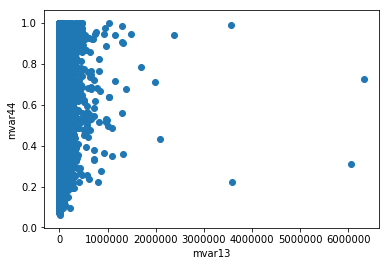

Correlation: -0.0290144032988


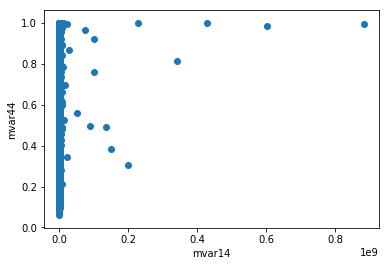

Correlation: 0.00647500405632


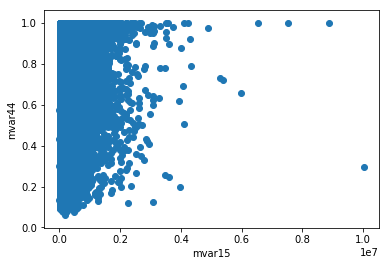

Correlation: 0.0588667400373


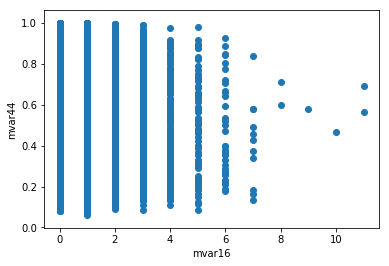

Correlation: -0.162049585572


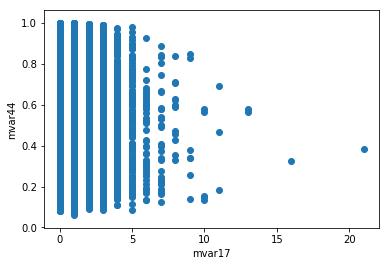

Correlation: -0.174534161372


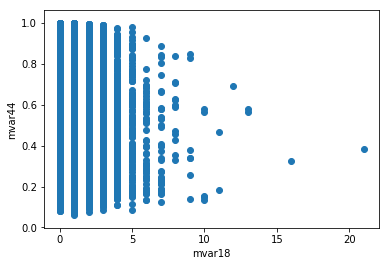

Correlation: -0.177650171119


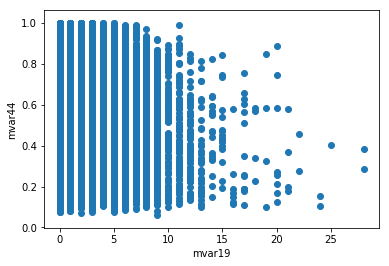

Correlation: -0.308354009875


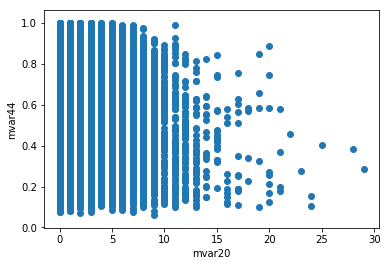

Correlation: -0.313551417752


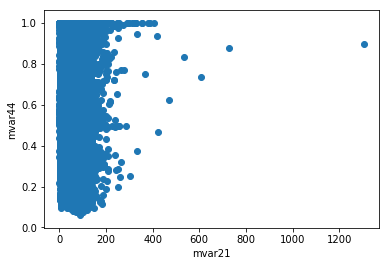

Correlation: -0.180784853647


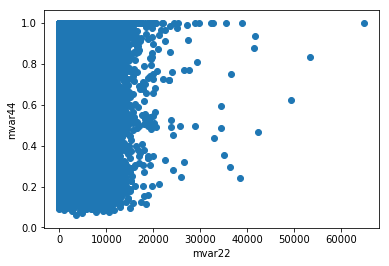

Correlation: -0.170510398749


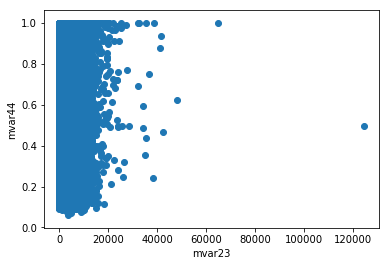

Correlation: -0.155629146072


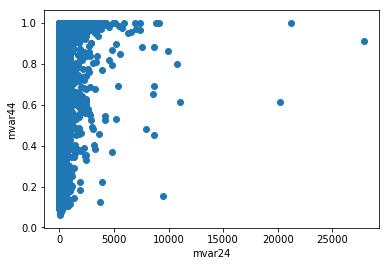

Correlation: 0.00713253497724


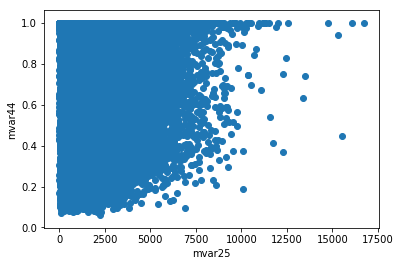

Correlation: 0.0821157625319


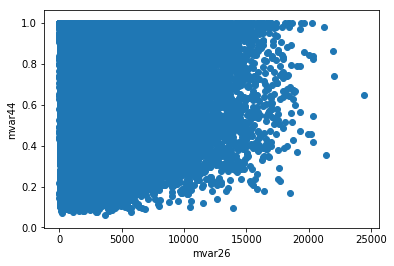

Correlation: 0.0247212719221


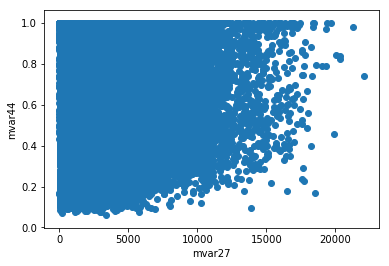

Correlation: 0.0334319406537


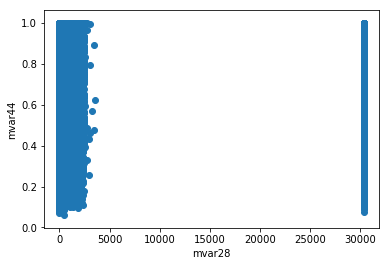

Correlation: 0.0487374935379


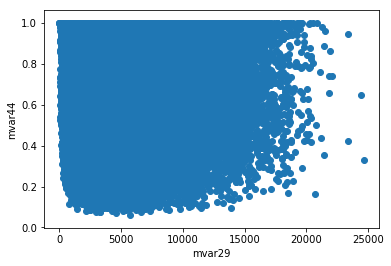

Correlation: 0.0223958721435


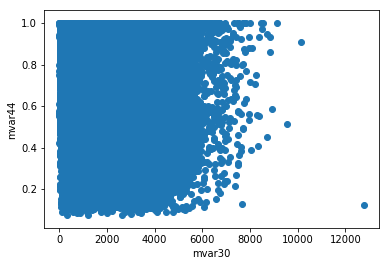

Correlation: 0.0280435300053


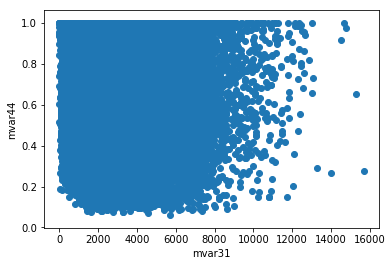

Correlation: 0.116473293709


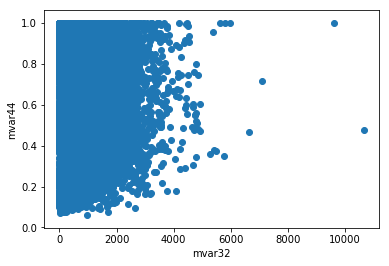

Correlation: -0.0252670311796


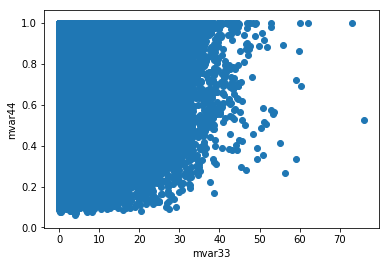

Correlation: 0.0543831107614


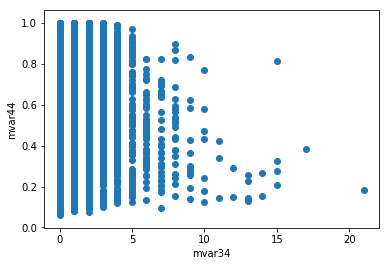

Correlation: -0.0881408641704


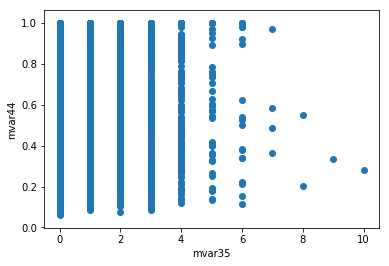

Correlation: -0.0302771077873


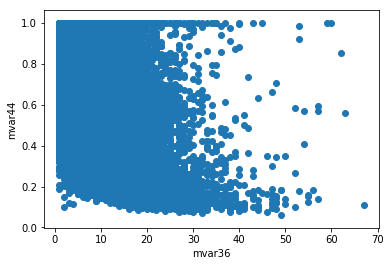

Correlation: -0.461160018672


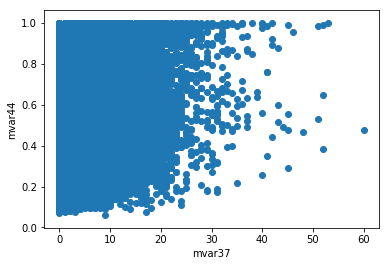

Correlation: -0.00489503025341


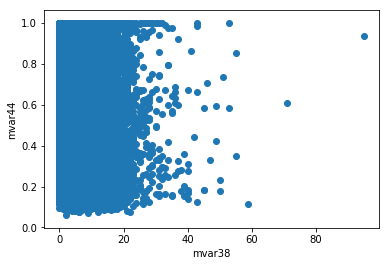

Correlation: -0.277986825444


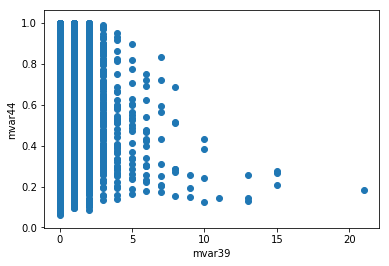

Correlation: -0.0625645661507


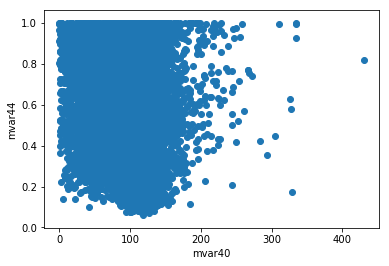

Correlation: -0.14593781353


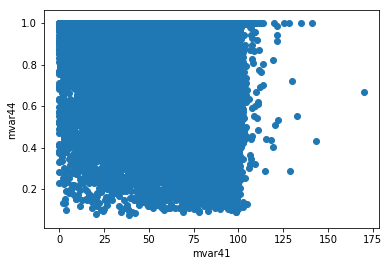

Correlation: 0.032476306601


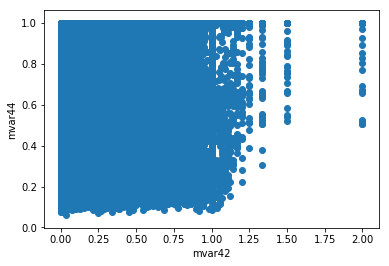

Correlation: 0.13830355759


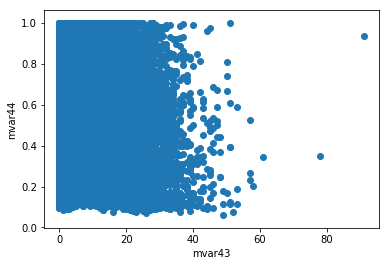

Correlation: -0.377501421781


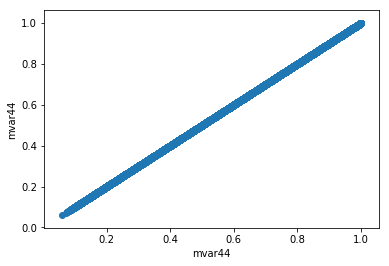

Correlation: 1.0


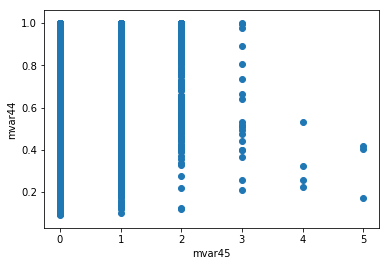

Correlation: 0.040534940266


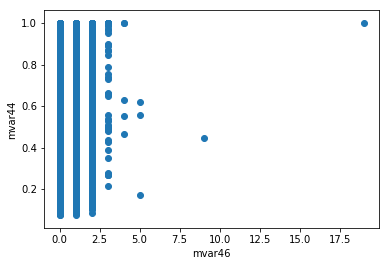

Correlation: 0.00862184716823


In [49]:
v1 = 44
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

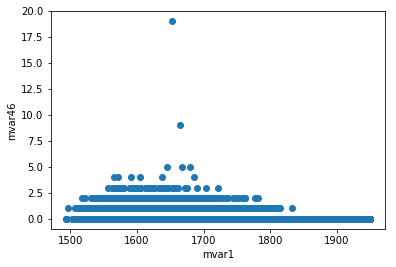

Correlation: -0.321960467915


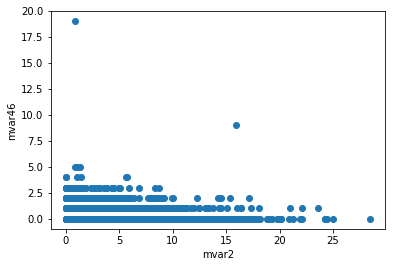

Correlation: 0.100935721817


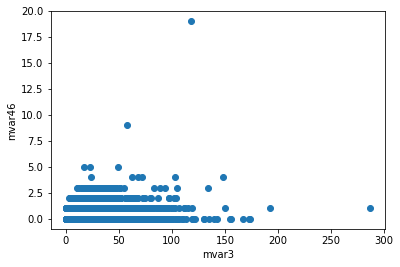

Correlation: 0.39232157732


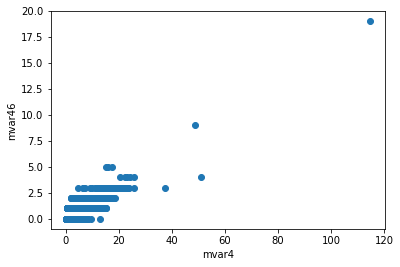

Correlation: 0.89207473567


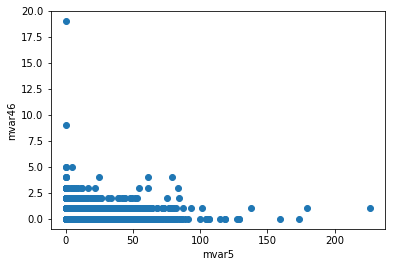

Correlation: 0.117823700288


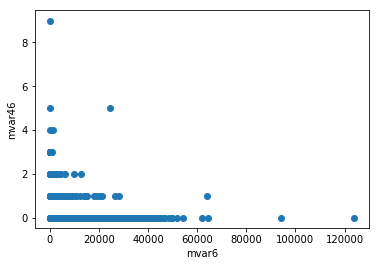

Correlation: -0.0624845590532


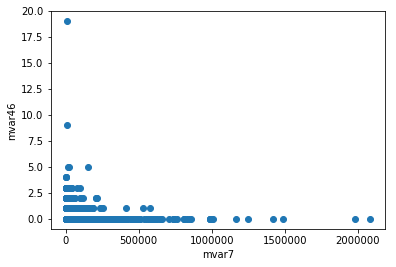

Correlation: -0.0625468172599


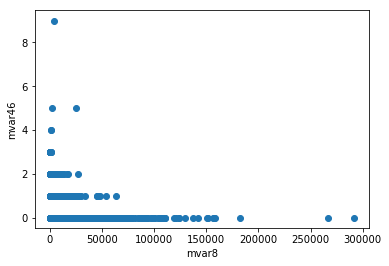

Correlation: -0.109787382461


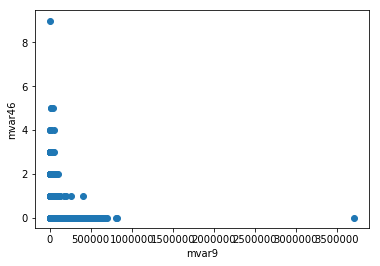

Correlation: -0.127856254203


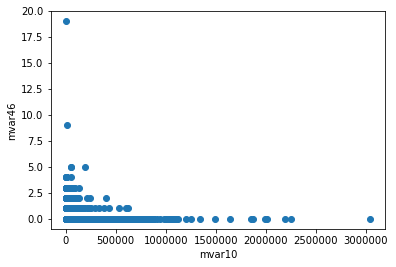

Correlation: -0.102893325237


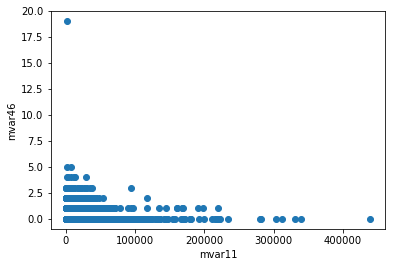

Correlation: 0.0569444945248


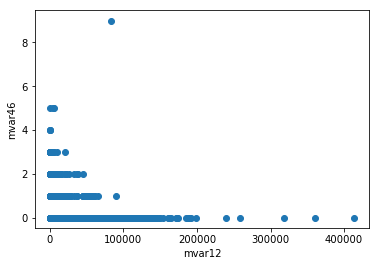

Correlation: -0.0845804243036


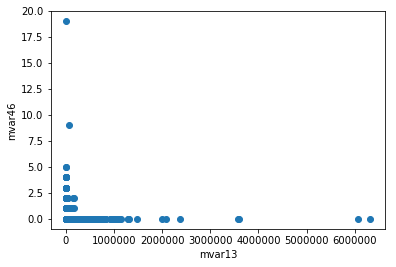

Correlation: -0.0611394448345


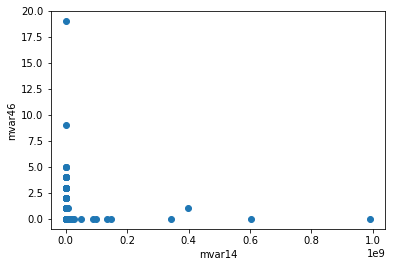

Correlation: -0.000188355080267


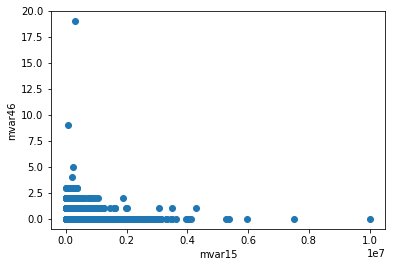

Correlation: -0.0797533119109


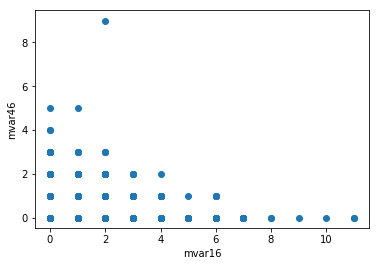

Correlation: 0.0737387803109


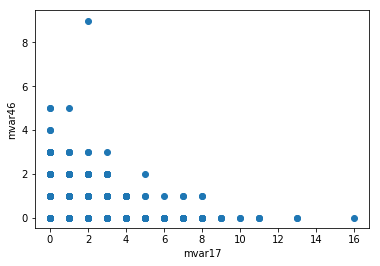

Correlation: 0.0619606537948


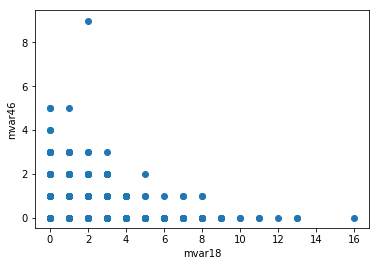

Correlation: 0.0595069175691


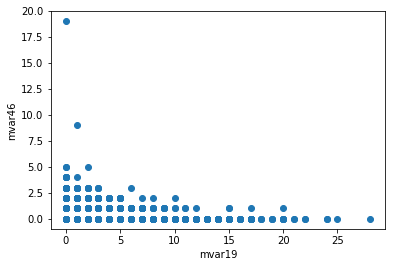

Correlation: -0.0556937558634


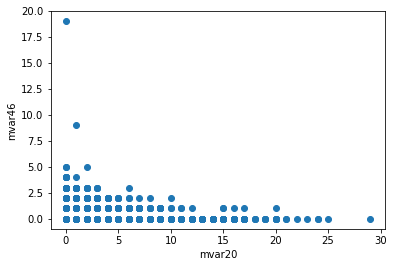

Correlation: -0.0608458185113


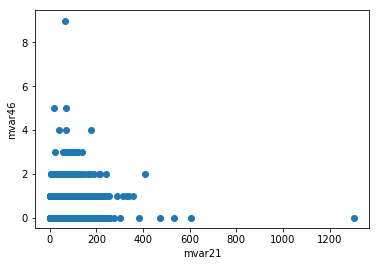

Correlation: 0.14621644131


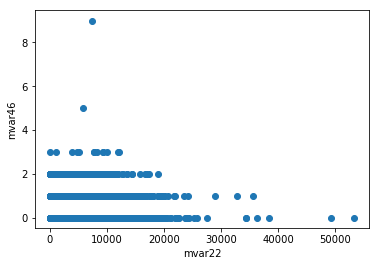

Correlation: 0.130797982956


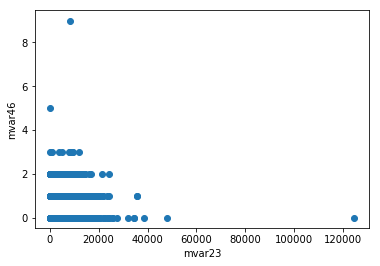

Correlation: 0.119292954912


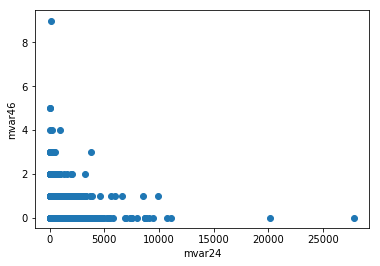

Correlation: 0.0723960054319


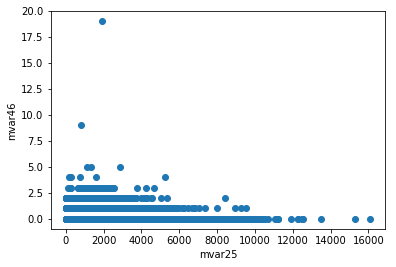

Correlation: -0.0983128677615


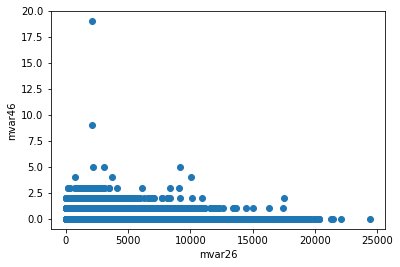

Correlation: -0.105280226432


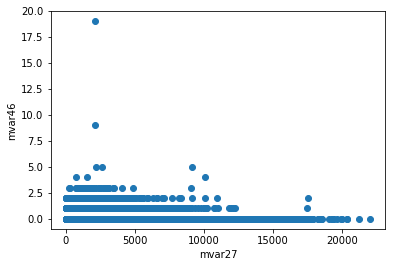

Correlation: -0.101933533898


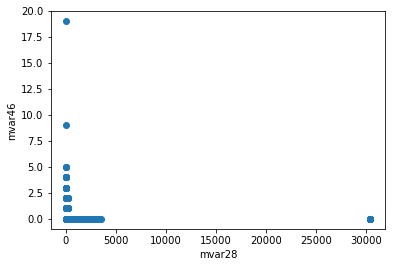

Correlation: -0.168777277215


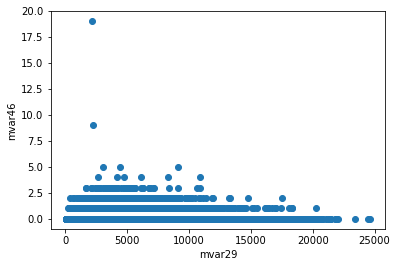

Correlation: -0.111773757332


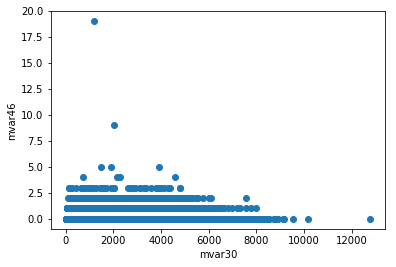

Correlation: -0.0435465867408


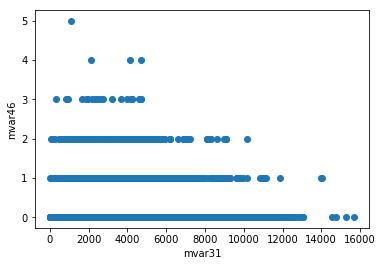

Correlation: -0.049012591099


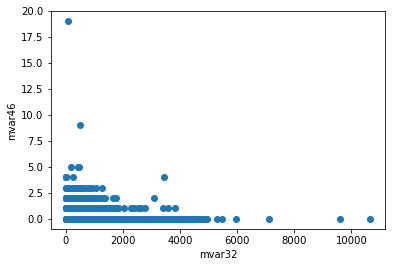

Correlation: -0.130551116059


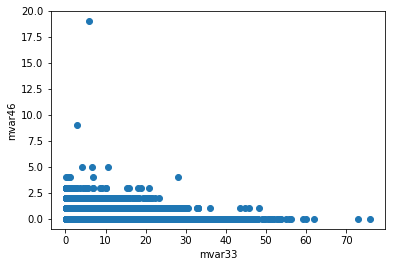

Correlation: -0.0969041363598


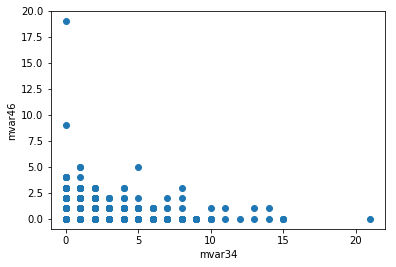

Correlation: 0.0371261174404


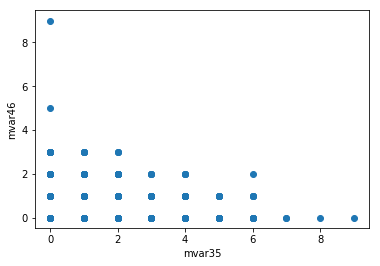

Correlation: 0.175592156826


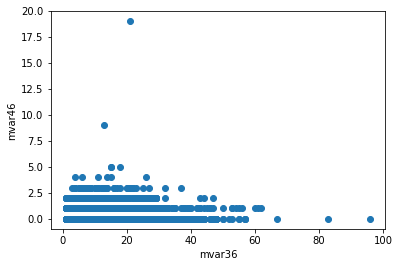

Correlation: 0.136080239641


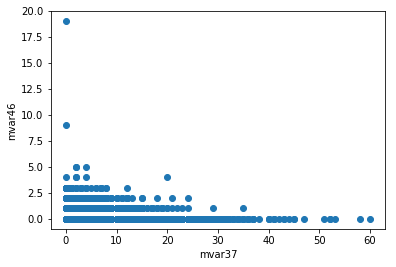

Correlation: -0.114972265664


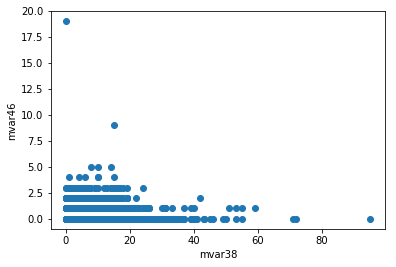

Correlation: 0.060411643094


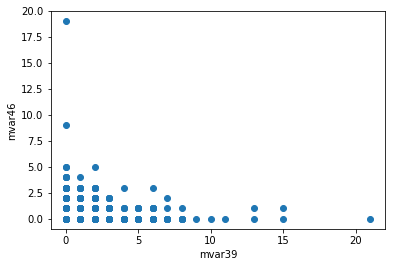

Correlation: 0.102376420381


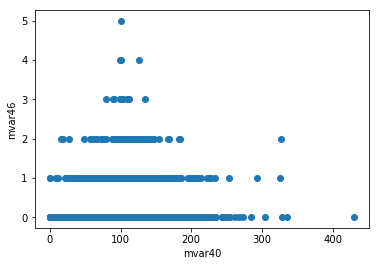

Correlation: 0.127499571675


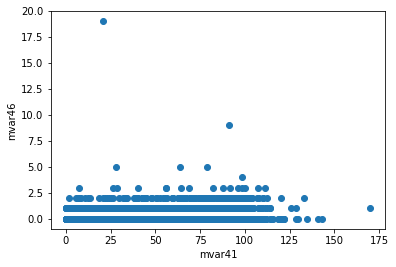

Correlation: 0.00998589935615


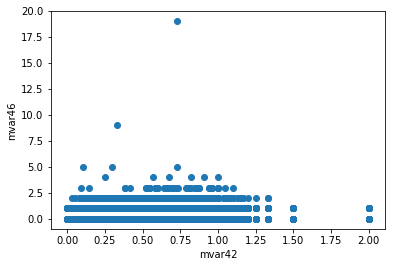

Correlation: 0.333598348115


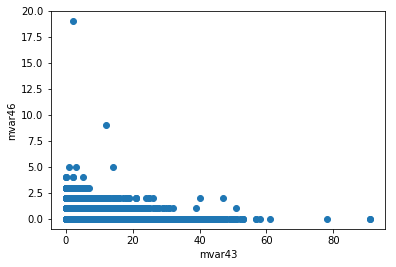

Correlation: -0.178939733913


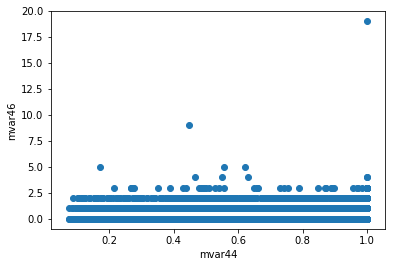

Correlation: 0.00862184716823


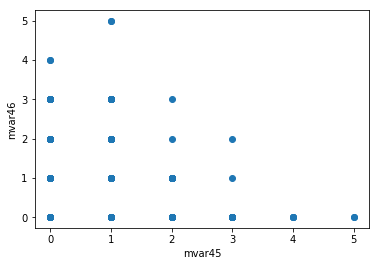

Correlation: 0.140546404828


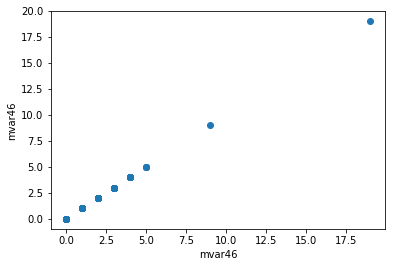

Correlation: 1.0


In [50]:
v1 = 46
for i in range(1, 47):
    v2=i
    plt.scatter(gameDf.iloc[:,v2-1], gameDf.iloc[:, v1-1])
    plt.xlabel("mvar"+str(v2))
    plt.ylabel("mvar"+str(v1))
    plt.show()
    print("Correlation:", gameDf.iloc[:, v1-1].corr(gameDf.iloc[:,v2-1]))

In [ ]:
#Histogram Analysis

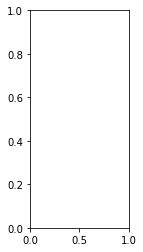

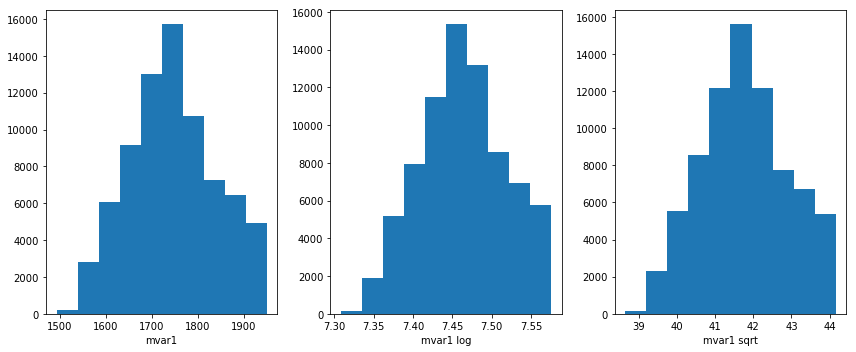

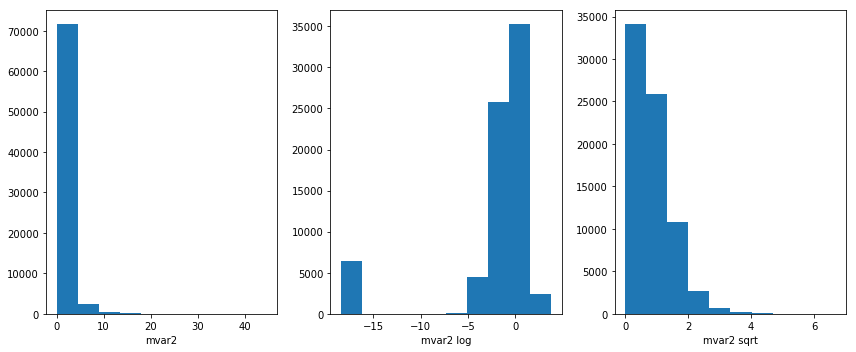

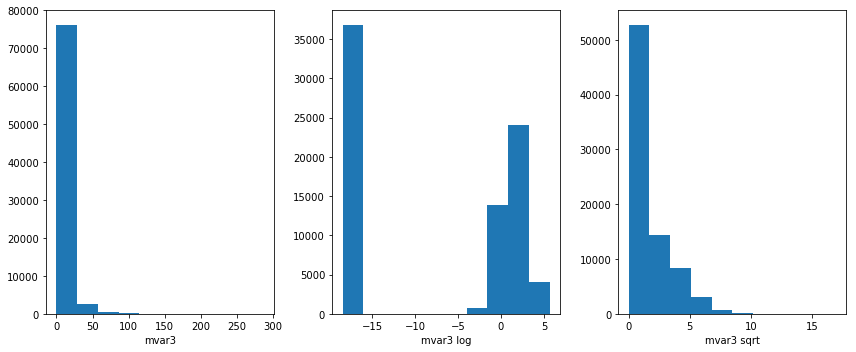

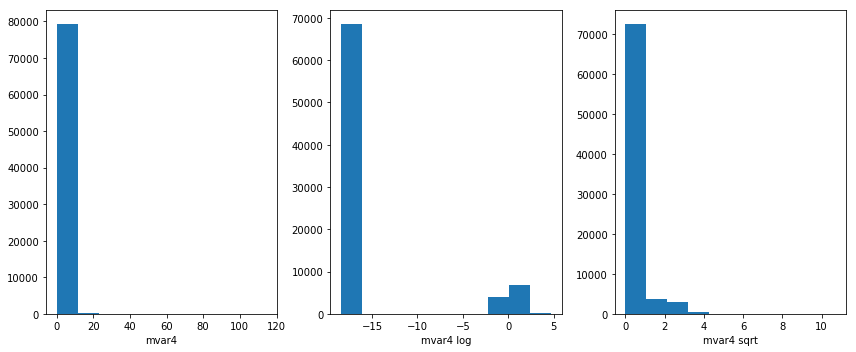

...

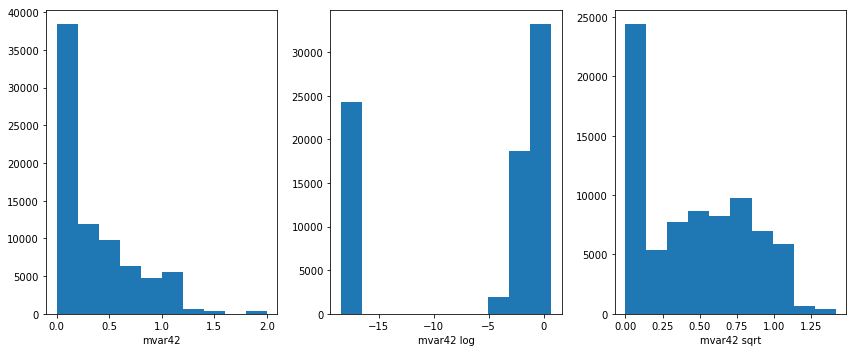

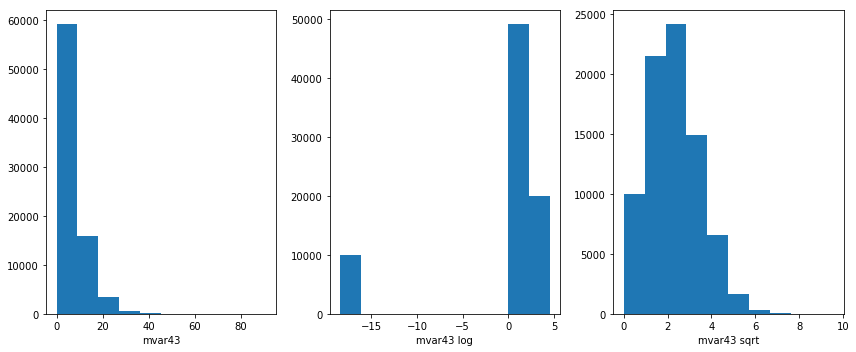

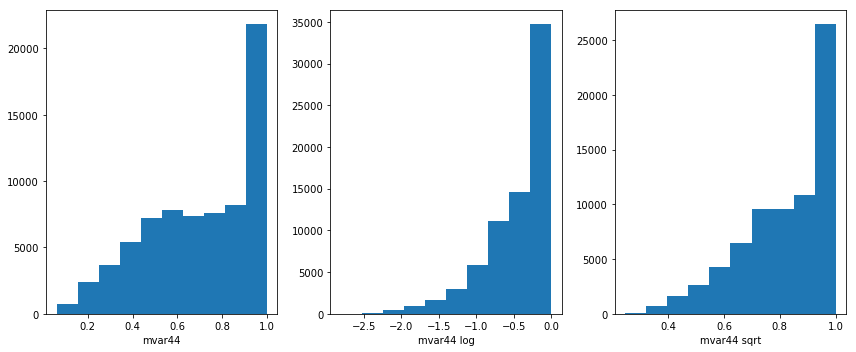

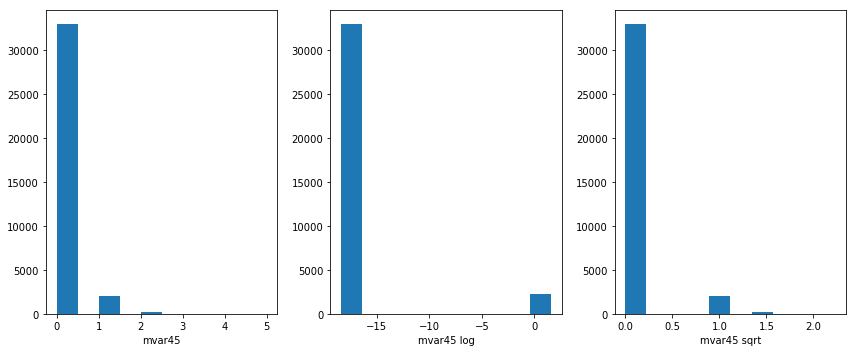

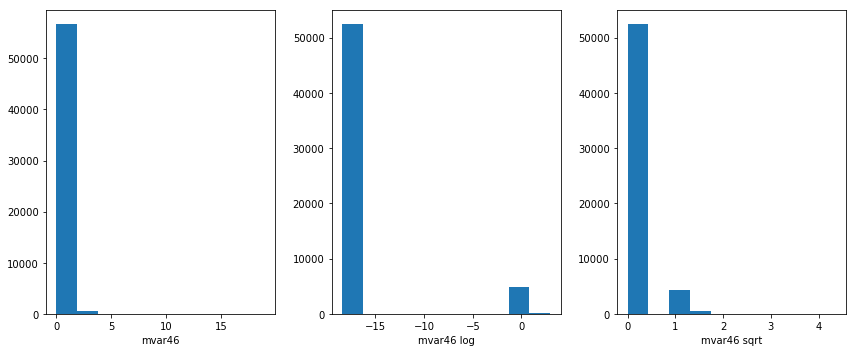

TypeError: len() of unsized object

In [77]:

for i in features:
    
    plt.figure(figsize=(12,5))
    plt.subplot(1, 3, 1)
    plt.hist(gameDf[dic[i]].dropna())
    plt.xlabel(dic[i])
#     plt.show()
    
    plt.subplot(1, 3, 2)
    plt.hist(np.log(gameDf[dic[i]].dropna()+1e-8))
    plt.xlabel(dic[i]+" log")
    
    plt.subplot(1, 3, 3)
    plt.hist(np.sqrt(gameDf[dic[i]].dropna()))
    plt.xlabel(dic[i]+" sqrt")
    
    plt.tight_layout()
    plt.show()
    
#     print(dic[i])

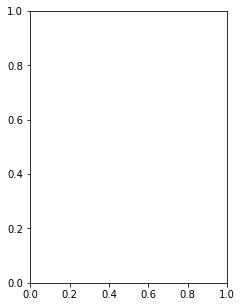

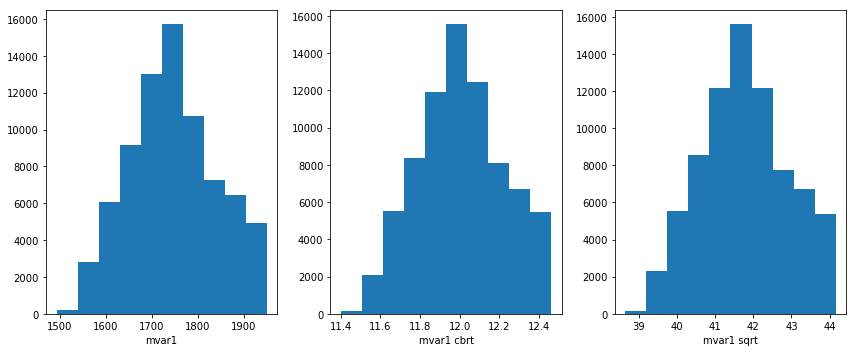

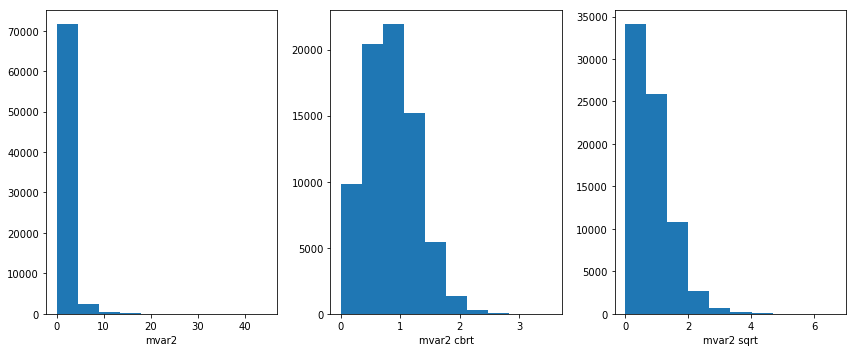

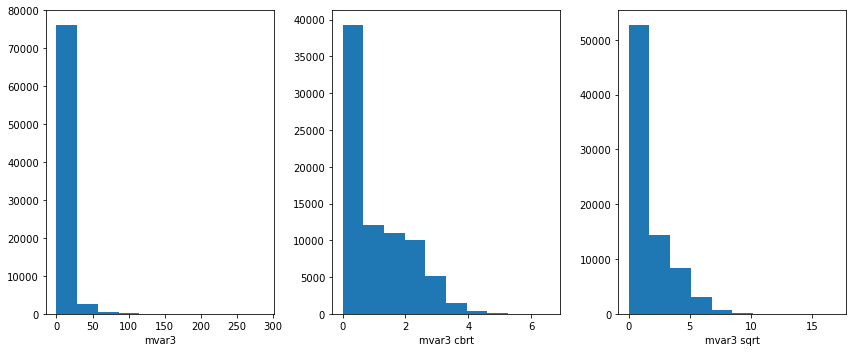

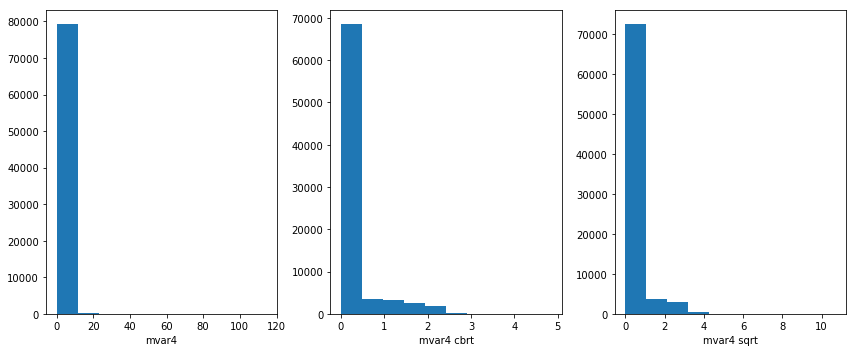

...

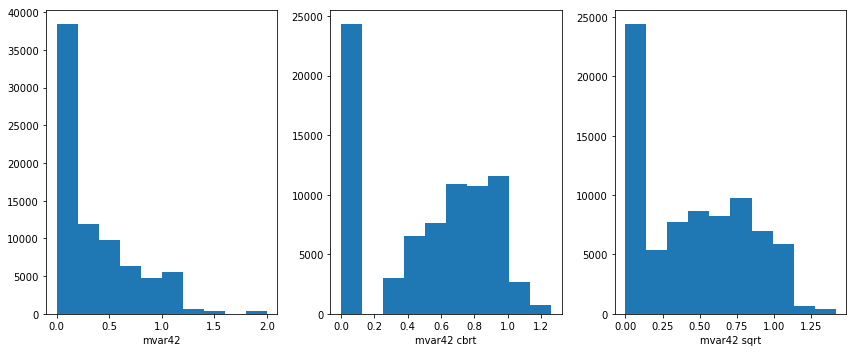

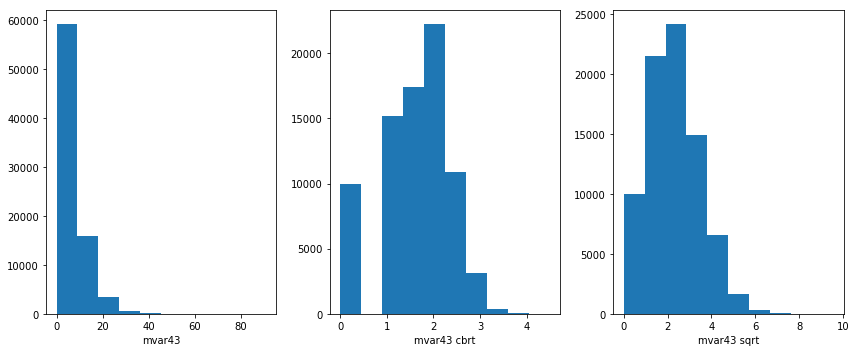

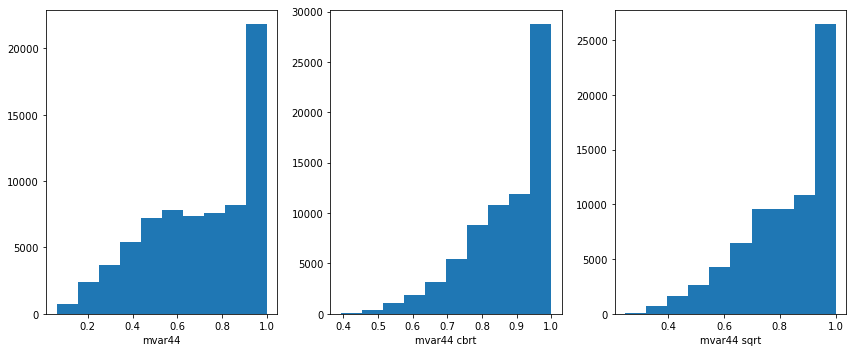

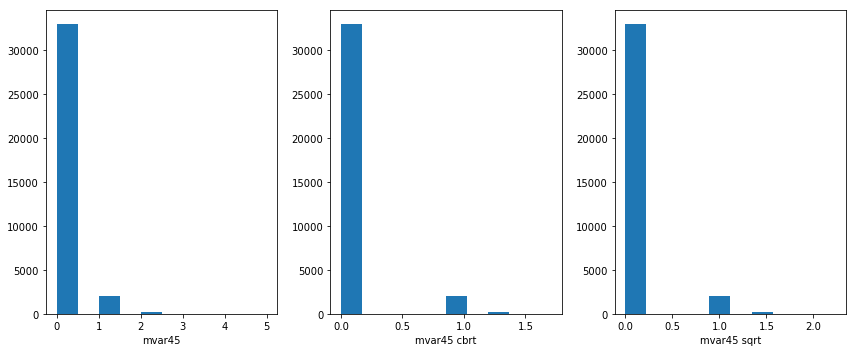

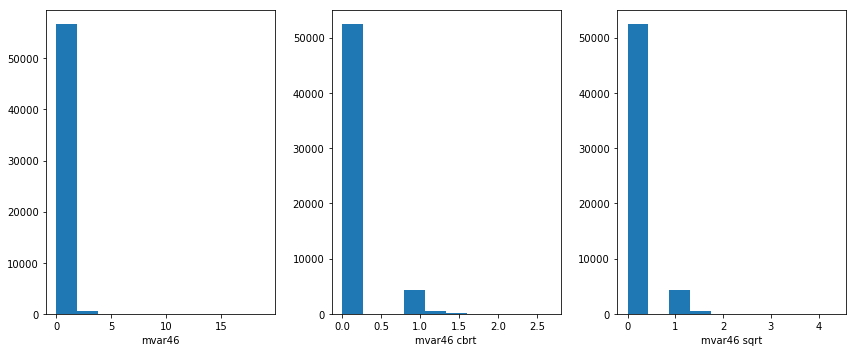

TypeError: len() of unsized object

In [80]:

for i in features:
    
    plt.figure(figsize=(12,5))
    plt.subplot(1, 3, 1)
    plt.hist(gameDf[dic[i]].dropna())
    plt.xlabel(dic[i])
#     plt.show()
    
    plt.subplot(1, 3, 2)
    plt.hist(np.power(gameDf[dic[i]].dropna(), 0.333))
    plt.xlabel(dic[i]+" cbrt")
    
    plt.subplot(1, 3, 3)
    plt.hist(np.sqrt(gameDf[dic[i]].dropna()))
    plt.xlabel(dic[i]+" sqrt")
    
    plt.tight_layout()
    plt.show()
    
#     print(dic[i])

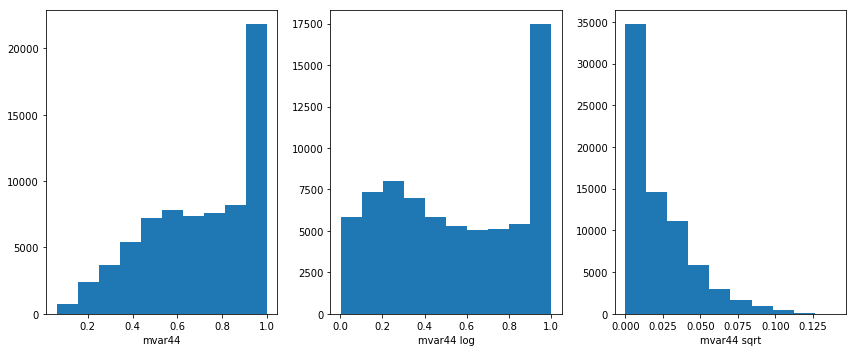

In [121]:
f="mvar44"

plt.figure(figsize=(12,5))
plt.subplot(1, 3, 1)
plt.hist(gameDf[f].dropna())
plt.xlabel(f)
#     plt.show()

plt.subplot(1, 3, 2)
plt.hist(np.power(gameDf[f].dropna(), 2))
plt.xlabel(f+" log")

plt.subplot(1, 3, 3)
plt.hist(np.log(np.power(gameDf[f].dropna(), -0.05)+1e-8 ))
plt.xlabel(f+" sqrt")

plt.tight_layout()
plt.show()

#     print(dic[i])

In [ ]:
#categorical variable analysis (mvar vs Default Indicator)

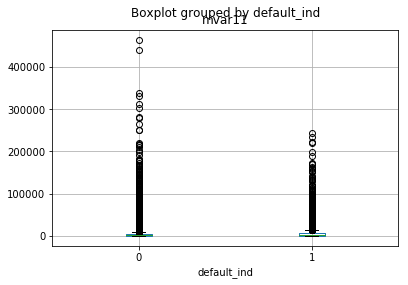

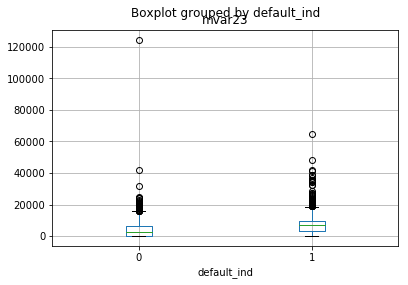

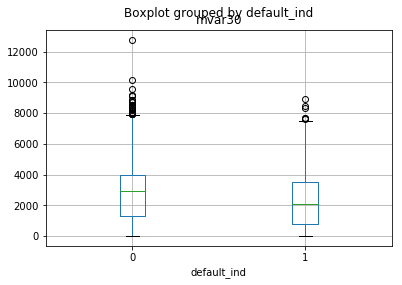

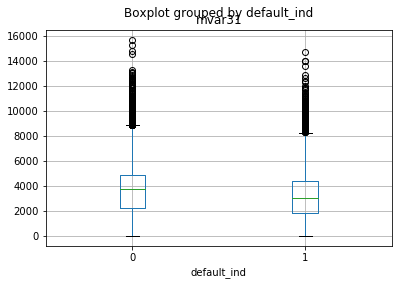

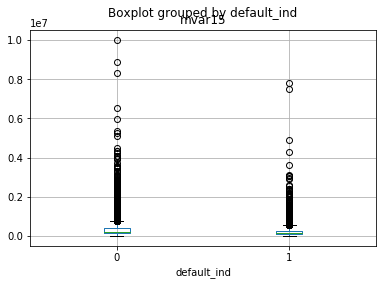

...

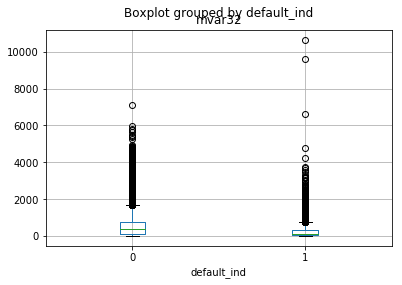

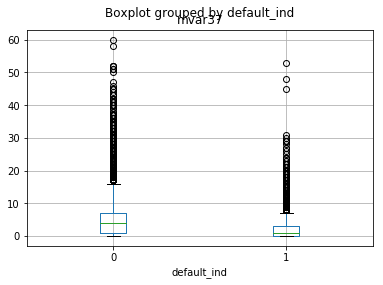

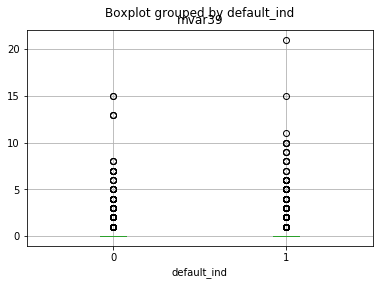

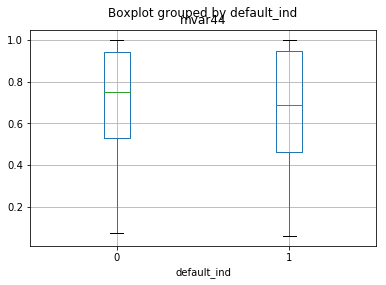

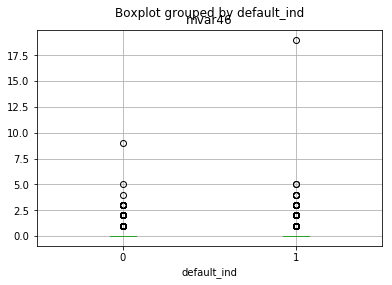

In [122]:
for i in [11, 23, 30, 31, 15, 35, 40, 41, 6, 8, 12, 13, 16, 17, 18, 21, 22, 24, 25, 26, 27, 32, 37, 39, 44, 46]:
    gameDf.boxplot(column = 'mvar'+str(i),by = 'default_ind')
    plt.show()